In [ ]:
FILTERS="-uniqueOnly 1 -remove_bads 1 -minMapQ 20 -minQ 25 \
-sb_pval 1e-5 -skipTriallelic 1 -minInd 80 -minIndDepth 3 -snp_pval 1e-3 -minMaf 0.01"
# output commands for most outputs
TODOvcf="-doMajorMinor 1 -doMaf 1 -doCounts 1 -doIBS 1 -doCov 1 -makeMatrix 1 -doGeno 9 \
-doPost 1 -doGlf 2 -dosnpstat 1"
# output commands for PCA friendly output
TODOpca="-doMajorMinor 1 -doMaf 1 -doCounts 1 -doGeno 32 -doPost 1 -dosnpstat 1"

TODOrelate="-doMajorMinor 1 -doMaf 1 -doCounts 1 -doPost 1 -doGlf 3 -dosnpstat 1"

angsd -b SSHCbams_filt_nreps -GL 1 $FILTERS $TODOvcf -P 1 -out ../ANGSD_run/HCSS_Afilt32m70_01

angsd -b SSHCbams_filt_nreps -GL 1 $FILTERS $TODOpca -P 1 -out ../ANGSD_run/HCSS_Afilt32m70_01pca 

angsd -b SSHCbams_filt_nreps -GL 1 $FILTERS $TODOrelate -P 1 -out ../ANGSD_run/HCSS_Afilt32m70_01relate


In [40]:
SUFFIX = 'HCSS_Afilt32m70_01'

In [2]:
pwd

/scratch/t.cri.ksilliman/CommonG_cp2/2019_Mapping/ANGSD_run/HCSS


In [3]:
module load gcc/6.2.0
module load ngstools
module load vcftools/0.1.15
module load qctool/2.0
module load htslib/1.7.36
module load ngsadmix/32
module load fastme/2.1.5
NGSTOOLS="/apps/software/gcc-6.2.0/ngstools"

## Make population file

In [21]:
# make ind2pop file
infile = "SSHCbams_filt_nreps"
outfile = "SSHCfiltNreps.ind2pop"
IN= open(infile,"r")
OUT = open(outfile,"w")

for line in IN:
    stuff = line.split(".")
    name = stuff[0]
    pop = name[0:2]
    OUT.write(name+"\t"+pop+"\n")
IN.close()
OUT.close()

## Make VCF file

In [1]:
# make ind2pop file
infile = "SSHCbams_filt_nreps"
outfile = "SSHCfiltNreps.ind"
IN= open(infile,"r")
OUT = open(outfile,"w")

OUT.write("ID\n0\n")
for line in IN:
    stuff = line.split(".")
    name = stuff[0]
    OUT.write(name+"\n")
IN.close()
OUT.close()

In [4]:
%expand

cp {SUFFIX}.geno.gz {SUFFIX}cp.geno.gz
gunzip {SUFFIX}cp.geno.gz
sed -i 's/\t/ /g' {SUFFIX}cp.geno
sed -i 's/.$//' {SUFFIX}cp.geno
sed -i 's/^/--- /' {SUFFIX}cp.geno
mv {SUFFIX}cp.geno {SUFFIX}.gen
qctool_v2.0-rc5 -g {SUFFIX}.gen -threshhold 0.501 -og {SUFFIX}_pp5.vcf -s SSHCfiltNreps.ind
qctool_v2.0-rc5 -g {SUFFIX}.gen -threshhold 0.75 -og {SUFFIX}_pp75.vcf -s SSHCfiltNreps.ind
qctool_v2.0-rc5 -g {SUFFIX}.gen -threshhold 0.9 -og {SUFFIX}_pp90.vcf -s SSHCfiltNreps.ind


Welcome to qctool
(version: 2.0-rc5, revision )

(C) 2009-2017 University of Oxford

Opening genotype files                                      : [******************************] (1/1,0.0s,99.7/s))

Input SAMPLE file(s):           "SSHCfiltNreps.ind"
Output SAMPLE file:             "(n/a)".
Sample exclusion output file:   "(n/a)".

Input GEN file(s):
           ThreshholdingSNPDataSource(chain:HCSS_Afilt32m70_01.gen)Output GEN file(s):             "HCSS_Afilt32m70_01_pp5.vcf"
Output SNP position file(s):    (n/a)
Sample filter:                  .
# of samples in input files:    114.
# of samples after filtering:   114 (0 filtered out).


VCFFormatSNPDataSink::write_header(): FORMAT entries are:
##FORMAT=<ID=GP,Type=Float,Number=G,Description="Genotype call probabilities">
##FORMAT=<ID=GT,Type=String,Number=1,Description="Genotype call probabilities, threshholded at 0.50">

Processing SNPs                                             :  (5269/?,1.5s,3611.4/s)
Total: 5269SNPs.

Number o

In [5]:
%expand
# fix contig naming in vcf
IN = open("{SUFFIX}_pp5.vcf","r")
OUT = open("{SUFFIX}_pp5_con.vcf","w")

for line in IN:
    if "#" not in line:
        stuff = line.split()
        contig = stuff[2].split(",")[0]
        ID = contig+":"+stuff[1]
        stuff[0] = contig
        stuff[2] = ID
        OUT.write('\t'.join(stuff)+"\n")
    else:
        OUT.write(line)

IN.close()
OUT.close()

# fix contig naming in vcf
IN = open("{SUFFIX}_pp75.vcf","r")
OUT = open("{SUFFIX}_pp75_con.vcf","w")

for line in IN:
    if "#" not in line:
        stuff = line.split()
        contig = stuff[2].split(",")[0]
        ID = contig+":"+stuff[1]
        stuff[0] = contig
        stuff[2] = ID
        OUT.write('\t'.join(stuff)+"\n")
    else:
        OUT.write(line)

IN.close()
OUT.close()

# fix contig naming in vcf
IN = open("{SUFFIX}_pp90.vcf","r")
OUT = open("{SUFFIX}_pp90_con.vcf","w")

for line in IN:
    if "#" not in line:
        stuff = line.split()
        contig = stuff[2].split(",")[0]
        ID = contig+":"+stuff[1]
        stuff[0] = contig
        stuff[2] = ID
        OUT.write('\t'.join(stuff)+"\n")
    else:
        OUT.write(line)

IN.close()
OUT.close()

In [6]:
%expand
rm {SUFFIX}_pp5.vcf
mv {SUFFIX}_pp5_con.vcf {SUFFIX}_pp5.vcf
rm {SUFFIX}_pp75.vcf
mv {SUFFIX}_pp75_con.vcf {SUFFIX}_pp75.vcf
rm {SUFFIX}_pp90.vcf
mv {SUFFIX}_pp90_con.vcf {SUFFIX}_pp90.vcf

In [7]:
%expand

vcftools --vcf {SUFFIX}_pp5.vcf --recode --recode-INFO-all \
--min-alleles 2 --max-alleles 2 \
--max-missing 0.75 \
--out {SUFFIX}_pp5_m75

vcftools --vcf {SUFFIX}_pp75.vcf --recode --recode-INFO-all \
--min-alleles 2 --max-alleles 2 \
--max-missing 0.75 \
--out {SUFFIX}_pp75_m75

vcftools --vcf {SUFFIX}_pp90.vcf --recode --recode-INFO-all \
--min-alleles 2 --max-alleles 2 \
--max-missing 0.75 \
--out {SUFFIX}_pp90_m75


VCFtools - 0.1.15
(C) Adam Auton and Anthony Marcketta 2009

Parameters as interpreted:
	--vcf HCSS_Afilt32m70_01_pp5.vcf
	--recode-INFO-all
	--max-alleles 2
	--min-alleles 2
	--max-missing 0.75
	--out HCSS_Afilt32m70_01_pp5_m75
	--recode

After filtering, kept 114 out of 114 Individuals
Outputting VCF file...
After filtering, kept 5264 out of a possible 5269 Sites
Run Time = 1.00 seconds

VCFtools - 0.1.15
(C) Adam Auton and Anthony Marcketta 2009

Parameters as interpreted:
	--vcf HCSS_Afilt32m70_01_pp75.vcf
	--recode-INFO-all
	--max-alleles 2
	--min-alleles 2
	--max-missing 0.75
	--out HCSS_Afilt32m70_01_pp75_m75
	--recode

After filtering, kept 114 out of 114 Individuals
Outputting VCF file...
After filtering, kept 5186 out of a possible 5269 Sites
Run Time = 0.00 seconds

VCFtools - 0.1.15
(C) Adam Auton and Anthony Marcketta 2009

Parameters as interpreted:
	--vcf HCSS_Afilt32m70_01_pp90.vcf
	--recode-INFO-all
	--max-alleles 2
	--min-alleles 2
	--max-missing 0.75
	--out HCSS_Afi

## Relatedness

In [30]:
%expand

# relatedness (must run ANGSD with option '-doGlf 3' to make this work)
# (column "rab" in the result is relatedness coefficient, Fa and Fb are individual inbreeding coefficients):
zcat {SUFFIX}relate.mafs.gz | cut -f5 |sed 1d >freq
NIND=`cat SSHCbams_filt_nreps | wc -l`
ngsRelate -f freq -g {SUFFIX}relate.glf.gz -n $NIND -z SSHCbams_filt_nreps -O {SUFFIX}.relatedness


	-> Number of file names read:114
	-> Seed is: 1220579229
	-> Frequency file: 'freq' contain 5269 number of sites
	-> nind:114 overall_number_of_sites:5269
	-> Done reading data from file: 0.12 0.00
	-> Starting analysis now
	-> length of joblist:6441
	[ALL done] cpu-time used =  156.24 sec (filereading took: 0.12 sec)
	[ALL done] walltime used =  39.00 sec (filereading took: 0.00 sec)


### Relatedness for MACAU

In [31]:
%expand
mbd = ["HC1-2B-L5","HC1-4","HC2-15A-L5","HC2-17B","HC3-1","HC3-5-L5B","HC3-7","HC3-10","HC3-11",
        "SS2-9-L5","SS2-14-L5","SS2-18-L5","SS3-3","SS3-14","SS3-15","SS3-16","SS3-20","SS5-18"]

IN = open("{SUFFIX}.relatedness","r")
OUT = open("{SUFFIX}_mbd.relatedness","w")

OUT.write(next(IN))
for line in IN:
    stuff = line.split()
    id1 = stuff[2].split(".")[0]
    id2 = stuff[3].split(".")[0]
    if id1 in mbd and id2 in mbd:
        OUT.write(line)

IN.close()
OUT.close()

In [17]:
%expand
grep "HC3-10" {SUFFIX}_mbd.relatedness | cut -f 3,4,5,15,16,17
wc -l {SUFFIX}_mbd.relatedness

HC1-2B-L5.trim.bt2.bam	HC3-10.trim.bt2.bam	3563	0.096852	0.117574	0.000000
HC1-4.trim.bt2.bam	HC3-10.trim.bt2.bam	3554	0.000051	0.026465	0.000000
HC2-15A-L5.trim.bt2.bam	HC3-10.trim.bt2.bam	3694	0.215806	0.000000	0.000000
HC2-17B.trim.bt2.bam	HC3-10.trim.bt2.bam	3565	0.003049	0.139688	0.000000
HC3-1.trim.bt2.bam	HC3-10.trim.bt2.bam	3553	0.000008	0.077142	0.000000
HC3-10.trim.bt2.bam	HC3-11.trim.bt2.bam	3523	0.000844	0.000003	0.171704
HC3-10.trim.bt2.bam	HC3-5-L5B.trim.bt2.bam	3505	0.098489	0.000000	0.094646
HC3-10.trim.bt2.bam	HC3-7.trim.bt2.bam	3534	0.000041	0.000000	0.103892
HC3-10.trim.bt2.bam	SS2-14-L5.trim.bt2.bam	3519	0.000003	0.000000	0.104593
HC3-10.trim.bt2.bam	SS2-18-L5.trim.bt2.bam	3678	0.000015	0.000000	0.000000
HC3-10.trim.bt2.bam	SS2-9-L5.trim.bt2.bam	3560	0.000003	0.000000	0.095320
HC3-10.trim.bt2.bam	SS3-14.trim.bt2.bam	3568	0.000000	0.000000	0.028190
HC3-10.trim.bt2.bam	SS3-15.trim.bt2.bam	3596	0.059391	0.000000	0.076993
HC3-10.trim.bt2.bam	SS3-16.trim.bt2.bam	3527	0.0

In [32]:
%expand
library(spaa)
df = read.table("{SUFFIX}_mbd.relatedness",header = T)
dfrab <- df[,c("ida","idb","rab")]
distrab <- as.matrix(list2dist(dfrab))

mbdnames = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_10","hc3_11","hc3_5","hc3_7",
        "ss2_14","ss2_18","ss2_9","ss3_14","ss3_15","ss3_16","ss3_20","ss3_3","ss5_18")

mbdorder = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_5","hc3_7","hc3_10","hc3_11",
        "ss2_9","ss2_14","ss2_18","ss3_3","ss3_14","ss3_15","ss3_16","ss3_20","ss5_18")

colnames(distrab) <- mbdnames
rownames(distrab) <- mbdnames
distrab <- distrab[mbdorder,mbdorder]
distrab
write.table(distrab,file="HCSSmbdsamples_rab.txt", col.names = F, row.names = F, sep = "\t")

,hc1_2,hc1_4,hc2_15,hc2_17,hc3_1,hc3_5,hc3_7,hc3_10,hc3_11,ss2_9,ss2_14,ss2_18,ss3_3,ss3_14,ss3_15,ss3_16,ss3_20,ss5_18
hc1_2,0.000000,0.001012,0.024934,0.010583,0.005485,0.469927,0.000008,0.096849,0.018067,0.000000,0.000000,0.000004,0.000000,0.000000,0.000000,0.000000,0.000001,0.000000
hc1_4,0.001012,0.000000,0.132775,0.281727,0.178630,0.023207,0.303820,0.000022,0.045449,0.000005,0.000001,0.000003,0.000001,0.000000,0.000000,0.000000,0.004360,0.000002
hc2_15,0.024934,0.132775,0.000000,0.091522,0.105287,0.010846,0.202777,0.215808,0.000063,0.000043,0.000001,0.019309,0.000019,0.000011,0.000001,0.000050,0.032588,0.000001
hc2_17,0.010583,0.281727,0.091522,0.000000,0.178815,0.028365,0.269209,0.002958,0.014182,0.000000,0.000001,0.000007,0.000000,0.000002,0.000000,0.000001,0.000000,0.000000
hc3_1,0.005485,0.178630,0.105287,0.178815,0.000000,0.000013,0.505421,0.000000,0.052670,0.000008,0.000000,0.000002,0.000000,0.000001,0.000000,0.000001,0.000001,0.000000
hc3_5,0.469927,0.023207,0.010846,0.028365,0.000013,0.000000,0.000008,0.098506,0.017887,0.000000,0.000000,0.000001,0.000000,0.000001,0.000001,0.000001,0.000000,0.000000
hc3_7,0.000008,0.303820,0.202777,0.269209,0.505421,0.000008,0.000000,0.000003,0.019617,0.000004,0.000000,0.000001,0.000001,0.000002,0.000000,0.000000,0.000000,0.000000
hc3_10,0.096849,0.000022,0.215808,0.002958,0.000000,0.098506,0.000003,0.000000,0.001493,0.000000,0.000001,0.000017,0.001741,0.000000,0.059200,0.000003,0.000185,0.000014
hc3_11,0.018067,0.045449,0.000063,0.014182,0.052670,0.017887,0.019617,0.001493,0.000000,0.000000,0.000000,0.000028,0.000001,0.000003,0.000000,0.000001,0.000000,0.000000
ss2_9,0.000000,0.000005,0.000043,0.000000,0.000008,0.000000,0.000004,0.000000,0.000000,0.000000,0.342654,0.251279,0.286739,0.231220,0.000001,0.235655,0.012028,0.188717


## NgsAdmix 

In [22]:
%expand [ ]

mkdir Admix

for K in `seq 1 5` ;
do NGSadmix -likes [SUFFIX].beagle.gz -K $K -P 10 -o Admix/[SUFFIX]_${K};
done

	-> Dumping file: Admix/HCSS_Afilt32m70_01_1.log
	-> Dumping file: Admix/HCSS_Afilt32m70_01_1.filter
Input: lname=HCSS_Afilt32m70_01.beagle.gz nPop=1, fname=(null) qname=(null) outfiles=Admix/HCSS_Afilt32m70_01_1
Setup: seed=1564766752 nThreads=10 method=1
Convergence: maxIter=2000 tol=0.000010 tolLike50=0.100000 dymBound=0
Filters: misTol=0.050000 minMaf=0.050000 minLrt=0.000000 minInd=0
Input file has dim: nsites=5269 nind=114
Input file has dim (AFTER filtering): nsites=3724 nind=114
iter[start] like is=743633.475751
EM accelerated Thread has reached convergence with tol 0.000010
best like=-325600.118105 after 4 iterations
	-> Dumping file: Admix/HCSS_Afilt32m70_01_1.qopt
	-> Dumping file: Admix/HCSS_Afilt32m70_01_1.fopt.gz
	[ALL done] cpu-time used =  0.53 sec
	[ALL done] walltime used =  0.00 sec
	-> Dumping file: Admix/HCSS_Afilt32m70_01_2.log
	-> Dumping file: Admix/HCSS_Afilt32m70_01_2.filter
Input: lname=HCSS_Afilt32m70_01.beagle.gz nPop=2, fname=(null) qname=(null) outfiles=A

,V1,V2,ind,pop
HC1-11,0.170499489,0.8295005,HC1-11,HC
HC1-12,0.000000001,1.0000000,HC1-12,HC
HC1-13,0.000000001,1.0000000,HC1-13,HC
HC1-14-L5,0.079800088,0.9201999,HC1-14-L5,HC
HC1-15,0.149893569,0.8501064,HC1-15,HC


Loading required package: colorspace
Loading required package: RColorBrewer
Warning message in brewer.pal(npops, "Set1"):
"minimal value for n is 3, returning requested palette with 3 different levels
"

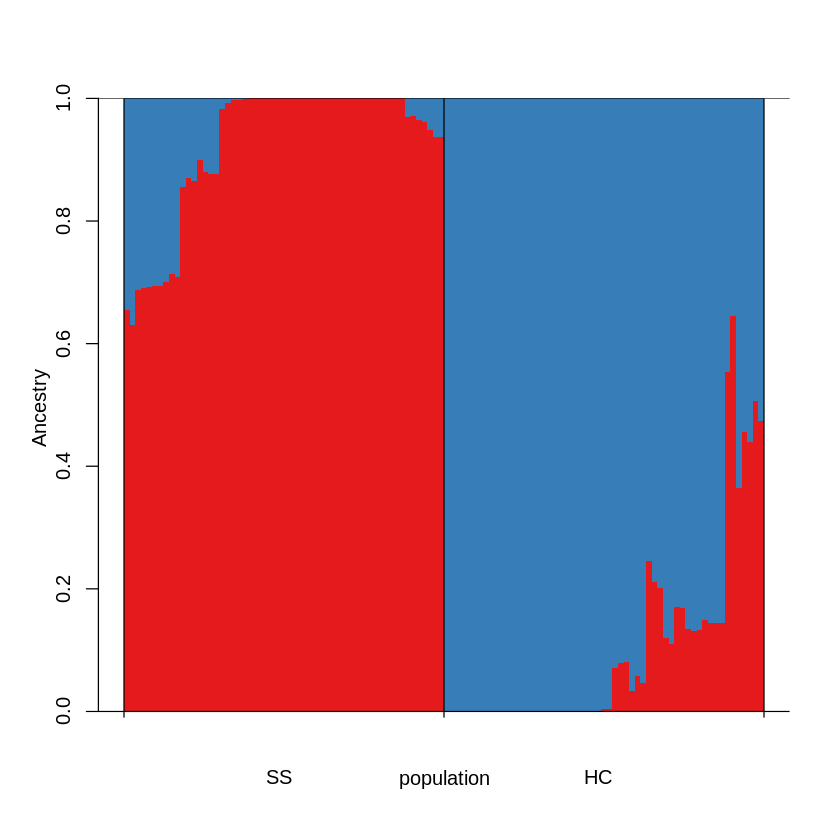

In [26]:
%expand
# primitive look at admixture data:
# tbl=read.table("rads.2.Q")
# barplot(t(as.matrix(tbl)), col=rainbow(5),xlab="Individual #", ylab="Ancestry", border=NA)

#-----------------
# prettier:

# assembling the input table
dir="./Admix/" # path to input files
inName="{SUFFIX}_2.qopt" # name of the input file to plot, output of ngsAdmix or ADMIXTURE run
npops=2
pops="SSHCfiltNreps.ind2pop" # 2-column tab-delimited table of individual assignments to populations; must be in the same order as samples in the bam list or vcf file.
tbl=read.table(paste(dir,inName,sep=""),header=F)
i2p=read.table(paste(dir,pops,sep=""),header=F)
names(i2p)=c("ind","pop")
tbl=cbind(tbl,i2p)
row.names(tbl)=tbl$ind

head(tbl,5) # this is how the resulting dataset must look

source("../../../2bRAD_denovo/plot_admixture_v4_function.R")

# putting populaitons in desired order (edit pop names as needed or skip to plot them alphabetically)
tbl$pop=factor(tbl$pop,levels=c("SS","HC"))

ords=plotAdmixture(data=tbl,npops=npops,angle=0,vshift=0,hshift=0)


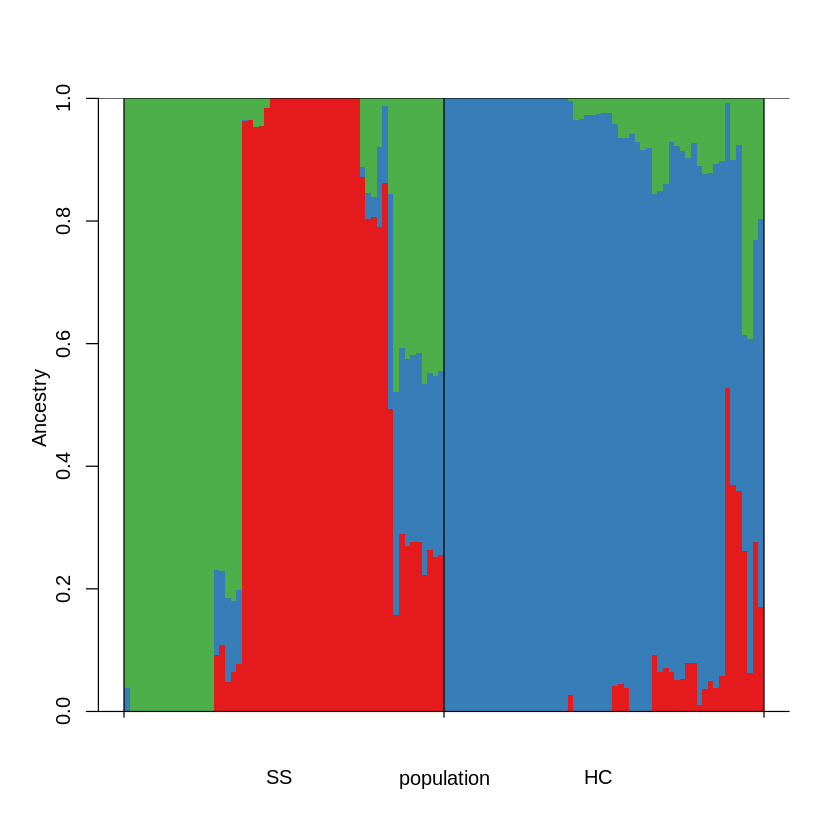

In [27]:
%expand
# primitive look at admixture data:
# tbl=read.table("rads.2.Q")
# barplot(t(as.matrix(tbl)), col=rainbow(5),xlab="Individual #", ylab="Ancestry", border=NA)

#-----------------
# prettier:

# assembling the input table
dir="./Admix/" # path to input files
inName="{SUFFIX}_3.qopt" # name of the input file to plot, output of ngsAdmix or ADMIXTURE run
npops=3
pops="SSHCfiltNreps.ind2pop" # 2-column tab-delimited table of individual assignments to populations; must be in the same order as samples in the bam list or vcf file.
tbl=read.table(paste(dir,inName,sep=""),header=F)
i2p=read.table(paste(dir,pops,sep=""),header=F)
names(i2p)=c("ind","pop")
tbl=cbind(tbl,i2p)
row.names(tbl)=tbl$ind

source("../../../2bRAD_denovo/plot_admixture_v4_function.R")

# putting populaitons in desired order (edit pop names as needed or skip to plot them alphabetically)
tbl$pop=factor(tbl$pop,levels=c("SS","HC"))

ords=plotAdmixture(data=tbl,npops=npops,angle=0,vshift=0,hshift=0)

## Genetic Distances

In [33]:
%expand

mkdir Results
NIND=`cat SSHCbams_filt_nreps | wc -l`
NSITES=`zcat {SUFFIX}.mafs.gz | tail -n+2 | wc -l`
ngsDist -verbose 1 -geno {SUFFIX}relate.geno.gz -probs -n_ind $NIND -n_sites $NSITES -labels SSHCfiltNreps.ind2pop -o Results/{SUFFIX}.dist -n_threads 8 
head Results/{SUFFIX}.dist

mkdir: cannot create directory `Results': File exists
==> Input Arguments:
	geno: HCSS_Afilt32m70_01relate.geno.gz
	probs: true
	log_scale: false
	n_ind: 114
	n_sites: 5269
	tot_sites: 0
	labels: SSHCfiltNreps.ind2pop (WITHOUT header)
	call_geno: false
	N_thresh: 0.000000
	call_thresh: 0.000000
	pairwise_del: false
	avg_nuc_dist: false
	geno_indep: false
	n_boot_rep: 0
	boot_block_size: 1
	out: Results/HCSS_Afilt32m70_01.dist
	n_threads: 8
	version: false
	verbose: 1
	seed: 1564768358

==> Analysis will be run in 6441 combinations
==> GZIP input file (never BINARY)
==> Reading labels
==> Reading genotype data
==> Analyzing full dataset...
==> Freeing memory...
Done!

114
HC1-11	0.0000000000	0.2202145291	0.2085823468	0.2190188544	0.1089129551	0.1304326489	0.2257901914	0.2170406541	0.2172036299	0.2213345655	0.2109273935	0.2161100046	0.2193427776	0.2246773265	0.2128498063	0.2202992339	0.2186809182	0.2133651894	0.2247884782	0.2258824167	0.2207885918	0.2169592685	0.2258850624	0.2189896903	0

HC1-19	0.2257901914	0.2218940352	0.2272040855	0.2197414323	0.2271882216	0.2195641183	0.0000000000	0.2186858244	0.2208499673	0.2155870036	0.2094445018	0.2233696667	0.2232066859	0.2304749928	0.2133512254	0.2223697131	0.2291790124	0.2026322994	0.2215532369	0.2287334484	0.2206342564	0.2147558114	0.2293680738	0.2224934753	0.2264378362	0.2289074229	0.2240821344	0.2155705038	0.2309349856	0.2224516772	0.2171440007	0.2233268052	0.2209927371	0.2214885705	0.2212269918	0.2175923503	0.2187126791	0.2148456228	0.2261141212	0.2190276880	0.2150256882	0.2246236525	0.2255773391	0.2148554999	0.2201969076	0.2259332050	0.2235459416	0.2221898463	0.2220740504	0.2202087494	0.2260197699	0.2172957428	0.2192923755	0.2223855848	0.2167207756	0.2173164090	0.2122109484	0.2190805488	0.2073900738	0.2202527351	0.2082723423	0.2057332945	0.2187772252	0.2173470768	0.1957697255	0.2200233094	0.2124164190	0.2216843361	0.2182077644	0.2084581455	0.2059528582	0.2110976923	0.2175860546	0.2130252538	0.2213989727	0.2139759359	0.212

In [36]:
%expand

fastme -D 1 -i Results/{SUFFIX}.dist -o Results/{SUFFIX}.tree -m b -n b


 . This analysis will run on 10 threads.

#  Analysing dataset 1

 . Warning: Triangular inequality violation.

 . You may ask for triangular inequality correction using the '-q' option.

 . Computing tree...

 . Performing NNI...

 . Warning: 
	Explained variance = 0.889 (<0.90).
	Check your input data.

 . Time used 0h00m00s



Attaching package: 'phangorn'

The following object is masked from 'package:colorspace':

    coords



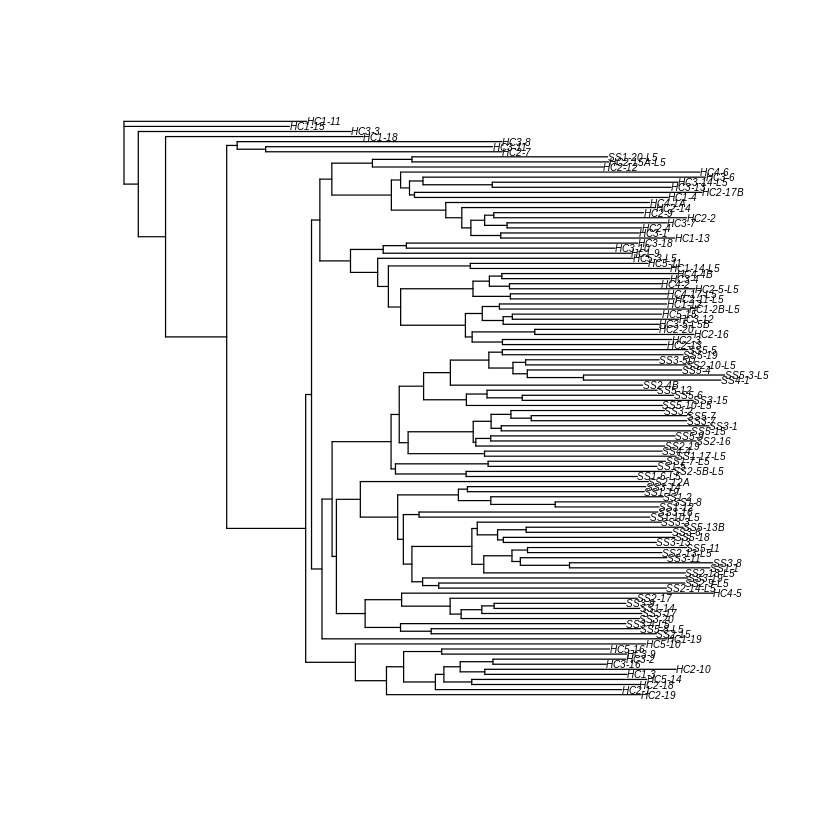

In [37]:
%expand 
library(ape)
library(phangorn)

#pdf(file=fout)

plot(read.tree("Results/{SUFFIX}.tree"), cex=0.5)

### MDS

In [75]:
library(methods)
library(optparse)
library(ggplot2)

In [40]:
%expand

NIND=`cat SSHCbams_filt_nreps | wc -l`
tail -n +3 Results/{SUFFIX}.dist | head -n $NIND | Rscript --vanilla --slave $NGSTOOLS/Scripts/getMDS.R --no_header --data_symm -n 4 -m "mds" -o Results/{SUFFIX}.mds

# Input file: stdin
# Has input file a header: FALSE
# Is input matrix symmetric?: TRUE
# Method: mds
# Number components to calculate: 4
# Reference samples:
# Projection samples:
# Excluded samples:
# Type of data: general
# Missing data char: NA
# Out file: Results/HCSS_Afilt32m70_01.mds


In [5]:
echo -e "Ind\tCLUSTER" > SSHCfiltNreps.ind2pop.mds
cat SSHCfiltNreps.ind2pop >> SSHCfiltNreps.ind2pop.mds

In [ ]:
pwd

In [6]:
%expand

Rscript $NGSTOOLS/Scripts/plotMDS.R -i Results/{SUFFIX}.mds -c 1-2 -a SSHCfiltNreps.ind2pop.mds -o Results/{SUFFIX}_12.mds.pdf


Saving 7 x 7 in image


In [7]:
%expand
pdftoppm -jpeg Results/{SUFFIX}_12.mds.pdf Results/{SUFFIX}_12.mds

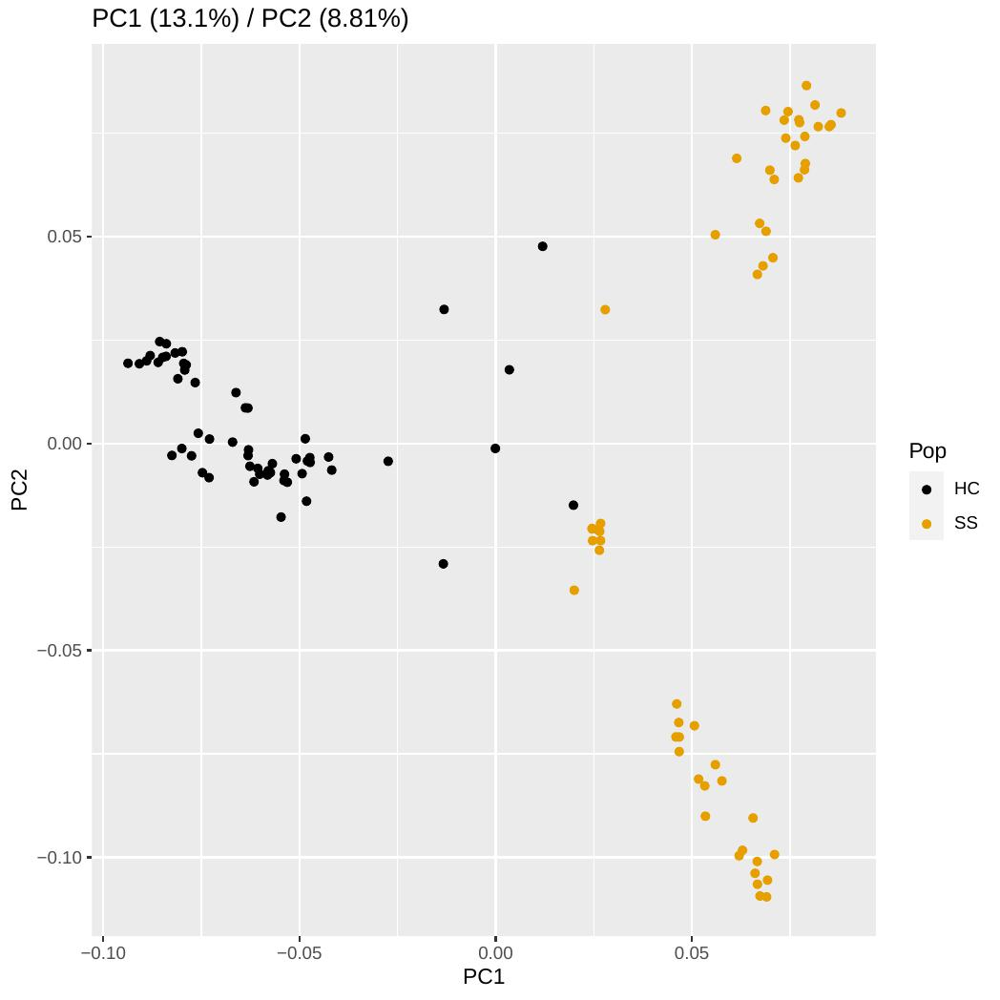

In [8]:
%expand
from IPython.display import Image

fig = Image(filename=('Results/{SUFFIX}_12.mds-1.jpg'))
fig

### Just mbd samples

In [56]:
%expand
dist.mat <- read.table("Results/{SUFFIX}.dist", header= F, row.names = 1, skip = 2)
colnames(dist.mat) <- rownames(dist.mat)
mbdnames = c("HC1-2B-L5","HC1-4","HC2-15A-L5","HC2-17B","HC3-1","HC3-5-L5B","HC3-7","HC3-10","HC3-11",
        "SS2-9-L5","SS2-14-L5","SS2-18-L5","SS3-3","SS3-14","SS3-15","SS3-16","SS3-20","SS5-18")
mbd <- dist.mat[mbdnames,mbdnames]

mbdorder = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_5","hc3_7","hc3_10","hc3_11",
        "ss2_9","ss2_14","ss2_18","ss3_3","ss3_14","ss3_15","ss3_16","ss3_20","ss5_18")
colnames(mbd) <- mbdorder
rownames(mbd) <- mbdorder
mbd
write.table(mbd, file = "Results/{SUFFIX}_mbd.dist", row.names = T, col.names = T, quote = F, sep="\t")
line="18"
tmp <- "Results/{SUFFIX}_mbdinput.dist"
cat(line, "\n", file = tmp) 
write.table(mbd, file = tmp, append = TRUE, row.names = T, col.names=F,quote = F, sep = "\t")

,hc1_2,hc1_4,hc2_15,hc2_17,hc3_1,hc3_5,hc3_7,hc3_10,hc3_11,ss2_9,ss2_14,ss2_18,ss3_3,ss3_14,ss3_15,ss3_16,ss3_20,ss5_18
hc1_2,0.0000000,0.2155436,0.2054988,0.2245761,0.2140475,0.1251035,0.2137833,0.1941731,0.2196581,0.2191748,0.2201363,0.2251679,0.2293540,0.2303018,0.2273960,0.2267536,0.2241723,0.2393679
hc1_4,0.2155436,0.0000000,0.1844240,0.1693271,0.1811331,0.2071129,0.1608409,0.2090009,0.2157563,0.2186305,0.2188330,0.2146309,0.2291905,0.2247412,0.2257357,0.2190871,0.2157204,0.2274161
hc2_15,0.2054988,0.1844240,0.0000000,0.2041950,0.1854690,0.2021604,0.1823913,0.1592689,0.2168135,0.2041132,0.2085476,0.1910094,0.2042863,0.2045106,0.2061360,0.2040459,0.2013346,0.2098602
hc2_17,0.2245761,0.1693271,0.2041950,0.0000000,0.1884048,0.2163634,0.1724402,0.2179260,0.2265039,0.2268210,0.2268209,0.2283067,0.2379735,0.2322090,0.2385235,0.2269364,0.2294361,0.2372695
hc3_1,0.2140475,0.1811331,0.1854690,0.1884048,0.0000000,0.2084380,0.1141350,0.2070880,0.2092909,0.2195993,0.2160866,0.2155464,0.2254828,0.2196778,0.2258590,0.2205749,0.2200920,0.2156870
hc3_5,0.1251035,0.2071129,0.2021604,0.2163634,0.2084380,0.0000000,0.2104185,0.1869989,0.2143060,0.2202222,0.2148287,0.2214425,0.2216537,0.2194587,0.2223524,0.2192765,0.2221298,0.2263948
hc3_7,0.2137833,0.1608409,0.1823913,0.1724402,0.1141350,0.2104185,0.0000000,0.2098760,0.2154145,0.2211945,0.2233552,0.2236631,0.2265407,0.2248371,0.2269251,0.2224353,0.2260581,0.2286600
hc3_10,0.1941731,0.2090009,0.1592689,0.2179260,0.2070880,0.1869989,0.2098760,0.0000000,0.2158190,0.2072541,0.2123815,0.2048036,0.2057382,0.2078799,0.1916720,0.2139469,0.2081097,0.2118349
hc3_11,0.2196581,0.2157563,0.2168135,0.2265039,0.2092909,0.2143060,0.2154145,0.2158190,0.0000000,0.2204729,0.2206785,0.2201360,0.2362094,0.2252514,0.2307265,0.2282604,0.2200907,0.2270442
ss2_9,0.2191748,0.2186305,0.2041132,0.2268210,0.2195993,0.2202222,0.2211945,0.2072541,0.2204729,0.0000000,0.1482022,0.1643140,0.1565610,0.1642693,0.2091080,0.1664055,0.2066793,0.1738464


In [57]:
%expand
module load gcc/6.2.0
module load fastme/2.1.5

fastme -D 1 -i Results/{SUFFIX}_mbdinput.dist -o Results/{SUFFIX}_mbd.tree -m b -n b


 . This analysis will run on 10 threads.

#  Analysing dataset 1

 . Warning: Triangular inequality violation.

 . You may ask for triangular inequality correction using the '-q' option.

 . Computing tree...

 . Performing NNI...

 . Time used 0h00m00s


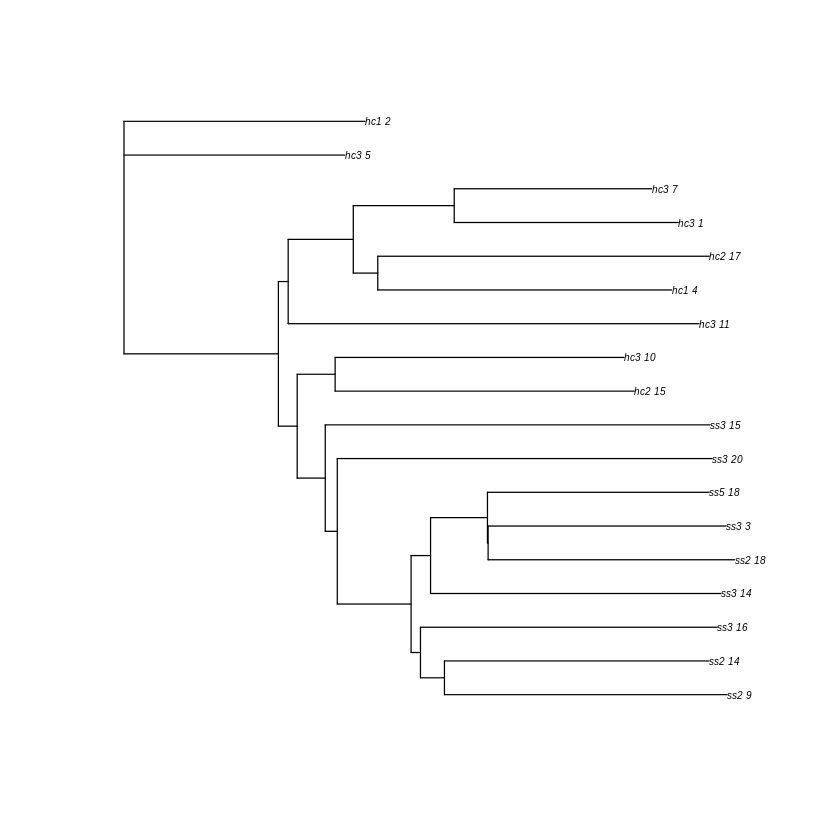

In [58]:
%expand 
library(ape)
library(phangorn)

#pdf(file=fout)

plot(read.tree("Results/{SUFFIX}_mbd.tree"), cex=0.5)

### MDS

In [12]:
echo -e "Ind\tCLUSTER" > mbd.ind2pop.mds
cat mbd.ind2pop >> mbd.ind2pop.mds

In [10]:
%expand

tail -n +2 Results/{SUFFIX}_mbd.dist | head -n 18 | Rscript --vanilla --slave $NGSTOOLS/Scripts/getMDS.R --no_header --data_symm -n 4 -m "mds" -o Results/{SUFFIX}_mbd.mds

# Input file: stdin
# Has input file a header: FALSE
# Is input matrix symmetric?: TRUE
# Method: mds
# Number components to calculate: 4
# Reference samples:
# Projection samples:
# Excluded samples:
# Type of data: general
# Missing data char: NA
# Out file: Results/HCSS_Afilt32m70_01_mbd.mds


In [14]:
%expand

Rscript $NGSTOOLS/Scripts/plotMDS.R -i Results/{SUFFIX}_mbd.mds -c 1-2 -a mbd.ind2pop.mds -o Results/{SUFFIX}_mbd12.mds.pdf


Saving 7 x 7 in image


In [15]:
%expand
pdftoppm -jpeg Results/{SUFFIX}_mbd12.mds.pdf Results/{SUFFIX}_mbd12.mds

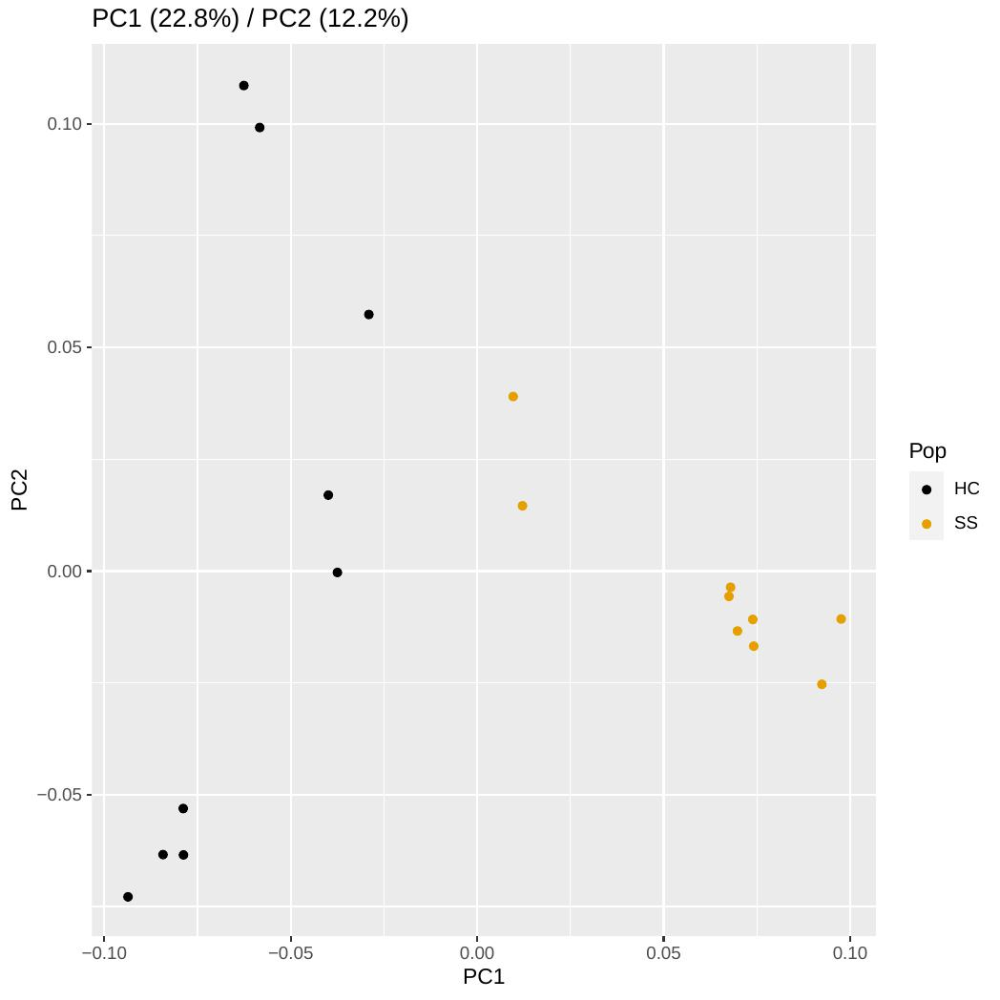

In [18]:
%expand
from IPython.display import Image

fig = Image(filename=('Results/{SUFFIX}_mbd12.mds-1.jpg'))
fig

## PCA of MBD samples

In [77]:
library(vegan)
library(adegenet)
bams=as.character(read.table("SSHCbams_filt_nreps")[,1]) # list of bam files
bams <- sapply(strsplit(bams,"[.]"), `[`, 1)
head(bams)
goods=c(1:length(bams))

# reading MBD samples
mbdnames = c("HC1-2B-L5","HC1-4","HC2-15A-L5","HC2-17B","HC3-1","HC3-5-L5B","HC3-7","HC3-10","HC3-11",
        "SS2-9-L5","SS2-14-L5","SS2-18-L5","SS3-3","SS3-14","SS3-15","SS3-16","SS3-20","SS5-18")
goods=which((bams %in% mbdnames))

# loading individual to population correspondences
i2p=read.table("SSHCfiltNreps.ind2pop",sep="\t") # 2-column tab-delimited table of individual assignments to populations; must be in the same order as samples in the bam list or vcf file.
row.names(i2p)=i2p[,1]
i2p=i2p[goods,]
pop=i2p[,2]

# settign up colors for plotting
palette(c("#000000", "#E69F00"))
#palette(rainbow(length(unique(site))))
colors=as.numeric(as.factor(pop))
colpops=as.numeric(as.factor(sort(unique(pop))))

[1] "HC1-11"    "HC1-12"    "HC1-13"    "HC1-14-L5" "HC1-15"    "HC1-18"

### PCoA on covMat


Call:
adonis(formula = as.dist(1 - cov2cor(co)) ~ pop, data = conds) 

Permutation: free
Number of permutations: 999

Terms added sequentially (first to last)

          Df SumsOfSqs MeanSqs F.Model      R2 Pr(>F)    
pop        1    1.0758  1.0758  2.2822 0.12483  0.001 ***
Residuals 16    7.5424  0.4714         0.87517           
Total     17    8.6182                 1.00000           
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Warning message in quartz():
"Quartz device is not available on this platform"

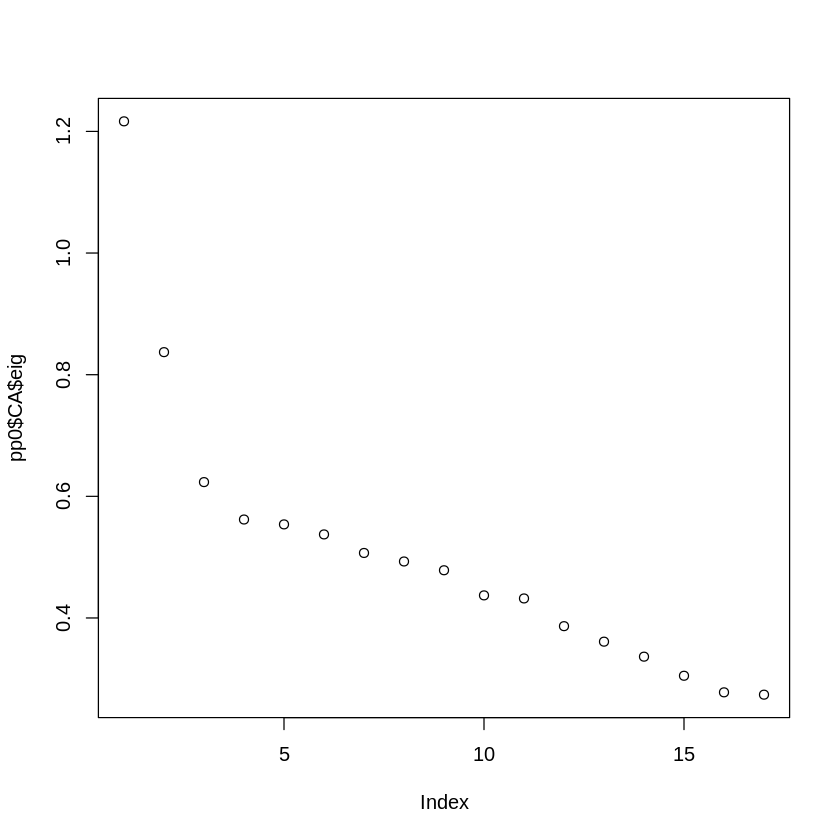

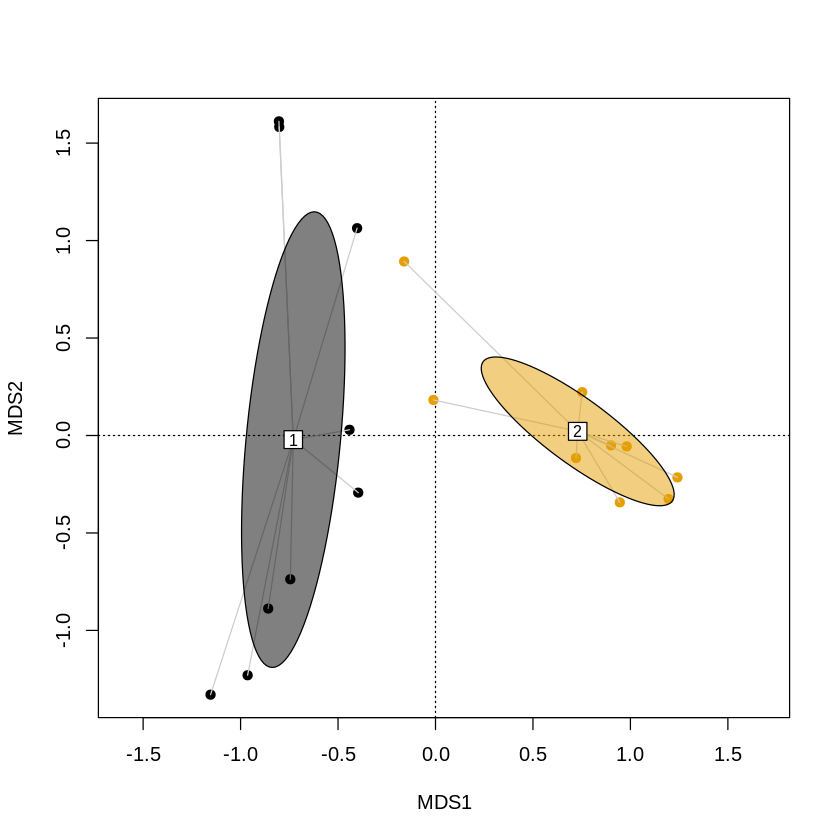

In [78]:
%expand
library(vegan)
# choose either of the following two covarince matrices:
co = as.matrix(read.table("{SUFFIX}.covMat")) # covariance based on single-read resampling
co =co[goods,goods]
dimnames(co)=list(bams[goods],bams[goods])

# PCoA and CAP (constranied analysis of proximities)  
conds=data.frame(cbind(pop))
pp0=capscale(as.dist(1-cov2cor(co))~1) # PCoA
pp=capscale(as.dist(1-cov2cor(co))~pop,conds) # CAP

# significance of by-site divergence, based on 1-correlation as distance
adonis(as.dist(1-cov2cor(co))~pop,conds)

# eigenvectors: how many are interesting?
plot(pp0$CA$eig) 

axes2plot=c(1,2)  
quartz()
cc=pp0
plot(cc,choices=axes2plot,type="n") # choices - axes to display
points(cc,choices=axes2plot,pch=19,col=colors)
#ordihull(cmd,choices= axes2plot,groups= conds$grp,draw="polygon",col=1+as.numeric(unique(as.factor(conds$grp))),label=T)
ordispider(cc,choices= axes2plot,groups=conds$pop,col="grey80")
ordiellipse(cc,choices= axes2plot,groups= conds$pop,draw="polygon",col=colpops,label=T)

### PCA on covMat

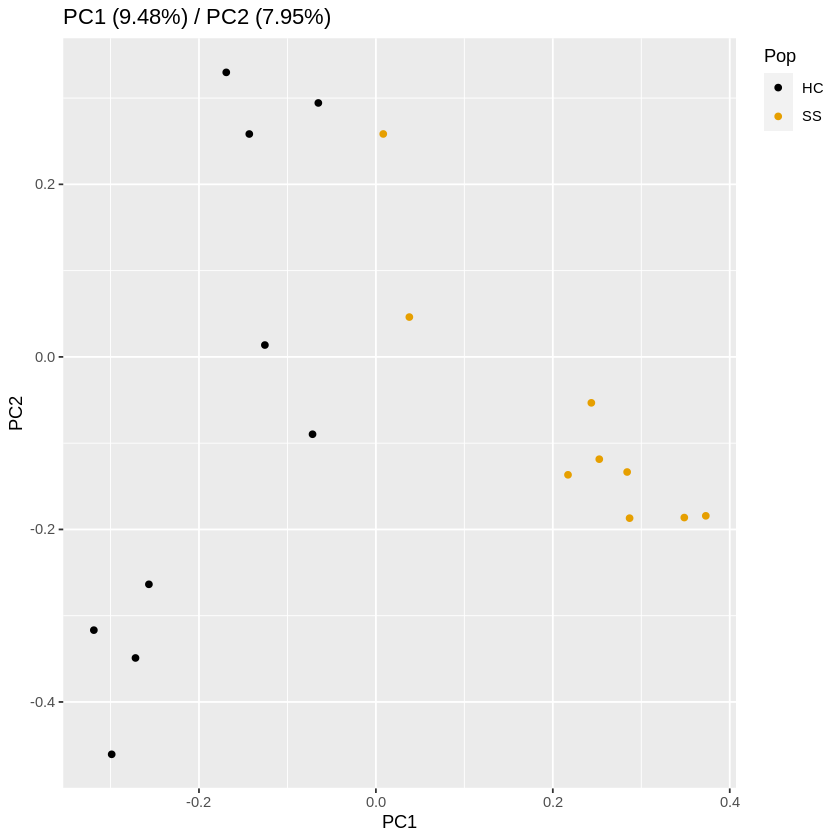

In [83]:
comp <- as.numeric(strsplit("1-2", "-", fixed=TRUE)[[1]])
eig <- eigen(co, symm=TRUE);
eig$val <- eig$val/sum(eig$val);

PC <- as.data.frame(eig$vectors)
colnames(PC) <- gsub("V", "PC", colnames(PC))
PC$Pop <- factor(site)

title <- paste("PC",comp[1]," (",signif(eig$val[comp[1]], digits=3)*100,"%)"," / PC",comp[2]," (",signif(eig$val[comp[2]], digits=3)*100,"%)",sep="",collapse="")

x_axis = paste("PC",comp[1],sep="")
y_axis = paste("PC",comp[2],sep="")

ggplot() + geom_point(data=PC, aes_string(x=x_axis, y=y_axis, color="Pop")) + stat_ellipse() +
ggtitle(title) + scale_colour_manual(values=cbPalette) +
theme(legend.position = "right", legend.justification = c("right", "top")) 


In [86]:
rownames(PC) <- rownames(co)

In [87]:
%expand
write.table(PC,file = "Results/{SUFFIX}pca_covMat.tsv",col.names = T,sep="\t",quote=F)

### PCA using IBS (Matz version)

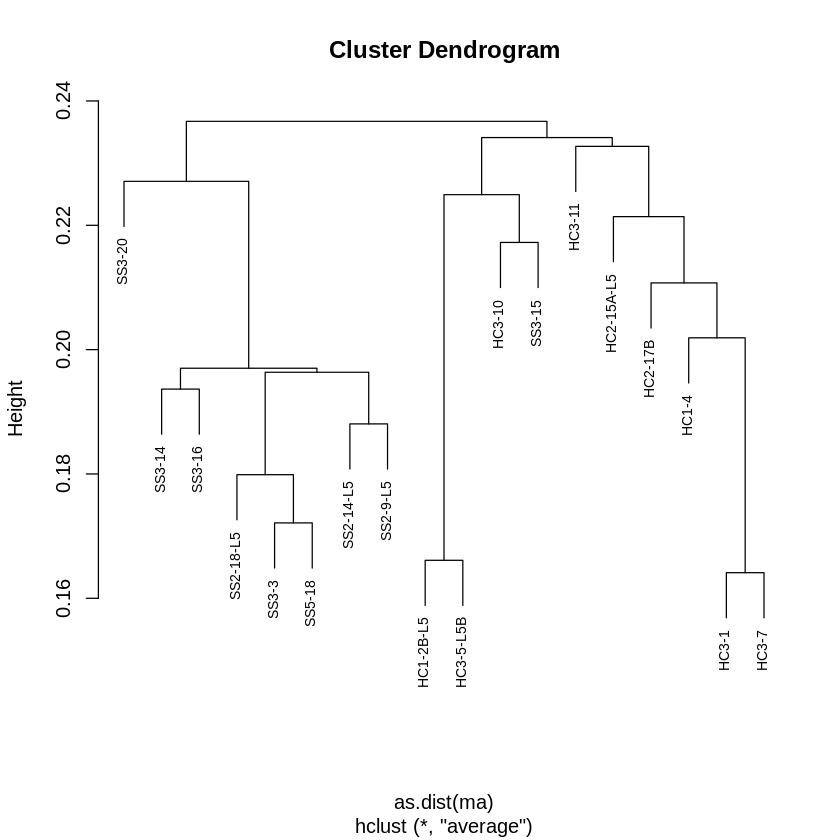

In [88]:
%expand
ma = as.matrix(read.table("{SUFFIX}.ibsMat"))
ma=ma[goods,goods]
dimnames(ma)=list(bams[goods],bams[goods])
hc=hclust(as.dist(ma),"ave")
plot(hc,cex=0.7)


Call:
adonis(formula = ma ~ pop, data = conds) 

Permutation: free
Number of permutations: 999

Terms added sequentially (first to last)

          Df SumsOfSqs  MeanSqs F.Model      R2 Pr(>F)    
pop        1   0.06564 0.065637  2.7975 0.14882  0.001 ***
Residuals 16   0.37541 0.023463         0.85118           
Total     17   0.44105                  1.00000           
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Warning message in quartz():
"Quartz device is not available on this platform"

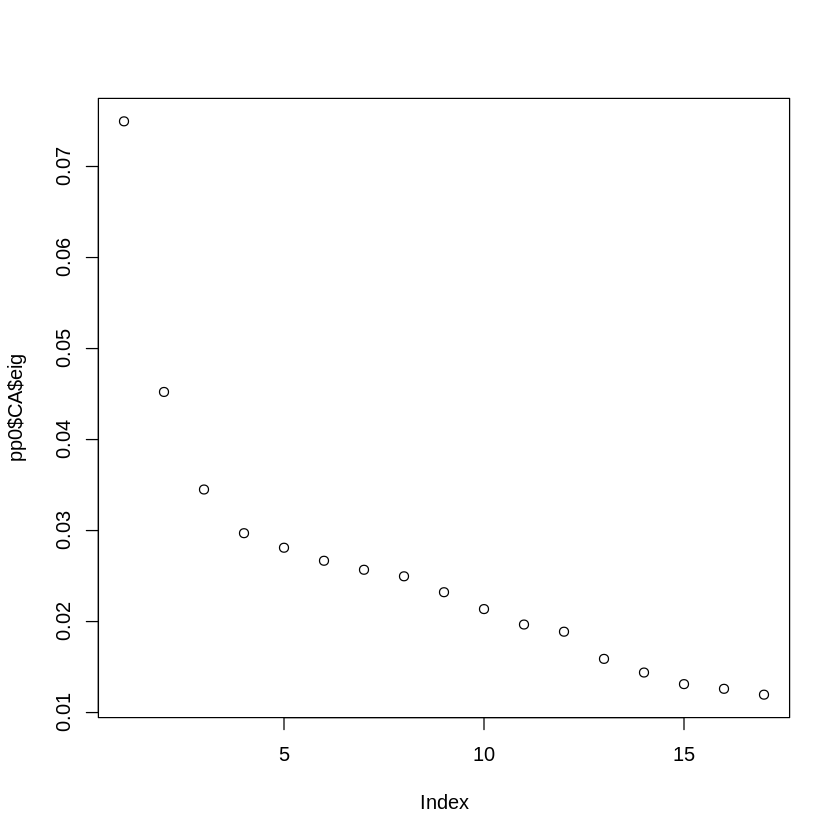

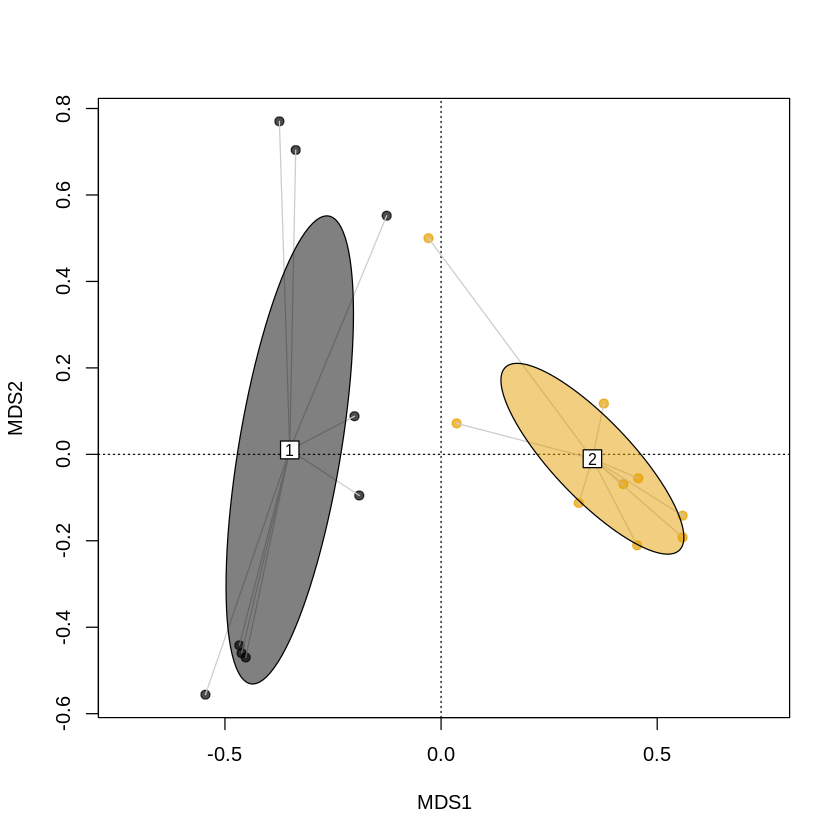

In [89]:
%expand
# clustering / PCoA based on identity by state (IBS) based on single read resampling
# (for low and/or uneven coverage)
# performing PCoA and CAP
conds=data.frame(cbind(pop))
pp0=capscale(ma~1)
pp=capscale(ma~pop,conds)

# significance of by-site divergence
adonis(ma~pop,conds)

# eigenvectors
plot(pp0$CA$eig) 

axes2plot=c(1,2)  
quartz()
library(adegenet) # for transp()
cmd=pp0
plot(cmd,choices=axes2plot,display="sites",type="n") # choices - axes to display
points(cmd,choices=axes2plot,pch=19,col=transp(colors,alpha=0.7))
#ordihull(cmd,choices= axes2plot,groups= conds$grp,draw="polygon",col=1+as.numeric(unique(as.factor(conds$grp))),label=T)
ordispider(cmd,choices= axes2plot,groups=conds$pop,col="grey80")
ordiellipse(cmd,choices= axes2plot,groups= conds$pop,draw="polygon",col=colpops,label=T)


In [69]:
e$vectors[,1:2]

-0.169157009,0.32979333
-0.271757005,-0.34897316
-0.071626776,-0.08966038
-0.298667880,-0.46065814
-0.256597468,-0.26360918
-0.065071796,0.29433533
-0.125488142,0.01373902
-0.143120769,0.25833924
-0.318831783,-0.31672402
0.243532694,-0.05325667
0.286774500,-0.18692917


In [70]:
pcs <- e$vectors
rownames(pcs) <- rownames(co)
pcs

HC1-2B-L5,-0.169157009,0.32979333,-0.0925416296,0.50520867,-0.294133348,0.26493543,-0.06140564,-0.006872229,0.04954539,-0.03079583,0.16689447,-0.019328195,-0.35883554,0.29791521,-0.122308974,-0.111055481,-0.375556625,0.144280831
HC1-4,-0.271757005,-0.34897316,-0.2228580558,0.07179135,0.140243789,0.05948359,0.23457074,-0.431635637,0.58806689,-0.31398495,-0.05176609,0.072893855,-0.08775922,-0.04412887,0.022912601,-0.146603418,0.022401047,-0.020879124
HC2-15A-L5,-0.071626776,-0.08966038,-0.0397213904,-0.09019719,0.008315516,-0.08914973,-0.13072719,-0.577920092,-0.10440079,0.71562241,-0.01947412,0.022977518,-0.18519793,0.22058976,0.071916895,-0.041643594,0.064886645,0.004739740
HC2-17B,-0.298667880,-0.46065814,0.1709509477,0.50626010,0.477551173,-0.14189869,-0.12229645,0.248062189,-0.22116443,0.09107086,0.10440924,-0.118132992,-0.02734497,0.03632917,0.021668054,-0.059933906,-0.003101467,0.013541656
HC3-1,-0.256597468,-0.26360918,-0.1601116901,-0.25708967,-0.429531489,-0.01684808,-0.01589535,0.228308475,-0.20952811,-0.03248925,0.06665936,-0.095151431,-0.09836574,0.02562810,0.010099832,-0.650256453,0.209656174,-0.009993740
HC3-10,-0.065071796,0.29433533,-0.1021351748,0.05611128,0.049239062,-0.72913326,0.52168553,-0.007792869,-0.08157511,-0.05036670,0.21913731,0.012004485,-0.11929153,0.11770265,0.002913704,-0.032029642,0.047016400,-0.024292181
HC3-11,-0.125488142,0.01373902,0.8988541987,-0.11639476,-0.143160319,-0.01167964,0.05355827,-0.120221710,0.11441735,-0.16274347,0.03271447,-0.005991747,-0.19713438,0.15824428,0.058861658,-0.028844206,0.117987901,-0.042665776
HC3-5-L5B,-0.143120769,0.25833924,-0.0773359071,0.39861545,-0.166206946,0.13312088,-0.01994485,0.001502115,0.08777540,0.06530467,-0.01659665,-0.105096992,0.07948560,-0.09322778,0.197338624,0.138111410,0.761771924,-0.159821780
HC3-7,-0.318831783,-0.31672402,-0.1685526135,-0.20871865,-0.302968493,-0.06214955,-0.05833547,0.105436774,-0.07224308,-0.10760250,0.15323289,-0.041115290,-0.18920247,0.18938030,-0.009664227,0.707551090,0.006904790,-0.038549729
SS2-14-L5,0.243532694,-0.05325667,-0.0112504003,0.02660362,0.010415915,0.05821443,-0.07413337,-0.389989744,-0.30450396,-0.25018469,0.43696327,-0.402573092,-0.25713079,-0.44736762,-0.003418302,0.017336869,0.024482783,0.021291751
SS2-18-L5,0.286774500,-0.18692917,0.0607321050,0.07293295,-0.096864786,-0.06099770,-0.01245880,0.204805726,0.33236915,0.26832962,0.32740659,0.276267253,-0.19667989,-0.18134206,-0.581828420,0.009179303,0.205992957,0.002802899


In [72]:
%expand
write.table(pcs,file = "Results/{SUFFIX}pca_covMat.tsv",col.names = F,sep="\t",quote=F)

In [29]:

mbd <- dist.mat[mbdnames,mbdnames]

mbdorder = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_5","hc3_7","hc3_10","hc3_11",
        "ss2_9","ss2_14","ss2_18","ss3_3","ss3_14","ss3_15","ss3_16","ss3_20","ss5_18")
mbd=read.table("mbd.ind2pop",sep="\t")
repsa= clonepairs[,1]
repsb= clonepairs[,2]
# removing "b" replicates
goods=which(!(bams %in% repsb))

#--------------------
# loading individual to population correspondences
i2p=read.table("inds2pops",sep="\t") # 2-column tab-delimited table of individual assignments to populations; must be in the same order as samples in the bam list or vcf file.
row.names(i2p)=i2p[,1]
i2p=i2p[goods,]
site=i2p[,2]

# settign up colors for plotting
palette(rainbow(length(unique(site))))
colors=as.numeric(as.factor(site))
colpops=as.numeric(as.factor(sort(unique(site))))

ERROR: Error in eval(expr, envir, enclos): object 'dist.mat' not found


## SFS for Fst

#### min 80% individuals

In [17]:
sfsSuf = "SFS/HCSS_sfsm80"

In [90]:
module load gcc/6.2.0
module load angsd/0.918

In [91]:
%expand [ ]

zcat [sfsSuf].geno.gz | python ../../../2bRAD_denovo/HetMajorityProb.py | awk "\$6 < 0.75 {print \$1\"\\t\"\$2}" > [sfsSuf]_aSites

In [92]:
%expand [ ]
wc -l [sfsSuf]_aSites

334181 SFS/HCSS_sfsm80_aSites


In [93]:
%expand
angsd sites index {sfsSuf}_aSites

	-> angsd version: 0.918 (htslib: 1.5) build(Aug  1 2017 16:32:01)
	-> Indexing SFS/HCSS_sfsm80_aSites and will add '0' to pos column
	-> Filterfile: SFS/HCSS_sfsm80_aSites supplied will generate binary representations... 
	-> Input file has 2 columns, chr pos
	-> Writing chr:'Contig0' 
	-> Writing chr:'Contig1' 
	-> Writing chr:'Contig2' 
	-> Writing chr:'Contig3' 
	-> Writing chr:'Contig4' 
	-> Writing chr:'Contig5' 
	-> Writing chr:'Contig6' 
	-> Writing chr:'Contig8' 
	-> Writing chr:'Contig9' 
	-> Writing chr:'Contig12' 
	-> Writing chr:'Contig13' 
	-> Writing chr:'Contig16' 
	-> Writing chr:'Contig17' 
	-> Writing chr:'Contig18' 
	-> Writing chr:'Contig21' 
	-> Writing chr:'Contig24' 
	-> Writing chr:'Contig25' 
	-> Writing chr:'Contig26' 
	-> Writing chr:'Contig28' 
	-> Writing chr:'Contig30' 
	-> Writing chr:'Contig32' 
	-> Writing chr:'Contig33' 
	-> Writing chr:'Contig35' 
	-> Writing chr:'Contig38' 
	-> Writing chr:'Contig39' 
	-> Writing chr:'Contig41' 
	-> Writing chr:'Con

	-> Writing chr:'Contig697' 
	-> Writing chr:'Contig698' 
	-> Writing chr:'Contig705' 
	-> Writing chr:'Contig706' 
	-> Writing chr:'Contig708' 
	-> Writing chr:'Contig709' 
	-> Writing chr:'Contig711' 
	-> Writing chr:'Contig714' 
	-> Writing chr:'Contig716' 
	-> Writing chr:'Contig721' 
	-> Writing chr:'Contig726' 
	-> Writing chr:'Contig727' 
	-> Writing chr:'Contig729' 
	-> Writing chr:'Contig731' 
	-> Writing chr:'Contig733' 
	-> Writing chr:'Contig741' 
	-> Writing chr:'Contig745' 
	-> Writing chr:'Contig748' 
	-> Writing chr:'Contig753' 
	-> Writing chr:'Contig754' 
	-> Writing chr:'Contig755' 
	-> Writing chr:'Contig756' 
	-> Writing chr:'Contig760' 
	-> Writing chr:'Contig762' 
	-> Writing chr:'Contig765' 
	-> Writing chr:'Contig769' 
	-> Writing chr:'Contig771' 
	-> Writing chr:'Contig773' 
	-> Writing chr:'Contig775' 
	-> Writing chr:'Contig776' 
	-> Writing chr:'Contig777' 
	-> Writing chr:'Contig778' 
	-> Writing chr:'Contig781' 
	-> Writing chr:'Contig786' 
	-> Writing ch

	-> Writing chr:'Contig1990' 
	-> Writing chr:'Contig1992' 
	-> Writing chr:'Contig1996' 
	-> Writing chr:'Contig2010' 
	-> Writing chr:'Contig2028' 
	-> Writing chr:'Contig2029' 
	-> Writing chr:'Contig2033' 
	-> Writing chr:'Contig2034' 
	-> Writing chr:'Contig2037' 
	-> Writing chr:'Contig2047' 
	-> Writing chr:'Contig2048' 
	-> Writing chr:'Contig2051' 
	-> Writing chr:'Contig2059' 
	-> Writing chr:'Contig2071' 
	-> Writing chr:'Contig2074' 
	-> Writing chr:'Contig2076' 
	-> Writing chr:'Contig2077' 
	-> Writing chr:'Contig2078' 
	-> Writing chr:'Contig2085' 
	-> Writing chr:'Contig2095' 
	-> Writing chr:'Contig2102' 
	-> Writing chr:'Contig2105' 
	-> Writing chr:'Contig2108' 
	-> Writing chr:'Contig2121' 
	-> Writing chr:'Contig2123' 
	-> Writing chr:'Contig2143' 
	-> Writing chr:'Contig2145' 
	-> Writing chr:'Contig2151' 
	-> Writing chr:'Contig2155' 
	-> Writing chr:'Contig2158' 
	-> Writing chr:'Contig2166' 
	-> Writing chr:'Contig2172' 
	-> Writing chr:'Contig2184' 
	-> Writin

	-> Writing chr:'Contig4083' 
	-> Writing chr:'Contig4084' 
	-> Writing chr:'Contig4087' 
	-> Writing chr:'Contig4093' 
	-> Writing chr:'Contig4094' 
	-> Writing chr:'Contig4098' 
	-> Writing chr:'Contig4124' 
	-> Writing chr:'Contig4128' 
	-> Writing chr:'Contig4133' 
	-> Writing chr:'Contig4138' 
	-> Writing chr:'Contig4141' 
	-> Writing chr:'Contig4142' 
	-> Writing chr:'Contig4150' 
	-> Writing chr:'Contig4152' 
	-> Writing chr:'Contig4161' 
	-> Writing chr:'Contig4162' 
	-> Writing chr:'Contig4168' 
	-> Writing chr:'Contig4171' 
	-> Writing chr:'Contig4197' 
	-> Writing chr:'Contig4205' 
	-> Writing chr:'Contig4210' 
	-> Writing chr:'Contig4212' 
	-> Writing chr:'Contig4221' 
	-> Writing chr:'Contig4231' 
	-> Writing chr:'Contig4255' 
	-> Writing chr:'Contig4267' 
	-> Writing chr:'Contig4297' 
	-> Writing chr:'Contig4305' 
	-> Writing chr:'Contig4311' 
	-> Writing chr:'Contig4319' 
	-> Writing chr:'Contig4322' 
	-> Writing chr:'Contig4342' 
	-> Writing chr:'Contig4343' 
	-> Writin

	-> Writing chr:'Contig8220' 
	-> Writing chr:'Contig8229' 
	-> Writing chr:'Contig8245' 
	-> Writing chr:'Contig8272' 
	-> Writing chr:'Contig8275' 
	-> Writing chr:'Contig8301' 
	-> Writing chr:'Contig8309' 
	-> Writing chr:'Contig8311' 
	-> Writing chr:'Contig8316' 
	-> Writing chr:'Contig8326' 
	-> Writing chr:'Contig8330' 
	-> Writing chr:'Contig8345' 
	-> Writing chr:'Contig8362' 
	-> Writing chr:'Contig8378' 
	-> Writing chr:'Contig8386' 
	-> Writing chr:'Contig8443' 
	-> Writing chr:'Contig8452' 
	-> Writing chr:'Contig8494' 
	-> Writing chr:'Contig8510' 
	-> Writing chr:'Contig8523' 
	-> Writing chr:'Contig8532' 
	-> Writing chr:'Contig8533' 
	-> Writing chr:'Contig8601' 
	-> Writing chr:'Contig8618' 
	-> Writing chr:'Contig8636' 
	-> Writing chr:'Contig8641' 
	-> Writing chr:'Contig8651' 
	-> Writing chr:'Contig8664' 
	-> Writing chr:'Contig8696' 
	-> Writing chr:'Contig8781' 
	-> Writing chr:'Contig8812' 
	-> Writing chr:'Contig8914' 
	-> Writing chr:'Contig8926' 
	-> Writin

	-> Writing chr:'Contig16958' 
	-> Writing chr:'Contig16967' 
	-> Writing chr:'Contig17004' 
	-> Writing chr:'Contig17005' 
	-> Writing chr:'Contig17012' 
	-> Writing chr:'Contig17021' 
	-> Writing chr:'Contig17022' 
	-> Writing chr:'Contig17037' 
	-> Writing chr:'Contig17050' 
	-> Writing chr:'Contig17057' 
	-> Writing chr:'Contig17059' 
	-> Writing chr:'Contig17060' 
	-> Writing chr:'Contig17070' 
	-> Writing chr:'Contig17080' 
	-> Writing chr:'Contig17091' 
	-> Writing chr:'Contig17102' 
	-> Writing chr:'Contig17104' 
	-> Writing chr:'Contig17108' 
	-> Writing chr:'Contig17132' 
	-> Writing chr:'Contig17148' 
	-> Writing chr:'Contig17149' 
	-> Writing chr:'Contig17150' 
	-> Writing chr:'Contig17153' 
	-> Writing chr:'Contig17163' 
	-> Writing chr:'Contig17164' 
	-> Writing chr:'Contig17167' 
	-> Writing chr:'Contig17168' 
	-> Writing chr:'Contig17171' 
	-> Writing chr:'Contig17173' 
	-> Writing chr:'Contig17174' 
	-> Writing chr:'Contig17177' 
	-> Writing chr:'Contig17182' 
	-> Writ

	-> Writing chr:'Contig19248' 
	-> Writing chr:'Contig19256' 
	-> Writing chr:'Contig19257' 
	-> Writing chr:'Contig19267' 
	-> Writing chr:'Contig19273' 
	-> Writing chr:'Contig19288' 
	-> Writing chr:'Contig19292' 
	-> Writing chr:'Contig19293' 
	-> Writing chr:'Contig19307' 
	-> Writing chr:'Contig19332' 
	-> Writing chr:'Contig19335' 
	-> Writing chr:'Contig19348' 
	-> Writing chr:'Contig19351' 
	-> Writing chr:'Contig19354' 
	-> Writing chr:'Contig19371' 
	-> Writing chr:'Contig19372' 
	-> Writing chr:'Contig19431' 
	-> Writing chr:'Contig19449' 
	-> Writing chr:'Contig19458' 
	-> Writing chr:'Contig19473' 
	-> Writing chr:'Contig19477' 
	-> Writing chr:'Contig19479' 
	-> Writing chr:'Contig19484' 
	-> Writing chr:'Contig19486' 
	-> Writing chr:'Contig19496' 
	-> Writing chr:'Contig19501' 
	-> Writing chr:'Contig19503' 
	-> Writing chr:'Contig19507' 
	-> Writing chr:'Contig19524' 
	-> Writing chr:'Contig19553' 
	-> Writing chr:'Contig19558' 
	-> Writing chr:'Contig19564' 
	-> Writ

	-> Writing chr:'Contig21797' 
	-> Writing chr:'Contig21801' 
	-> Writing chr:'Contig21803' 
	-> Writing chr:'Contig21804' 
	-> Writing chr:'Contig21806' 
	-> Writing chr:'Contig21811' 
	-> Writing chr:'Contig21816' 
	-> Writing chr:'Contig21828' 
	-> Writing chr:'Contig21830' 
	-> Writing chr:'Contig21842' 
	-> Writing chr:'Contig21845' 
	-> Writing chr:'Contig21847' 
	-> Writing chr:'Contig21859' 
	-> Writing chr:'Contig21866' 
	-> Writing chr:'Contig21876' 
	-> Writing chr:'Contig21877' 
	-> Writing chr:'Contig21894' 
	-> Writing chr:'Contig21903' 
	-> Writing chr:'Contig21913' 
	-> Writing chr:'Contig21921' 
	-> Writing chr:'Contig21923' 
	-> Writing chr:'Contig21933' 
	-> Writing chr:'Contig21936' 
	-> Writing chr:'Contig21950' 
	-> Writing chr:'Contig21951' 
	-> Writing chr:'Contig21956' 
	-> Writing chr:'Contig21957' 
	-> Writing chr:'Contig21958' 
	-> Writing chr:'Contig21960' 
	-> Writing chr:'Contig21964' 
	-> Writing chr:'Contig21970' 
	-> Writing chr:'Contig21974' 
	-> Writ

	-> Writing chr:'Contig24041' 
	-> Writing chr:'Contig24042' 
	-> Writing chr:'Contig24051' 
	-> Writing chr:'Contig24054' 
	-> Writing chr:'Contig24058' 
	-> Writing chr:'Contig24084' 
	-> Writing chr:'Contig24090' 
	-> Writing chr:'Contig24093' 
	-> Writing chr:'Contig24095' 
	-> Writing chr:'Contig24097' 
	-> Writing chr:'Contig24100' 
	-> Writing chr:'Contig24101' 
	-> Writing chr:'Contig24129' 
	-> Writing chr:'Contig24130' 
	-> Writing chr:'Contig24144' 
	-> Writing chr:'Contig24164' 
	-> Writing chr:'Contig24172' 
	-> Writing chr:'Contig24175' 
	-> Writing chr:'Contig24191' 
	-> Writing chr:'Contig24202' 
	-> Writing chr:'Contig24215' 
	-> Writing chr:'Contig24218' 
	-> Writing chr:'Contig24238' 
	-> Writing chr:'Contig24241' 
	-> Writing chr:'Contig24243' 
	-> Writing chr:'Contig24263' 
	-> Writing chr:'Contig24273' 
	-> Writing chr:'Contig24279' 
	-> Writing chr:'Contig24282' 
	-> Writing chr:'Contig24292' 
	-> Writing chr:'Contig24294' 
	-> Writing chr:'Contig24295' 
	-> Writ

	-> Writing chr:'Contig26344' 
	-> Writing chr:'Contig26345' 
	-> Writing chr:'Contig26348' 
	-> Writing chr:'Contig26355' 
	-> Writing chr:'Contig26364' 
	-> Writing chr:'Contig26365' 
	-> Writing chr:'Contig26378' 
	-> Writing chr:'Contig26383' 
	-> Writing chr:'Contig26389' 
	-> Writing chr:'Contig26391' 
	-> Writing chr:'Contig26400' 
	-> Writing chr:'Contig26402' 
	-> Writing chr:'Contig26410' 
	-> Writing chr:'Contig26420' 
	-> Writing chr:'Contig26423' 
	-> Writing chr:'Contig26428' 
	-> Writing chr:'Contig26431' 
	-> Writing chr:'Contig26450' 
	-> Writing chr:'Contig26458' 
	-> Writing chr:'Contig26465' 
	-> Writing chr:'Contig26471' 
	-> Writing chr:'Contig26475' 
	-> Writing chr:'Contig26482' 
	-> Writing chr:'Contig26490' 
	-> Writing chr:'Contig26502' 
	-> Writing chr:'Contig26509' 
	-> Writing chr:'Contig26516' 
	-> Writing chr:'Contig26531' 
	-> Writing chr:'Contig26534' 
	-> Writing chr:'Contig26536' 
	-> Writing chr:'Contig26549' 
	-> Writing chr:'Contig26564' 
	-> Writ

	-> Writing chr:'Contig28854' 
	-> Writing chr:'Contig28867' 
	-> Writing chr:'Contig28887' 
	-> Writing chr:'Contig28893' 
	-> Writing chr:'Contig28898' 
	-> Writing chr:'Contig28902' 
	-> Writing chr:'Contig28935' 
	-> Writing chr:'Contig28937' 
	-> Writing chr:'Contig28946' 
	-> Writing chr:'Contig28951' 
	-> Writing chr:'Contig28966' 
	-> Writing chr:'Contig28987' 
	-> Writing chr:'Contig28993' 
	-> Writing chr:'Contig28999' 
	-> Writing chr:'Contig29002' 
	-> Writing chr:'Contig29003' 
	-> Writing chr:'Contig29010' 
	-> Writing chr:'Contig29027' 
	-> Writing chr:'Contig29033' 
	-> Writing chr:'Contig29051' 
	-> Writing chr:'Contig29067' 
	-> Writing chr:'Contig29068' 
	-> Writing chr:'Contig29072' 
	-> Writing chr:'Contig29076' 
	-> Writing chr:'Contig29092' 
	-> Writing chr:'Contig29104' 
	-> Writing chr:'Contig29105' 
	-> Writing chr:'Contig29118' 
	-> Writing chr:'Contig29138' 
	-> Writing chr:'Contig29153' 
	-> Writing chr:'Contig29191' 
	-> Writing chr:'Contig29199' 
	-> Writ

	-> Writing chr:'Contig31541' 
	-> Writing chr:'Contig31551' 
	-> Writing chr:'Contig31570' 
	-> Writing chr:'Contig31577' 
	-> Writing chr:'Contig31584' 
	-> Writing chr:'Contig31586' 
	-> Writing chr:'Contig31593' 
	-> Writing chr:'Contig31613' 
	-> Writing chr:'Contig31615' 
	-> Writing chr:'Contig31619' 
	-> Writing chr:'Contig31629' 
	-> Writing chr:'Contig31640' 
	-> Writing chr:'Contig31645' 
	-> Writing chr:'Contig31661' 
	-> Writing chr:'Contig31671' 
	-> Writing chr:'Contig31675' 
	-> Writing chr:'Contig31685' 
	-> Writing chr:'Contig31695' 
	-> Writing chr:'Contig31699' 
	-> Writing chr:'Contig31700' 
	-> Writing chr:'Contig31706' 
	-> Writing chr:'Contig31740' 
	-> Writing chr:'Contig31744' 
	-> Writing chr:'Contig31746' 
	-> Writing chr:'Contig31749' 
	-> Writing chr:'Contig31767' 
	-> Writing chr:'Contig31777' 
	-> Writing chr:'Contig31814' 
	-> Writing chr:'Contig31819' 
	-> Writing chr:'Contig31821' 
	-> Writing chr:'Contig31822' 
	-> Writing chr:'Contig31824' 
	-> Writ

	-> Writing chr:'Contig34084' 
	-> Writing chr:'Contig34091' 
	-> Writing chr:'Contig34102' 
	-> Writing chr:'Contig34105' 
	-> Writing chr:'Contig34109' 
	-> Writing chr:'Contig34110' 
	-> Writing chr:'Contig34112' 
	-> Writing chr:'Contig34115' 
	-> Writing chr:'Contig34148' 
	-> Writing chr:'Contig34183' 
	-> Writing chr:'Contig34243' 
	-> Writing chr:'Contig34267' 
	-> Writing chr:'Contig34268' 
	-> Writing chr:'Contig34272' 
	-> Writing chr:'Contig34276' 
	-> Writing chr:'Contig34282' 
	-> Writing chr:'Contig34294' 
	-> Writing chr:'Contig34296' 
	-> Writing chr:'Contig34298' 
	-> Writing chr:'Contig34305' 
	-> Writing chr:'Contig34311' 
	-> Writing chr:'Contig34312' 
	-> Writing chr:'Contig34313' 
	-> Writing chr:'Contig34342' 
	-> Writing chr:'Contig34360' 
	-> Writing chr:'Contig34372' 
	-> Writing chr:'Contig34416' 
	-> Writing chr:'Contig34428' 
	-> Writing chr:'Contig34433' 
	-> Writing chr:'Contig34452' 
	-> Writing chr:'Contig34461' 
	-> Writing chr:'Contig34464' 
	-> Writ

	-> Writing chr:'Contig36812' 
	-> Writing chr:'Contig36816' 
	-> Writing chr:'Contig36835' 
	-> Writing chr:'Contig36842' 
	-> Writing chr:'Contig36844' 
	-> Writing chr:'Contig36854' 
	-> Writing chr:'Contig36855' 
	-> Writing chr:'Contig36857' 
	-> Writing chr:'Contig36881' 
	-> Writing chr:'Contig36885' 
	-> Writing chr:'Contig36893' 
	-> Writing chr:'Contig36904' 
	-> Writing chr:'Contig36913' 
	-> Writing chr:'Contig36917' 
	-> Writing chr:'Contig36918' 
	-> Writing chr:'Contig36921' 
	-> Writing chr:'Contig36936' 
	-> Writing chr:'Contig36942' 
	-> Writing chr:'Contig36945' 
	-> Writing chr:'Contig36958' 
	-> Writing chr:'Contig36963' 
	-> Writing chr:'Contig36973' 
	-> Writing chr:'Contig36997' 
	-> Writing chr:'Contig37000' 
	-> Writing chr:'Contig37003' 
	-> Writing chr:'Contig37018' 
	-> Writing chr:'Contig37020' 
	-> Writing chr:'Contig37025' 
	-> Writing chr:'Contig37058' 
	-> Writing chr:'Contig37068' 
	-> Writing chr:'Contig37069' 
	-> Writing chr:'Contig37077' 
	-> Writ

	-> Writing chr:'Contig39563' 
	-> Writing chr:'Contig39572' 
	-> Writing chr:'Contig39573' 
	-> Writing chr:'Contig39577' 
	-> Writing chr:'Contig39581' 
	-> Writing chr:'Contig39586' 
	-> Writing chr:'Contig39605' 
	-> Writing chr:'Contig39607' 
	-> Writing chr:'Contig39613' 
	-> Writing chr:'Contig39616' 
	-> Writing chr:'Contig39656' 
	-> Writing chr:'Contig39661' 
	-> Writing chr:'Contig39677' 
	-> Writing chr:'Contig39688' 
	-> Writing chr:'Contig39703' 
	-> Writing chr:'Contig39715' 
	-> Writing chr:'Contig39719' 
	-> Writing chr:'Contig39720' 
	-> Writing chr:'Contig39723' 
	-> Writing chr:'Contig39730' 
	-> Writing chr:'Contig39733' 
	-> Writing chr:'Contig39736' 
	-> Writing chr:'Contig39759' 
	-> Writing chr:'Contig39792' 
	-> Writing chr:'Contig39793' 
	-> Writing chr:'Contig39796' 
	-> Writing chr:'Contig39798' 
	-> Writing chr:'Contig39801' 
	-> Writing chr:'Contig39810' 
	-> Writing chr:'Contig39812' 
	-> Writing chr:'Contig39830' 
	-> Writing chr:'Contig39831' 
	-> Writ

	-> Writing chr:'Contig42441' 
	-> Writing chr:'Contig42447' 
	-> Writing chr:'Contig42451' 
	-> Writing chr:'Contig42459' 
	-> Writing chr:'Contig42461' 
	-> Writing chr:'Contig42482' 
	-> Writing chr:'Contig42493' 
	-> Writing chr:'Contig42496' 
	-> Writing chr:'Contig42502' 
	-> Writing chr:'Contig42546' 
	-> Writing chr:'Contig42553' 
	-> Writing chr:'Contig42563' 
	-> Writing chr:'Contig42578' 
	-> Writing chr:'Contig42579' 
	-> Writing chr:'Contig42590' 
	-> Writing chr:'Contig42596' 
	-> Writing chr:'Contig42602' 
	-> Writing chr:'Contig42603' 
	-> Writing chr:'Contig42604' 
	-> Writing chr:'Contig42610' 
	-> Writing chr:'Contig42640' 
	-> Writing chr:'Contig42647' 
	-> Writing chr:'Contig42660' 
	-> Writing chr:'Contig42675' 
	-> Writing chr:'Contig42687' 
	-> Writing chr:'Contig42688' 
	-> Writing chr:'Contig42700' 
	-> Writing chr:'Contig42720' 
	-> Writing chr:'Contig42722' 
	-> Writing chr:'Contig42756' 
	-> Writing chr:'Contig42766' 
	-> Writing chr:'Contig42778' 
	-> Writ

	-> Writing chr:'Contig45662' 
	-> Writing chr:'Contig45664' 
	-> Writing chr:'Contig45677' 
	-> Writing chr:'Contig45681' 
	-> Writing chr:'Contig45682' 
	-> Writing chr:'Contig45695' 
	-> Writing chr:'Contig45711' 
	-> Writing chr:'Contig45720' 
	-> Writing chr:'Contig45721' 
	-> Writing chr:'Contig45734' 
	-> Writing chr:'Contig45744' 
	-> Writing chr:'Contig45749' 
	-> Writing chr:'Contig45768' 
	-> Writing chr:'Contig45783' 
	-> Writing chr:'Contig45838' 
	-> Writing chr:'Contig45845' 
	-> Writing chr:'Contig45860' 
	-> Writing chr:'Contig45866' 
	-> Writing chr:'Contig45873' 
	-> Writing chr:'Contig45876' 
	-> Writing chr:'Contig45878' 
	-> Writing chr:'Contig45905' 
	-> Writing chr:'Contig45907' 
	-> Writing chr:'Contig45927' 
	-> Writing chr:'Contig45945' 
	-> Writing chr:'Contig45949' 
	-> Writing chr:'Contig45957' 
	-> Writing chr:'Contig45964' 
	-> Writing chr:'Contig45970' 
	-> Writing chr:'Contig45972' 
	-> Writing chr:'Contig46008' 
	-> Writing chr:'Contig46040' 
	-> Writ

	-> Writing chr:'Contig49054' 
	-> Writing chr:'Contig49058' 
	-> Writing chr:'Contig49063' 
	-> Writing chr:'Contig49076' 
	-> Writing chr:'Contig49077' 
	-> Writing chr:'Contig49084' 
	-> Writing chr:'Contig49095' 
	-> Writing chr:'Contig49114' 
	-> Writing chr:'Contig49132' 
	-> Writing chr:'Contig49136' 
	-> Writing chr:'Contig49157' 
	-> Writing chr:'Contig49158' 
	-> Writing chr:'Contig49163' 
	-> Writing chr:'Contig49206' 
	-> Writing chr:'Contig49209' 
	-> Writing chr:'Contig49217' 
	-> Writing chr:'Contig49227' 
	-> Writing chr:'Contig49230' 
	-> Writing chr:'Contig49233' 
	-> Writing chr:'Contig49241' 
	-> Writing chr:'Contig49246' 
	-> Writing chr:'Contig49260' 
	-> Writing chr:'Contig49264' 
	-> Writing chr:'Contig49268' 
	-> Writing chr:'Contig49279' 
	-> Writing chr:'Contig49284' 
	-> Writing chr:'Contig49314' 
	-> Writing chr:'Contig49329' 
	-> Writing chr:'Contig49347' 
	-> Writing chr:'Contig49360' 
	-> Writing chr:'Contig49363' 
	-> Writing chr:'Contig49371' 
	-> Writ

	-> Writing chr:'Contig52641' 
	-> Writing chr:'Contig52645' 
	-> Writing chr:'Contig52649' 
	-> Writing chr:'Contig52657' 
	-> Writing chr:'Contig52659' 
	-> Writing chr:'Contig52665' 
	-> Writing chr:'Contig52683' 
	-> Writing chr:'Contig52694' 
	-> Writing chr:'Contig52704' 
	-> Writing chr:'Contig52726' 
	-> Writing chr:'Contig52746' 
	-> Writing chr:'Contig52756' 
	-> Writing chr:'Contig52759' 
	-> Writing chr:'Contig52762' 
	-> Writing chr:'Contig52768' 
	-> Writing chr:'Contig52789' 
	-> Writing chr:'Contig52798' 
	-> Writing chr:'Contig52845' 
	-> Writing chr:'Contig52851' 
	-> Writing chr:'Contig52864' 
	-> Writing chr:'Contig52890' 
	-> Writing chr:'Contig52902' 
	-> Writing chr:'Contig52951' 
	-> Writing chr:'Contig52989' 
	-> Writing chr:'Contig53011' 
	-> Writing chr:'Contig53020' 
	-> Writing chr:'Contig53027' 
	-> Writing chr:'Contig53032' 
	-> Writing chr:'Contig53051' 
	-> Writing chr:'Contig53060' 
	-> Writing chr:'Contig53070' 
	-> Writing chr:'Contig53086' 
	-> Writ

	-> Writing chr:'Contig56434' 
	-> Writing chr:'Contig56436' 
	-> Writing chr:'Contig56441' 
	-> Writing chr:'Contig56449' 
	-> Writing chr:'Contig56457' 
	-> Writing chr:'Contig56474' 
	-> Writing chr:'Contig56483' 
	-> Writing chr:'Contig56489' 
	-> Writing chr:'Contig56495' 
	-> Writing chr:'Contig56499' 
	-> Writing chr:'Contig56514' 
	-> Writing chr:'Contig56527' 
	-> Writing chr:'Contig56530' 
	-> Writing chr:'Contig56534' 
	-> Writing chr:'Contig56535' 
	-> Writing chr:'Contig56569' 
	-> Writing chr:'Contig56570' 
	-> Writing chr:'Contig56584' 
	-> Writing chr:'Contig56628' 
	-> Writing chr:'Contig56639' 
	-> Writing chr:'Contig56645' 
	-> Writing chr:'Contig56648' 
	-> Writing chr:'Contig56653' 
	-> Writing chr:'Contig56654' 
	-> Writing chr:'Contig56657' 
	-> Writing chr:'Contig56687' 
	-> Writing chr:'Contig56698' 
	-> Writing chr:'Contig56708' 
	-> Writing chr:'Contig56721' 
	-> Writing chr:'Contig56776' 
	-> Writing chr:'Contig56797' 
	-> Writing chr:'Contig56807' 
	-> Writ

	-> Writing chr:'Contig60880' 
	-> Writing chr:'Contig60897' 
	-> Writing chr:'Contig60916' 
	-> Writing chr:'Contig60920' 
	-> Writing chr:'Contig60944' 
	-> Writing chr:'Contig60949' 
	-> Writing chr:'Contig60982' 
	-> Writing chr:'Contig60999' 
	-> Writing chr:'Contig61006' 
	-> Writing chr:'Contig61024' 
	-> Writing chr:'Contig61031' 
	-> Writing chr:'Contig61035' 
	-> Writing chr:'Contig61046' 
	-> Writing chr:'Contig61077' 
	-> Writing chr:'Contig61092' 
	-> Writing chr:'Contig61093' 
	-> Writing chr:'Contig61108' 
	-> Writing chr:'Contig61120' 
	-> Writing chr:'Contig61127' 
	-> Writing chr:'Contig61136' 
	-> Writing chr:'Contig61158' 
	-> Writing chr:'Contig61167' 
	-> Writing chr:'Contig61175' 
	-> Writing chr:'Contig61179' 
	-> Writing chr:'Contig61200' 
	-> Writing chr:'Contig61223' 
	-> Writing chr:'Contig61225' 
	-> Writing chr:'Contig61234' 
	-> Writing chr:'Contig61250' 
	-> Writing chr:'Contig61257' 
	-> Writing chr:'Contig61271' 
	-> Writing chr:'Contig61294' 
	-> Writ

	-> Writing chr:'Contig65303' 
	-> Writing chr:'Contig65316' 
	-> Writing chr:'Contig65321' 
	-> Writing chr:'Contig65363' 
	-> Writing chr:'Contig65364' 
	-> Writing chr:'Contig65380' 
	-> Writing chr:'Contig65393' 
	-> Writing chr:'Contig65397' 
	-> Writing chr:'Contig65405' 
	-> Writing chr:'Contig65416' 
	-> Writing chr:'Contig65429' 
	-> Writing chr:'Contig65434' 
	-> Writing chr:'Contig65435' 
	-> Writing chr:'Contig65449' 
	-> Writing chr:'Contig65456' 
	-> Writing chr:'Contig65492' 
	-> Writing chr:'Contig65512' 
	-> Writing chr:'Contig65537' 
	-> Writing chr:'Contig65543' 
	-> Writing chr:'Contig65553' 
	-> Writing chr:'Contig65594' 
	-> Writing chr:'Contig65609' 
	-> Writing chr:'Contig65632' 
	-> Writing chr:'Contig65635' 
	-> Writing chr:'Contig65651' 
	-> Writing chr:'Contig65664' 
	-> Writing chr:'Contig65681' 
	-> Writing chr:'Contig65750' 
	-> Writing chr:'Contig65751' 
	-> Writing chr:'Contig65779' 
	-> Writing chr:'Contig65789' 
	-> Writing chr:'Contig65827' 
	-> Writ

	-> Writing chr:'Contig71153' 
	-> Writing chr:'Contig71158' 
	-> Writing chr:'Contig71200' 
	-> Writing chr:'Contig71201' 
	-> Writing chr:'Contig71216' 
	-> Writing chr:'Contig71224' 
	-> Writing chr:'Contig71230' 
	-> Writing chr:'Contig71237' 
	-> Writing chr:'Contig71254' 
	-> Writing chr:'Contig71316' 
	-> Writing chr:'Contig71325' 
	-> Writing chr:'Contig71363' 
	-> Writing chr:'Contig71372' 
	-> Writing chr:'Contig71389' 
	-> Writing chr:'Contig71404' 
	-> Writing chr:'Contig71466' 
	-> Writing chr:'Contig71484' 
	-> Writing chr:'Contig71487' 
	-> Writing chr:'Contig71496' 
	-> Writing chr:'Contig71514' 
	-> Writing chr:'Contig71667' 
	-> Writing chr:'Contig71674' 
	-> Writing chr:'Contig71732' 
	-> Writing chr:'Contig71759' 
	-> Writing chr:'Contig71760' 
	-> Writing chr:'Contig71785' 
	-> Writing chr:'Contig71801' 
	-> Writing chr:'Contig71807' 
	-> Writing chr:'Contig71812' 
	-> Writing chr:'Contig71839' 
	-> Writing chr:'Contig71856' 
	-> Writing chr:'Contig71901' 
	-> Writ

	-> Writing chr:'Contig77962' 
	-> Writing chr:'Contig77978' 
	-> Writing chr:'Contig77984' 
	-> Writing chr:'Contig78004' 
	-> Writing chr:'Contig78014' 
	-> Writing chr:'Contig78091' 
	-> Writing chr:'Contig78123' 
	-> Writing chr:'Contig78167' 
	-> Writing chr:'Contig78212' 
	-> Writing chr:'Contig78231' 
	-> Writing chr:'Contig78240' 
	-> Writing chr:'Contig78296' 
	-> Writing chr:'Contig78344' 
	-> Writing chr:'Contig78350' 
	-> Writing chr:'Contig78422' 
	-> Writing chr:'Contig78451' 
	-> Writing chr:'Contig78505' 
	-> Writing chr:'Contig78609' 
	-> Writing chr:'Contig78627' 
	-> Writing chr:'Contig78640' 
	-> Writing chr:'Contig78654' 
	-> Writing chr:'Contig78668' 
	-> Writing chr:'Contig78674' 
	-> Writing chr:'Contig78682' 
	-> Writing chr:'Contig78708' 
	-> Writing chr:'Contig78720' 
	-> Writing chr:'Contig78733' 
	-> Writing chr:'Contig78738' 
	-> Writing chr:'Contig78757' 
	-> Writing chr:'Contig78766' 
	-> Writing chr:'Contig78819' 
	-> Writing chr:'Contig78834' 
	-> Writ

	-> Writing chr:'Contig85159' 
	-> Writing chr:'Contig85207' 
	-> Writing chr:'Contig85316' 
	-> Writing chr:'Contig85334' 
	-> Writing chr:'Contig85362' 
	-> Writing chr:'Contig85415' 
	-> Writing chr:'Contig85431' 
	-> Writing chr:'Contig85449' 
	-> Writing chr:'Contig85469' 
	-> Writing chr:'Contig85481' 
	-> Writing chr:'Contig85488' 
	-> Writing chr:'Contig85507' 
	-> Writing chr:'Contig85545' 
	-> Writing chr:'Contig85560' 
	-> Writing chr:'Contig85585' 
	-> Writing chr:'Contig85628' 
	-> Writing chr:'Contig85656' 
	-> Writing chr:'Contig85677' 
	-> Writing chr:'Contig85732' 
	-> Writing chr:'Contig85738' 
	-> Writing chr:'Contig85758' 
	-> Writing chr:'Contig85797' 
	-> Writing chr:'Contig85806' 
	-> Writing chr:'Contig85826' 
	-> Writing chr:'Contig85836' 
	-> Writing chr:'Contig85848' 
	-> Writing chr:'Contig85897' 
	-> Writing chr:'Contig85912' 
	-> Writing chr:'Contig85923' 
	-> Writing chr:'Contig85926' 
	-> Writing chr:'Contig86070' 
	-> Writing chr:'Contig86096' 
	-> Writ

	-> Writing chr:'Contig95611' 
	-> Writing chr:'Contig95618' 
	-> Writing chr:'Contig95620' 
	-> Writing chr:'Contig95672' 
	-> Writing chr:'Contig95683' 
	-> Writing chr:'Contig95689' 
	-> Writing chr:'Contig95722' 
	-> Writing chr:'Contig95740' 
	-> Writing chr:'Contig95755' 
	-> Writing chr:'Contig95762' 
	-> Writing chr:'Contig95870' 
	-> Writing chr:'Contig95954' 
	-> Writing chr:'Contig95963' 
	-> Writing chr:'Contig95980' 
	-> Writing chr:'Contig95997' 
	-> Writing chr:'Contig96020' 
	-> Writing chr:'Contig96027' 
	-> Writing chr:'Contig96066' 
	-> Writing chr:'Contig96073' 
	-> Writing chr:'Contig96074' 
	-> Writing chr:'Contig96075' 
	-> Writing chr:'Contig96111' 
	-> Writing chr:'Contig96128' 
	-> Writing chr:'Contig96155' 
	-> Writing chr:'Contig96206' 
	-> Writing chr:'Contig96224' 
	-> Writing chr:'Contig96226' 
	-> Writing chr:'Contig96258' 
	-> Writing chr:'Contig96308' 
	-> Writing chr:'Contig96309' 
	-> Writing chr:'Contig96330' 
	-> Writing chr:'Contig96336' 
	-> Writ

	-> Writing chr:'Contig105656' 
	-> Writing chr:'Contig105664' 
	-> Writing chr:'Contig105673' 
	-> Writing chr:'Contig105689' 
	-> Writing chr:'Contig105731' 
	-> Writing chr:'Contig105759' 
	-> Writing chr:'Contig105776' 
	-> Writing chr:'Contig105808' 
	-> Writing chr:'Contig105829' 
	-> Writing chr:'Contig105865' 
	-> Writing chr:'Contig105890' 
	-> Writing chr:'Contig105964' 
	-> Writing chr:'Contig105970' 
	-> Writing chr:'Contig105982' 
	-> Writing chr:'Contig106026' 
	-> Writing chr:'Contig106046' 
	-> Writing chr:'Contig106078' 
	-> Writing chr:'Contig106082' 
	-> Writing chr:'Contig106091' 
	-> Writing chr:'Contig106125' 
	-> Writing chr:'Contig106136' 
	-> Writing chr:'Contig106154' 
	-> Writing chr:'Contig106280' 
	-> Writing chr:'Contig106390' 
	-> Writing chr:'Contig106438' 
	-> Writing chr:'Contig106554' 
	-> Writing chr:'Contig106566' 
	-> Writing chr:'Contig106676' 
	-> Writing chr:'Contig106682' 
	-> Writing chr:'Contig106747' 
	-> Writing chr:'Contig106794' 
	-> Writ

	-> Writing chr:'Contig119450' 
	-> Writing chr:'Contig119466' 
	-> Writing chr:'Contig119509' 
	-> Writing chr:'Contig119564' 
	-> Writing chr:'Contig119588' 
	-> Writing chr:'Contig119684' 
	-> Writing chr:'Contig119727' 
	-> Writing chr:'Contig119877' 
	-> Writing chr:'Contig119993' 
	-> Writing chr:'Contig120024' 
	-> Writing chr:'Contig120029' 
	-> Writing chr:'Contig120041' 
	-> Writing chr:'Contig120055' 
	-> Writing chr:'Contig120067' 
	-> Writing chr:'Contig120099' 
	-> Writing chr:'Contig120115' 
	-> Writing chr:'Contig120299' 
	-> Writing chr:'Contig120318' 
	-> Writing chr:'Contig120378' 
	-> Writing chr:'Contig120387' 
	-> Writing chr:'Contig120496' 
	-> Writing chr:'Contig120677' 
	-> Writing chr:'Contig120701' 
	-> Writing chr:'Contig120814' 
	-> Writing chr:'Contig120874' 
	-> Writing chr:'Contig120879' 
	-> Writing chr:'Contig121001' 
	-> Writing chr:'Contig121003' 
	-> Writing chr:'Contig121042' 
	-> Writing chr:'Contig121049' 
	-> Writing chr:'Contig121271' 
	-> Writ

	-> Writing chr:'Contig137951' 
	-> Writing chr:'Contig137958' 
	-> Writing chr:'Contig137965' 
	-> Writing chr:'Contig137978' 
	-> Writing chr:'Contig138026' 
	-> Writing chr:'Contig138101' 
	-> Writing chr:'Contig138111' 
	-> Writing chr:'Contig138300' 
	-> Writing chr:'Contig138316' 
	-> Writing chr:'Contig138344' 
	-> Writing chr:'Contig138424' 
	-> Writing chr:'Contig138457' 
	-> Writing chr:'Contig138504' 
	-> Writing chr:'Contig138622' 
	-> Writing chr:'Contig138628' 
	-> Writing chr:'Contig138766' 
	-> Writing chr:'Contig138905' 
	-> Writing chr:'Contig139018' 
	-> Writing chr:'Contig139034' 
	-> Writing chr:'Contig139093' 
	-> Writing chr:'Contig139113' 
	-> Writing chr:'Contig139129' 
	-> Writing chr:'Contig139146' 
	-> Writing chr:'Contig139158' 
	-> Writing chr:'Contig139170' 
	-> Writing chr:'Contig139210' 
	-> Writing chr:'Contig139249' 
	-> Writing chr:'Contig139330' 
	-> Writing chr:'Contig139423' 
	-> Writing chr:'Contig139483' 
	-> Writing chr:'Contig139507' 
	-> Writ

	-> Writing chr:'Contig165255' 
	-> Writing chr:'Contig165303' 
	-> Writing chr:'Contig165308' 
	-> Writing chr:'Contig165327' 
	-> Writing chr:'Contig165367' 
	-> Writing chr:'Contig165446' 
	-> Writing chr:'Contig165646' 
	-> Writing chr:'Contig165664' 
	-> Writing chr:'Contig165713' 
	-> Writing chr:'Contig166055' 
	-> Writing chr:'Contig166092' 
	-> Writing chr:'Contig166281' 
	-> Writing chr:'Contig166544' 
	-> Writing chr:'Contig166904' 
	-> Writing chr:'Contig167071' 
	-> Writing chr:'Contig167138' 
	-> Writing chr:'Contig167343' 
	-> Writing chr:'Contig167352' 
	-> Writing chr:'Contig167362' 
	-> Writing chr:'Contig167447' 
	-> Writing chr:'Contig167545' 
	-> Writing chr:'Contig167635' 
	-> Writing chr:'Contig167750' 
	-> Writing chr:'Contig167774' 
	-> Writing chr:'Contig168103' 
	-> Writing chr:'Contig168159' 
	-> Writing chr:'Contig168459' 
	-> Writing chr:'Contig168575' 
	-> Writing chr:'Contig168650' 
	-> Writing chr:'Contig168685' 
	-> Writing chr:'Contig168925' 
	-> Writ

	-> Writing chr:'Contig209525' 
	-> Writing chr:'Contig209549' 
	-> Writing chr:'Contig209556' 
	-> Writing chr:'Contig209666' 
	-> Writing chr:'Contig209775' 
	-> Writing chr:'Contig209797' 
	-> Writing chr:'Contig209816' 
	-> Writing chr:'Contig209828' 
	-> Writing chr:'Contig209834' 
	-> Writing chr:'Contig210249' 
	-> Writing chr:'Contig211963' 
	-> Writing chr:'Contig212017' 
	-> Writing chr:'Contig212235' 
	-> Writing chr:'Contig212334' 
	-> Writing chr:'Contig212408' 
	-> Writing chr:'Contig212647' 
	-> Writing chr:'Contig212660' 
	-> Writing chr:'Contig212791' 
	-> Writing chr:'Contig212848' 
	-> Writing chr:'Contig212964' 
	-> Writing chr:'Contig213062' 
	-> Writing chr:'Contig213250' 
	-> Writing chr:'Contig213483' 
	-> Writing chr:'Contig213761' 
	-> Writing chr:'Contig213777' 
	-> Writing chr:'Contig213835' 
	-> Writing chr:'Contig213874' 
	-> Writing chr:'Contig213907' 
	-> Writing chr:'Contig213996' 
	-> Writing chr:'Contig214022' 
	-> Writing chr:'Contig214125' 
	-> Writ

In [94]:
%expand
# limit analysis to only retained chromosomes
cut -f1 {sfsSuf}_aSites | sort | uniq > {sfsSuf}_chrs.txt

In [95]:
pwd

/scratch/t.cri.ksilliman/CommonG/2019_Mapping/ANGSD_run/HCSS


In [96]:
%expand
# estimating site frequency likelihoods for each population, also saving allele frequencies (for genome scan) 
cd ../../mapped_over13/
export GENOME_REF=/scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
TODO="-doSaf 1 -doMajorMinor 1 -doMaf 1 -doPost 1 -anc $GENOME_REF -ref $GENOME_REF"
angsd -sites ../ANGSD_run/HCSS/{sfsSuf}_aSites -rf ../ANGSD_run/HCSS/{sfsSuf}_chrs.txt -b ../ANGSD_run/HCfiltnreps.bams -GL 1 -P 1 $TODO -out ../ANGSD_run/HCSS/{sfsSuf}_popHC
angsd -sites ../ANGSD_run/HCSS/{sfsSuf}_aSites -rf ../ANGSD_run/HCSS/{sfsSuf}_chrs.txt -b ../ANGSD_run/SSfiltnreps.bams -GL 1 -P 1 $TODO -out ../ANGSD_run/HCSS/{sfsSuf}_popSS


	-> angsd version: 0.918 (htslib: 1.5) build(Aug  1 2017 16:32:01)
	-> [prep_sites.cpp] Reading binary representation of '../ANGSD_run/HCSS/SFS/HCSS_sfsm80_aSites'
	-> [prep_sites.cpp] nChr: 8155 loaded from binary filter file
	-> [abcFilter.cpp] -sites is still beta, use at own risk...
	-> Reading fasta: /scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
	-> Reading fasta: /scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
	-> !! You are doing -dosaf incombination with -rf, please make sure that your -rf file is sorted !!
	-> Parsing 57 number of samples 
	-> Region lookup 1/8155
	-> Region lookup 2/8155
	-> Region lookup 3/8155
	-> Region lookup 4/8155
	-> Region lookup 5/8155
	-> Region lookup 6/8155
	-> Region lookup 7/8155
	-> Region lookup 8/8155
	-> Region lookup 9/8155
	-> Region lookup 10/8155
	-> Region lookup 11/8155
	-> Region lookup 12/8155
	-> Region lookup 13/8155
	-> Region lookup 14/8155
	-> Region lookup 15/8155
	-> Region lookup 16/8155
	-> Regi

	-> Region lookup 271/8155
	-> Region lookup 272/8155
	-> Region lookup 273/8155
	-> Region lookup 274/8155
	-> Region lookup 275/8155
	-> Region lookup 276/8155
	-> Region lookup 277/8155
	-> Region lookup 278/8155
	-> Region lookup 279/8155
	-> Region lookup 280/8155
	-> Region lookup 281/8155
	-> Region lookup 282/8155
	-> Region lookup 283/8155
	-> Region lookup 284/8155
	-> Region lookup 285/8155
	-> Printing at chr: Contig109562 pos:3598 chunknumber 700 contains 36 sites	-> Region lookup 286/8155
	-> Region lookup 287/8155
	-> Region lookup 288/8155
	-> Region lookup 289/8155
	-> Region lookup 290/8155
	-> Region lookup 291/8155
	-> Region lookup 292/8155
	-> Region lookup 293/8155
	-> Region lookup 294/8155
	-> Region lookup 295/8155
	-> Region lookup 296/8155
	-> Region lookup 297/8155
	-> Region lookup 298/8155
	-> Region lookup 299/8155
	-> Region lookup 300/8155
	-> Region lookup 301/8155
	-> Region lookup 302/8155
	-> Region lookup 303/8155
	-> Region lookup 304/8155
	-> Re

	-> Region lookup 555/8155
	-> Region lookup 556/8155
	-> Region lookup 557/8155
	-> Region lookup 558/8155
	-> Region lookup 559/8155
	-> Region lookup 560/8155
	-> Region lookup 561/8155
	-> Region lookup 562/8155
	-> Region lookup 563/8155
	-> Region lookup 564/8155
	-> Region lookup 565/8155
	-> Region lookup 566/8155
	-> Region lookup 567/8155
	-> Region lookup 568/8155
	-> Region lookup 569/8155
	-> Region lookup 570/8155
	-> Region lookup 571/8155
	-> Region lookup 572/8155
	-> Region lookup 573/8155
	-> Printing at chr: Contig124226 pos:5069 chunknumber 1400 contains 33 sites	-> Region lookup 574/8155
	-> Region lookup 575/8155
	-> Region lookup 576/8155
	-> Region lookup 577/8155
	-> Region lookup 578/8155
	-> Region lookup 579/8155
	-> Region lookup 580/8155
	-> Region lookup 581/8155
	-> Region lookup 582/8155
	-> Region lookup 583/8155
	-> Region lookup 584/8155
	-> Region lookup 585/8155
	-> Region lookup 586/8155
	-> Region lookup 587/8155
	-> Region lookup 588/8155
	-> R

	-> Region lookup 839/8155
	-> Region lookup 840/8155
	-> Region lookup 841/8155
	-> Region lookup 842/8155
	-> Region lookup 843/8155
	-> Region lookup 844/8155
	-> Region lookup 845/8155
	-> Region lookup 846/8155
	-> Region lookup 847/8155
	-> Region lookup 848/8155
	-> Printing at chr: Contig140320 pos:36 chunknumber 2100 contains 28 sites	-> Region lookup 849/8155
	-> Region lookup 850/8155
	-> Region lookup 851/8155
	-> Region lookup 852/8155
	-> Region lookup 853/8155
	-> Region lookup 854/8155
	-> Region lookup 855/8155
	-> Region lookup 856/8155
	-> Region lookup 857/8155
	-> Region lookup 858/8155
	-> Region lookup 859/8155
	-> Region lookup 860/8155
	-> Region lookup 861/8155
	-> Region lookup 862/8155
	-> Region lookup 863/8155
	-> Region lookup 864/8155
	-> Region lookup 865/8155
	-> Region lookup 866/8155
	-> Region lookup 867/8155
	-> Region lookup 868/8155
	-> Region lookup 869/8155
	-> Region lookup 870/8155
	-> Region lookup 871/8155
	-> Region lookup 872/8155
	-> Reg

	-> Region lookup 1115/8155
	-> Region lookup 1116/8155
	-> Region lookup 1117/8155
	-> Region lookup 1118/8155
	-> Region lookup 1119/8155
	-> Region lookup 1120/8155
	-> Region lookup 1121/8155
	-> Region lookup 1122/8155
	-> Region lookup 1123/8155
	-> Region lookup 1124/8155
	-> Region lookup 1125/8155
	-> Region lookup 1126/8155
	-> Region lookup 1127/8155
	-> Region lookup 1128/8155
	-> Region lookup 1129/8155
	-> Region lookup 1130/8155
	-> Region lookup 1131/8155
	-> Region lookup 1132/8155
	-> Region lookup 1133/8155
	-> Region lookup 1134/8155
	-> Region lookup 1135/8155
	-> Region lookup 1136/8155
	-> Region lookup 1137/8155
	-> Region lookup 1138/8155
	-> Region lookup 1139/8155
	-> Region lookup 1140/8155
	-> Region lookup 1141/8155
	-> Region lookup 1142/8155
	-> Region lookup 1143/8155
	-> Region lookup 1144/8155
	-> Region lookup 1145/8155
	-> Region lookup 1146/8155
	-> Region lookup 1147/8155
	-> Region lookup 1148/8155
	-> Region lookup 1149/8155
	-> Region lookup 11

	-> Region lookup 1389/8155
	-> Region lookup 1390/8155
	-> Region lookup 1391/8155
	-> Region lookup 1392/8155
	-> Region lookup 1393/8155
	-> Region lookup 1394/8155
	-> Region lookup 1395/8155
	-> Region lookup 1396/8155
	-> Region lookup 1397/8155
	-> Region lookup 1398/8155
	-> Region lookup 1399/8155
	-> Region lookup 1400/8155
	-> Region lookup 1401/8155
	-> Region lookup 1402/8155
	-> Printing at chr: Contig17280 pos:46294 chunknumber 3600 contains 36 sites	-> Region lookup 1403/8155
	-> Region lookup 1404/8155
	-> Region lookup 1405/8155
	-> Region lookup 1406/8155
	-> Region lookup 1407/8155
	-> Region lookup 1408/8155
	-> Region lookup 1409/8155
	-> Region lookup 1410/8155
	-> Region lookup 1411/8155
	-> Region lookup 1412/8155
	-> Region lookup 1413/8155
	-> Region lookup 1414/8155
	-> Region lookup 1415/8155
	-> Region lookup 1416/8155
	-> Region lookup 1417/8155
	-> Region lookup 1418/8155
	-> Region lookup 1419/8155
	-> Region lookup 1420/8155
	-> Region lookup 1421/8155

	-> Region lookup 1657/8155
	-> Region lookup 1658/8155
	-> Region lookup 1659/8155
	-> Region lookup 1660/8155
	-> Region lookup 1661/8155
	-> Region lookup 1662/8155
	-> Region lookup 1663/8155
	-> Region lookup 1664/8155
	-> Region lookup 1665/8155
	-> Region lookup 1666/8155
	-> Region lookup 1667/8155
	-> Region lookup 1668/8155
	-> Region lookup 1669/8155
	-> Region lookup 1670/8155
	-> Region lookup 1671/8155
	-> Region lookup 1672/8155
	-> Region lookup 1673/8155
	-> Region lookup 1674/8155
	-> Region lookup 1675/8155
	-> Region lookup 1676/8155
	-> Region lookup 1677/8155
	-> Region lookup 1678/8155
	-> Region lookup 1679/8155
	-> Region lookup 1680/8155
	-> Region lookup 1681/8155
	-> Region lookup 1682/8155
	-> Printing at chr: Contig18712 pos:896 chunknumber 4400 contains 35 sites	-> Region lookup 1683/8155
	-> Region lookup 1684/8155
	-> Region lookup 1685/8155
	-> Region lookup 1686/8155
	-> Region lookup 1687/8155
	-> Region lookup 1688/8155
	-> Region lookup 1689/8155
	

	-> Region lookup 1931/8155
	-> Region lookup 1932/8155
	-> Region lookup 1933/8155
	-> Printing at chr: Contig200031 pos:1431 chunknumber 5100 contains 35 sites	-> Region lookup 1934/8155
	-> Region lookup 1935/8155
	-> Region lookup 1936/8155
	-> Region lookup 1937/8155
	-> Region lookup 1938/8155
	-> Region lookup 1939/8155
	-> Region lookup 1940/8155
	-> Region lookup 1941/8155
	-> Region lookup 1942/8155
	-> Region lookup 1943/8155
	-> Region lookup 1944/8155
	-> Region lookup 1945/8155
	-> Region lookup 1946/8155
	-> Region lookup 1947/8155
	-> Region lookup 1948/8155
	-> Region lookup 1949/8155
	-> Region lookup 1950/8155
	-> Region lookup 1951/8155
	-> Region lookup 1952/8155
	-> Region lookup 1953/8155
	-> Region lookup 1954/8155
	-> Region lookup 1955/8155
	-> Region lookup 1956/8155
	-> Region lookup 1957/8155
	-> Region lookup 1958/8155
	-> Region lookup 1959/8155
	-> Region lookup 1960/8155
	-> Region lookup 1961/8155
	-> Region lookup 1962/8155
	-> Region lookup 1963/8155

	-> Region lookup 2202/8155
	-> Region lookup 2203/8155
	-> Region lookup 2204/8155
	-> Region lookup 2205/8155
	-> Region lookup 2206/8155
	-> Region lookup 2207/8155
	-> Region lookup 2208/8155
	-> Region lookup 2209/8155
	-> Region lookup 2210/8155
	-> Region lookup 2211/8155
	-> Region lookup 2212/8155
	-> Region lookup 2213/8155
	-> Region lookup 2214/8155
	-> Region lookup 2215/8155
	-> Region lookup 2216/8155
	-> Region lookup 2217/8155
	-> Region lookup 2218/8155
	-> Printing at chr: Contig216622 pos:718 chunknumber 5900 contains 36 sites	-> Region lookup 2219/8155
	-> Region lookup 2220/8155
	-> Region lookup 2221/8155
	-> Region lookup 2222/8155
	-> Region lookup 2223/8155
	-> Region lookup 2224/8155
	-> Region lookup 2225/8155
	-> Region lookup 2226/8155
	-> Region lookup 2227/8155
	-> Region lookup 2228/8155
	-> Region lookup 2229/8155
	-> Region lookup 2230/8155
	-> Region lookup 2231/8155
	-> Region lookup 2232/8155
	-> Region lookup 2233/8155
	-> Region lookup 2234/8155


	-> Region lookup 2473/8155
	-> Region lookup 2474/8155
	-> Region lookup 2475/8155
	-> Region lookup 2476/8155
	-> Region lookup 2477/8155
	-> Region lookup 2478/8155
	-> Region lookup 2479/8155
	-> Region lookup 2480/8155
	-> Region lookup 2481/8155
	-> Printing at chr: Contig23423 pos:13213 chunknumber 6700 contains 107 sites	-> Region lookup 2482/8155
	-> Region lookup 2483/8155
	-> Region lookup 2484/8155
	-> Region lookup 2485/8155
	-> Region lookup 2486/8155
	-> Region lookup 2487/8155
	-> Region lookup 2488/8155
	-> Region lookup 2489/8155
	-> Region lookup 2490/8155
	-> Region lookup 2491/8155
	-> Region lookup 2492/8155
	-> Region lookup 2493/8155
	-> Region lookup 2494/8155
	-> Region lookup 2495/8155
	-> Region lookup 2496/8155
	-> Region lookup 2497/8155
	-> Region lookup 2498/8155
	-> Region lookup 2499/8155
	-> Region lookup 2500/8155
	-> Region lookup 2501/8155
	-> Region lookup 2502/8155
	-> Region lookup 2503/8155
	-> Region lookup 2504/8155
	-> Region lookup 2505/815

	-> Region lookup 2742/8155
	-> Region lookup 2743/8155
	-> Region lookup 2744/8155
	-> Region lookup 2745/8155
	-> Region lookup 2746/8155
	-> Region lookup 2747/8155
	-> Region lookup 2748/8155
	-> Region lookup 2749/8155
	-> Region lookup 2750/8155
	-> Region lookup 2751/8155
	-> Region lookup 2752/8155
	-> Region lookup 2753/8155
	-> Region lookup 2754/8155
	-> Region lookup 2755/8155
	-> Region lookup 2756/8155
	-> Region lookup 2757/8155
	-> Region lookup 2758/8155
	-> Region lookup 2759/8155
	-> Region lookup 2760/8155
	-> Region lookup 2761/8155
	-> Region lookup 2762/8155
	-> Region lookup 2763/8155
	-> Region lookup 2764/8155
	-> Region lookup 2765/8155
	-> Region lookup 2766/8155
	-> Region lookup 2767/8155
	-> Region lookup 2768/8155
	-> Region lookup 2769/8155
	-> Region lookup 2770/8155
	-> Region lookup 2771/8155
	-> Region lookup 2772/8155
	-> Region lookup 2773/8155
	-> Printing at chr: Contig25472 pos:23807 chunknumber 7600 contains 1 sites	-> Region lookup 2774/8155


	-> Region lookup 3012/8155
	-> Region lookup 3013/8155
	-> Region lookup 3014/8155
	-> Region lookup 3015/8155
	-> Region lookup 3016/8155
	-> Region lookup 3017/8155
	-> Region lookup 3018/8155
	-> Region lookup 3019/8155
	-> Region lookup 3020/8155
	-> Region lookup 3021/8155
	-> Region lookup 3022/8155
	-> Region lookup 3023/8155
	-> Region lookup 3024/8155
	-> Region lookup 3025/8155
	-> Region lookup 3026/8155
	-> Region lookup 3027/8155
	-> Region lookup 3028/8155
	-> Region lookup 3029/8155
	-> Region lookup 3030/8155
	-> Region lookup 3031/8155
	-> Region lookup 3032/8155
	-> Region lookup 3033/8155
	-> Region lookup 3034/8155
	-> Region lookup 3035/8155
	-> Region lookup 3036/8155
	-> Region lookup 3037/8155
	-> Region lookup 3038/8155
	-> Region lookup 3039/8155
	-> Printing at chr: Contig27448 pos:19090 chunknumber 8400 contains 2 sites	-> Region lookup 3040/8155
	-> Region lookup 3041/8155
	-> Region lookup 3042/8155
	-> Region lookup 3043/8155
	-> Region lookup 3044/8155


	-> Region lookup 3283/8155
	-> Region lookup 3284/8155
	-> Region lookup 3285/8155
	-> Region lookup 3286/8155
	-> Region lookup 3287/8155
	-> Region lookup 3288/8155
	-> Region lookup 3289/8155
	-> Region lookup 3290/8155
	-> Region lookup 3291/8155
	-> Region lookup 3292/8155
	-> Region lookup 3293/8155
	-> Region lookup 3294/8155
	-> Region lookup 3295/8155
	-> Region lookup 3296/8155
	-> Region lookup 3297/8155
	-> Region lookup 3298/8155
	-> Region lookup 3299/8155
	-> Region lookup 3300/8155
	-> Region lookup 3301/8155
	-> Region lookup 3302/8155
	-> Region lookup 3303/8155
	-> Region lookup 3304/8155
	-> Region lookup 3305/8155
	-> Region lookup 3306/8155
	-> Region lookup 3307/8155
	-> Region lookup 3308/8155
	-> Region lookup 3309/8155
	-> Printing at chr: Contig2975 pos:8019 chunknumber 9200 contains 33 sites	-> Region lookup 3310/8155
	-> Region lookup 3311/8155
	-> Region lookup 3312/8155
	-> Region lookup 3313/8155
	-> Region lookup 3314/8155
	-> Region lookup 3315/8155
	

	-> Region lookup 3554/8155
	-> Region lookup 3555/8155
	-> Region lookup 3556/8155
	-> Region lookup 3557/8155
	-> Region lookup 3558/8155
	-> Region lookup 3559/8155
	-> Region lookup 3560/8155
	-> Region lookup 3561/8155
	-> Region lookup 3562/8155
	-> Region lookup 3563/8155
	-> Region lookup 3564/8155
	-> Region lookup 3565/8155
	-> Region lookup 3566/8155
	-> Region lookup 3567/8155
	-> Region lookup 3568/8155
	-> Region lookup 3569/8155
	-> Region lookup 3570/8155
	-> Region lookup 3571/8155
	-> Region lookup 3572/8155
	-> Region lookup 3573/8155
	-> Region lookup 3574/8155
	-> Region lookup 3575/8155
	-> Region lookup 3576/8155
	-> Region lookup 3577/8155
	-> Printing at chr: Contig31855 pos:8142 chunknumber 10000 contains 36 sites	-> Region lookup 3578/8155
	-> Region lookup 3579/8155
	-> Region lookup 3580/8155
	-> Region lookup 3581/8155
	-> Region lookup 3582/8155
	-> Region lookup 3583/8155
	-> Region lookup 3584/8155
	-> Region lookup 3585/8155
	-> Region lookup 3586/8155

	-> Region lookup 3825/8155
	-> Region lookup 3826/8155
	-> Region lookup 3827/8155
	-> Region lookup 3828/8155
	-> Region lookup 3829/8155
	-> Region lookup 3830/8155
	-> Region lookup 3831/8155
	-> Region lookup 3832/8155
	-> Region lookup 3833/8155
	-> Region lookup 3834/8155
	-> Region lookup 3835/8155
	-> Region lookup 3836/8155
	-> Region lookup 3837/8155
	-> Region lookup 3838/8155
	-> Region lookup 3839/8155
	-> Region lookup 3840/8155
	-> Region lookup 3841/8155
	-> Region lookup 3842/8155
	-> Region lookup 3843/8155
	-> Region lookup 3844/8155
	-> Region lookup 3845/8155
	-> Region lookup 3846/8155
	-> Region lookup 3847/8155
	-> Region lookup 3848/8155
	-> Region lookup 3849/8155
	-> Printing at chr: Contig34109 pos:11780 chunknumber 10800 contains 36 sites	-> Region lookup 3850/8155
	-> Region lookup 3851/8155
	-> Region lookup 3852/8155
	-> Region lookup 3853/8155
	-> Region lookup 3854/8155
	-> Region lookup 3855/8155
	-> Region lookup 3856/8155
	-> Region lookup 3857/815

	-> Region lookup 4098/8155
	-> Printing at chr: Contig3639 pos:13122 chunknumber 11500 contains 4 sites	-> Region lookup 4099/8155
	-> Region lookup 4100/8155
	-> Region lookup 4101/8155
	-> Region lookup 4102/8155
	-> Region lookup 4103/8155
	-> Region lookup 4104/8155
	-> Region lookup 4105/8155
	-> Region lookup 4106/8155
	-> Region lookup 4107/8155
	-> Region lookup 4108/8155
	-> Region lookup 4109/8155
	-> Region lookup 4110/8155
	-> Region lookup 4111/8155
	-> Region lookup 4112/8155
	-> Region lookup 4113/8155
	-> Region lookup 4114/8155
	-> Region lookup 4115/8155
	-> Region lookup 4116/8155
	-> Region lookup 4117/8155
	-> Region lookup 4118/8155
	-> Region lookup 4119/8155
	-> Region lookup 4120/8155
	-> Region lookup 4121/8155
	-> Region lookup 4122/8155
	-> Region lookup 4123/8155
	-> Region lookup 4124/8155
	-> Region lookup 4125/8155
	-> Region lookup 4126/8155
	-> Region lookup 4127/8155
	-> Region lookup 4128/8155
	-> Region lookup 4129/8155
	-> Region lookup 4130/8155


	-> Region lookup 4367/8155
	-> Region lookup 4368/8155
	-> Region lookup 4369/8155
	-> Region lookup 4370/8155
	-> Region lookup 4371/8155
	-> Region lookup 4372/8155
	-> Region lookup 4373/8155
	-> Region lookup 4374/8155
	-> Region lookup 4375/8155
	-> Region lookup 4376/8155
	-> Region lookup 4377/8155
	-> Region lookup 4378/8155
	-> Region lookup 4379/8155
	-> Region lookup 4380/8155
	-> Region lookup 4381/8155
	-> Region lookup 4382/8155
	-> Region lookup 4383/8155
	-> Region lookup 4384/8155
	-> Printing at chr: Contig38651 pos:1158 chunknumber 12300 contains 68 sites	-> Region lookup 4385/8155
	-> Region lookup 4386/8155
	-> Region lookup 4387/8155
	-> Region lookup 4388/8155
	-> Region lookup 4389/8155
	-> Region lookup 4390/8155
	-> Region lookup 4391/8155
	-> Region lookup 4392/8155
	-> Region lookup 4393/8155
	-> Region lookup 4394/8155
	-> Region lookup 4395/8155
	-> Region lookup 4396/8155
	-> Region lookup 4397/8155
	-> Region lookup 4398/8155
	-> Region lookup 4399/8155

	-> Region lookup 4640/8155
	-> Region lookup 4641/8155
	-> Region lookup 4642/8155
	-> Region lookup 4643/8155
	-> Region lookup 4644/8155
	-> Region lookup 4645/8155
	-> Region lookup 4646/8155
	-> Region lookup 4647/8155
	-> Region lookup 4648/8155
	-> Region lookup 4649/8155
	-> Region lookup 4650/8155
	-> Region lookup 4651/8155
	-> Region lookup 4652/8155
	-> Region lookup 4653/8155
	-> Region lookup 4654/8155
	-> Region lookup 4655/8155
	-> Region lookup 4656/8155
	-> Region lookup 4657/8155
	-> Region lookup 4658/8155
	-> Region lookup 4659/8155
	-> Region lookup 4660/8155
	-> Region lookup 4661/8155
	-> Region lookup 4662/8155
	-> Region lookup 4663/8155
	-> Region lookup 4664/8155
	-> Region lookup 4665/8155
	-> Region lookup 4666/8155
	-> Region lookup 4667/8155
	-> Region lookup 4668/8155
	-> Region lookup 4669/8155
	-> Region lookup 4670/8155
	-> Region lookup 4671/8155
	-> Region lookup 4672/8155
	-> Region lookup 4673/8155
	-> Region lookup 4674/8155
	-> Region lookup 46

	-> Region lookup 4912/8155
	-> Region lookup 4913/8155
	-> Region lookup 4914/8155
	-> Region lookup 4915/8155
	-> Region lookup 4916/8155
	-> Region lookup 4917/8155
	-> Region lookup 4918/8155
	-> Region lookup 4919/8155
	-> Region lookup 4920/8155
	-> Region lookup 4921/8155
	-> Region lookup 4922/8155
	-> Region lookup 4923/8155
	-> Region lookup 4924/8155
	-> Region lookup 4925/8155
	-> Region lookup 4926/8155
	-> Region lookup 4927/8155
	-> Region lookup 4928/8155
	-> Region lookup 4929/8155
	-> Region lookup 4930/8155
	-> Region lookup 4931/8155
	-> Region lookup 4932/8155
	-> Region lookup 4933/8155
	-> Region lookup 4934/8155
	-> Region lookup 4935/8155
	-> Region lookup 4936/8155
	-> Region lookup 4937/8155
	-> Printing at chr: Contig43760 pos:4191 chunknumber 13800 contains 36 sites	-> Region lookup 4938/8155
	-> Region lookup 4939/8155
	-> Region lookup 4940/8155
	-> Region lookup 4941/8155
	-> Region lookup 4942/8155
	-> Region lookup 4943/8155
	-> Region lookup 4944/8155

	-> Region lookup 5184/8155
	-> Region lookup 5185/8155
	-> Region lookup 5186/8155
	-> Region lookup 5187/8155
	-> Region lookup 5188/8155
	-> Region lookup 5189/8155
	-> Region lookup 5190/8155
	-> Region lookup 5191/8155
	-> Region lookup 5192/8155
	-> Region lookup 5193/8155
	-> Region lookup 5194/8155
	-> Printing at chr: Contig46355 pos:22881 chunknumber 14500 contains 35 sites	-> Region lookup 5195/8155
	-> Region lookup 5196/8155
	-> Region lookup 5197/8155
	-> Region lookup 5198/8155
	-> Region lookup 5199/8155
	-> Region lookup 5200/8155
	-> Region lookup 5201/8155
	-> Region lookup 5202/8155
	-> Region lookup 5203/8155
	-> Region lookup 5204/8155
	-> Region lookup 5205/8155
	-> Region lookup 5206/8155
	-> Region lookup 5207/8155
	-> Region lookup 5208/8155
	-> Region lookup 5209/8155
	-> Region lookup 5210/8155
	-> Region lookup 5211/8155
	-> Region lookup 5212/8155
	-> Region lookup 5213/8155
	-> Region lookup 5214/8155
	-> Region lookup 5215/8155
	-> Region lookup 5216/815

	-> Region lookup 5458/8155
	-> Region lookup 5459/8155
	-> Region lookup 5460/8155
	-> Region lookup 5461/8155
	-> Printing at chr: Contig49230 pos:4648 chunknumber 15200 contains 8 sites	-> Region lookup 5462/8155
	-> Region lookup 5463/8155
	-> Region lookup 5464/8155
	-> Region lookup 5465/8155
	-> Region lookup 5466/8155
	-> Region lookup 5467/8155
	-> Region lookup 5468/8155
	-> Region lookup 5469/8155
	-> Region lookup 5470/8155
	-> Region lookup 5471/8155
	-> Region lookup 5472/8155
	-> Region lookup 5473/8155
	-> Region lookup 5474/8155
	-> Region lookup 5475/8155
	-> Region lookup 5476/8155
	-> Region lookup 5477/8155
	-> Region lookup 5478/8155
	-> Region lookup 5479/8155
	-> Region lookup 5480/8155
	-> Region lookup 5481/8155
	-> Region lookup 5482/8155
	-> Region lookup 5483/8155
	-> Region lookup 5484/8155
	-> Region lookup 5485/8155
	-> Region lookup 5486/8155
	-> Region lookup 5487/8155
	-> Region lookup 5488/8155
	-> Region lookup 5489/8155
	-> Region lookup 5490/8155


	-> Region lookup 5729/8155
	-> Region lookup 5730/8155
	-> Region lookup 5731/8155
	-> Region lookup 5732/8155
	-> Region lookup 5733/8155
	-> Region lookup 5734/8155
	-> Region lookup 5735/8155
	-> Region lookup 5736/8155
	-> Region lookup 5737/8155
	-> Region lookup 5738/8155
	-> Region lookup 5739/8155
	-> Region lookup 5740/8155
	-> Region lookup 5741/8155
	-> Region lookup 5742/8155
	-> Region lookup 5743/8155
	-> Region lookup 5744/8155
	-> Region lookup 5745/8155
	-> Region lookup 5746/8155
	-> Region lookup 5747/8155
	-> Region lookup 5748/8155
	-> Region lookup 5749/8155
	-> Region lookup 5750/8155
	-> Region lookup 5751/8155
	-> Region lookup 5752/8155
	-> Region lookup 5753/8155
	-> Region lookup 5754/8155
	-> Printing at chr: Contig52474 pos:12009 chunknumber 16000 contains 38 sites	-> Region lookup 5755/8155
	-> Region lookup 5756/8155
	-> Region lookup 5757/8155
	-> Region lookup 5758/8155
	-> Region lookup 5759/8155
	-> Region lookup 5760/8155
	-> Region lookup 5761/815

	-> Region lookup 6003/8155
	-> Region lookup 6004/8155
	-> Region lookup 6005/8155
	-> Region lookup 6006/8155
	-> Region lookup 6007/8155
	-> Region lookup 6008/8155
	-> Region lookup 6009/8155
	-> Region lookup 6010/8155
	-> Region lookup 6011/8155
	-> Region lookup 6012/8155
	-> Region lookup 6013/8155
	-> Printing at chr: Contig55552 pos:13195 chunknumber 16700 contains 2 sites	-> Region lookup 6014/8155
	-> Region lookup 6015/8155
	-> Region lookup 6016/8155
	-> Region lookup 6017/8155
	-> Region lookup 6018/8155
	-> Region lookup 6019/8155
	-> Region lookup 6020/8155
	-> Region lookup 6021/8155
	-> Region lookup 6022/8155
	-> Region lookup 6023/8155
	-> Region lookup 6024/8155
	-> Region lookup 6025/8155
	-> Region lookup 6026/8155
	-> Region lookup 6027/8155
	-> Region lookup 6028/8155
	-> Region lookup 6029/8155
	-> Region lookup 6030/8155
	-> Region lookup 6031/8155
	-> Region lookup 6032/8155
	-> Region lookup 6033/8155
	-> Region lookup 6034/8155
	-> Region lookup 6035/8155

	-> Region lookup 6277/8155
	-> Region lookup 6278/8155
	-> Printing at chr: Contig5923 pos:2928 chunknumber 17400 contains 34 sites	-> Region lookup 6279/8155
	-> Region lookup 6280/8155
	-> Region lookup 6281/8155
	-> Region lookup 6282/8155
	-> Region lookup 6283/8155
	-> Region lookup 6284/8155
	-> Region lookup 6285/8155
	-> Region lookup 6286/8155
	-> Region lookup 6287/8155
	-> Region lookup 6288/8155
	-> Region lookup 6289/8155
	-> Region lookup 6290/8155
	-> Region lookup 6291/8155
	-> Region lookup 6292/8155
	-> Region lookup 6293/8155
	-> Region lookup 6294/8155
	-> Region lookup 6295/8155
	-> Region lookup 6296/8155
	-> Region lookup 6297/8155
	-> Region lookup 6298/8155
	-> Region lookup 6299/8155
	-> Region lookup 6300/8155
	-> Region lookup 6301/8155
	-> Region lookup 6302/8155
	-> Region lookup 6303/8155
	-> Region lookup 6304/8155
	-> Region lookup 6305/8155
	-> Region lookup 6306/8155
	-> Region lookup 6307/8155
	-> Region lookup 6308/8155
	-> Region lookup 6309/8155


	-> Region lookup 6551/8155
	-> Printing at chr: Contig62982 pos:6190 chunknumber 18100 contains 35 sites	-> Region lookup 6552/8155
	-> Region lookup 6553/8155
	-> Region lookup 6554/8155
	-> Region lookup 6555/8155
	-> Region lookup 6556/8155
	-> Region lookup 6557/8155
	-> Region lookup 6558/8155
	-> Region lookup 6559/8155
	-> Region lookup 6560/8155
	-> Region lookup 6561/8155
	-> Region lookup 6562/8155
	-> Region lookup 6563/8155
	-> Region lookup 6564/8155
	-> Region lookup 6565/8155
	-> Region lookup 6566/8155
	-> Region lookup 6567/8155
	-> Region lookup 6568/8155
	-> Region lookup 6569/8155
	-> Region lookup 6570/8155
	-> Region lookup 6571/8155
	-> Region lookup 6572/8155
	-> Region lookup 6573/8155
	-> Region lookup 6574/8155
	-> Region lookup 6575/8155
	-> Region lookup 6576/8155
	-> Region lookup 6577/8155
	-> Region lookup 6578/8155
	-> Region lookup 6579/8155
	-> Region lookup 6580/8155
	-> Region lookup 6581/8155
	-> Region lookup 6582/8155
	-> Region lookup 6583/8155

	-> Region lookup 6822/8155
	-> Region lookup 6823/8155
	-> Region lookup 6824/8155
	-> Region lookup 6825/8155
	-> Region lookup 6826/8155
	-> Region lookup 6827/8155
	-> Region lookup 6828/8155
	-> Region lookup 6829/8155
	-> Region lookup 6830/8155
	-> Region lookup 6831/8155
	-> Region lookup 6832/8155
	-> Region lookup 6833/8155
	-> Region lookup 6834/8155
	-> Region lookup 6835/8155
	-> Region lookup 6836/8155
	-> Region lookup 6837/8155
	-> Region lookup 6838/8155
	-> Region lookup 6839/8155
	-> Region lookup 6840/8155
	-> Region lookup 6841/8155
	-> Region lookup 6842/8155
	-> Region lookup 6843/8155
	-> Region lookup 6844/8155
PROBS at: Contig67481	6319
	-> Region lookup 6845/8155
	-> Region lookup 6846/8155
	-> Region lookup 6847/8155
	-> Region lookup 6848/8155
	-> Region lookup 6849/8155
	-> Printing at chr: Contig67552 pos:10358 chunknumber 18900 contains 7 sites	-> Region lookup 6850/8155
	-> Region lookup 6851/8155
	-> Region lookup 6852/8155
	-> Region lookup 6853/8155


	-> Region lookup 7095/8155
	-> Region lookup 7096/8155
	-> Region lookup 7097/8155
	-> Region lookup 7098/8155
	-> Region lookup 7099/8155
	-> Region lookup 7100/8155
	-> Region lookup 7101/8155
	-> Region lookup 7102/8155
	-> Region lookup 7103/8155
	-> Region lookup 7104/8155
	-> Region lookup 7105/8155
	-> Region lookup 7106/8155
	-> Region lookup 7107/8155
	-> Region lookup 7108/8155
	-> Region lookup 7109/8155
	-> Region lookup 7110/8155
	-> Region lookup 7111/8155
	-> Region lookup 7112/8155
	-> Region lookup 7113/8155
	-> Region lookup 7114/8155
	-> Region lookup 7115/8155
	-> Region lookup 7116/8155
	-> Printing at chr: Contig7237 pos:10436 chunknumber 19600 contains 36 sites	-> Region lookup 7117/8155
	-> Region lookup 7118/8155
	-> Region lookup 7119/8155
	-> Region lookup 7120/8155
	-> Region lookup 7121/8155
	-> Region lookup 7122/8155
	-> Region lookup 7123/8155
	-> Region lookup 7124/8155
	-> Region lookup 7125/8155
	-> Region lookup 7126/8155
	-> Region lookup 7127/8155

	-> Region lookup 7369/8155
	-> Region lookup 7370/8155
	-> Region lookup 7371/8155
	-> Region lookup 7372/8155
	-> Region lookup 7373/8155
	-> Region lookup 7374/8155
	-> Region lookup 7375/8155
	-> Region lookup 7376/8155
	-> Region lookup 7377/8155
	-> Region lookup 7378/8155
	-> Region lookup 7379/8155
	-> Region lookup 7380/8155
	-> Region lookup 7381/8155
	-> Region lookup 7382/8155
	-> Region lookup 7383/8155
	-> Region lookup 7384/8155
	-> Region lookup 7385/8155
	-> Region lookup 7386/8155
	-> Region lookup 7387/8155
	-> Region lookup 7388/8155
	-> Printing at chr: Contig78505 pos:2808 chunknumber 20300 contains 1 sites	-> Region lookup 7389/8155
	-> Region lookup 7390/8155
	-> Region lookup 7391/8155
	-> Region lookup 7392/8155
	-> Region lookup 7393/8155
	-> Region lookup 7394/8155
	-> Region lookup 7395/8155
	-> Region lookup 7396/8155
	-> Region lookup 7397/8155
	-> Region lookup 7398/8155
	-> Region lookup 7399/8155
	-> Region lookup 7400/8155
	-> Region lookup 7401/8155


	-> Region lookup 7642/8155
	-> Region lookup 7643/8155
	-> Region lookup 7644/8155
	-> Region lookup 7645/8155
	-> Region lookup 7646/8155
	-> Region lookup 7647/8155
	-> Region lookup 7648/8155
	-> Region lookup 7649/8155
	-> Region lookup 7650/8155
	-> Region lookup 7651/8155
	-> Region lookup 7652/8155
	-> Region lookup 7653/8155
	-> Region lookup 7654/8155
	-> Region lookup 7655/8155
	-> Region lookup 7656/8155
	-> Region lookup 7657/8155
	-> Region lookup 7658/8155
	-> Region lookup 7659/8155
	-> Printing at chr: Contig84399 pos:670 chunknumber 21000 contains 2 sites	-> Region lookup 7660/8155
	-> Region lookup 7661/8155
	-> Region lookup 7662/8155
	-> Region lookup 7663/8155
	-> Region lookup 7664/8155
	-> Region lookup 7665/8155
	-> Region lookup 7666/8155
	-> Region lookup 7667/8155
	-> Region lookup 7668/8155
	-> Region lookup 7669/8155
	-> Region lookup 7670/8155
	-> Region lookup 7671/8155
	-> Region lookup 7672/8155
	-> Region lookup 7673/8155
	-> Region lookup 7674/8155
	

	-> Region lookup 7916/8155
	-> Region lookup 7917/8155
	-> Region lookup 7918/8155
	-> Region lookup 7919/8155
	-> Region lookup 7920/8155
	-> Region lookup 7921/8155
	-> Region lookup 7922/8155
	-> Region lookup 7923/8155
	-> Region lookup 7924/8155
	-> Region lookup 7925/8155
	-> Region lookup 7926/8155
	-> Region lookup 7927/8155
	-> Region lookup 7928/8155
	-> Region lookup 7929/8155
	-> Region lookup 7930/8155
	-> Region lookup 7931/8155
	-> Region lookup 7932/8155
	-> Region lookup 7933/8155
	-> Region lookup 7934/8155
	-> Region lookup 7935/8155
	-> Region lookup 7936/8155
	-> Region lookup 7937/8155
	-> Region lookup 7938/8155
	-> Printing at chr: Contig92784 pos:16005 chunknumber 21700 contains 28 sites	-> Region lookup 7939/8155
	-> Region lookup 7940/8155
	-> Region lookup 7941/8155
	-> Region lookup 7942/8155
	-> Region lookup 7943/8155
	-> Region lookup 7944/8155
	-> Region lookup 7945/8155
	-> Region lookup 7946/8155
	-> Region lookup 7947/8155
	-> Region lookup 7948/815

	-> !! You are doing -dosaf incombination with -rf, please make sure that your -rf file is sorted !!
	-> Parsing 57 number of samples 
	-> Region lookup 1/8155
	-> Region lookup 2/8155
	-> Region lookup 3/8155
	-> Region lookup 4/8155
	-> Region lookup 5/8155
	-> Region lookup 6/8155
	-> Region lookup 7/8155
	-> Region lookup 8/8155
	-> Region lookup 9/8155
	-> Region lookup 10/8155
	-> Region lookup 11/8155
	-> Region lookup 12/8155
	-> Region lookup 13/8155
	-> Region lookup 14/8155
	-> Region lookup 15/8155
	-> Region lookup 16/8155
	-> Region lookup 17/8155
	-> Region lookup 18/8155
	-> Region lookup 19/8155
	-> Region lookup 20/8155
	-> Region lookup 21/8155
	-> Region lookup 22/8155
	-> Region lookup 23/8155
	-> Region lookup 24/8155
	-> Region lookup 25/8155
	-> Region lookup 26/8155
	-> Region lookup 27/8155
	-> Region lookup 28/8155
	-> Region lookup 29/8155
	-> Region lookup 30/8155
	-> Region lookup 31/8155
	-> Region lookup 32/8155
	-> Region lookup 33/8155
	-> Region looku

	-> Region lookup 284/8155
	-> Region lookup 285/8155
	-> Region lookup 286/8155
	-> Region lookup 287/8155
	-> Region lookup 288/8155
	-> Region lookup 289/8155
	-> Region lookup 290/8155
	-> Region lookup 291/8155
	-> Region lookup 292/8155
	-> Region lookup 293/8155
	-> Region lookup 294/8155
	-> Region lookup 295/8155
	-> Region lookup 296/8155
	-> Region lookup 297/8155
	-> Region lookup 298/8155
	-> Region lookup 299/8155
	-> Region lookup 300/8155
	-> Region lookup 301/8155
	-> Region lookup 302/8155
	-> Region lookup 303/8155
	-> Region lookup 304/8155
	-> Region lookup 305/8155
	-> Region lookup 306/8155
	-> Region lookup 307/8155
	-> Region lookup 308/8155
	-> Region lookup 309/8155
	-> Region lookup 310/8155
	-> Region lookup 311/8155
	-> Region lookup 312/8155
	-> Region lookup 313/8155
	-> Region lookup 314/8155
	-> Region lookup 315/8155
	-> Region lookup 316/8155
	-> Region lookup 317/8155
	-> Region lookup 318/8155
	-> Region lookup 319/8155
	-> Region lookup 320/8155
	

	-> Region lookup 570/8155
	-> Region lookup 571/8155
	-> Region lookup 572/8155
	-> Region lookup 573/8155
	-> Region lookup 574/8155
	-> Region lookup 575/8155
	-> Region lookup 576/8155
	-> Region lookup 577/8155
	-> Region lookup 578/8155
	-> Region lookup 579/8155
	-> Region lookup 580/8155
	-> Region lookup 581/8155
	-> Region lookup 582/8155
	-> Region lookup 583/8155
	-> Region lookup 584/8155
	-> Region lookup 585/8155
	-> Region lookup 586/8155
	-> Region lookup 587/8155
	-> Region lookup 588/8155
	-> Region lookup 589/8155
	-> Region lookup 590/8155
	-> Region lookup 591/8155
	-> Region lookup 592/8155
	-> Region lookup 593/8155
	-> Region lookup 594/8155
	-> Region lookup 595/8155
	-> Region lookup 596/8155
	-> Region lookup 597/8155
	-> Region lookup 598/8155
	-> Region lookup 599/8155
	-> Region lookup 600/8155
	-> Region lookup 601/8155
	-> Region lookup 602/8155
	-> Region lookup 603/8155
	-> Region lookup 604/8155
	-> Region lookup 605/8155
	-> Region lookup 606/8155
	

	-> Region lookup 854/8155
	-> Region lookup 855/8155
	-> Region lookup 856/8155
	-> Region lookup 857/8155
	-> Region lookup 858/8155
	-> Region lookup 859/8155
	-> Region lookup 860/8155
	-> Region lookup 861/8155
	-> Region lookup 862/8155
	-> Region lookup 863/8155
	-> Region lookup 864/8155
	-> Region lookup 865/8155
	-> Region lookup 866/8155
	-> Region lookup 867/8155
	-> Region lookup 868/8155
	-> Region lookup 869/8155
	-> Region lookup 870/8155
	-> Region lookup 871/8155
	-> Region lookup 872/8155
	-> Region lookup 873/8155
	-> Region lookup 874/8155
	-> Region lookup 875/8155
	-> Region lookup 876/8155
	-> Region lookup 877/8155
	-> Region lookup 878/8155
	-> Region lookup 879/8155
	-> Region lookup 880/8155
	-> Region lookup 881/8155
	-> Region lookup 882/8155
	-> Region lookup 883/8155
	-> Region lookup 884/8155
	-> Region lookup 885/8155
	-> Region lookup 886/8155
	-> Region lookup 887/8155
	-> Region lookup 888/8155
	-> Printing at chr: Contig143174 pos:2321 chunknumber 

	-> Region lookup 1132/8155
	-> Region lookup 1133/8155
	-> Region lookup 1134/8155
	-> Region lookup 1135/8155
	-> Region lookup 1136/8155
	-> Region lookup 1137/8155
	-> Region lookup 1138/8155
	-> Region lookup 1139/8155
	-> Region lookup 1140/8155
	-> Region lookup 1141/8155
	-> Region lookup 1142/8155
	-> Region lookup 1143/8155
	-> Region lookup 1144/8155
	-> Region lookup 1145/8155
	-> Region lookup 1146/8155
	-> Region lookup 1147/8155
	-> Region lookup 1148/8155
	-> Region lookup 1149/8155
	-> Region lookup 1150/8155
	-> Region lookup 1151/8155
	-> Region lookup 1152/8155
	-> Region lookup 1153/8155
	-> Region lookup 1154/8155
	-> Region lookup 1155/8155
	-> Printing at chr: Contig15966 pos:11863 chunknumber 2900 contains 1 sites	-> Region lookup 1156/8155
	-> Region lookup 1157/8155
	-> Region lookup 1158/8155
	-> Region lookup 1159/8155
	-> Region lookup 1160/8155
	-> Region lookup 1161/8155
	-> Region lookup 1162/8155
	-> Region lookup 1163/8155
	-> Region lookup 1164/8155


	-> Region lookup 1403/8155
	-> Region lookup 1404/8155
	-> Region lookup 1405/8155
	-> Region lookup 1406/8155
	-> Region lookup 1407/8155
	-> Region lookup 1408/8155
	-> Region lookup 1409/8155
	-> Region lookup 1410/8155
	-> Region lookup 1411/8155
	-> Region lookup 1412/8155
	-> Region lookup 1413/8155
	-> Region lookup 1414/8155
	-> Region lookup 1415/8155
	-> Region lookup 1416/8155
	-> Region lookup 1417/8155
	-> Region lookup 1418/8155
	-> Region lookup 1419/8155
	-> Region lookup 1420/8155
	-> Region lookup 1421/8155
	-> Region lookup 1422/8155
	-> Region lookup 1423/8155
	-> Region lookup 1424/8155
	-> Region lookup 1425/8155
	-> Region lookup 1426/8155
	-> Region lookup 1427/8155
	-> Region lookup 1428/8155
	-> Region lookup 1429/8155
	-> Region lookup 1430/8155
	-> Region lookup 1431/8155
	-> Region lookup 1432/8155
	-> Region lookup 1433/8155
	-> Region lookup 1434/8155
	-> Printing at chr: Contig174513 pos:1119 chunknumber 3700 contains 35 sites	-> Region lookup 1435/8155

	-> Region lookup 1674/8155
	-> Region lookup 1675/8155
	-> Region lookup 1676/8155
	-> Region lookup 1677/8155
	-> Region lookup 1678/8155
	-> Region lookup 1679/8155
	-> Region lookup 1680/8155
	-> Region lookup 1681/8155
	-> Region lookup 1682/8155
	-> Region lookup 1683/8155
	-> Region lookup 1684/8155
	-> Region lookup 1685/8155
	-> Region lookup 1686/8155
	-> Printing at chr: Contig18733 pos:6897 chunknumber 4400 contains 36 sites	-> Region lookup 1687/8155
	-> Region lookup 1688/8155
	-> Region lookup 1689/8155
	-> Region lookup 1690/8155
	-> Region lookup 1691/8155
	-> Region lookup 1692/8155
	-> Region lookup 1693/8155
	-> Region lookup 1694/8155
	-> Region lookup 1695/8155
	-> Region lookup 1696/8155
	-> Region lookup 1697/8155
	-> Region lookup 1698/8155
	-> Region lookup 1699/8155
	-> Region lookup 1700/8155
	-> Region lookup 1701/8155
	-> Region lookup 1702/8155
	-> Region lookup 1703/8155
	-> Region lookup 1704/8155
	-> Region lookup 1705/8155
	-> Region lookup 1706/8155


	-> Region lookup 1945/8155
	-> Region lookup 1946/8155
	-> Region lookup 1947/8155
	-> Region lookup 1948/8155
	-> Region lookup 1949/8155
	-> Region lookup 1950/8155
	-> Region lookup 1951/8155
	-> Region lookup 1952/8155
	-> Region lookup 1953/8155
	-> Region lookup 1954/8155
	-> Region lookup 1955/8155
	-> Region lookup 1956/8155
	-> Region lookup 1957/8155
	-> Region lookup 1958/8155
	-> Region lookup 1959/8155
	-> Region lookup 1960/8155
	-> Region lookup 1961/8155
	-> Region lookup 1962/8155
	-> Region lookup 1963/8155
	-> Region lookup 1964/8155
	-> Region lookup 1965/8155
	-> Region lookup 1966/8155
	-> Region lookup 1967/8155
	-> Region lookup 1968/8155
	-> Region lookup 1969/8155
	-> Printing at chr: Contig20178 pos:7772 chunknumber 5200 contains 109 sites	-> Region lookup 1970/8155
	-> Region lookup 1971/8155
	-> Region lookup 1972/8155
	-> Region lookup 1973/8155
	-> Region lookup 1974/8155
	-> Region lookup 1975/8155
	-> Region lookup 1976/8155
	-> Region lookup 1977/8155

	-> Region lookup 2219/8155
	-> Region lookup 2220/8155
	-> Region lookup 2221/8155
	-> Printing at chr: Contig21665 pos:32167 chunknumber 5900 contains 36 sites	-> Region lookup 2222/8155
	-> Region lookup 2223/8155
	-> Region lookup 2224/8155
	-> Region lookup 2225/8155
	-> Region lookup 2226/8155
	-> Region lookup 2227/8155
	-> Region lookup 2228/8155
	-> Region lookup 2229/8155
	-> Region lookup 2230/8155
	-> Region lookup 2231/8155
	-> Region lookup 2232/8155
	-> Region lookup 2233/8155
	-> Region lookup 2234/8155
	-> Region lookup 2235/8155
	-> Region lookup 2236/8155
	-> Region lookup 2237/8155
	-> Region lookup 2238/8155
	-> Region lookup 2239/8155
	-> Region lookup 2240/8155
	-> Region lookup 2241/8155
	-> Region lookup 2242/8155
	-> Region lookup 2243/8155
	-> Region lookup 2244/8155
	-> Region lookup 2245/8155
	-> Region lookup 2246/8155
	-> Region lookup 2247/8155
	-> Region lookup 2248/8155
	-> Region lookup 2249/8155
	-> Region lookup 2250/8155
	-> Region lookup 2251/8155

	-> Region lookup 2488/8155
	-> Region lookup 2489/8155
	-> Region lookup 2490/8155
	-> Region lookup 2491/8155
	-> Region lookup 2492/8155
	-> Region lookup 2493/8155
	-> Region lookup 2494/8155
	-> Region lookup 2495/8155
	-> Region lookup 2496/8155
	-> Region lookup 2497/8155
	-> Region lookup 2498/8155
	-> Region lookup 2499/8155
	-> Region lookup 2500/8155
	-> Region lookup 2501/8155
	-> Region lookup 2502/8155
	-> Region lookup 2503/8155
	-> Region lookup 2504/8155
	-> Region lookup 2505/8155
	-> Region lookup 2506/8155
	-> Region lookup 2507/8155
	-> Region lookup 2508/8155
	-> Region lookup 2509/8155
	-> Region lookup 2510/8155
	-> Region lookup 2511/8155
	-> Region lookup 2512/8155
	-> Region lookup 2513/8155
	-> Region lookup 2514/8155
	-> Region lookup 2515/8155
	-> Region lookup 2516/8155
	-> Printing at chr: Contig23664 pos:3377 chunknumber 6800 contains 36 sites	-> Region lookup 2517/8155
	-> Region lookup 2518/8155
	-> Region lookup 2519/8155
	-> Region lookup 2520/8155


	-> Region lookup 2759/8155
	-> Region lookup 2760/8155
	-> Region lookup 2761/8155
	-> Region lookup 2762/8155
	-> Region lookup 2763/8155
	-> Region lookup 2764/8155
	-> Region lookup 2765/8155
	-> Region lookup 2766/8155
	-> Region lookup 2767/8155
	-> Region lookup 2768/8155
	-> Region lookup 2769/8155
	-> Region lookup 2770/8155
	-> Region lookup 2771/8155
	-> Region lookup 2772/8155
	-> Region lookup 2773/8155
	-> Region lookup 2774/8155
	-> Region lookup 2775/8155
	-> Region lookup 2776/8155
	-> Printing at chr: Contig25483 pos:5681 chunknumber 7600 contains 38 sites	-> Region lookup 2777/8155
	-> Region lookup 2778/8155
	-> Region lookup 2779/8155
	-> Region lookup 2780/8155
	-> Region lookup 2781/8155
	-> Region lookup 2782/8155
	-> Region lookup 2783/8155
	-> Region lookup 2784/8155
	-> Region lookup 2785/8155
	-> Region lookup 2786/8155
	-> Region lookup 2787/8155
	-> Region lookup 2788/8155
	-> Region lookup 2789/8155
	-> Region lookup 2790/8155
	-> Region lookup 2791/8155


	-> Region lookup 3030/8155
	-> Region lookup 3031/8155
	-> Region lookup 3032/8155
	-> Region lookup 3033/8155
	-> Region lookup 3034/8155
	-> Region lookup 3035/8155
	-> Region lookup 3036/8155
	-> Region lookup 3037/8155
	-> Region lookup 3038/8155
	-> Region lookup 3039/8155
	-> Region lookup 3040/8155
	-> Printing at chr: Contig27453 pos:27261 chunknumber 8400 contains 36 sites	-> Region lookup 3041/8155
	-> Region lookup 3042/8155
	-> Region lookup 3043/8155
	-> Region lookup 3044/8155
	-> Region lookup 3045/8155
	-> Region lookup 3046/8155
	-> Region lookup 3047/8155
	-> Region lookup 3048/8155
	-> Region lookup 3049/8155
	-> Region lookup 3050/8155
	-> Region lookup 3051/8155
	-> Region lookup 3052/8155
	-> Region lookup 3053/8155
	-> Region lookup 3054/8155
	-> Region lookup 3055/8155
	-> Region lookup 3056/8155
	-> Region lookup 3057/8155
	-> Region lookup 3058/8155
	-> Region lookup 3059/8155
	-> Region lookup 3060/8155
	-> Region lookup 3061/8155
	-> Region lookup 3062/8155

	-> Region lookup 3301/8155
	-> Region lookup 3302/8155
	-> Region lookup 3303/8155
	-> Region lookup 3304/8155
	-> Region lookup 3305/8155
	-> Region lookup 3306/8155
	-> Region lookup 3307/8155
	-> Region lookup 3308/8155
	-> Printing at chr: Contig29744 pos:10560 chunknumber 9200 contains 72 sites	-> Region lookup 3309/8155
	-> Region lookup 3310/8155
	-> Region lookup 3311/8155
	-> Region lookup 3312/8155
	-> Region lookup 3313/8155
	-> Region lookup 3314/8155
	-> Region lookup 3315/8155
	-> Region lookup 3316/8155
	-> Region lookup 3317/8155
	-> Region lookup 3318/8155
	-> Region lookup 3319/8155
	-> Region lookup 3320/8155
	-> Region lookup 3321/8155
	-> Region lookup 3322/8155
	-> Region lookup 3323/8155
	-> Region lookup 3324/8155
	-> Region lookup 3325/8155
	-> Region lookup 3326/8155
	-> Region lookup 3327/8155
	-> Region lookup 3328/8155
	-> Region lookup 3329/8155
	-> Region lookup 3330/8155
	-> Region lookup 3331/8155
	-> Region lookup 3332/8155
	-> Region lookup 3333/8155

	-> Region lookup 3572/8155
	-> Region lookup 3573/8155
	-> Region lookup 3574/8155
	-> Region lookup 3575/8155
	-> Region lookup 3576/8155
	-> Region lookup 3577/8155
	-> Region lookup 3578/8155
	-> Region lookup 3579/8155
	-> Region lookup 3580/8155
	-> Region lookup 3581/8155
	-> Region lookup 3582/8155
	-> Region lookup 3583/8155
	-> Region lookup 3584/8155
	-> Printing at chr: Contig31925 pos:2821 chunknumber 10000 contains 64 sites	-> Region lookup 3585/8155
	-> Region lookup 3586/8155
	-> Region lookup 3587/8155
	-> Region lookup 3588/8155
	-> Region lookup 3589/8155
	-> Region lookup 3590/8155
	-> Region lookup 3591/8155
	-> Region lookup 3592/8155
	-> Region lookup 3593/8155
	-> Region lookup 3594/8155
	-> Region lookup 3595/8155
	-> Region lookup 3596/8155
	-> Region lookup 3597/8155
	-> Region lookup 3598/8155
	-> Region lookup 3599/8155
	-> Region lookup 3600/8155
	-> Region lookup 3601/8155
	-> Region lookup 3602/8155
	-> Region lookup 3603/8155
	-> Region lookup 3604/8155

	-> Region lookup 3843/8155
	-> Region lookup 3844/8155
	-> Region lookup 3845/8155
	-> Region lookup 3846/8155
	-> Region lookup 3847/8155
	-> Region lookup 3848/8155
	-> Region lookup 3849/8155
	-> Region lookup 3850/8155
	-> Region lookup 3851/8155
	-> Region lookup 3852/8155
	-> Region lookup 3853/8155
	-> Region lookup 3854/8155
	-> Region lookup 3855/8155
	-> Printing at chr: Contig34243 pos:3271 chunknumber 10800 contains 180 sites	-> Region lookup 3856/8155
	-> Region lookup 3857/8155
	-> Region lookup 3858/8155
	-> Region lookup 3859/8155
	-> Region lookup 3860/8155
	-> Region lookup 3861/8155
	-> Region lookup 3862/8155
	-> Region lookup 3863/8155
	-> Region lookup 3864/8155
	-> Region lookup 3865/8155
	-> Region lookup 3866/8155
	-> Region lookup 3867/8155
	-> Region lookup 3868/8155
	-> Region lookup 3869/8155
	-> Region lookup 3870/8155
	-> Region lookup 3871/8155
	-> Region lookup 3872/8155
	-> Region lookup 3873/8155
	-> Region lookup 3874/8155
	-> Region lookup 3875/815

	-> Region lookup 4114/8155
	-> Region lookup 4115/8155
	-> Region lookup 4116/8155
	-> Region lookup 4117/8155
	-> Region lookup 4118/8155
	-> Region lookup 4119/8155
	-> Region lookup 4120/8155
	-> Region lookup 4121/8155
	-> Region lookup 4122/8155
	-> Region lookup 4123/8155
	-> Region lookup 4124/8155
	-> Region lookup 4125/8155
	-> Region lookup 4126/8155
	-> Region lookup 4127/8155
	-> Region lookup 4128/8155
	-> Region lookup 4129/8155
	-> Region lookup 4130/8155
	-> Region lookup 4131/8155
	-> Region lookup 4132/8155
	-> Region lookup 4133/8155
	-> Region lookup 4134/8155
	-> Region lookup 4135/8155
	-> Region lookup 4136/8155
	-> Region lookup 4137/8155
	-> Region lookup 4138/8155
	-> Printing at chr: Contig36718 pos:3764 chunknumber 11600 contains 33 sites	-> Region lookup 4139/8155
	-> Region lookup 4140/8155
	-> Region lookup 4141/8155
	-> Region lookup 4142/8155
	-> Region lookup 4143/8155
	-> Region lookup 4144/8155
	-> Region lookup 4145/8155
	-> Region lookup 4146/8155

	-> Region lookup 4387/8155
	-> Region lookup 4388/8155
	-> Region lookup 4389/8155
	-> Region lookup 4390/8155
	-> Region lookup 4391/8155
	-> Region lookup 4392/8155
	-> Region lookup 4393/8155
	-> Region lookup 4394/8155
	-> Region lookup 4395/8155
	-> Region lookup 4396/8155
	-> Region lookup 4397/8155
	-> Printing at chr: Contig3882 pos:916 chunknumber 12300 contains 64 sites	-> Region lookup 4398/8155
	-> Region lookup 4399/8155
	-> Region lookup 4400/8155
	-> Region lookup 4401/8155
	-> Region lookup 4402/8155
	-> Region lookup 4403/8155
	-> Region lookup 4404/8155
	-> Region lookup 4405/8155
	-> Region lookup 4406/8155
	-> Region lookup 4407/8155
	-> Region lookup 4408/8155
	-> Region lookup 4409/8155
	-> Region lookup 4410/8155
	-> Region lookup 4411/8155
	-> Region lookup 4412/8155
	-> Region lookup 4413/8155
	-> Region lookup 4414/8155
	-> Region lookup 4415/8155
	-> Region lookup 4416/8155
	-> Region lookup 4417/8155
	-> Region lookup 4418/8155
	-> Region lookup 4419/8155
	

	-> Region lookup 4658/8155
	-> Region lookup 4659/8155
	-> Region lookup 4660/8155
	-> Region lookup 4661/8155
	-> Region lookup 4662/8155
	-> Region lookup 4663/8155
	-> Region lookup 4664/8155
	-> Region lookup 4665/8155
	-> Region lookup 4666/8155
	-> Region lookup 4667/8155
	-> Region lookup 4668/8155
	-> Region lookup 4669/8155
	-> Region lookup 4670/8155
	-> Region lookup 4671/8155
	-> Region lookup 4672/8155
	-> Region lookup 4673/8155
	-> Region lookup 4674/8155
	-> Region lookup 4675/8155
	-> Region lookup 4676/8155
	-> Region lookup 4677/8155
	-> Region lookup 4678/8155
	-> Region lookup 4679/8155
	-> Region lookup 4680/8155
	-> Region lookup 4681/8155
	-> Region lookup 4682/8155
	-> Region lookup 4683/8155
	-> Region lookup 4684/8155
	-> Printing at chr: Contig41387 pos:22859 chunknumber 13100 contains 35 sites	-> Region lookup 4685/8155
	-> Region lookup 4686/8155
	-> Region lookup 4687/8155
	-> Region lookup 4688/8155
	-> Region lookup 4689/8155
	-> Region lookup 4690/815

	-> Region lookup 4931/8155
	-> Region lookup 4932/8155
	-> Region lookup 4933/8155
	-> Region lookup 4934/8155
	-> Region lookup 4935/8155
	-> Region lookup 4936/8155
	-> Region lookup 4937/8155
	-> Printing at chr: Contig43760 pos:5927 chunknumber 13800 contains 1 sites	-> Region lookup 4938/8155
	-> Region lookup 4939/8155
	-> Region lookup 4940/8155
	-> Region lookup 4941/8155
	-> Region lookup 4942/8155
	-> Region lookup 4943/8155
	-> Region lookup 4944/8155
	-> Region lookup 4945/8155
	-> Region lookup 4946/8155
	-> Region lookup 4947/8155
	-> Region lookup 4948/8155
	-> Region lookup 4949/8155
	-> Region lookup 4950/8155
	-> Region lookup 4951/8155
	-> Region lookup 4952/8155
	-> Region lookup 4953/8155
	-> Region lookup 4954/8155
	-> Region lookup 4955/8155
	-> Region lookup 4956/8155
	-> Region lookup 4957/8155
	-> Region lookup 4958/8155
	-> Region lookup 4959/8155
	-> Region lookup 4960/8155
	-> Region lookup 4961/8155
	-> Region lookup 4962/8155
	-> Region lookup 4963/8155


	-> Region lookup 5200/8155
	-> Region lookup 5201/8155
	-> Region lookup 5202/8155
	-> Region lookup 5203/8155
	-> Region lookup 5204/8155
	-> Region lookup 5205/8155
	-> Region lookup 5206/8155
	-> Region lookup 5207/8155
	-> Region lookup 5208/8155
	-> Region lookup 5209/8155
	-> Region lookup 5210/8155
	-> Region lookup 5211/8155
	-> Region lookup 5212/8155
	-> Region lookup 5213/8155
	-> Region lookup 5214/8155
	-> Region lookup 5215/8155
	-> Region lookup 5216/8155
	-> Region lookup 5217/8155
	-> Region lookup 5218/8155
	-> Region lookup 5219/8155
	-> Region lookup 5220/8155
	-> Region lookup 5221/8155
	-> Region lookup 5222/8155
	-> Region lookup 5223/8155
	-> Region lookup 5224/8155
	-> Region lookup 5225/8155
	-> Region lookup 5226/8155
	-> Region lookup 5227/8155
	-> Region lookup 5228/8155
	-> Region lookup 5229/8155
	-> Region lookup 5230/8155
	-> Region lookup 5231/8155
	-> Region lookup 5232/8155
	-> Region lookup 5233/8155
	-> Region lookup 5234/8155
	-> Region lookup 52

	-> Region lookup 5474/8155
	-> Region lookup 5475/8155
	-> Region lookup 5476/8155
	-> Region lookup 5477/8155
	-> Region lookup 5478/8155
	-> Region lookup 5479/8155
	-> Region lookup 5480/8155
	-> Region lookup 5481/8155
	-> Region lookup 5482/8155
	-> Region lookup 5483/8155
	-> Region lookup 5484/8155
	-> Region lookup 5485/8155
	-> Region lookup 5486/8155
	-> Region lookup 5487/8155
	-> Region lookup 5488/8155
	-> Region lookup 5489/8155
	-> Region lookup 5490/8155
	-> Region lookup 5491/8155
	-> Printing at chr: Contig49490 pos:10416 chunknumber 15300 contains 36 sites	-> Region lookup 5492/8155
	-> Region lookup 5493/8155
	-> Region lookup 5494/8155
	-> Region lookup 5495/8155
	-> Region lookup 5496/8155
	-> Region lookup 5497/8155
	-> Region lookup 5498/8155
	-> Region lookup 5499/8155
	-> Region lookup 5500/8155
	-> Region lookup 5501/8155
	-> Region lookup 5502/8155
	-> Region lookup 5503/8155
	-> Region lookup 5504/8155
	-> Region lookup 5505/8155
	-> Region lookup 5506/815

	-> Region lookup 5748/8155
	-> Region lookup 5749/8155
	-> Region lookup 5750/8155
	-> Region lookup 5751/8155
	-> Printing at chr: Contig52450 pos:1419 chunknumber 16000 contains 36 sites	-> Region lookup 5752/8155
	-> Region lookup 5753/8155
	-> Region lookup 5754/8155
	-> Region lookup 5755/8155
	-> Region lookup 5756/8155
	-> Region lookup 5757/8155
	-> Region lookup 5758/8155
	-> Region lookup 5759/8155
	-> Region lookup 5760/8155
	-> Region lookup 5761/8155
	-> Region lookup 5762/8155
	-> Region lookup 5763/8155
	-> Region lookup 5764/8155
	-> Region lookup 5765/8155
	-> Region lookup 5766/8155
	-> Region lookup 5767/8155
	-> Region lookup 5768/8155
	-> Region lookup 5769/8155
	-> Region lookup 5770/8155
	-> Region lookup 5771/8155
	-> Region lookup 5772/8155
	-> Region lookup 5773/8155
	-> Region lookup 5774/8155
	-> Region lookup 5775/8155
	-> Region lookup 5776/8155
	-> Region lookup 5777/8155
	-> Region lookup 5778/8155
	-> Region lookup 5779/8155
	-> Region lookup 5780/8155

	-> Region lookup 6019/8155
	-> Region lookup 6020/8155
	-> Region lookup 6021/8155
	-> Region lookup 6022/8155
	-> Region lookup 6023/8155
	-> Region lookup 6024/8155
	-> Region lookup 6025/8155
	-> Region lookup 6026/8155
	-> Region lookup 6027/8155
	-> Region lookup 6028/8155
	-> Region lookup 6029/8155
	-> Region lookup 6030/8155
	-> Region lookup 6031/8155
	-> Region lookup 6032/8155
	-> Region lookup 6033/8155
	-> Region lookup 6034/8155
	-> Region lookup 6035/8155
	-> Region lookup 6036/8155
	-> Region lookup 6037/8155
	-> Region lookup 6038/8155
	-> Region lookup 6039/8155
	-> Region lookup 6040/8155
	-> Region lookup 6041/8155
	-> Region lookup 6042/8155
	-> Region lookup 6043/8155
	-> Region lookup 6044/8155
	-> Region lookup 6045/8155
	-> Region lookup 6046/8155
	-> Region lookup 6047/8155
	-> Region lookup 6048/8155
	-> Region lookup 6049/8155
	-> Region lookup 6050/8155
	-> Region lookup 6051/8155
	-> Printing at chr: Contig56 pos:4631 chunknumber 16800 contains 66 sites	-

	-> Region lookup 6292/8155
	-> Region lookup 6293/8155
	-> Region lookup 6294/8155
	-> Region lookup 6295/8155
	-> Region lookup 6296/8155
	-> Region lookup 6297/8155
	-> Region lookup 6298/8155
	-> Region lookup 6299/8155
	-> Region lookup 6300/8155
	-> Region lookup 6301/8155
	-> Region lookup 6302/8155
	-> Region lookup 6303/8155
	-> Region lookup 6304/8155
	-> Region lookup 6305/8155
	-> Region lookup 6306/8155
	-> Region lookup 6307/8155
	-> Region lookup 6308/8155
	-> Region lookup 6309/8155
	-> Region lookup 6310/8155
	-> Region lookup 6311/8155
	-> Region lookup 6312/8155
	-> Region lookup 6313/8155
	-> Region lookup 6314/8155
	-> Region lookup 6315/8155
	-> Region lookup 6316/8155
	-> Region lookup 6317/8155
	-> Region lookup 6318/8155
	-> Region lookup 6319/8155
	-> Region lookup 6320/8155
	-> Region lookup 6321/8155
	-> Printing at chr: Contig5984 pos:1308 chunknumber 17500 contains 1 sites	-> Region lookup 6322/8155
	-> Region lookup 6323/8155
	-> Region lookup 6324/8155
	

	-> Region lookup 6566/8155
	-> Region lookup 6567/8155
	-> Region lookup 6568/8155
	-> Region lookup 6569/8155
	-> Region lookup 6570/8155
	-> Region lookup 6571/8155
	-> Region lookup 6572/8155
	-> Region lookup 6573/8155
	-> Region lookup 6574/8155
	-> Region lookup 6575/8155
	-> Region lookup 6576/8155
	-> Region lookup 6577/8155
	-> Region lookup 6578/8155
	-> Region lookup 6579/8155
	-> Region lookup 6580/8155
	-> Region lookup 6581/8155
	-> Region lookup 6582/8155
	-> Region lookup 6583/8155
	-> Region lookup 6584/8155
	-> Region lookup 6585/8155
	-> Region lookup 6586/8155
	-> Region lookup 6587/8155
	-> Region lookup 6588/8155
	-> Region lookup 6589/8155
	-> Region lookup 6590/8155
	-> Region lookup 6591/8155
	-> Printing at chr: Contig635 pos:14625 chunknumber 18200 contains 3 sites	-> Region lookup 6592/8155
	-> Region lookup 6593/8155
	-> Region lookup 6594/8155
	-> Region lookup 6595/8155
	-> Region lookup 6596/8155
	-> Region lookup 6597/8155
	-> Region lookup 6598/8155
	

	-> Region lookup 6840/8155
	-> Region lookup 6841/8155
	-> Region lookup 6842/8155
	-> Region lookup 6843/8155
	-> Region lookup 6844/8155
	-> Region lookup 6845/8155
	-> Region lookup 6846/8155
	-> Region lookup 6847/8155
	-> Region lookup 6848/8155
	-> Region lookup 6849/8155
	-> Printing at chr: Contig67552 pos:10366 chunknumber 18900 contains 2 sites	-> Region lookup 6850/8155
	-> Region lookup 6851/8155
	-> Region lookup 6852/8155
	-> Region lookup 6853/8155
	-> Region lookup 6854/8155
	-> Region lookup 6855/8155
	-> Region lookup 6856/8155
	-> Region lookup 6857/8155
	-> Region lookup 6858/8155
	-> Region lookup 6859/8155
	-> Region lookup 6860/8155
	-> Region lookup 6861/8155
	-> Region lookup 6862/8155
	-> Region lookup 6863/8155
	-> Region lookup 6864/8155
	-> Region lookup 6865/8155
	-> Region lookup 6866/8155
	-> Region lookup 6867/8155
	-> Region lookup 6868/8155
	-> Region lookup 6869/8155
	-> Region lookup 6870/8155
	-> Region lookup 6871/8155
	-> Region lookup 6872/8155

	-> Region lookup 7113/8155
	-> Region lookup 7114/8155
	-> Region lookup 7115/8155
	-> Region lookup 7116/8155
	-> Region lookup 7117/8155
	-> Region lookup 7118/8155
	-> Region lookup 7119/8155
	-> Region lookup 7120/8155
	-> Region lookup 7121/8155
	-> Region lookup 7122/8155
	-> Region lookup 7123/8155
	-> Region lookup 7124/8155
	-> Printing at chr: Contig72644 pos:1625 chunknumber 19600 contains 35 sites	-> Region lookup 7125/8155
	-> Region lookup 7126/8155
	-> Region lookup 7127/8155
	-> Region lookup 7128/8155
	-> Region lookup 7129/8155
	-> Region lookup 7130/8155
	-> Region lookup 7131/8155
	-> Region lookup 7132/8155
	-> Region lookup 7133/8155
	-> Region lookup 7134/8155
	-> Region lookup 7135/8155
	-> Region lookup 7136/8155
	-> Region lookup 7137/8155
	-> Region lookup 7138/8155
	-> Region lookup 7139/8155
	-> Region lookup 7140/8155
	-> Region lookup 7141/8155
	-> Region lookup 7142/8155
PROBS at: Contig7303	3638
	-> Region lookup 7143/8155
	-> Region lookup 7144/8155
	

	-> Region lookup 7386/8155
	-> Region lookup 7387/8155
	-> Region lookup 7388/8155
	-> Region lookup 7389/8155
	-> Region lookup 7390/8155
	-> Region lookup 7391/8155
	-> Region lookup 7392/8155
	-> Region lookup 7393/8155
	-> Region lookup 7394/8155
	-> Region lookup 7395/8155
	-> Region lookup 7396/8155
	-> Region lookup 7397/8155
	-> Region lookup 7398/8155
	-> Printing at chr: Contig787 pos:22504 chunknumber 20300 contains 36 sites	-> Region lookup 7399/8155
	-> Region lookup 7400/8155
	-> Region lookup 7401/8155
	-> Region lookup 7402/8155
	-> Region lookup 7403/8155
	-> Region lookup 7404/8155
	-> Region lookup 7405/8155
	-> Region lookup 7406/8155
	-> Region lookup 7407/8155
	-> Region lookup 7408/8155
	-> Region lookup 7409/8155
	-> Region lookup 7410/8155
	-> Region lookup 7411/8155
	-> Region lookup 7412/8155
	-> Region lookup 7413/8155
	-> Region lookup 7414/8155
	-> Region lookup 7415/8155
	-> Region lookup 7416/8155
	-> Region lookup 7417/8155
	-> Region lookup 7418/8155


	-> Region lookup 7659/8155
	-> Region lookup 7660/8155
	-> Region lookup 7661/8155
	-> Region lookup 7662/8155
	-> Region lookup 7663/8155
	-> Region lookup 7664/8155
	-> Region lookup 7665/8155
	-> Region lookup 7666/8155
	-> Region lookup 7667/8155
	-> Region lookup 7668/8155
	-> Region lookup 7669/8155
	-> Region lookup 7670/8155
	-> Printing at chr: Contig84616 pos:10166 chunknumber 21000 contains 36 sites	-> Region lookup 7671/8155
	-> Region lookup 7672/8155
	-> Region lookup 7673/8155
	-> Region lookup 7674/8155
	-> Region lookup 7675/8155
	-> Region lookup 7676/8155
	-> Region lookup 7677/8155
	-> Region lookup 7678/8155
	-> Region lookup 7679/8155
	-> Region lookup 7680/8155
	-> Region lookup 7681/8155
	-> Region lookup 7682/8155
	-> Region lookup 7683/8155
	-> Region lookup 7684/8155
	-> Region lookup 7685/8155
	-> Region lookup 7686/8155
	-> Region lookup 7687/8155
	-> Region lookup 7688/8155
	-> Region lookup 7689/8155
	-> Region lookup 7690/8155
	-> Region lookup 7691/815

	-> Region lookup 7933/8155
	-> Region lookup 7934/8155
	-> Region lookup 7935/8155
	-> Region lookup 7936/8155
	-> Region lookup 7937/8155
	-> Region lookup 7938/8155
	-> Region lookup 7939/8155
	-> Region lookup 7940/8155
	-> Region lookup 7941/8155
	-> Region lookup 7942/8155
	-> Region lookup 7943/8155
	-> Region lookup 7944/8155
	-> Region lookup 7945/8155
	-> Region lookup 7946/8155
	-> Region lookup 7947/8155
	-> Region lookup 7948/8155
	-> Region lookup 7949/8155
	-> Region lookup 7950/8155
	-> Region lookup 7951/8155
	-> Region lookup 7952/8155
	-> Region lookup 7953/8155
	-> Region lookup 7954/8155
	-> Printing at chr: Contig93129 pos:1406 chunknumber 21700 contains 36 sites	-> Region lookup 7955/8155
	-> Region lookup 7956/8155
	-> Region lookup 7957/8155
	-> Region lookup 7958/8155
	-> Region lookup 7959/8155
	-> Region lookup 7960/8155
	-> Region lookup 7961/8155
	-> Region lookup 7962/8155
	-> Region lookup 7963/8155
	-> Region lookup 7964/8155
	-> Region lookup 7965/8155

In [97]:
cd ../ANGSD_run/HCSS

In [98]:
%expand
# generating per-population SFS
realSFS {sfsSuf}_popHC.saf.idx > {sfsSuf}_popHC.sfs
realSFS {sfsSuf}_popSS.saf.idx > {sfsSuf}_popSS.sfs

	-> Version of fname:SFS/HCSS_sfsm80_popHC.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm80_popHC.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm80_popHC.saf.pos.gz
	-> args: tole:0.000001 nthreads:4 maxiter:100 nsites:0 start:(null) chr:(null) start:-1 stop:-1 fname:SFS/HCSS_sfsm80_popHC.saf.idx fstout:(null) oldout:0 seed:1568751976 bootstrap:0 whichFst:0
	-> nSites: 334161
	-> The choice of -nSites will require atleast: 149.142593 megabyte memory, that is at least: 0.12% of total memory
	-> dim(SFS/HCSS_sfsm80_popHC.saf.idx):115
	-> Dimension of parameter space: 115
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig0
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102 will therefore prepare next chromosome (or exit)
	-> Done reading data from chr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 807 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100640
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 843 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100644
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 879 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepar

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1632 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1665 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101098
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1701 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2377 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101724
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2413 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101742
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2449 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3130 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102499
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3166 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102556
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3199 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3913 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103122
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3949 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1032
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3995 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4706 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103892
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4742 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103902
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4778 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5449 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104811
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104941
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5520 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6238 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105656
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6274 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105664
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6310 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7056 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106125
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7092 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106136
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7125 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7914 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7950 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107039
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7986 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepar

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8640 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1075
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8676 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107541
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8748 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9422 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108308
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9456 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10835
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9492 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prep

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10242 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109044
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10278 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10314 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109827
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11059 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109862
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11095 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11774 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110742
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11810 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110746
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11846 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12558 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111600
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12594 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111638
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12630 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13385 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112709
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13418 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112714
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13454 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14138 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113403
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14174 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113478
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14210 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14883 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114724
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14918 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114730
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14954 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15735 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1159
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15769 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig116
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15805 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16556 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117256
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16592 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1173
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16627 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17334 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118232
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17370 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118322
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17406 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18120 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1194
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18156 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119450
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1

	-> Is in multi sfs, will now read data from chr:Contig120299
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18927 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120318
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18963 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120378
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and s

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121271
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19682 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121325
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19718 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121494
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 20433 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 20469 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122496
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 20505 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122616
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 21211 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123898
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 21247 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123941
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 21319 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22131 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig125636
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22160 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig125764
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22196 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22879 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22915 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127001
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22951 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 23804 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1284
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 23840 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig128643
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 23875 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24591 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig130
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24626 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1300
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24698 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 25375 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig131063
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 25411 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig131107
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 25446 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26118 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132598
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26154 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26190 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26866 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133565
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26902 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133646
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26934 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27677 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134748
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27713 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134904
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27749 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28460 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135658
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28496 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135672
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28532 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 29216 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137000
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 29252 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1371
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2

	-> Is in multi sfs, will now read data from chr:Contig137951
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30000 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137958
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30036 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137965
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and s

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig138905
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30898 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30970 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139018
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 31679 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139692
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 31713 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139728
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 31748 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139751
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 32492 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig141192
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 32528 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig141357
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 32564 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 33447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142633
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 33483 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1429
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 33519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34228 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig144059
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34264 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig14406
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34300 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34969 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig144996
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35005 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig145
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35041 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35753 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig146166
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35789 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1462
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35825 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 36558 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig147218
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 36594 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig147316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 36630 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 37439 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig148953
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 37475 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig148959
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 37511 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 38284 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig149883
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 38320 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig150
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 38392 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39066 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1514
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39102 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig151816
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39137 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39852 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15373
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39924 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15374
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39960 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40785 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15478
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40821 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15479
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40857 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 41736 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig156012
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 41772 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15620
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 41807 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 42518 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15759
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 42554 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig157599
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 42590 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 43302 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15885
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 43374 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15893
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 43400 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44330 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15960
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44366 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15964
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44402 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 45301 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig160840
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 45373 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig160867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 45409 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 46230 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16222
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 46265 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16224
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 46337 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47087 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1637
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47123 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16374
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47867 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16451
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47903 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig164632
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47939 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48685 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16537
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48721 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig165446
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48755 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49579 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16668
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49615 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49651 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50330 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16780
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50402 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1680
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50438 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51263 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig169154
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51299 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16916
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51407 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52187 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17012
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52223 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17021
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53190 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1711
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53262 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig171266
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53298 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54012 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17195
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54048 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17203
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54910 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig172824
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17283
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54981 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 55910 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17392
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 55946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig174
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 55982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prep

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 56664 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17505
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 56699 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1751
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 56770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57629 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1761
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57665 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17610
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57701 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 58589 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17705
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 58625 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17706
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 58661 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 59444 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17831
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 59480 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17838
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 59516 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60295 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig179407
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60331 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 61115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18036
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 61187 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18038
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 61259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62119 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18128
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62155 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18132
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62191 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62886 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig182143
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62922 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18220
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62994 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 63712 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18304
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 63748 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18310
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 63784 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 64495 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig184505
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 64529 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig184760
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 64564 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 65561 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18553
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 65597 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig185567
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 65633 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 66386 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig186992
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 66420 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18700
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 66491 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 94123 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig222
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 94159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22211
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 94195 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prep

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 95203 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22359
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 95239 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22365
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 95275 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 96098 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22542
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 96170 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22552
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 96202 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 96949 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22654
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 96985 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22659
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 97021 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 97881 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22814
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 97917 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22817
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 97953 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> Is in multi sfs, will now read data from chr:Contig24630
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 110012 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24637
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 110084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24642
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24791
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 111053 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig248
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 111089 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24821
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 111911 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24945
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 111983 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24952
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112019 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24967
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112876 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25106
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25118
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Is in multi sfs, will now read data from chr:Contig26465
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 120816 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 120852 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26475
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26653
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 121741 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26654
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 121805 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig266691
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 122623 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26772
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 122659 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26774
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 122695 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26783
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 123481 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26884
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 123517 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26886
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 123589 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 124415 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27025
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 124450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27041
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 135248 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29051
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 135284 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29067
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig29224
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 136071 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29237
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 136107 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29246
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29394
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 137039 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29397
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 137111 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig294
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 138005 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2964
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138041 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29641
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138077 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29642
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138827 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2978
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138863 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29790
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138935 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> Is in multi sfs, will now read data from chr:Contig33956
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 160775 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33957
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 160811 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33964
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 161630 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig341
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 161702 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34102
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 162404 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34311
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 162439 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34312
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 162475 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34313
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163364 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34500
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163436 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig345034
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163472 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome wil

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164186 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig346666
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164220 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34687
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176405 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig370
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176477 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37000
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176513 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177305 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37121
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177341 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37135
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177375 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178128 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37259
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178164 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig37377
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178987 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37397
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 179023 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37399
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37570
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 179880 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37578
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 179952 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37582
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40858
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195005 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40859
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195041 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4087
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 195753 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41028
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195789 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41041
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195820 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41064
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196664 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41266
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196700 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig412716
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196736 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome wil

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197417 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197452 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41478
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197488 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4354
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206431 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43540
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206466 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43549
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 207179 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43720
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207215 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43737
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207248 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43746
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207965 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43969
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208001 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43970
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208037 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208719 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44171
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208755 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44178
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig44421
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209542 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44425
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209577 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44432
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 215770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig460423
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 215805 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46045
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites

	-> Is in multi sfs, will now read data from chr:Contig46220
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 216654 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46253
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 216725 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46254
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46376
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 217548 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46397
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 217584 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig464
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 218300 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4671
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 218336 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46711
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 218372 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46718
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219192 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46847
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219228 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46850
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219264 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 226481 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48937
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 226517 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48964
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig4907
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 227342 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49076
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 227378 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49077
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49246
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228087 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228123 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49264
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 228910 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49461
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49468
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4948
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229724 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49711
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229760 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49717
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229796 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51516
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 236474 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51519
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 236510 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51525
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 237266 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51710
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 237302 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51711
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 237338 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51721
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238050 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51953
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238086 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51962
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238122 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238797 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5229
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238868 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52291
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig52521
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239758 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52538
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239791 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52539
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 246716 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54503
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 246752 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54512
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig54751
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247534 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247570 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54765
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55022
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 248423 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55023
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 248459 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55028
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 249128 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55268
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249164 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55269
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249200 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55287
	-> 

	-> Only read nSites: 254298 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56888
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 254334 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5691
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 254370 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56910
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 255089 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57143
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 255123 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5721
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 255159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 255980 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57466
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 256016 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 256052 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 256795 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57880
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 256830 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57900
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 256866 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 257617 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58213
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 257689 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58217
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Only read nSites: 264096 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60437
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 264131 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60444
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 264167 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60456
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 264887 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60650
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 264923 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60668
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 264959 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 265803 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 265839 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26

	-> Is in multi sfs, will now read data from chr:Contig61175
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 266590 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61179
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 266626 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig612
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and star

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61483
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 267330 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61494
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 267366 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61516
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 273216 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63674
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 273252 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63696
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 273288 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63704
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 274077 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 274112 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig640
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 274148 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 274894 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64234
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 274928 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64240
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig64567
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 275631 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64579
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 275667 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64813
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 276561 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64885
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 276596 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64906
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 283335 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67442
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 283371 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67461
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 283443 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 284157 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67727
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 284193 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67744
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig6811
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 285046 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68111
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 285082 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6816
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and star

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68572
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 285831 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68585
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 285867 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig686
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 286692 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69067
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 286764 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69078
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 286836 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69090
	-> 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72644
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294283 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294319 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7268
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 295044 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73060
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295079 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73069
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295113 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7308
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295829 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73507
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295865 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295901 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296654 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig741
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296690 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74145
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296726 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302927 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302963 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77708
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302999 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303777 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77984
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303812 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78004
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303848 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304635 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig786
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304669 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78609
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304705 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305384 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78926
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305420 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78971
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305453 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 306238 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 306274 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79334
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 306308 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83147
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312958 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83148
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312992 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 313671 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83461
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 313707 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83484
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 313743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83501
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314509 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83943
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314545 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83951
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314581 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315328 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig845
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315400 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8452
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315436 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8494
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316151 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84958
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 322781 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig896
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 322853 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig89665
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 322889 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323659 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90311
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323695 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90395
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323731 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324435 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig91363
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324471 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig9137
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324507 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 325319 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92177
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 325354 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92189
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 325390 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 326089 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92843
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 326125 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92849
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98545
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 332594 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98611
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 332630 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98672
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 333312 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig992
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333348 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig99257
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333384 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig99265
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 334053 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig9996
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 334089 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig99967
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 334125 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 635 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10050
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 671 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100504
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 707 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1453 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100983
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1488 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100985
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1524 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2197 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101527
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2233 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101613
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2269 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2952 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102378
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2988 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102417
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3697 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102976
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3733 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103008
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3769 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4529 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103573
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4565 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103640
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4601 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5273 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104490
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5309 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1045
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5341 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6058 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105510
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6094 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105572
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6130 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6879 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106046
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6915 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106078
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6948 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7663 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106798
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7699 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106875
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7735 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8472 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1074
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8507 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107418
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8542 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9242 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107996
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9278 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9314 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepar

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10027 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108879
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10063 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1089
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10099 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10852 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109701
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10886 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109712
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10922 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11594 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig11046
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11630 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110594
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig111469
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12383 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig11149
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12419 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111505
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112462
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13169 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112485
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13205 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112491
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 13922 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113120
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13958 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113131
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13994 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113243
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14674 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114539
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14710 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14742 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115594
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15485 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1156
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16342 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117053
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16378 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117089
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16414 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> Only read nSites: 49437 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16632
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49473 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1664
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49509 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16653
	-> hell

	-> Only read nSites: 50186 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16769
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50222 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig167750
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50258 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig167774
	-> h

	-> Only read nSites: 51083 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16894
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51119 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig169
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51191 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1691
	-> hello 

	-> Only read nSites: 52046 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1700
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52082 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig170023
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52117 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17004
	-> hel

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 68199 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18918
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 68235 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig189258
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig19022
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69016 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1903
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69052 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1904
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig191637
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69876 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19169
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69912 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19173
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 70679 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig192434
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70715 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19245
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70751 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19248
	-> he

	-> Only read nSites: 71691 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19348
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 71763 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 71799 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19354
	-> hel

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1996
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 76824 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19969
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 76967 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19970
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Only read nSites: 77850 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20050
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 77921 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20052
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 77991 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20054
	-> hel

	-> Only read nSites: 78946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20147
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 79018 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20153
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 79090 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20154
	-> hel

	-> Only read nSites: 79874 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20274
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 79946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2028
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 79982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20283
	-> hell

	-> Only read nSites: 80807 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20407
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 80843 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20413
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 80879 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig204171
	-> he

	-> Only read nSites: 97129 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22695
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 97201 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22696
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 97237 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22699
	-> hel

	-> Only read nSites: 98061 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22845
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 98097 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22847
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 98169 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22864
	-> hel

	-> Only read nSites: 98889 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23002
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 98925 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23003
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 98960 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23006
	-> hel

	-> Only read nSites: 99918 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23157
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 99954 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 100023 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23166
	-> hel

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 100914 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23334
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 100950 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 100986 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24722
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 110587 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig247244
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 110623 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24740
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 111555 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24874
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 111591 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24881
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 111627 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24884
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112521 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25050
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112556 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2506
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 112592 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 113342 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25204
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 113378 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25214
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig253726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 114228 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25381
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 121671 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2664
	-> hello Im the master merge part of realSFS. and I'll now

	-> Only read nSites: 122482 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 122518 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26765
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 122554 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26766
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 123376 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26856
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 123411 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26863
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 123447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 124273 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27019
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 124309 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2702
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig27134
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 125057 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27138
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 125093 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27145
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Only read nSites: 137542 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29465
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 137650 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29466
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 137686 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29482
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138434 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29705
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138470 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29712
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 138506 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139333 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29876
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139369 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29877
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139441 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140218 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30003
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140254 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30004
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140323 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141146 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30186
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141181 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30192
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Only read nSites: 149910 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 149982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig318
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 150018 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3181
	-> hel

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 150732 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31946
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 150767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31947
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 150803 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151658 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32080
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151691 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig321
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151763 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 152512 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig322676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 152548 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3229
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig32435
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153410 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32440
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153482 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32441
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Is in multi sfs, will now read data from chr:Contig33964
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 160850 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3397
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 160886 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33970
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34102
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 161741 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34105
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 161777 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34109
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 162478 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34313
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 162510 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3434
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 162540 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34342
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163475 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34534
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163511 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34537
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163547 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164290 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34689
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164326 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34693
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig36239
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 172000 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36251
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 172036 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36271
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36432
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 173148 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36437
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 173184 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3644
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 174116 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36599
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174152 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig366
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174188 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36605
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174942 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36782
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174978 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36784
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175014 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175909 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig369110
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175942 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38160
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites

	-> Is in multi sfs, will now read data from chr:Contig38295
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 183418 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38300
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 183453 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38303
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38506
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 184242 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38534
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 184278 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3854
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 185031 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38768
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185067 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185103 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38796
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185818 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38929
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185854 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185890 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig406661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 194007 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40670
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 194043 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40672
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 194867 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4084
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 194903 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40840
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 194938 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40853
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195656 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41004
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195686 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41023
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 195722 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196540 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41231
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196602 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4124
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig4142
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197314 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41428
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197350 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41429
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 205832 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43408
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 205868 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43411
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 205904 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206651 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43574
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206687 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43588
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206723 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207432 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43783
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207468 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig437947
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites

	-> Is in multi sfs, will now read data from chr:Contig43999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208223 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4400
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44002
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44288
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208977 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44295
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209013 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44297
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 215848 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46052
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 215920 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46062
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig46254
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 216768 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46257
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 216801 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46258
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig464
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 217626 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46409
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 217662 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46465
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 218378 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46718
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 218414 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 218450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46735
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219270 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46860
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219305 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219340 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 226917 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49032
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 226952 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49037
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 226988 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 227770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49209
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 227806 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49217
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig4937
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228628 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49371
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228664 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49380
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49576
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229414 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4960
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 230221 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4982
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 230257 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49834
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239797 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52539
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239833 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52545
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239869 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 240611 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52746
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 240647 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52756
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig53051
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 241503 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig530572
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 241538 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53060
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and s

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53293
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 242256 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53297
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 242292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53311
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55406
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249779 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55413
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249815 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55429
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 250644 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55631
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 250680 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55634
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 250716 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55640
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 251469 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55824
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 251505 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55831
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 251541 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 252330 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig562
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 252366 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56225
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2

	-> Is in multi sfs, will now read data from chr:Contig56457
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 253158 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56474
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 253194 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56483
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Only read nSites: 260171 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59018
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260207 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59029
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260242 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59041
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261030 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59280
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261066 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261102 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261844 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261880 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5960
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261914 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 262703 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59937
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 262739 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59945
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 262775 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 263528 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6022
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 263564 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6024
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2

	-> Only read nSites: 269260 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig622
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 269296 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62227
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 269368 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62238
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270154 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62578
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270189 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62582
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270225 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270907 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62739
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270941 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62757
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig63056
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 271824 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63086
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 271860 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6311
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6332
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 272687 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63342
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 272723 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63364
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 278135 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65363
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 278171 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65364
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 278207 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 278992 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65594
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 279028 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65609
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig659
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 279849 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65958
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 279885 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65967
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and star

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66249
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 280767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66278
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 280803 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6633
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 281699 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 281735 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig666778
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites

	-> Is in multi sfs, will now read data from chr:Contig68972
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 286519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68979
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 286555 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69020
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69353
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 287412 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69367
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 287448 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69377
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 288159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69587
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 288231 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 288267 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69611
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 288938 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69866
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 288974 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69880
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 289010 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Only read nSites: 294449 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294485 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72785
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294521 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72792
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295261 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73166
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295297 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73167
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 295333 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296047 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73706
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296083 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73744
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296155 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296908 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74289
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296944 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7430
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 296980 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 297721 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 297757 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74968
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 297793 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Is in multi sfs, will now read data from chr:Contig77851
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303394 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7787
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303466 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77872
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78240
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304245 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78296
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304281 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7832
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 305031 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78733
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305067 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78738
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305103 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78757
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305814 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79171
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305850 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79184
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 305886 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 306634 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79559
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 306670 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 313572 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83425
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 313608 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83448
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig83836
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314406 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8386
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314442 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83894
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84399
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315228 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8443
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315264 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84430
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 315977 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84864
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316013 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84870
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316048 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84921
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316831 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85415
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316867 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85431
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 316939 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323807 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90553
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323843 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90600
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323879 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324583 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig91507
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324619 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig91545
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324652 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 325500 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92267
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 325536 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92293
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 325562 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 326237 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92935
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 326273 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92950
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig93727
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 327150 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig93748
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 332993 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98924
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig99697
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333712 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig997
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333748 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig99714
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

In [ ]:
%expand
# writing down 2d-SFS priors
realSFS {sfsSuf}_popHC.saf.idx {sfsSuf}_popSS.saf.idx -P 10 > {sfsSuf}_2pop.sfs ; \
realSFS fst index {sfsSuf}_popHC.saf.idx {sfsSuf}_popSS.saf.idx -sfs {sfsSuf}_2pop.sfs -fstout {sfsSuf}_fst2pop 

	-> Version of fname:SFS/HCSS_sfsm80_popHC.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm80_popHC.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm80_popHC.saf.pos.gz
	-> Version of fname:SFS/HCSS_sfsm80_popSS.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm80_popSS.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm80_popSS.saf.pos.gz
	-> args: tole:0.000001 nthreads:10 maxiter:100 nsites:0 start:(null) chr:(null) start:-1 stop:-1 fname:SFS/HCSS_sfsm80_popSS.saf.idx fstout:(null) oldout:0 seed:1568752017 bootstrap:0 whichFst:0
	-> Multi SFS is 'still' under development. Please report strange behaviour
	-> nSites: 334165
	-> The choice of -nSites will require atleast: 298.288757 megabyte memory, that is at least: 0.23% of total memory
	-> dim(SFS/HCSS_sfsm80_popHC.saf.idx):115
	-> dim(SFS/HCSS_sfsm80_popSS.saf.idx):115
	-> Dimension of parameter space: 13225
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig0
	

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100484
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100484] from pop0:	36
	-> Sites to keep[Contig100484] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:599
	-> Only read nSites: 599 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1005
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1005] from pop0:	36
	-> Sites to keep[Contig1005] from pop1:	36
	-> [readdata] lastread:36 posi

	-> Sites to keep[Contig100779] from pop0:	35
	-> Sites to keep[Contig100779] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:1130
	-> Only read nSites: 1130 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100780
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100780] from pop0:	36
	-> Sites to keep[Contig100780] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1166
	-> Only read nSites: 1166 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100802
	-> hello Im the master merge part of realSFS. and I'll

	-> Is in multi sfs, will now read data from chr:Contig101098
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101098] from pop0:	36
	-> Sites to keep[Contig101098] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1701
	-> Only read nSites: 1701 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10117
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10117] from pop0:	36
	-> Sites to keep[Contig10117] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1737
	-> Only rea

	-> Sites to keep[Contig1015] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:2197
	-> Only read nSites: 2197 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101527
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101527] from pop0:	36
	-> Sites to keep[Contig101527] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:2233
	-> Only read nSites: 2233 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101613
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 

	-> Is in multi sfs, will now read data from chr:Contig102046
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102046] from pop0:	36
	-> Sites to keep[Contig102046] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:2736
	-> Only read nSites: 2736 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102098
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102098] from pop0:	36
	-> Sites to keep[Contig102098] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:2772
	-> Only 

	-> Sites to keep[Contig10259] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:3235
	-> Only read nSites: 3235 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102596
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102596] from pop0:	35
	-> Sites to keep[Contig102596] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:3270
	-> Only read nSites: 3270 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102607
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	->

	-> Is in multi sfs, will now read data from chr:Contig103008
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103008] from pop0:	36
	-> Sites to keep[Contig103008] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:3769
	-> Only read nSites: 3769 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103017
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103017] from pop0:	72
	-> Sites to keep[Contig103017] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:3841
	-> Only 

	-> Sites to keep[Contig103464] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:4354
	-> Only read nSites: 4354 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103485
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103485] from pop0:	34
	-> Sites to keep[Contig103485] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:4388
	-> Only read nSites: 4388 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103493
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig104063
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104063] from pop0:	36
	-> Sites to keep[Contig104063] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:4882
	-> Only read nSites: 4882 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104078
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104078] from pop0:	34
	-> Sites to keep[Contig104078] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:4916
	-> Only 

	-> Sites to keep[Contig104522] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:5377
	-> Only read nSites: 5377 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104622
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104622] from pop0:	36
	-> Sites to keep[Contig104622] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:5413
	-> Only read nSites: 5413 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104785
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig105440
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105440] from pop0:	36
	-> Sites to keep[Contig105440] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:5951
	-> Only read nSites: 5951 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10546
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10546] from pop0:	36
	-> Sites to keep[Contig10546] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:5987
	-> Only rea

	-> Sites to keep[Contig105759] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:6453
	-> Only read nSites: 6453 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105776
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105776] from pop0:	32
	-> Sites to keep[Contig105776] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:6485
	-> Only read nSites: 6485 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105808
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig1061
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1061] from pop0:	36
	-> Sites to keep[Contig1061] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:7056
	-> Only read nSites: 7056 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106125
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106125] from pop0:	36
	-> Sites to keep[Contig106125] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:7092
	-> Only read n

	-> Sites to keep[Contig106747] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:7592
	-> Only read nSites: 7592 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106794
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106794] from pop0:	35
	-> Sites to keep[Contig106794] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:7627
	-> Only read nSites: 7627 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106795
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig107199
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107199] from pop0:	35
	-> Sites to keep[Contig107199] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:8199
	-> Only read nSites: 8199 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107201
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107201] from pop0:	26
	-> Sites to keep[Contig107201] from pop1:	26
	-> [readdata] lastread:26 posi:28189
	-> Comparing positions: 1 with 0 has:8225
	-> Only 

	-> Sites to keep[Contig1075] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:8676
	-> Only read nSites: 8676 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107541
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107541] from pop0:	72
	-> Sites to keep[Contig107541] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:8748
	-> Only read nSites: 8748 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107579
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 

	-> Is in multi sfs, will now read data from chr:Contig107995
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107995] from pop0:	36
	-> Sites to keep[Contig107995] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:9242
	-> Only read nSites: 9242 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107996
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107996] from pop0:	36
	-> Sites to keep[Contig107996] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:9278
	-> Only 

	-> Sites to keep[Contig108570] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:9741
	-> Only read nSites: 9741 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108579
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108579] from pop0:	35
	-> Sites to keep[Contig108579] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:9776
	-> Only read nSites: 9776 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108607
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig10918
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10918] from pop0:	36
	-> Sites to keep[Contig10918] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:10350
	-> Only read nSites: 10350 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10919
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10919] from pop0:	35
	-> Sites to keep[Contig10919] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:10385
	-> Only rea

	-> Sites to keep[Contig109701] from pop0:	34
	-> Sites to keep[Contig109701] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:10886
	-> Only read nSites: 10886 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109712
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109712] from pop0:	36
	-> Sites to keep[Contig109712] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:10922
	-> Only read nSites: 10922 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109766
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110170
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110170] from pop0:	36
	-> Sites to keep[Contig110170] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:11417
	-> Only read nSites: 11417 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110173
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110173] from pop0:	36
	-> Sites to keep[Contig110173] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig110984] from pop0:	36
	-> Sites to keep[Contig110984] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:11917
	-> Only read nSites: 11917 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111015
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111015] from pop0:	36
	-> Sites to keep[Contig111015] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:11953
	-> Only read nSites: 11953 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig11109
	-> hello Im the master merge part of realSFS. and I

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111576
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111576] from pop0:	36
	-> Sites to keep[Contig111576] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:12486
	-> Only read nSites: 12486 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111583] from pop0:	36
	-> Sites to keep[Contig111583] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig112273] from pop0:	36
	-> Sites to keep[Contig112273] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:13025
	-> Only read nSites: 13025 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112304
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112304] from pop0:	36
	-> Sites to keep[Contig112304] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:13061
	-> Only read nSites: 13061 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112389
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112828
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112828] from pop0:	36
	-> Sites to keep[Contig112828] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:13598
	-> Only read nSites: 13598 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112833
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112833] from pop0:	36
	-> Sites to keep[Contig112833] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig113385] from pop0:	36
	-> Sites to keep[Contig113385] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:14102
	-> Only read nSites: 14102 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1134
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1134] from pop0:	36
	-> Sites to keep[Contig1134] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:14138
	-> Only read nSites: 14138 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113403
	-> hello Im the master merge part of realSFS. and I'll n

	-> Is in multi sfs, will now read data from chr:Contig114193
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig114193] from pop0:	36
	-> Sites to keep[Contig114193] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:14638
	-> Only read nSites: 14638 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114411
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig114411] from pop0:	36
	-> Sites to keep[Contig114411] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:14674
	-> On

	-> Sites to keep[Contig115079] from pop0:	36
	-> Sites to keep[Contig115079] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:15131
	-> Only read nSites: 15131 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115176
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig115176] from pop0:	36
	-> Sites to keep[Contig115176] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:15167
	-> Only read nSites: 15167 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115272
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1159
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1159] from pop0:	34
	-> Sites to keep[Contig1159] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:15769
	-> Only read nSites: 15769 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig116
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig116] from pop0:	36
	-> Sites to keep[Contig116] from pop1:	36
	-> [readdata] lastread:36 posi:2818

	-> Sites to keep[Contig117] from pop0:	35
	-> Sites to keep[Contig117] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:16342
	-> Only read nSites: 16342 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117053
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig117053] from pop0:	36
	-> Sites to keep[Contig117053] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:16378
	-> Only read nSites: 16378 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117089
	-> hello Im the master merge part of realSFS. and I'll n

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117699
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig117699] from pop0:	36
	-> Sites to keep[Contig117699] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:16906
	-> Only read nSites: 16906 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1177
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1177] from pop0:	36
	-> Sites to keep[Contig1177] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig118322] from pop0:	36
	-> Sites to keep[Contig118322] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:17406
	-> Only read nSites: 17406 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118333
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118333] from pop0:	36
	-> Sites to keep[Contig118333] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:17442
	-> Only read nSites: 17442 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118383
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119087
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119087] from pop0:	36
	-> Sites to keep[Contig119087] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:17979
	-> Only read nSites: 17979 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119221
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119221] from pop0:	36
	-> Sites to keep[Contig119221] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig119877] from pop0:	34
	-> Sites to keep[Contig119877] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:18509
	-> Only read nSites: 18509 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119993
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119993] from pop0:	32
	-> Sites to keep[Contig119993] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:18541
	-> Only read nSites: 18541 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig12
	-> hello Im the master merge part of realSFS. and I'll

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig12044
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig12044] from pop0:	36
	-> Sites to keep[Contig12044] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:19071
	-> Only read nSites: 19071 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120496
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120496] from pop0:	35
	-> Sites to keep[Contig120496] from pop1:	35
	-> [readdata] lastread:

	-> Sites to keep[Contig121042] from pop0:	36
	-> Sites to keep[Contig121042] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:19574
	-> Only read nSites: 19574 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121049
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121049] from pop0:	36
	-> Sites to keep[Contig121049] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:19610
	-> Only read nSites: 19610 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1211
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1219
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1219] from pop0:	36
	-> Sites to keep[Contig1219] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:20148
	-> Only read nSites: 20148 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121911
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121911] from pop0:	36
	-> Sites to keep[Contig121911] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig122805] from pop0:	36
	-> Sites to keep[Contig122805] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:20648
	-> Only read nSites: 20648 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122831
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122831] from pop0:	36
	-> Sites to keep[Contig122831] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:20684
	-> Only read nSites: 20684 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122852
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123486
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig123486] from pop0:	36
	-> Sites to keep[Contig123486] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:21211
	-> Only read nSites: 21211 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123898
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig123898] from pop0:	36
	-> Sites to keep[Contig123898] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig125051] from pop0:	36
	-> Sites to keep[Contig125051] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:21847
	-> Only read nSites: 21847 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig125058
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig125058] from pop0:	36
	-> Sites to keep[Contig125058] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:21883
	-> Only read nSites: 21883 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig125191
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig126046
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126046] from pop0:	36
	-> Sites to keep[Contig126046] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:22412
	-> Only read nSites: 22412 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig126065
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126065] from pop0:	36
	-> Sites to keep[Contig126065] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig127] from pop0:	36
	-> Sites to keep[Contig127] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:22915
	-> Only read nSites: 22915 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127001
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig127001] from pop0:	36
	-> Sites to keep[Contig127001] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:22951
	-> Only read nSites: 22951 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127016
	-> hello Im the master merge part of realSFS. and I'll n

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig128060
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128060] from pop0:	69
	-> Sites to keep[Contig128060] from pop1:	69
	-> [readdata] lastread:69 posi:28189
	-> Comparing positions: 1 with 0 has:23556
	-> Only read nSites: 23556 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig128086
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128086] from pop0:	32
	-> Sites to keep[Contig128086] from pop1:	32
	-> [readdata] lastre

	-> Sites to keep[Contig128962] from pop0:	36
	-> Sites to keep[Contig128962] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:24163
	-> Only read nSites: 24163 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig128992
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128992] from pop0:	35
	-> Sites to keep[Contig128992] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:24198
	-> Only read nSites: 24198 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig129
	-> hello Im the master merge part of realSFS. and I'l

	-> Is in multi sfs, will now read data from chr:Contig130146
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130146] from pop0:	36
	-> Sites to keep[Contig130146] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:24734
	-> Only read nSites: 24734 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig130233
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130233] from pop0:	32
	-> Sites to keep[Contig130233] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:24766
	-> On

	-> Sites to keep[Contig130770] from pop0:	36
	-> Sites to keep[Contig130770] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25231
	-> Only read nSites: 25231 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig130792
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130792] from pop0:	36
	-> Sites to keep[Contig130792] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25267
	-> Only read nSites: 25267 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1308
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1316] from pop0:	36
	-> Sites to keep[Contig1316] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25760
	-> Only read nSites: 25760 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig131726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig131726] from pop0:	36
	-> Sites to keep[Contig131726] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig132765] from pop0:	30
	-> Sites to keep[Contig132765] from pop1:	30
	-> [readdata] lastread:30 posi:28189
	-> Comparing positions: 1 with 0 has:26256
	-> Only read nSites: 26256 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132845
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig132845] from pop0:	36
	-> Sites to keep[Contig132845] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:26292
	-> Only read nSites: 26292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132856
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133448
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133448] from pop0:	36
	-> Sites to keep[Contig133448] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:26798
	-> Only read nSites: 26798 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133490
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133490] from pop0:	36
	-> Sites to keep[Contig133490] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig134260] from pop0:	35
	-> Sites to keep[Contig134260] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:27326
	-> Only read nSites: 27326 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134340
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134340] from pop0:	36
	-> Sites to keep[Contig134340] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:27362
	-> Only read nSites: 27362 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134345
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135100
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135100] from pop0:	36
	-> Sites to keep[Contig135100] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:27891
	-> Only read nSites: 27891 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1352
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1352] from pop0:	36
	-> Sites to keep[Contig1352] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig135601] from pop0:	34
	-> Sites to keep[Contig135601] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:28424
	-> Only read nSites: 28424 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135641
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135641] from pop0:	36
	-> Sites to keep[Contig135641] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:28460
	-> Only read nSites: 28460 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135658
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig136663
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig136663] from pop0:	36
	-> Sites to keep[Contig136663] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:28964
	-> Only read nSites: 28964 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig136667
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig136667] from pop0:	36
	-> Sites to keep[Contig136667] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig137318] from pop0:	36
	-> Sites to keep[Contig137318] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:29461
	-> Only read nSites: 29461 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137374
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig137374] from pop0:	36
	-> Sites to keep[Contig137374] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:29497
	-> Only read nSites: 29497 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1374
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137958
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig137958] from pop0:	36
	-> Sites to keep[Contig137958] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:30036
	-> Only read nSites: 30036 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137965
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig137965] from pop0:	71
	-> Sites to keep[Contig137965] from pop1:	71
	-> [readdata] lastre

	-> Sites to keep[Contig1386] from pop0:	35
	-> Sites to keep[Contig1386] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:30646
	-> Only read nSites: 30646 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig138622
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig138622] from pop0:	36
	-> Sites to keep[Contig138622] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:30682
	-> Only read nSites: 30682 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig138628
	-> hello Im the master merge part of realSFS. and I'll

	-> Is in multi sfs, will now read data from chr:Contig139158
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139158] from pop0:	36
	-> Sites to keep[Contig139158] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:31248
	-> Only read nSites: 31248 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139170
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139170] from pop0:	36
	-> Sites to keep[Contig139170] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:31284
	-> On

	-> Sites to keep[Contig139751] from pop0:	35
	-> Sites to keep[Contig139751] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:31783
	-> Only read nSites: 31783 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139804
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139804] from pop0:	36
	-> Sites to keep[Contig139804] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:31819
	-> Only read nSites: 31819 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig13988
	-> hello Im the master merge part of realSFS. and I

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig140862
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig140862] from pop0:	36
	-> Sites to keep[Contig140862] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:32384
	-> Only read nSites: 32384 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig140954
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig140954] from pop0:	36
	-> Sites to keep[Contig140954] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig14225] from pop0:	36
	-> Sites to keep[Contig14225] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:32993
	-> Only read nSites: 32993 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142254
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142254] from pop0:	69
	-> Sites to keep[Contig142254] from pop1:	69
	-> [readdata] lastread:69 posi:28189
	-> Comparing positions: 1 with 0 has:33062
	-> Only read nSites: 33062 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142290
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig143000
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143000] from pop0:	31
	-> Sites to keep[Contig143000] from pop1:	31
	-> [readdata] lastread:31 posi:28189
	-> Comparing positions: 1 with 0 has:33620
	-> Only read nSites: 33620 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig143051
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143051] from pop0:	36
	-> Sites to keep[Contig143051] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig143927] from pop0:	36
	-> Sites to keep[Contig143927] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:34159
	-> Only read nSites: 34159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig143966
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143966] from pop0:	35
	-> Sites to keep[Contig143966] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:34194
	-> Only read nSites: 34194 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig144034
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig144590
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig144590] from pop0:	36
	-> Sites to keep[Contig144590] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:34685
	-> Only read nSites: 34685 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig144704
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig144704] from pop0:	36
	-> Sites to keep[Contig144704] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig145216] from pop0:	36
	-> Sites to keep[Contig145216] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:35185
	-> Only read nSites: 35185 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig145242
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig145242] from pop0:	36
	-> Sites to keep[Contig145242] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:35221
	-> Only read nSites: 35221 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1453
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig146149
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig146149] from pop0:	32
	-> Sites to keep[Contig146149] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:35753
	-> Only read nSites: 35753 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig146166
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig146166] from pop0:	36
	-> Sites to keep[Contig146166] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig146666] from pop0:	36
	-> Sites to keep[Contig146666] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:36284
	-> Only read nSites: 36284 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig146690
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig146690] from pop0:	26
	-> Sites to keep[Contig146690] from pop1:	26
	-> [readdata] lastread:26 posi:28189
	-> Comparing positions: 1 with 0 has:36310
	-> Only read nSites: 36310 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig146743
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig148033
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig148033] from pop0:	36
	-> Sites to keep[Contig148033] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:36951
	-> Only read nSites: 36951 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig148105
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig148105] from pop0:	36
	-> Sites to keep[Contig148105] from pop1:	36
	-> [readdata] lastre

	-> Is in multi sfs, will now read data from chr:Contig17472
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17472] from pop0:	36
	-> Sites to keep[Contig17472] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:56484
	-> Only read nSites: 56484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig174817
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig174817] from pop0:	36
	-> Sites to keep[Contig174817] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:56520
	-> Only 

	-> Sites to keep[Contig175344] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:57021
	-> Only read nSites: 57021 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17542
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17542] from pop0:	36
	-> Sites to keep[Contig17542] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:57057
	-> Only read nSites: 57057 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17544
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig17611
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17611] from pop0:	36
	-> Sites to keep[Contig17611] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:57737
	-> Only read nSites: 57737 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig176155
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig176155] from pop0:	36
	-> Sites to keep[Contig176155] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:57773
	-> Only 

	-> Sites to keep[Contig17660] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:58448
	-> Only read nSites: 58448 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17664
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17664] from pop0:	36
	-> Sites to keep[Contig17664] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:58484
	-> Only read nSites: 58484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	->

	-> Only read nSites: 65848 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18581
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18581] from pop0:	36
	-> Sites to keep[Contig18581] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:65884
	-> Only read nSites: 65884 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18582
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18582] from pop0

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig186992] from pop0:	34
	-> Sites to keep[Contig186992] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:66420
	-> Only read nSites: 66420 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18700
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18700] from pop0:	71
	-> Sites to keep[Contig18700] from pop1:	71
	-> [readdata] lastread:71 posi:28189
	-> Comparing positions: 1 with 0 has:66491
	-> Only read nSites: 66491 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will 

	-> Only read nSites: 67052 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig188
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig188] from pop0:	36
	-> Sites to keep[Contig188] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:67088
	-> Only read nSites: 67088 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1880
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1880] from pop0:	72
	->

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18845] from pop0:	35
	-> Sites to keep[Contig18845] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:67698
	-> Only read nSites: 67698 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18853
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18853] from pop0:	72
	-> Sites to keep[Contig18853] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:67770
	-> Only read nSites: 67770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will no

	-> Is in multi sfs, will now read data from chr:Contig19970
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19970] from pop0:	36
	-> Sites to keep[Contig19970] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:77003
	-> Only read nSites: 77003 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19973
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19973] from pop0:	72
	-> Sites to keep[Contig19973] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:77075
	-> Only rea

	-> Sites to keep[Contig20004] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:77671
	-> Only read nSites: 77671 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20006
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20006] from pop0:	72
	-> Sites to keep[Contig20006] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:77743
	-> Only read nSites: 77743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20017
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	->

	-> Is in multi sfs, will now read data from chr:Contig20081
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20081] from pop0:	36
	-> Sites to keep[Contig20081] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:78377
	-> Only read nSites: 78377 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig200949
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig200949] from pop0:	36
	-> Sites to keep[Contig200949] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:78413
	-> Only 

	-> Sites to keep[Contig201553] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:79197
	-> Only read nSites: 79197 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20165
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20165] from pop0:	36
	-> Sites to keep[Contig21118] from pop1:	69
	-> [readdata] lastread:69 posi:28189
	-> Comparing positions: 1 with 0 has:86169
	-> Only read nSites: 86169 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21128
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig212235
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig212235] from pop0:	36
	-> Sites to keep[Contig212235] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:86706
	-> Only read nSites: 86706 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2123
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2123] from pop0:	36
	-> Sites to keep[Contig2123] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:86742
	-> Only rea

	-> Sites to keep[Contig213062] from pop0:	36
	-> Sites to keep[Contig213062] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:87348
	-> Only read nSites: 87348 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21320
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21320] from pop0:	36
	-> Sites to keep[Contig21320] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:87384
	-> Only read nSites: 87384 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21321
	-> hello Im the master merge part of realSFS. and I'll

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21410
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21410] from pop0:	36
	-> Sites to keep[Contig21410] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:87949
	-> Only read nSites: 87949 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig214125
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig214125] from pop0:	34
	-> Sites to keep[Contig214125] from pop1:	34
	-> [readdata] lastread:

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21773] from pop0:	36
	-> Sites to keep[Contig21773] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:90893
	-> Only read nSites: 90893 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig217777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig217777] from pop0:	36
	-> Sites to keep[Contig217777] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:90929
	-> Only read nSites: 90929 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21842
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21842] from pop0:	36
	-> Sites to keep[Contig21842] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:91605
	-> Only read nSites: 91605 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21845
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21845] from pop0:	36
	-> Sites to keep[Contig21845] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig21913] from pop0:	36
	-> Sites to keep[Contig21913] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:92150
	-> Only read nSites: 92150 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig219157
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig219157] from pop0:	36
	-> Sites to keep[Contig219157] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:92186
	-> Only read nSites: 92186 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2192
	-> hello Im the master merge part of realSFS. and I'll

	-> Is in multi sfs, will now read data from chr:Contig21970
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21970] from pop0:	36
	-> Sites to keep[Contig21970] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:92829
	-> Only read nSites: 92829 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21974] from pop0:	72
	-> Sites to keep[Contig21974] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:92901
	-> Only rea

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:105796
	-> Only read nSites: 105796 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24084
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24084] from pop0:	36
	-> Sites to keep[Contig24084] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:105832
	-> Only read nSites: 105832 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2409
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr a

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24172] from pop0:	70
	-> Sites to keep[Contig24172] from pop1:	70
	-> [readdata] lastread:70 posi:28189
	-> Comparing positions: 1 with 0 has:106622
	-> Only read nSites: 106622 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24175
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24175] from pop0:	36
	-> Sites to keep[Contig24175] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:106658
	-> Only read nSites: 106658 will therefore prepare next chromosome (o

	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:107229
	-> Only read nSites: 107229 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2427
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2427] from pop0:	36
	-> Sites to keep[Contig2427] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:107265
	-> Only read nSites: 107265 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24273
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24363] from pop0:	35
	-> Sites to keep[Contig24363] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:107897
	-> Only read nSites: 107897 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24376
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24376] from pop0:	35
	-> Sites to keep[Contig24376] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:107932
	-> Only read nSites: 107932 will therefore prepare next chromosome (o

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26863
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26863] from pop0:	36
	-> Sites to keep[Contig26863] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:123445
	-> Only read nSites: 123445 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26873
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26873] from pop0:	36
	-> Sites to keep[Contig26873] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig26985] from pop0:	36
	-> Sites to keep[Contig26985] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:124057
	-> Only read nSites: 124057 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26987
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26987] from pop0:	36
	-> Sites to keep[Contig26987] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:124093
	-> Only read nSites: 124093 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26988
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27065
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27065] from pop0:	36
	-> Sites to keep[Contig27065] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:124666
	-> Only read nSites: 124666 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27075
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27075] from pop0:	36
	-> Sites to keep[Contig27075] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig27156] from pop0:	36
	-> Sites to keep[Contig27156] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:125163
	-> Only read nSites: 125163 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig271755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig271755] from pop0:	35
	-> Sites to keep[Contig271755] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:125198
	-> Only read nSites: 125198 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27187
	-> hello Im the master merge part of realSFS. and

	-> Sites to keep[Contig28691] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:133133
	-> Only read nSites: 133133 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig287
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig287] from pop0:	36
	-> Sites to keep[Contig287] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:133169
	-> Only read nSites: 133169 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig28703
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1

	-> Is in multi sfs, will now read data from chr:Contig28792
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28792] from pop0:	36
	-> Sites to keep[Contig28792] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:133881
	-> Only read nSites: 133881 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig28795
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28795] from pop0:	36
	-> Sites to keep[Contig28795] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:133917
	-> Only 

	-> Sites to keep[Contig28946] from pop0:	36
	-> Sites to keep[Contig28946] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:134600
	-> Only read nSites: 134600 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig28951
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28951] from pop0:	108
	-> Sites to keep[Contig28951] from pop1:	108
	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:134708
	-> Only read nSites: 134708 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig28966
	-> hello Im the master merge part of realSFS. and

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29067
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29067] from pop0:	34
	-> Sites to keep[Contig29067] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:135318
	-> Only read nSites: 135318 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29068
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29068] from pop0:	35
	-> Sites to keep[Contig29068] from pop1:	35
	-> [readdata] lastread:3

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30442
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30442] from pop0:	36
	-> Sites to keep[Contig30442] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:143235
	-> Only read nSites: 143235 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30448
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30448] from pop0:	36
	-> Sites to keep[Contig30448] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig30563] from pop0:	33
	-> Sites to keep[Contig30563] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:143736
	-> Only read nSites: 143736 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30573
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30573] from pop0:	36
	-> Sites to keep[Contig30573] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:143772
	-> Only read nSites: 143772 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30580
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3072
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3072] from pop0:	72
	-> Sites to keep[Contig3072] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:144489
	-> Only read nSites: 144489 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30726] from pop0:	36
	-> Sites to keep[Contig30726] from pop1:	36
	-> [readdata] lastread:36 p

	-> Sites to keep[Contig30845] from pop0:	36
	-> Sites to keep[Contig30845] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:145028
	-> Only read nSites: 145028 will therefore prepare next chromosome (or exit)
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32206] from pop0:	72
	-> Sites to keep[Contig32206] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:152118
	-> Only read nSites: 152118 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32207
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32207] from pop0:	36
	-> Sites to keep[Contig32207] from pop1:	36
	

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32306] from pop0:	36
	-> Sites to keep[Contig32306] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:152652
	-> Only read nSites: 152652 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32327
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32327] from pop0:	36
	-> Sites to keep[Contig32327] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:152688
	-> Only read nSites: 152688 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 153299 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32428
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32428] from pop0:	36
	-> Sites to keep[Contig32428] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:153335
	-> Only read nSites: 153335 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32434
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32434] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32512] from pop0:	26
	-> Sites to keep[Contig32512] from pop1:	26
	-> [readdata] lastread:26 posi:28189
	-> Comparing positions: 1 with 0 has:153895
	-> Only read nSites: 153895 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3252
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3252] from pop0:	72
	-> Sites to keep[Contig3252] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:153967
	-> Only read nSites: 153967 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will n

	-> Comparing positions: 1 with 0 has:162368
	-> Only read nSites: 162368 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34305
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34305] from pop0:	36
	-> Sites to keep[Contig34305] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:162404
	-> Only read nSites: 162404 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34311
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34433] from pop0:	72
	-> Sites to keep[Contig34433] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:163004
	-> Only read nSites: 163004 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34452
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34452] from pop0:	36
	-> Sites to keep[Contig34452] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:163040
	-> Only read nSites: 163040 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 163652 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34570
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34570] from pop0:	35
	-> Sites to keep[Contig34570] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:163687
	-> Only read nSites: 163687 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34583] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig346666] from pop0:	34
	-> Sites to keep[Contig346666] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:164220
	-> Only read nSites: 164220 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34687
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34687] from pop0:	66
	-> Sites to keep[Contig34687] from pop1:	66
	-> [readdata] lastread:66 posi:28189
	-> Comparing positions: 1 with 0 has:164286
	-> Only read nSites: 164286 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, w

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36393
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36393] from pop0:	36
	-> Sites to keep[Contig36393] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:172857
	-> Only read nSites: 172857 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36400
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36400] from pop0:	36
	-> Sites to keep[Contig36400] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig36482] from pop0:	36
	-> Sites to keep[Contig36482] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:173576
	-> Only read nSites: 173576 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36489
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36489] from pop0:	35
	-> Sites to keep[Contig36489] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:173611
	-> Only read nSites: 173611 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36490
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36605
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36605] from pop0:	36
	-> Sites to keep[Contig36605] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:174220
	-> Only read nSites: 174220 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36614
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36614] from pop0:	36
	-> Sites to keep[Contig36614] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig36738] from pop0:	36
	-> Sites to keep[Contig36738] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:174794
	-> Only read nSites: 174794 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36744
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36744] from pop0:	36
	-> Sites to keep[Contig36744] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:174830
	-> Only read nSites: 174830 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36755
	-> hello Im the master merge part of realSFS. and I'

	-> Is in multi sfs, will now read data from chr:Contig38100
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38100] from pop0:	72
	-> Sites to keep[Contig38100] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:182452
	-> Only read nSites: 182452 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38104
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38104] from pop0:	36
	-> Sites to keep[Contig38104] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:182488
	-> Only 

	-> Sites to keep[Contig38219] from pop0:	72
	-> Sites to keep[Contig38219] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:182992
	-> Only read nSites: 182992 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38223
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38223] from pop0:	36
	-> Sites to keep[Contig38223] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:183028
	-> Only read nSites: 183028 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38242
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig383070
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig383070] from pop0:	34
	-> Sites to keep[Contig383070] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:183519
	-> Only read nSites: 183519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38317
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38317] from pop0:	36
	-> Sites to keep[Contig38317] from pop1:	36
	-> [readdata] lastrea

	-> Sites to keep[Contig38499] from pop0:	34
	-> Sites to keep[Contig38499] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:184093
	-> Only read nSites: 184093 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig385
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig385] from pop0:	36
	-> Sites to keep[Contig385] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:184129
	-> Only read nSites: 184129 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38502
	-> hello Im the master merge part of realSFS. and I'll now

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:191649
	-> Only read nSites: 191649 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40249
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40249] from pop0:	36
	-> Sites to keep[Contig40249] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:191685
	-> Only read nSites: 191685 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40254
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40376] from pop0:	36
	-> Sites to keep[Contig40376] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:192328
	-> Only read nSites: 192328 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40377
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40377] from pop0:	72
	-> Sites to keep[Contig40377] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:192400
	-> Only read nSites: 192400 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:193004
	-> Only read nSites: 193004 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig405
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig405] from pop0:	72
	-> Sites to keep[Contig405] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:193076
	-> Only read nSites: 193076 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40502
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig406] from pop0:	72
	-> Sites to keep[Contig406] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:193645
	-> Only read nSites: 193645 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40616
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40616] from pop0:	72
	-> Sites to keep[Contig40616] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:193717
	-> Only read nSites: 193717 will therefore prepare next chromosome (or ex

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42596] from pop0:	36
	-> Sites to keep[Contig42596] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:202706
	-> Only read nSites: 202706 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42602
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42602] from pop0:	71
	-> Sites to keep[Contig42602] from pop1:	71
	-> [readdata] lastread:71 posi:28189
	-> Comparing positions: 1 with 0 has:202777
	-> Only read nSites: 202777 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:203245
	-> Only read nSites: 203245 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42722
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42722] from pop0:	72
	-> Sites to keep[Contig42722] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:203317
	-> Only read nSites: 203317 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig427469
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42901] from pop0:	35
	-> Sites to keep[Contig42901] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:203854
	-> Only read nSites: 203854 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42911
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42911] from pop0:	36
	-> Sites to keep[Contig42911] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:203890
	-> Only read nSites: 203890 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:204357
	-> Comparing positions: 1 with 0 has:211172
	-> Only read nSites: 211172 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4486
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4486] from pop0:	33
	-> Sites to keep[Contig4486] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:211205
	-> Only read nSites: 211205 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig45018
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45018] from pop0:	36
	-> Sites to keep[Contig45018] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:211743
	-> Only read nSites: 211743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45036
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45036] from pop0:	36
	-> Sites to keep[Contig45036] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:211779
	-> Only 

	-> Sites to keep[Contig45189] from pop0:	36
	-> Sites to keep[Contig45189] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:212270
	-> Only read nSites: 212270 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig452
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig452] from pop0:	36
	-> Sites to keep[Contig452] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:212306
	-> Only read nSites: 212306 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4520
	-> hello Im the master merge part of realSFS. and I'll now 

	-> Is in multi sfs, will now read data from chr:Contig453247
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig453247] from pop0:	36
	-> Sites to keep[Contig453247] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:212808
	-> Only read nSites: 212808 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45331
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45331] from pop0:	36
	-> Sites to keep[Contig45331] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:212844
	-> On

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47315] from pop0:	36
	-> Sites to keep[Contig47315] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:220999
	-> Only read nSites: 220999 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4734
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4734] from pop0:	72
	-> Sites to keep[Contig4734] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:221071
	-> Only read nSites: 221071 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will n

	-> Only read nSites: 221637 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig475516
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig475516] from pop0:	36
	-> Sites to keep[Contig475516] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:221673
	-> Only read nSites: 221673 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47552
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47552] fro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47723] from pop0:	36
	-> Sites to keep[Contig47723] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:222259
	-> Only read nSites: 222259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47725
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47725] from pop0:	72
	-> Sites to keep[Contig47725] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:222331
	-> Only read nSites: 222331 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 222811 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47895
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47895] from pop0:	36
	-> Sites to keep[Contig47895] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:222847
	-> Only read nSites: 222847 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47896
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47896] from p

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49834] from pop0:	36
	-> Sites to keep[Contig49834] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:230286
	-> Only read nSites: 230286 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49850
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49850] from pop0:	36
	-> Sites to keep[Contig49850] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:230322
	-> Only read nSites: 230322 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:230927
	-> Only read nSites: 230927 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49979
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49979] from pop0:	36
	-> Sites to keep[Contig49979] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:230963
	-> Only read nSites: 230963 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49981
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50085] from pop0:	36
	-> Sites to keep[Contig50085] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:231603
	-> Only read nSites: 231603 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50091] from pop0:	36
	-> Sites to keep[Contig50091] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:231639
	-> Only read nSites: 231639 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:232139
	-> Only read nSites: 232139 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig502193
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig502193] from pop0:	36
	-> Sites to keep[Contig502193] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:232175
	-> Only read nSites: 232175 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50225
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseC

	-> Is in multi sfs, will now read data from chr:Contig5241
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5241] from pop0:	36
	-> Sites to keep[Contig5241] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:239299
	-> Only read nSites: 239299 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52419
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52419] from pop0:	36
	-> Sites to keep[Contig52419] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:239335
	-> Only rea

	-> Sites to keep[Contig52573] from pop0:	36
	-> Sites to keep[Contig52573] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:239970
	-> Only read nSites: 239970 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52585
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52585] from pop0:	36
	-> Sites to keep[Contig52585] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:240006
	-> Only read nSites: 240006 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52604
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5270
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5270] from pop0:	36
	-> Sites to keep[Contig5270] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:240532
	-> Only read nSites: 240532 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52704
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52704] from pop0:	36
	-> Sites to keep[Contig52704] from pop1:	36
	-> [readdata] lastread:36 p

	-> Sites to keep[Contig52890] from pop0:	36
	-> Sites to keep[Contig52890] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:241139
	-> Only read nSites: 241139 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5290
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5290] from pop0:	36
	-> Sites to keep[Contig5290] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:241175
	-> Only read nSites: 241175 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52902
	-> hello Im the master merge part of realSFS. and I'll 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55678] from pop0:	36
	-> Sites to keep[Contig55678] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:250960
	-> Only read nSites: 250960 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55697
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55697] from pop0:	36
	-> Sites to keep[Contig55697] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:250996
	-> Only read nSites: 250996 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:251534
	-> Only read nSites: 251534 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55839
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55839] from pop0:	36
	-> Sites to keep[Contig55839] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:251570
	-> Only read nSites: 251570 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55851
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56108] from pop0:	72
	-> Sites to keep[Contig56108] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:252145
	-> Only read nSites: 252145 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56169
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56169] from pop0:	36
	-> Sites to keep[Contig56169] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:252181
	-> Only read nSites: 252181 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:252683
	-> Only read nSites: 252683 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56345
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56345] from pop0:	36
	-> Sites to keep[Contig56345] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:252719
	-> Only read nSites: 252719 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56367
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59201] from pop0:	36
	-> Sites to keep[Contig59201] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:260700
	-> Only read nSites: 260700 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59222
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59222] from pop0:	36
	-> Sites to keep[Contig59222] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:260736
	-> Only read nSites: 260736 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 261306 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59413
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59413] from pop0:	33
	-> Sites to keep[Contig59413] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:261339
	-> Only read nSites: 261339 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59421
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59421] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59593] from pop0:	36
	-> Sites to keep[Contig59593] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:261873
	-> Only read nSites: 261873 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5960
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5960] from pop0:	34
	-> Sites to keep[Contig5960] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:261907
	-> Only read nSites: 261907 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will n

	-> Only read nSites: 262410 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59829
	-> Sites to keep[Contig61964] from pop0:	36
	-> Sites to keep[Contig61964] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:268510
	-> Only read nSites: 268510 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61968
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61968] from pop0:	36
	-> Sites to keep[Contig61968] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:268546
	-> Only read nSites: 268546 will therefore prepare n

	-> Sites to keep[Contig62102] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:269048
	-> Only read nSites: 269048 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62110
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62110] from pop0:	36
	-> Sites to keep[Contig62110] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:269084
	-> Only read nSites: 269084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62132
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 

	-> Is in multi sfs, will now read data from chr:Contig62372
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62372] from pop0:	36
	-> Sites to keep[Contig62372] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:269647
	-> Only read nSites: 269647 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62375
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62375] from pop0:	36
	-> Sites to keep[Contig62375] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:269683
	-> Only 

	-> Sites to keep[Contig62582] from pop0:	36
	-> Sites to keep[Contig62582] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:270218
	-> Only read nSites: 270218 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62585
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62585] from pop0:	36
	-> Sites to keep[Contig62585] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:270254
	-> Only read nSites: 270254 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62593
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6540
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6540] from pop0:	36
	-> Sites to keep[Contig6540] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:278374
	-> Only read nSites: 278374 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65405
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65405] from pop0:	36
	-> Sites to keep[Contig65405] from pop1:	36
	-> [readdata] lastread:36 p

	-> Sites to keep[Contig655916] from pop0:	36
	-> Sites to keep[Contig655916] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:278985
	-> Only read nSites: 278985 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65594
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65594] from pop0:	36
	-> Sites to keep[Contig65594] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:279021
	-> Only read nSites: 279021 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65609
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65789
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65789] from pop0:	36
	-> Sites to keep[Contig65789] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:279592
	-> Only read nSites: 279592 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65827
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65827] from pop0:	36
	-> Sites to keep[Contig65827] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig66056] from pop0:	36
	-> Sites to keep[Contig66056] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:280164
	-> Only read nSites: 280164 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66070
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig66070] from pop0:	62
	-> Sites to keep[Contig66070] from pop1:	62
	-> [readdata] lastread:62 posi:28189
	-> Comparing positions: 1 with 0 has:280226
	-> Only read nSites: 280226 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66078
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69409
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69409] from pop0:	36
	-> Sites to keep[Contig69409] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:287759
	-> Only read nSites: 287759 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig694218
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig694218] from pop0:	34
	-> Sites to keep[Contig694218] from pop1:	34
	-> [readdata] lastrea

	-> Sites to keep[Contig69611] from pop0:	36
	-> Sites to keep[Contig69611] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:288295
	-> Only read nSites: 288295 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69640
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69640] from pop0:	36
	-> Sites to keep[Contig69640] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:288331
	-> Only read nSites: 288331 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69656
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig698
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig698] from pop0:	36
	-> Sites to keep[Contig698] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:288833
	-> Only read nSites: 288833 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69801
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69801] from pop0:	36
	-> Sites to keep[Contig69801] from pop1:	36
	-> [readdata] lastread:36 posi

	-> Sites to keep[Contig70143] from pop0:	36
	-> Sites to keep[Contig70143] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:289326
	-> Only read nSites: 289326 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70190
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig70190] from pop0:	36
	-> Sites to keep[Contig70190] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:289362
	-> Only read nSites: 289362 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70206
	-> hello Im the master merge part of realSFS. and I'

	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:295967
	-> Only read nSites: 295967 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73621
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig73621] from pop0:	36
	-> Sites to keep[Contig73621] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:296003
	-> Only read nSites: 296003 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig73683
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74018] from pop0:	36
	-> Sites to keep[Contig74018] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:296578
	-> Only read nSites: 296578 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74075
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74075] from pop0:	36
	-> Sites to keep[Contig74075] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:296614
	-> Only read nSites: 296614 will therefore prepare next chromosome (o

	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:297188
	-> Only read nSites: 297188 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74512
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74512] from pop0:	36
	-> Sites to keep[Contig74512] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:297224
	-> Only read nSites: 297224 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74519
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74910] from pop0:	35
	-> Sites to keep[Contig74910] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:297713
	-> Only read nSites: 297713 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74931] from pop0:	36
	-> Sites to keep[Contig74931] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:297749
	-> Only read nSites: 297749 will therefore prepare next chromosome (o

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig78451] from pop0:	72
	-> Sites to keep[Contig78451] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:304523
	-> Only read nSites: 304523 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78505
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig78505] from pop0:	72
	-> Sites to keep[Contig78505] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:304595
	-> Only read nSites: 304595 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 305059 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78738
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig78738] from pop0:	36
	-> Sites to keep[Contig78738] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:305095
	-> Only read nSites: 305095 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78757
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig78757] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig79094] from pop0:	36
	-> Sites to keep[Contig79094] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:305629
	-> Only read nSites: 305629 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79113
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig79113] from pop0:	36
	-> Sites to keep[Contig79113] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:305665
	-> Only read nSites: 305665 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 306199 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79300
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig79300] from pop0:	35
	-> Sites to keep[Contig79300] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:306234
	-> Only read nSites: 306234 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig7931] from pop

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8362
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig8362] from pop0:	36
	-> Sites to keep[Contig8362] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:314016
	-> Only read nSites: 314016 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83628
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83628] from pop0:	34
	-> Sites to keep[Contig83628] from pop1:	34
	-> [readdata] lastread:34 p

	-> Sites to keep[Contig83951] from pop0:	36
	-> Sites to keep[Contig83951] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:314577
	-> Only read nSites: 314577 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83967
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83967] from pop0:	71
	-> Sites to keep[Contig83967] from pop1:	71
	-> [readdata] lastread:71 posi:28189
	-> Comparing positions: 1 with 0 has:314648
	-> Only read nSites: 314648 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84
	-> hello Im the master merge part of realSFS. and I'll 

	-> Is in multi sfs, will now read data from chr:Contig84384
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig84384] from pop0:	36
	-> Sites to keep[Contig84384] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:315184
	-> Only read nSites: 315184 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84399
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig84399] from pop0:	36
	-> Sites to keep[Contig84399] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:315220
	-> Only 

	-> Sites to keep[Contig84658] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Sites to keep[Contig88766] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:321778
	-> Only read nSites: 321778 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig88809
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig88809] from pop0:	36
	-> Sites to keep[Contig88809] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:321814
	-> Only read nSites: 321814 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig88812
	-> hello Im th

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig89229
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig89229] from pop0:	36
	-> Sites to keep[Contig89229] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:322382
	-> Only read nSites: 322382 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig89246
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig89246] from pop0:	36
	-> Sites to keep[Contig89246] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig89674] from pop0:	31
	-> Sites to keep[Contig89674] from pop1:	31
	-> [readdata] lastread:31 posi:28189
	-> Comparing positions: 1 with 0 has:322916
	-> Only read nSites: 322916 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig89683
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig89683] from pop0:	34
	-> Sites to keep[Contig89683] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:322950
	-> Only read nSites: 322950 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig89743
	-> hello Im the master merge part of realSFS. and I'

	-> Is in multi sfs, will now read data from chr:Contig9023
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig9023] from pop0:	36
	-> Sites to keep[Contig9023] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:323547
	-> Only read nSites: 323547 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90292
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig90292] from pop0:	36
	-> Sites to keep[Contig90292] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:323583
	-> Only rea

	-> Sites to keep[Contig96346] from pop0:	36
	-> Sites to keep[Contig96346] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:330344
	-> Only read nSites: 330344 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96356
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig96356] from pop0:	36
	-> Sites to keep[Contig96356] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:330380
	-> Only read nSites: 330380 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96365
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96833
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig96833] from pop0:	36
	-> Sites to keep[Contig96833] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:330915
	-> Only read nSites: 330915 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96850
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig96850] from pop0:	36
	-> Sites to keep[Contig96850] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig973] from pop0:	36
	-> Sites to keep[Contig973] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:331417
	-> Only read nSites: 331417 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig97336
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig97336] from pop0:	35
	-> Sites to keep[Contig97336] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:331452
	-> Only read nSites: 331452 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig97360
	-> hello Im the master merge part of realSFS. and I'll n

	-> Is in multi sfs, will now read data from chr:Contig98
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig98] from pop0:	36
	-> Sites to keep[Contig98] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:331953
	-> Only read nSites: 331953 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98011
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig98011] from pop0:	34
	-> Sites to keep[Contig98011] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:331987
	-> Only read nSit

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100010] from pop0:	36
	-> Sites to keep[Contig100010] from pop1:	36
	-> [readdata] lastread:36 posi:505
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100198] from pop0:	36
	-> Sites to keep[Contig100198] from pop1:	36
	-> [readdata] lastread:36 posi:8443
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100504] from pop0:	36
	-> Sites to keep[Contig100504] from pop1:	36
	-> [readdata] lastread:36 posi:837
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100506] from pop0:	36
	-> Sites to keep[Contig100506] from pop1:	36
	-> [r

	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100837] from pop0:	36
	-> Sites to keep[Contig100837] from pop1:	36
	-> [readdata] lastread:36 posi:4795
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter ac

	-> Sites to keep[Contig10117] from pop0:	36
	-> Sites to keep[Contig10117] from pop1:	36
	-> [readdata] lastread:36 posi:7679
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1012] from pop0:	36
	-> Sites to keep[Contig1012] from pop1:	36
	-> [readdata] lastread:36 posi:6905
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101527] from pop0:	36
	-> Sites to keep[Contig101527] from pop1:	36
	-> [readdata] lastread:36 posi:7481
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101613] from pop0:	36
	-> Sites to keep[Contig101613] from pop1:	36
	-> [readdata] lastread:36 posi:689
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102046] from pop0:	36
	-> Sites to keep[Contig102046] from pop1:	36
	-> [readdata] lastread:36 posi:2148
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102098] from pop0:	36
	-> Sites to keep[Contig102098] from pop1:	36
	-> [readdata] lastread:36 posi:921
	-> Comparing posi

	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10259] from pop0:	36
	-> Sites to keep[Contig10259] from pop1:	36
	-> [readdata] lastread:36 posi:8812
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig102876] from pop0:	31
	-> Sites to keep[Contig102876] from pop1:	31
	-> [readdata] lastread:31 posi:7978
	-> Comparing positions: 1 with 0 has:31
	-> Will now do fst temp dump using a chunk of 31
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102976] from pop0:	36
	-> Sites to keep[Contig102976] from pop1:	36
	-> [readdata] lastread:36 posi:3114
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10339] from pop0:	36
	-> Sites to keep[Contig10339] from pop1:	36
	-> [readdata] lastread:36 posi:3783
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103430] from pop0:	36
	-> Sites to keep[Contig103430] from pop1:	36
	-> [readdata] lastread:36 posi:6136
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103902] from pop0:	36
	-> Sites to keep[Contig103902] from pop1:	36
	-> [readdata] lastread:36 posi:2024
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103974] from pop0:	32
	-> Sites to keep[Contig103974] from pop1:	32
	-> [readdata] lastread:32 posi:1606
	-> Comparing pos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104452] from pop0:	36
	-> Sites to keep[Contig104452] from pop1:	36
	-> [readdata] lastread:36 posi:5165
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:72 posi:9191
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105155] from pop0:	36
	-> Sites to keep[Contig105155] from pop1:	36
	-> [readdata] lastread:36 posi:543
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig105656] from pop0:	36
	-> Sites to keep[Contig105656] from pop1:	36
	-> [readdata] lastread:36 posi:2657
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105664] from pop0:	36
	-> Sites to keep[Contig105664] from pop1:	36
	-> [readdata] lastread:36 posi:7990
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105982] from pop0:	108
	-> Sites to keep[Contig105982] from pop1:	108
	-> [readdata] lastread:108 posi:5223
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106026] from pop0:	36
	-> Sites to keep[Contig106026] from pop1:	36
	-> [readdata] lastread:36 posi:546
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1065] from pop0:	36
	-> Sites to keep[Contig1065] from pop1:	36
	-> [readdata] lastread:36 posi:18385
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106554] from pop0:	36
	-> Sites to keep[Contig106554] from pop1:	36
	-> [readdata] lastread:36 posi:7162
	-> Comparing positi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107] from pop0:	36
	-> Sites to keep[Contig107] from pop1:	36
	-> [readdata] lastread:36 posi:44482
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10703

	-> [readdata] lastread:31 posi:583
	-> Comparing positions: 1 with 0 has:31
	-> Will now do fst temp dump using a chunk of 31
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10738] from pop0:	36
	-> Sites to keep[Contig10738] from pop1:	36
	-> [readdata] lastread:36 posi:4886
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig107726] from pop0:	36
	-> Sites to keep[Contig107726] from pop1:	36
	-> [readdata] lastread:36 posi:20
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107771] from pop0:	36
	-> Sites to keep[Contig107771] from pop1:	36
	-> [readdata] lastread:36 posi:391
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1083] from pop0:	36
	-> Sites to keep[Contig1083] from pop1:	36
	-> [readdata] lastread:36 posi:22441
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108308] from pop0:	34
	-> Sites to keep[Contig108308] from pop1:	34
	-> [readdata] lastread:34 posi:3431
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108726] from pop0:	36
	-> Sites to keep[Contig108726] from pop1:	36
	-> [readdata] lastread:36 posi:891
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108778] from pop0:	71
	-> Sites to keep[Contig108778] from pop1:	71
	-> [readdata] lastread:71 posi:2369
	-> Comparing posi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109267] from pop0:	36
	-> Sites to keep[Contig109267] from pop1:	36
	-> [readdata] lastread:36 posi:3992
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:30 posi:645
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109789] from pop0:	36
	-> Sites to keep[Contig109789] from pop1:	36
	-> [readdata] lastread:36 posi:12310
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Sites to keep[Contig110276] from pop0:	36
	-> Sites to keep[Contig110276] from pop1:	36
	-> [readdata] lastread:36 posi:837
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110341] from pop0:	36
	-> Sites to keep[Contig110341] from pop1:	36
	-> [readdata] lastread:36 posi:446
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig11109] from pop0:	72
	-> Sites to keep[Contig11109] from pop1:	72
	-> [readdata] lastread:72 posi:386
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1111] from pop0:	36
	-> Sites to keep[Contig1111] from pop1:	36
	-> [readdata] lastread:36 posi:4497
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp d

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111583] from pop0:	36
	-> Sites to keep[Contig111583] from pop1:	36
	-> [readdata] lastread:36 posi:806
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111591] from pop0:	36
	-> Sites to keep[Contig111591] from pop1:	36
	-> [readdata] lastread:36 posi:1189
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112304] from pop0:	36
	-> Sites to keep[Contig112304] from pop1:	36
	-> [readdata] lastread:36 posi:5819
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112389] from pop0:	36
	-> Sites to keep[Contig112389] from pop1:	36
	-> [

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112828] from pop0:	36
	-> Sites to keep[Contig112828] from pop1:	36
	-> [readdata] lastread:36 posi:128
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter acc

	-> Sites to keep[Contig113325] from pop0:	36
	-> Sites to keep[Contig113325] from pop1:	36
	-> [readdata] lastread:36 posi:1998
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113385] from pop0:	36
	-> Sites to keep[Contig113385] from pop1:	36
	-> [readdata] lastread:36 posi:640
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chrom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1139] from pop0:	36
	-> Sites to keep[Contig1139] from pop1:	36
	-> [readdata] lastread:36 posi:6835
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig114192] from pop0:	34
	-> Sites to keep[Contig114192] from pop1:	34
	-> [readdata] lastread:34 posi:419
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig11497] from pop0:	36
	-> Sites to keep[Contig11497] from pop1:	36
	-> [readdata] lastread:36 posi:1829
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig115] from pop0:	36
	-> Sites to keep[Contig115] from pop1:	36
	-> [readdata] lastread:36 posi:29604
	-> Comparing positions:

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig115672] from pop0:	36
	-> Sites to keep[Contig115672] from pop1:	36
	-> [readdata] lastread:36 posi:7988
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:35 posi:3906
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig116684] from pop0:	72
	-> Sites to keep[Contig116684] from pop1:	72
	-> [readdata] lastread:72 posi:1817
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Sites to keep[Contig117424] from pop0:	30
	-> Sites to keep[Contig117424] from pop1:	30
	-> [readdata] lastread:30 posi:1594
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1176] from pop0:	72
	-> Sites to keep[Contig1176] from pop1:	72
	-> [readdata] lastread:72 posi:16065
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig11802] from pop0:	36
	-> Sites to keep[Contig11802] from pop1:	36
	-> [readdata] lastread:36 posi:1036
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118146] from pop0:	36
	-> Sites to keep[Contig118146] from pop1:	36
	-> [readdata] lastread:36 posi:231
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118575] from pop0:	72
	-> Sites to keep[Contig118575] from pop1:	72
	-> [readdata] lastread:72 posi:5899
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118607] from pop0:	36
	-> Sites to keep[Contig118607] from pop1:	36
	-> [readdata] lastread:36 posi:277
	-> Comparing posi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1195] from pop0:	72
	-> Sites to keep[Contig1195] from pop1:	72
	-> [readdata] lastread:72 posi:12692
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119

	-> [readdata] lastread:36 posi:2983
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120067] from pop0:	36
	-> Sites to keep[Contig120067] from pop1:	36
	-> [readdata] lastread:36 posi:442
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig1208] from pop0:	36
	-> Sites to keep[Contig1208] from pop1:	36
	-> [readdata] lastread:36 posi:10988
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120814] from pop0:	36
	-> Sites to keep[Contig120814] from pop1:	36
	-> [readdata] lastread:36 posi:2280
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1215] from pop0:	36
	-> Sites to keep[Contig1215] from pop1:	36
	-> [readdata] lastread:36 posi:2391
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121559] from pop0:	36
	-> Sites to keep[Contig121559] from pop1:	36
	-> [readdata] lastread:36 posi:775
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122227] from pop0:	34
	-> Sites to keep[Contig122227] from pop1:	34
	-> [readdata] lastread:34 posi:2713
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122273] from pop0:	36
	-> Sites to keep[Contig122273] from pop1:	36
	-> [readdata] lastread:36 posi:579
	-> Comparing posi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig123056] from pop0:	29
	-> Sites to keep[Contig123056] from pop1:	29
	-> [readdata] lastread:29 posi:111
	-> Comparing positions: 1 with 0 has:29
	-> Will now do fst temp dump using a chunk of 29
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1

	-> [readdata] lastread:72 posi:199
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig124] from pop0:	108
	-> Sites to keep[Contig124] from pop1:	108
	-> [readdata] lastread:108 posi:11900
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig125195] from pop0:	36
	-> Sites to keep[Contig125195] from pop1:	36
	-> [readdata] lastread:36 posi:626
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig125369] from pop0:	34
	-> Sites to keep[Contig125369] from pop1:	34
	-> [readdata] lastread:34 posi:5486
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chrom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1261] from pop0:	36
	-> Sites to keep[Contig1261] from pop1:	36
	-> [readdata] lastread:36 posi:8998
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126226] from pop0:	36
	-> Sites to keep[Contig126226] from pop1:	36
	-> [readdata] lastread:36 posi:3297
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig127016] from pop0:	33
	-> Sites to keep[Contig127016] from pop1:	33
	-> [readdata] lastread:33 posi:3239
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1271] from pop0:	72
	-> Sites to keep[Contig1271] from pop1:	72
	-> [readdata] lastread:72 posi:26269
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128086] from pop0:	32
	-> Sites to keep[Contig128086] from pop1:	32
	-> [readdata] lastread:32 posi:268
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128168] from pop0:	36
	-> Sites to keep[Contig128168] from pop1:	36
	-> [r

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128992] from pop0:	35
	-> Sites to keep[Contig128992] from pop1:	35
	-> [readdata] lastread:35 posi:1622
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter ac

	-> Sites to keep[Contig1300] from pop0:	72
	-> Sites to keep[Contig1300] from pop1:	72
	-> [readdata] lastread:72 posi:35261
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130146] from pop0:	36
	-> Sites to keep[Contig130146] from pop1:	36
	-> [readdata] lastread:36 posi:1119
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130704] from pop0:	36
	-> Sites to keep[Contig130704] from pop1:	36
	-> [readdata] lastread:36 posi:1472
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130770] from pop0:	36
	-> Sites to keep[Contig130770] from pop1:	36
	-> [readdata] lastread:36 posi:931
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig131531] from pop0:	30
	-> Sites to keep[Contig131531] from pop1:	30
	-> [readdata] lastread:30 posi:1105
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig131573] from pop0:	36
	-> Sites to keep[Contig131573] from pop1:	36
	-> [readdata] lastread:36 posi:4403
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig132661] from pop0:	36
	-> Sites to keep[Contig132661] from pop1:	36
	-> [readdata] lastread:36 posi:2327
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig132734] from pop0:	36
	-> Sites to keep[Contig132734] from pop1:	36
	-> [

	-> Comparing positions: 1 with 0 has:31
	-> Will now do fst temp dump using a chunk of 31
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133370] from pop0:	36
	-> Sites to keep[Contig133370] from pop1:	36
	-> [readdata] lastread:36 posi:497
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter acc

	-> Sites to keep[Contig133997] from pop0:	36
	-> Sites to keep[Contig133997] from pop1:	36
	-> [readdata] lastread:36 posi:2137
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134] from pop0:	36
	-> Sites to keep[Contig134] from pop1:	36
	-> [readdata] lastread:36 posi:7303
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134748] from pop0:	36
	-> Sites to keep[Contig134748] from pop1:	36
	-> [readdata] lastread:36 posi:3227
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134904] from pop0:	36
	-> Sites to keep[Contig134904] from pop1:	36
	-> [readdata] lastread:36 posi:7831
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135483] from pop0:	35
	-> Sites to keep[Contig135483] from pop1:	35
	-> [readdata] lastread:35 posi:5869
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig13551] from pop0:	36
	-> Sites to keep[Contig13551] from pop1:	36
	-> [readdata] lastread:36 posi:2537
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135937] from pop0:	36
	-> Sites to keep[Contig135937] from pop1:	36
	-> [readdata] lastread:36 posi:1267
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135982] from pop0:	36
	-> Sites to keep[Contig135982] from pop1:	36
	-> [

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig137000] from pop0:	36
	-> Sites to keep[Contig137000] from pop1:	36
	-> [readdata] lastread:36 posi:1871
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter ac

	-> Sites to keep[Contig137674] from pop0:	36
	-> Sites to keep[Contig137674] from pop1:	36
	-> [readdata] lastread:36 posi:236
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig137749] from pop0:	36
	-> Sites to keep[Contig137749] from pop1:	36
	-> [readdata] lastread:36 posi:1904
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chrom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1382] from pop0:	72
	-> Sites to keep[Contig1382] from pop1:	72
	-> [readdata] lastread:72 posi:13502
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig138300] from pop0:	39
	-> Sites to keep[Contig138300] from pop1:	39
	-> [readdata] lastread:39 posi:1916
	-> Comparing positions: 1 with 0 has:39
	-> Will now do fst temp dump using a chunk of 39
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig138905] from pop0:	36
	-> Sites to keep[Contig138905] from pop1:	36
	-> [readdata] lastread:36 posi:7957
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139] from pop0:	72
	-> Sites to keep[Contig139] from pop1:	72
	-> [readdata] lastread:72 posi:55155
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 7

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139330] from pop0:	35
	-> Sites to keep[Contig139330] from pop1:	35
	-> [readdata] lastread:35 posi:5320
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139423] from pop0:	36
	-> Sites to keep[Contig139423] from pop1:	36
	-> [

	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139936] from pop0:	36
	-> Sites to keep[Contig139936] from pop1:	36
	-> [readdata] lastread:36 posi:932
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter acc

	-> Sites to keep[Contig141078] from pop0:	36
	-> Sites to keep[Contig141078] from pop1:	36
	-> [readdata] lastread:36 posi:5803
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig141192] from pop0:	36
	-> Sites to keep[Contig141192] from pop1:	36
	-> [readdata] lastread:36 posi:481
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chrom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142315] from pop0:	30
	-> Sites to keep[Contig142315] from pop1:	30
	-> [readdata] lastread:30 posi:652
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142316] from pop0:	36
	-> Sites to keep[Contig142316] from pop1:	36
	-> [readdata] lastread:36 posi:2682
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143086] from pop0:	36
	-> Sites to keep[Contig143086] from pop1:	36
	-> [readdata] lastread:36 posi:2170
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1431] from pop0:	35
	-> Sites to keep[Contig1431] from pop1:	35
	-> [readdata] lastread:35 posi:20087
	-> Comparing positi

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig159049] from pop0:	36
	-> Sites to keep[Contig159049] from pop1:	36
	-> [readdata] lastread:36 posi:793
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter acc

	-> Sites to keep[Contig15941] from pop0:	107
	-> Sites to keep[Contig15941] from pop1:	107
	-> [readdata] lastread:107 posi:55454
	-> Comparing positions: 1 with 0 has:107
	-> Will now do fst temp dump using a chunk of 107
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig15942] from pop0:	35
	-> Sites to keep[Contig15942] from pop1:	35
	-> [readdata] lastread:35 posi:14471
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next c

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1604] from pop0:	72
	-> Sites to keep[Contig1604] from pop1:	72
	-> [readdata] lastread:72 posi:3204
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig160434] from pop0:	36
	-> Sites to keep[Contig160434] from pop1:	36
	-> [readdata] lastread:36 posi:961
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig161050] from pop0:	36
	-> Sites to keep[Contig161050] from pop1:	36
	-> [readdata] lastread:36 posi:3759
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig161100] from pop0:	30
	-> Sites to keep[Contig161100] from pop1:	30
	-> [readdata] lastread:30 posi:89
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1657] from pop0:	36
	-> Sites to keep[Contig1657] from pop1:	36
	-> [readdata] lastread:36 posi:22396
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig165713] from pop0:	36
	-> Sites to keep[Contig165713] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig166544] from pop0:	36
	-> Sites to keep[Contig166544] from pop1:	36
	-> [readdata] lastread:36 posi:3416
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, 

	-> Sites to keep[Contig1674] from pop1:	36
	-> [readdata] lastread:36 posi:8358
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig167447] from pop0:	36
	-> Sites to keep[Contig167447] from pop1:	36
	-> [readdata] lastread:36 posi:358
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig168159] from pop0:	36
	-> Sites to keep[Contig168159] from pop1:	36
	-> [readdata] lastread:36 posi:918
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1683] from pop0:	36
	-> Sites to keep[Contig1683] from pop1:	36
	-> [readdata] lastread:36 posi:5967
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> Sites to keep[Contig17235] from pop0:	108
	-> Sites to keep[Contig17235] from pop1:	108
	-> [readdata] lastread:108 posi:10382
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1724] from pop0:	71
	-> Sites to keep[Contig1724] from pop1:	71
	-> [readdata] lastread:71 posi:24457
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig172824] from pop0:	36
	-> Sites to keep[Contig172824] from pop1:	36
	-> [readdata] lastread:36 posi:290
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17283] from pop0:	35
	-> Sites to keep[Contig17283] from pop1:	35
	-> [readdata] lastread:35 posi:4841
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17352] from pop0:	36
	-> Sites to keep[Contig17352] from pop1:	36
	-> [readdata] lastread:36 posi:27848
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1736] from pop0:	36
	-> Sites to keep[Contig1736] from pop1:	36
	-> [readdata] lastread:36 posi:21377
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17800] from pop0:	36
	-> Sites to keep[Contig17800] from pop1:	36
	-> [readdata] lastread:36 posi:9816
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17801] from pop0:	35
	-> Sites to keep[Contig17801] from pop1:	35
	-> [read

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig178758] from pop0:	34
	-> Sites to keep[Contig178758] from pop1:	34
	-> [readdata] lastread:34 posi:2389
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter ac

	-> Sites to keep[Contig179407] from pop0:	36
	-> Sites to keep[Contig179407] from pop1:	36
	-> [readdata] lastread:36 posi:2463
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1795] from pop0:	36
	-> Sites to keep[Contig1795] from pop1:	36
	-> [readdata] lastread:36 posi:28412
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18] from pop0:	36
	-> Sites to keep[Contig18] from pop1:	36
	-> [readdata] lastread:36 posi:68211
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig180] from pop0:	36
	-> Sites to keep[Contig180] from pop1:	36
	-> [readdata] lastread:36 posi:40898
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump u

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18064] from pop0:	36
	-> Sites to keep[Contig18064] from pop1:	36
	-> [readdata] lastread:36 posi:1067
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig180676] from pop0:	36
	-> Sites to keep[Contig180676] from pop1:	36
	-> [readdata] lastread:36 posi:7820
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18132] from pop0:	36
	-> Sites to keep[Contig18132] from pop1:	36
	-> [readdata] lastread:36 posi:5000
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig181331] from pop0:	30
	-> Sites to keep[Contig181331] from pop1:	30
	-> [re

	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18197] from pop0:	36
	-> Sites to keep[Contig18197] from pop1:	36
	-> [readdata] lastread:36 posi:42931
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig18246] from pop1:	36
	-> [readdata] lastread:36 posi:1408
	-> Comparing positions: 1 with 0 has:36
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19125] from pop0:	36
	-> Sites to keep[Contig19125] from pop1:	36
	-> [readdata] lastread:36 posi:48319
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome


	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19180] from pop0:	36
	-> Sites to keep[Contig19180] from pop1:	36
	-> [readdata] lastread:36 posi:34597
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19185] from pop0:	72
	-> Sites to keep[Contig19185] from pop1:	72
	-> [readdata] lastread:72 posi:27165
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig192373] from pop0:	36
	-> Sites to keep[Contig192373] from pop1:	36
	-> [readdata] lastread:36 posi:5007
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig192434] from pop0:	36
	-> Sites to keep[Contig192434] from pop1:	36
	-> [readdata] lastread:36 posi:134
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1930] from pop0:	35
	-> Sites to keep[Contig1930] from pop1:	35
	-> [readdata] lastread:35 posi:22050
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19307] from pop0:	108
	-> Sites to keep[Contig19307] from pop1:	108
	-> [rea

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19762] from pop0:	72
	-> Sites to keep[Contig19762] from pop1:	72
	-> [readdata] lastread:72 posi:34633
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19764] from pop0:	36
	-> Sites to keep[Contig19764] from pop1:	36
	-> [readdata] lastread:36 posi:11940
	-> Comparing posit

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig198173] from pop0:	36
	-> Sites to keep[Contig198173] from pop1:	36
	-> [readdata] lastread:36 posi:2669
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:35 posi:14407
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig199075] from pop0:	36
	-> Sites to keep[Contig199075] from pop1:	36
	-> [readdata] lastread:36 posi:1439
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Sites to keep[Contig19973] from pop0:	72
	-> Sites to keep[Contig19973] from pop1:	72
	-> [readdata] lastread:72 posi:10330
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19975] from pop0:	36
	-> Sites to keep[Contig19975] from pop1:	36
	-> [readdata] lastread:36 posi:24930
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20068] from pop0:	36
	-> Sites to keep[Contig20068] from pop1:	36
	-> [readdata] lastread:36 posi:10300
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig200683] from pop0:	36
	-> Sites to keep[Contig200683] from pop1:	36
	-> [readdata] lastread:36 posi:923
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20147] from pop0:	72
	-> Sites to keep[Contig20147] from pop1:	72
	-> [readdata] lastread:72 posi:16318
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20153] from pop0:	72
	-> Sites to keep[Contig20153] from pop1:	72
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20209] from pop0:	36
	-> Sites to keep[Contig20209] from pop1:	36
	-> [readdata] lastread:36 posi:41698
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig21040] from pop1:	36
	-> [readdata] lastread:36 posi:6770
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21043] from pop0:	72
	-> Sites to keep[Contig21043] from pop1:	72
	-> [readdata] lastread:72 posi:45665
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21131] from pop0:	36
	-> Sites to keep[Contig21131] from pop1:	36
	-> [readdata] lastread:36 posi:3131
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21136] from pop0:	36
	-> Sites to keep[Contig21136] from pop1:	36
	-> [readdata] lastread:36 posi:25408
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig212334] from pop0:	36
	-> Sites to keep[Contig212334] from pop1:	36
	-> [readdata] lastread:36 posi:257
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21236] from pop0:	36
	-> Sites to keep[Contig21236] from pop1:	36
	-> [readdata] lastread:36 posi:6807
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21321] from pop0:	72
	-> Sites to keep[Contig21321] from pop1:	72
	-> [readdata] lastread:72 posi:584
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21322] from pop0:	36
	-> Sites to keep[Contig21322] from pop1:	36
	-> [readd

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig218] from pop0:	71
	-> Sites to keep[Contig218] from pop1:	71
	-> [readdata] lastread:71 posi:6945
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21801] from pop0:	36
	-> Sites to keep[Contig21801] from pop1:	36
	-> [readdata] lastread:36 posi:18420
	-> Comparing positions:

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21866] from pop0:	36
	-> Sites to keep[Contig21866] from pop1:	36
	-> [readdata] lastread:36 posi:9143
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21

	-> [readdata] lastread:36 posi:35254
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21923] from pop0:	108
	-> Sites to keep[Contig21923] from pop1:	108
	-> [readdata] lastread:108 posi:14479
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass 

	-> Sites to keep[Contig21975] from pop0:	72
	-> Sites to keep[Contig21975] from pop1:	72
	-> [readdata] lastread:72 posi:18492
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21977] from pop0:	36
	-> Sites to keep[Contig21977] from pop1:	36
	-> [readdata] lastread:36 posi:5677
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22223] from pop0:	36
	-> Sites to keep[Contig22223] from pop1:	36
	-> [readdata] lastread:36 posi:7577
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22

	-> [readdata] lastread:108 posi:8864
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22334] from pop0:	36
	-> Sites to keep[Contig22334] from pop1:	36
	-> [readdata] lastread:36 posi:21741
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Sites to keep[Contig2241] from pop0:	36
	-> Sites to keep[Contig2241] from pop1:	36
	-> [readdata] lastread:36 posi:5
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22427] from pop0:	35
	-> Sites to keep[Contig22427] from pop1:	35
	-> [readdata] lastread:35 posi:944
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	->

	-> Sites to keep[Contig23456] from pop0:	72
	-> Sites to keep[Contig23456] from pop1:	72
	-> [readdata] lastread:72 posi:19626
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23463] from pop0:	35
	-> Sites to keep[Contig23463] from pop1:	35
	-> [readdata] lastread:35 posi:9587
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23534] from pop0:	72
	-> Sites to keep[Contig23534] from pop1:	72
	-> [readdata] lastread:72 posi:7138
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23544] from pop0:	36
	-> Sites to keep[Contig23544] from pop1:	36
	-> [readdata] lastread:36 posi:58770
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23628] from pop0:	72
	-> Sites to keep[Contig23628] from pop1:	72
	-> [readdata] lastread:72 posi:4865
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23663] from pop0:	36
	-> Sites to keep[Contig23663] from pop1:	36
	-> [readdata] lastread:36 posi:16752
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23742] from pop0:	36
	-> Sites to keep[Contig23742] from pop1:	36
	-> [readdata] lastread:36 posi:26813
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23755] from pop0:	35
	-> Sites to keep[Contig23755] from pop1:	35
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2389] from pop0:	36
	-> Sites to keep[Contig2389] from pop1:	36
	-> [readdata] lastread:36 posi:1692
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and 

	-> Sites to keep[Contig23976] from pop1:	36
	-> [readdata] lastread:36 posi:3056
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23979] from pop0:	36
	-> Sites to keep[Contig23979] from pop1:	36
	-> [readdata] lastread:36 posi:59554
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24041] from pop0:	72
	-> Sites to keep[Contig24041] from pop1:	72
	-> [readdata] lastread:72 posi:11784
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24042] from pop0:	36
	-> Sites to keep[Contig24042] from pop1:	36
	-> [readdata] lastread:36 posi:2467
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25015] from pop0:	72
	-> Sites to keep[Contig25015] from pop1:	72
	-> [readdata] lastread:72 posi:15110
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25029] from pop0:	108
	-> Sites to keep[Contig25029] from pop1:	108
	-> [readdata] lastread:108 posi:12232
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chu

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25118] from pop0:	36
	-> Sites to keep[Contig25118] from pop1:	36
	-> [readdata] lastread:36 posi:21811
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25131] from pop0:	36
	-> Sites to keep[Contig25131] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25236] from pop0:	36
	-> Sites to keep[Contig25236] from pop1:	36
	-> [readdata] lastread:36 posi:3502
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig2535] from pop1:	36
	-> [readdata] lastread:36 posi:13860
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25352] from pop0:	35
	-> Sites to keep[Contig25352] from pop1:	35
	-> [readdata] lastread:35 posi:4145
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> Sites to keep[Contig26082] from pop0:	35
	-> Sites to keep[Contig26082] from pop1:	35
	-> [readdata] lastread:35 posi:14135
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26095] from pop0:	72
	-> Sites to keep[Contig26095] from pop1:	72
	-> [readdata] lastread:72 posi:452
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26165] from pop0:	36
	-> Sites to keep[Contig26165] from pop1:	36
	-> [readdata] lastread:36 posi:799
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2617] from pop0:	31
	-> Sites to keep[Contig2617] from pop1:	31
	-> [readdata] lastread:31 posi:11613
	-> Comparing positions: 1 with 0 has:31
	-> Will now do fst temp dump using a chunk of 31
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26316] from pop0:	108
	-> Sites to keep[Contig26316] from pop1:	108
	-> [readdata] lastread:108 posi:831
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26318] from pop0:	36
	-> Sites to keep[Contig26318] from pop1:	36
	-> [readdata] lastread:36 posi:816
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig263896] from pop0:	36
	-> Sites to keep[Contig263896] from pop1:	36
	-> [readdata] lastread:36 posi:539
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26391] from pop0:	36
	-> Sites to keep[Contig26391] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26475] from pop0:	72
	-> Sites to keep[Contig26475] from pop1:	72
	-> [readdata] lastread:72 posi:16891
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig26573] from pop1:	36
	-> [readdata] lastread:36 posi:4005
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26578] from pop0:	36
	-> Sites to keep[Contig26578] from pop1:	36
	-> [readdata] lastread:36 posi:5542
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26695] from pop0:	72
	-> Sites to keep[Contig26695] from pop1:	72
	-> [readdata] lastread:72 posi:24695
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26697] from pop0:	36
	-> Sites to keep[Contig26697] from pop1:	36
	-> [readdata] lastread:36 posi:4202
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27879] from pop0:	36
	-> Sites to keep[Contig27879] from pop1:	36
	-> [readdata] lastread:36 posi:14229
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2

	-> [readdata] lastread:35 posi:485
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28023] from pop0:	35
	-> Sites to keep[Contig28023] from pop1:	35
	-> [readdata] lastread:35 posi:1131
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig28168] from pop0:	63
	-> Sites to keep[Contig28168] from pop1:	63
	-> [readdata] lastread:63 posi:7445
	-> Comparing positions: 1 with 0 has:63
	-> Will now do fst temp dump using a chunk of 63
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2817] from pop0:	36
	-> Sites to keep[Contig2817] from pop1:	36
	-> [readdata] lastread:36 posi:7096
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28304] from pop0:	36
	-> Sites to keep[Contig28304] from pop1:	36
	-> [readdata] lastread:36 posi:600
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28310] from pop0:	36
	-> Sites to keep[Contig28310] from pop1:	36
	-> [readdata] lastread:36 posi:2054
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28935] from pop0:	36
	-> Sites to keep[Contig28935] from pop1:	36
	-> [readdata] lastread:36 posi:2430
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28937] from pop0:	72
	-> Sites to keep[Contig28937] from pop1:	72
	-> [readdata] lastread:72 posi:6338
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29033] from pop0:	36
	-> Sites to keep[Contig29033] from pop1:	36
	-> [readdata] lastread:36 posi:27570
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig290499] from pop0:	36
	-> Sites to keep[Contig290499] from pop1:	36
	-> [r

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29138] from pop0:	36
	-> Sites to keep[Contig29138] from pop1:	36
	-> [readdata] lastread:36 posi:4246
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig29262] from pop1:	36
	-> [readdata] lastread:36 posi:10412
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29275] from pop0:	36
	-> Sites to keep[Contig29275] from pop1:	36
	-> [readdata] lastread:36 posi:742
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29951] from pop0:	35
	-> Sites to keep[Contig29951] from pop1:	35
	-> [readdata] lastread:35 posi:33621
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2996] from pop0:	36
	-> Sites to keep[Contig2996] from pop1:	36
	-> [readdata] lastread:36 posi:14426
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30073] from pop0:	36
	-> Sites to keep[Contig30073] from pop1:	36
	-> [readdata] lastread:36 posi:10681
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30091] from pop0:	36
	-> Sites to keep[Contig30091] from pop1:	36
	-> [readdata] lastread:36 posi:9028
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30186] from pop0:	35
	-> Sites to keep[Contig30186] from pop1:	35
	-> [readdata] lastread:35 posi:6103
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30192] from pop0:	36
	-> Sites to keep[Contig30192] from pop1:	36
	-> [read

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30801] from pop0:	36
	-> Sites to keep[Contig30801] from pop1:	36
	-> [readdata] lastread:36 posi:3513
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30819] from pop0:	36
	-> Sites to keep[Contig30819] from pop1:	36
	-> [readdata] lastread:36 posi:8041
	-> Comparing positio

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3092] from pop0:	36
	-> Sites to keep[Contig3092] from pop1:	36
	-> [readdata] lastread:36 posi:8923
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3092

	-> [readdata] lastread:36 posi:5423
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31017] from pop0:	108
	-> Sites to keep[Contig31017] from pop1:	108
	-> [readdata] lastread:108 posi:16998
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Sites to keep[Contig3113] from pop0:	35
	-> Sites to keep[Contig3113] from pop1:	35
	-> [readdata] lastread:35 posi:7367
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31145] from pop0:	36
	-> Sites to keep[Contig31145] from pop1:	36
	-> [readdata] lastread:36 posi:17512
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosom

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31822] from pop0:	36
	-> Sites to keep[Contig31822] from pop1:	36
	-> [readdata] lastread:36 posi:2959
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31

	-> [readdata] lastread:35 posi:8119
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31941] from pop0:	36
	-> Sites to keep[Contig31941] from pop1:	36
	-> [readdata] lastread:36 posi:18951
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig32006] from pop0:	33
	-> Sites to keep[Contig32006] from pop1:	33
	-> [readdata] lastread:33 posi:18252
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32012] from pop0:	36
	-> Sites to keep[Contig32012] from pop1:	36
	-> [readdata] lastread:36 posi:1189
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> Sites to keep[Contig32681] from pop0:	70
	-> Sites to keep[Contig32681] from pop1:	70
	-> [readdata] lastread:70 posi:47147
	-> Comparing positions: 1 with 0 has:70
	-> Will now do fst temp dump using a chunk of 70
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32684] from pop0:	36
	-> Sites to keep[Contig32684] from pop1:	36
	-> [readdata] lastread:36 posi:21937
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32821] from pop0:	36
	-> Sites to keep[Contig32821] from pop1:	36
	-> [readdata] lastread:36 posi:17070
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32850] from pop0:	35
	-> Sites to keep[Contig32850] from pop1:	35
	-> [readdata] lastread:35 posi:10858
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32912] from pop0:	36
	-> Sites to keep[Contig32912] from pop1:	36
	-> [readdata] lastread:36 posi:607
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32917] from pop0:	34
	-> Sites to keep[Contig32917] from pop1:	34
	-> [readdata] lastread:34 posi:536
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33030] from pop0:	72
	-> Sites to keep[Contig33030] from pop1:	72
	-> [readdata] lastread:72 posi:31284
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33032] from pop0:	36
	-> Sites to keep[Contig33032] from pop1:	36
	-> [rea

	-> [readdata] lastread:36 posi:31012
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33835] from pop0:	36
	-> Sites to keep[Contig33835] from pop1:	36
	-> [readdata] lastread:36 posi:12845
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Sites to keep[Contig3397] from pop0:	36
	-> Sites to keep[Contig3397] from pop1:	36
	-> [readdata] lastread:36 posi:7798
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33970] from pop0:	72
	-> Sites to keep[Contig33970] from pop1:	72
	-> [readdata] lastread:72 posi:9013
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34065] from pop0:	35
	-> Sites to keep[Contig34065] from pop1:	35
	-> [readdata] lastread:35 posi:27916
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34082] from pop0:	36
	-> Sites to keep[Contig34082] from pop1:	36
	-> [readdata] lastread:36 posi:4148
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34243] from pop0:	72
	-> Sites to keep[Contig34243] from pop1:	72
	-> [readdata] lastread:72 posi:22361
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34267] from pop0:	36
	-> Sites to keep[Contig34267] from pop1:	36
	-> [readdata] lastread:36 posi:867
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3434] from pop0:	30
	-> Sites to keep[Contig3434] from pop1:	30
	-> [readdata] lastread:30 posi:8722
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34342] from pop0:	36
	-> Sites to keep[Contig34342] from pop1:	36
	-> [readda

	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34469] from pop0:	36
	-> Sites to keep[Contig34469] from pop1:	36
	-> [readdata] lastread:36 posi:9830
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig3459] from pop1:	36
	-> [readdata] lastread:36 posi:5676
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34592] from pop0:	72
	-> Sites to keep[Contig34592] from pop1:	72
	-> [readdata] lastread:72 posi:9822
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> Sites to keep[Contig35965] from pop0:	36
	-> Sites to keep[Contig35965] from pop1:	36
	-> [readdata] lastread:36 posi:7164
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3597] from pop0:	36
	-> Sites to keep[Contig3597] from pop1:	36
	-> [readdata] lastread:36 posi:2400
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36118] from pop0:	36
	-> Sites to keep[Contig36118] from pop1:	36
	-> [readdata] lastread:36 posi:6172
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36121] from pop0:	36
	-> Sites to keep[Contig36121] from pop1:	36
	-> [readdata] lastread:36 posi:2460
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36238] from pop0:	70
	-> Sites to keep[Contig36238] from pop1:	70
	-> [readdata] lastread:70 posi:1705
	-> Comparing positions: 1 with 0 has:70
	-> Will now do fst temp dump using a chunk of 70
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36239] from pop0:	36
	-> Sites to keep[Contig36239] from pop1:	36
	-> [readdata] lastread:36 posi:4544
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36384] from pop0:	72
	-> Sites to keep[Contig36384] from pop1:	72
	-> [readdata] lastread:72 posi:8004
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3639] from pop0:	36
	-> Sites to keep[Contig3639] from pop1:	36
	-> [readda

	-> [readdata] lastread:36 posi:6690
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36945] from pop0:	36
	-> Sites to keep[Contig36945] from pop1:	36
	-> [readdata] lastread:36 posi:1727
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Sites to keep[Contig37058] from pop0:	36
	-> Sites to keep[Contig37058] from pop1:	36
	-> [readdata] lastread:36 posi:2899
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3706] from pop0:	36
	-> Sites to keep[Contig3706] from pop1:	36
	-> [readdata] lastread:36 posi:3611
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37135] from pop0:	34
	-> Sites to keep[Contig37135] from pop1:	34
	-> [readdata] lastread:34 posi:1419
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37146] from pop0:	36
	-> Sites to keep[Contig37146] from pop1:	36
	-> [readdata] lastread:36 posi:13874
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37229] from pop0:	35
	-> Sites to keep[Contig37229] from pop1:	35
	-> [readdata] lastread:35 posi:29420
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3730] from pop0:	36
	-> Sites to keep[Contig3730] from pop1:	36
	-> [readdata] lastread:36 posi:9034
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37397] from pop0:	36
	-> Sites to keep[Contig37397] from pop1:	36
	-> [readdata] lastread:36 posi:5900
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37399] from pop0:	33
	-> Sites to keep[Contig37399] from pop1:	33
	-> [readdata] lastread:33 posi:9921
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3753] from pop0:	36
	-> Sites to keep[Contig3753] from pop1:	36
	-> [readdata] lastread:36 posi:10163
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37543] from pop0:	36
	-> Sites to keep[Contig37543] from pop1:	36
	-> [readd

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37656] from pop0:	36
	-> Sites to keep[Contig37656] from pop1:	36
	-> [readdata] lastread:36 posi:36956
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> [readdata] lastread:36 posi:9992
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39045] from pop0:	36
	-> Sites to keep[Contig39045] from pop1:	36
	-> [readdata] lastread:36 posi:2644
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Sites to keep[Contig39197] from pop0:	36
	-> Sites to keep[Contig39197] from pop1:	36
	-> [readdata] lastread:36 posi:2834
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39213] from pop0:	36
	-> Sites to keep[Contig39213] from pop1:	36
	-> [readdata] lastread:36 posi:4046
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3933] from pop0:	36
	-> Sites to keep[Contig3933] from pop1:	36
	-> [readdata] lastread:36 posi:5441
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39356] from pop0:	30
	-> Sites to keep[Contig39356] from pop1:	30
	-> [readdata] lastread:30 posi:2441
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39572] from pop0:	35
	-> Sites to keep[Contig39572] from pop1:	35
	-> [readdata] lastread:35 posi:14200
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39573] from pop0:	72
	-> Sites to keep[Contig39573] from pop1:	72
	-> [readdata] lastread:72 posi:15926
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40272] from pop0:	36
	-> Sites to keep[Contig40272] from pop1:	36
	-> [readdata] lastread:36 posi:474
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and

	-> Sites to keep[Contig404] from pop1:	36
	-> [readdata] lastread:36 posi:56485
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40406] from pop0:	36
	-> Sites to keep[Contig40406] from pop1:	36
	-> [readdata] lastread:36 posi:1014
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40511] from pop0:	36
	-> Sites to keep[Contig40511] from pop1:	36
	-> [readdata] lastread:36 posi:1967
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40515] from pop0:	72
	-> Sites to keep[Contig40515] from pop1:	72
	-> [readdata] lastread:72 posi:8292
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40754] from pop0:	107
	-> Sites to keep[Contig40754] from pop1:	107
	-> [readdata] lastread:107 posi:6838
	-> Comparing positions: 1 with 0 has:107
	-> Will now do fst temp dump using a chunk of 107
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40760] from pop0:	36
	-> Sites to keep[Contig40760] from pop1:	36
	-> 

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40859] from pop0:	36
	-> Sites to keep[Contig40859] from pop1:	36
	-> [readdata] lastread:36 posi:593
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and

	-> Sites to keep[Contig4098] from pop1:	36
	-> [readdata] lastread:36 posi:5762
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40981] from pop0:	36
	-> Sites to keep[Contig40981] from pop1:	36
	-> [readdata] lastread:36 posi:1935
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig41087] from pop0:	36
	-> Sites to keep[Contig41087] from pop1:	36
	-> [readdata] lastread:36 posi:1803
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig41103] from pop0:	36
	-> Sites to keep[Contig41103] from pop1:	36
	-> [readdata] lastread:36 posi:6657
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42687] from pop0:	36
	-> Sites to keep[Contig42687] from pop1:	36
	-> [readdata] lastread:36 posi:27834
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4

	-> [readdata] lastread:35 posi:15935
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42853] from pop0:	36
	-> Sites to keep[Contig42853] from pop1:	36
	-> [readdata] lastread:36 posi:2530
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig43] from pop0:	36
	-> Sites to keep[Contig43] from pop1:	36
	-> [readdata] lastread:36 posi:60818
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig430] from pop0:	36
	-> Sites to keep[Contig430] from pop1:	36
	-> [readdata] lastread:36 posi:810
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hel

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43107] from pop0:	36
	-> Sites to keep[Contig43107] from pop1:	36
	-> [readdata] lastread:36 posi:3330
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4311] from pop0:	36
	-> Sites to keep[Contig4311] from pop1:	36
	-> [readdata] lastread:36 posi:5623
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig433] from pop0:	72
	-> Sites to keep[Contig433] from pop1:	72
	-> [readdata] lastread:72 posi:5362
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43316] from pop0:	36
	-> Sites to keep[Contig43316] from pop1:	36
	-> [readdata] lastread:36 posi:3363
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig434] from pop0:	36
	-> Sites to keep[Contig434] from pop1:	36
	-> [readdata] lastread:36 posi:9014
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43403] from pop0:	36
	-> Sites to keep[Contig43403] from pop1:	36
	-> [readdata

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43532] from pop0:	29
	-> Sites to keep[Contig43532] from pop1:	29
	-> [readdata] lastread:29 posi:4097
	-> Comparing positions: 1 with 0 has:29
	-> Will now do fst temp dump using a chunk of 29
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig456] from pop0:	36
	-> Sites to keep[Contig456] from pop1:	36
	-> [readdata] lastread:36 posi:21803
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45621] from pop0:	36
	-> Sites to keep[Contig45621] from pop1:	36
	-> [readdata] lastread:36 posi:2722
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome


	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4572] from pop0:	36
	-> Sites to keep[Contig4572] from pop1:	36
	-> [readdata] lastread:36 posi:9245
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45720] from pop0:	72
	-> Sites to keep[Contig45720] from pop1:	72
	-> [readdata] lastread:72 posi:7292
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45873] from pop0:	36
	-> Sites to keep[Contig45873] from pop1:	36
	-> [readdata] lastread:36 posi:6244
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45876] from pop0:	72
	-> Sites to keep[Contig45876] from pop1:	72
	-> [readdata] lastread:72 posi:2123
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46] from pop0:	108
	-> Sites to keep[Contig46] from pop1:	108
	-> [readdata] lastread:108 posi:17581
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46008] from pop0:	36
	-> Sites to keep[Contig46008] from pop1:	36
	-> [read

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46944] from pop0:	35
	-> Sites to keep[Contig46944] from pop1:	35
	-> [readdata] lastread:35 posi:29409
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46957] from pop0:	35
	-> Sites to keep[Contig46957] from pop1:	35
	-> [readdata] lastread:35 posi:205
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47058] from pop0:	36
	-> Sites to keep[Contig47058] from pop1:	36
	-> [readdata] lastread:36 posi:1888
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig470690] from pop0:	36
	-> Sites to keep[Contig470690] from pop1:	36
	-> [re

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47231] from pop0:	36
	-> Sites to keep[Contig47231] from pop1:	36
	-> [readdata] lastread:36 posi:11763
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig47378] from pop1:	36
	-> [readdata] lastread:36 posi:3235
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig474021] from pop0:	36
	-> Sites to keep[Contig474021] from pop1:	36
	-> [readdata] lastread:36 posi:12796
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of r

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47564] from pop0:	36
	-> Sites to keep[Contig47564] from pop1:	36
	-> [readdata] lastread:36 posi:24612
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47593] from pop0:	36
	-> Sites to keep[Contig47593] from pop1:	36
	-> [readdata] lastread:36 posi:9278
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47777] from pop0:	36
	-> Sites to keep[Contig47777] from pop1:	36
	-> [readdata] lastread:36 posi:8874
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47779] from pop0:	36
	-> Sites to keep[Contig47779] from pop1:	36
	-> [readdata] lastread:36 posi:11986
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47915] from pop0:	36
	-> Sites to keep[Contig47915] from pop1:	36
	-> [readdata] lastread:36 posi:22908
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47920] from pop0:	35
	-> Sites to keep[Contig47920] from pop1:	35
	-> [rea

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49492] from pop0:	36
	-> Sites to keep[Contig49492] from pop1:	36
	-> [readdata] lastread:36 posi:3347
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig495] from pop0:	36
	-> Sites to keep[Contig495] from pop1:	36
	-> [readdata

	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49711] from pop0:	36
	-> Sites to keep[Contig49711] from pop1:	36
	-> [readdata] lastread:36 posi:1892
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig49834] from pop1:	36
	-> [readdata] lastread:36 posi:6449
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49850] from pop0:	36
	-> Sites to keep[Contig49850] from pop1:	36
	-> [readdata] lastread:36 posi:9020
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49977] from pop0:	36
	-> Sites to keep[Contig49977] from pop1:	36
	-> [readdata] lastread:36 posi:1256
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49979] from pop0:	36
	-> Sites to keep[Contig49979] from pop1:	36
	-> [readdata] lastread:36 posi:5000
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> Will now do fst temp dump using a chunk of 28
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50949] from pop0:	36
	-> Sites to keep[Contig50949] from pop1:	36
	-> [readdata] lastread:36 posi:19343
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig51092] from pop1:	36
	-> [readdata] lastread:36 posi:5990
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig511] from pop0:	36
	-> Sites to keep[Contig511] from pop1:	36
	-> [readdata] lastread:36 posi:26182
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig512468] from pop0:	36
	-> Sites to keep[Contig512468] from pop1:	36
	-> [readdata] lastread:36 posi:1503
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51258] from pop0:	36
	-> Sites to keep[Contig51258] from pop1:	36
	-> [readdata] lastread:36 posi:12434
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51597] from pop0:	36
	-> Sites to keep[Contig51597] from pop1:	36
	-> [readdata] lastread:36 posi:13149
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51627] from pop0:	36
	-> Sites to keep[Contig51627] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51743] from pop0:	36
	-> Sites to keep[Contig51743] from pop1:	36
	-> [readdata] lastread:36 posi:1188
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig51904] from pop1:	36
	-> [readdata] lastread:36 posi:21904
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51938] from pop0:	36
	-> Sites to keep[Contig51938] from pop1:	36
	-> [readdata] lastread:36 posi:4957
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig521] from pop0:	36
	-> Sites to keep[Contig521] from pop1:	36
	-> [readdata] lastread:36 posi:18769
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5213] from pop0:	36
	-> Sites to keep[Contig5213] from pop1:	36
	-> [readdata] lastread:36 posi:4794
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dum

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53977] from pop0:	36
	-> Sites to keep[Contig53977] from pop1:	36
	-> [readdata] lastread:36 posi:11710
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54] from pop0:	108
	-> Sites to keep[Contig54] from pop1:	108
	-> [readdata] lastread:108 posi:27355
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54121] from pop0:	36
	-> Sites to keep[Contig54121] from pop1:	36
	-> [readdata] lastread:36 posi:10717
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54127] from pop0:	36
	-> Sites to keep[Contig54127] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54306] from pop0:	36
	-> Sites to keep[Contig54306] from pop1:	36
	-> [readdata] lastread:36 posi:1735
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig54403] from pop1:	72
	-> [readdata] lastread:72 posi:7404
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54405] from pop0:	36
	-> Sites to keep[Contig54405] from pop1:	36
	-> [readdata] lastread:36 posi:1758
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55365] from pop0:	36
	-> Sites to keep[Contig55365] from pop1:	36
	-> [readdata] lastread:36 posi:11522
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig553838] from pop0:	72
	-> Sites to keep[Contig553838] from pop1:	72
	-> [readdata] lastread:72 posi:2402
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55576] from pop0:	36
	-> Sites to keep[Contig55576] from pop1:	36
	-> [readdata] lastread:36 posi:5653
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55577] from pop0:	36
	-> Sites to keep[Contig55577] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55650] from pop0:	36
	-> Sites to keep[Contig55650] from pop1:	36
	-> [readdata] lastread:36 posi:7696
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55891] from pop0:	36
	-> Sites to keep[Contig55891] from pop1:	36
	-> [readdata] lastread:36 posi:22381
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig561712] from pop1:	36
	-> [readdata] lastread:36 posi:69
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56175] from pop0:	70
	-> Sites to keep[Contig56175] from pop1:	70
	-> [readdata] lastread:70 posi:8739
	-> Comparing positions: 1 with 0 has:70
	-> Will now do fst temp dump using a chunk of 70
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56367] from pop0:	36
	-> Sites to keep[Contig56367] from pop1:	36
	-> [readdata] lastread:36 posi:16963
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56370] from pop0:	36
	-> Sites to keep[Contig56370] from pop1:	36
	-> [readdata] lastread:36 posi:253
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56499] from pop0:	35
	-> Sites to keep[Contig56499] from pop1:	35
	-> [readdata] lastread:35 posi:26341
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56514] from pop0:	36
	-> Sites to keep[Contig56514] from pop1:	36
	-> [readdata] lastread:36 posi:2699
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58733] from pop0:	36
	-> Sites to keep[Contig58733] from pop1:	36
	-> [readdata] lastread:36 posi:5559
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig587662] from pop0:	36
	-> Sites to keep[Contig587662] from pop1:	36
	-> [readdata] lastread:36 posi:308
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58924] from pop0:	35
	-> Sites to keep[Contig58924] from pop1:	35
	-> [readdata] lastread:35 posi:12077
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58929] from pop0:	72
	-> Sites to keep[Contig58929] from pop1:	72
	-> [rea

	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59057] from pop0:	36
	-> Sites to keep[Contig59057] from pop1:	36
	-> [readdata] lastread:36 posi:12162
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig59246] from pop1:	107
	-> [readdata] lastread:107 posi:2120
	-> Comparing positions: 1 with 0 has:107
	-> Will now do fst temp dump using a chunk of 107
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59249] from pop0:	36
	-> Sites to keep[Contig59249] from pop1:	36
	-> [readdata] lastread:36 posi:2397
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59433] from pop0:	36
	-> Sites to keep[Contig59433] from pop1:	36
	-> [readdata] lastread:36 posi:15257
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59454] from pop0:	36
	-> Sites to keep[Contig59454] from pop1:	36
	-> [readdata] lastread:36 posi:3566
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59602] from pop0:	36
	-> Sites to keep[Contig59602] from pop1:	36
	-> [readdata] lastread:36 posi:3488
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5963] from pop0:	36
	-> Sites to keep[Contig5963] from pop1:	36
	-> [readdata] lastread:36 posi:9892
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5984] from pop0:	35
	-> Sites to keep[Contig5984] from pop1:	35
	-> [readdata] lastread:35 posi:1307
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59841] from pop0:	36
	-> Sites to keep[Contig59841] from pop1:	36
	-> [readda

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61950] from pop0:	36
	-> Sites to keep[Contig61950] from pop1:	36
	-> [readdata] lastread:36 posi:3442
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig62092] from pop1:	72
	-> [readdata] lastread:72 posi:1972
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6210] from pop0:	36
	-> Sites to keep[Contig6210] from pop1:	36
	-> [readdata] lastread:36 posi:18073
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62320] from pop0:	36
	-> Sites to keep[Contig62320] from pop1:	36
	-> [readdata] lastread:36 posi:8329
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6235] from pop0:	70
	-> Sites to keep[Contig6235] from pop1:	70
	-> [readdata] lastread:70 posi:3601
	-> Comparing positions: 1 with 0 has:70
	-> Will now do fst temp dump using a chunk of 70
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62477] from pop0:	36
	-> Sites to keep[Contig62477] from pop1:	36
	-> [readdata] lastread:36 posi:2085
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62490] from pop0:	36
	-> Sites to keep[Contig62490] from pop1:	36
	-> [readdata] lastread:36 posi:1967
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63782] from pop0:	36
	-> Sites to keep[Contig63782] from pop1:	36
	-> [readdata] lastread:36 posi:653
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6379] from pop0:	35
	-> Sites to keep[Contig6379] from pop1:	35
	-> [readdata] lastread:35 posi:8478
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp d

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63974] from pop0:	35
	-> Sites to keep[Contig63974] from pop1:	35
	-> [readdata] lastread:35 posi:27593
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig640] from pop0:	36
	-> Sites to keep[Contig640] from pop1:	36
	-> [readdata] lastread:36 posi:4405
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36


	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig641493] from pop0:	36
	-> Sites to keep[Contig641493] from pop1:	36
	-> [readdata] lastread:36 posi:1828
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64158] from pop0:	36
	-> Sites to keep[Contig64158] from pop1:	36
	-> [re

	-> Sites to keep[Contig64529] from pop1:	36
	-> [readdata] lastread:36 posi:4683
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64548] from pop0:	36
	-> Sites to keep[Contig64548] from pop1:	36
	-> [readdata] lastread:36 posi:4484
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig647] from pop0:	108
	-> Sites to keep[Contig647] from pop1:	108
	-> [readdata] lastread:108 posi:25151
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64700] from pop0:	36
	-> Sites to keep[Contig64700] from pop1:	36
	-> [readdata] lastread:36 posi:388
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64935] from pop0:	36
	-> Sites to keep[Contig64935] from pop1:	36
	-> [readdata] lastread:36 posi:16350
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6494] from pop0:	36
	-> Sites to keep[Contig6494] from pop1:	36
	-> [readdata] lastread:36 posi:2115
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 3

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65054] from pop0:	36
	-> Sites to keep[Contig65054] from pop1:	36
	-> [readdata] lastread:36 posi:11640
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65069] from pop0:	33
	-> Sites to keep[Contig65069] from pop1:	33
	-> [rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig67481] from pop0:	35
	-> Sites to keep[Contig67481] from pop1:	35
	-> [readdata] lastread:35 posi:6310
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6750] from pop0:	71
	-> Sites to keep[Contig6750] from pop1:	71
	-> [readdata] lastread:71 posi:2458
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig67648] from pop0:	33
	-> Sites to keep[Contig67648] from pop1:	33
	-> [readdata] lastread:33 posi:1486
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig676684] from pop0:	36
	-> Sites to keep[Contig676684] from pop1:	36
	-> [readdata] lastread:36 posi:810
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig67950] from pop0:	36
	-> Sites to keep[Contig67950] from pop1:	36
	-> [readdata] lastread:36 posi:234
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig68] from pop0:	72
	-> Sites to keep[Contig68] from pop1:	72
	-> [readdata] l

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig68230] from pop0:	36
	-> Sites to keep[Contig68230] from pop1:	36
	-> [readdata] lastread:36 posi:2883
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig697] from pop0:	36
	-> Sites to keep[Contig697] from pop1:	36
	-> [readdata] lastread:36 posi:17629
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69711] from pop0:	36
	-> Sites to keep[Contig69711] from pop1:	36
	-> [readdat

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69933] from pop0:	36
	-> Sites to keep[Contig69933] from pop1:	36
	-> [readdata] lastread:36 posi:9493
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig70367] from pop1:	35
	-> [readdata] lastread:35 posi:15142
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig70396] from pop0:	30
	-> Sites to keep[Contig70396] from pop1:	30
	-> [readdata] lastread:30 posi:14695
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of re

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72032] from pop0:	36
	-> Sites to keep[Contig72032] from pop1:	36
	-> [readdata] lastread:36 posi:8875
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72

	-> [readdata] lastread:36 posi:1654
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72206] from pop0:	36
	-> Sites to keep[Contig72206] from pop1:	36
	-> [readdata] lastread:36 posi:8541
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Sites to keep[Contig7235] from pop0:	36
	-> Sites to keep[Contig7235] from pop1:	36
	-> [readdata] lastread:36 posi:1266
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72350] from pop0:	36
	-> Sites to keep[Contig72350] from pop1:	36
	-> [readdata] lastread:36 posi:1882
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72706] from pop0:	34
	-> Sites to keep[Contig72706] from pop1:	34
	-> [readdata] lastread:34 posi:3014
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72751] from pop0:	30
	-> Sites to keep[Contig72751] from pop1:	30
	-> [readdata] lastread:30 posi:28010
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74931] from pop0:	36
	-> Sites to keep[Contig74931] from pop1:	36
	-> [readdata] lastread:36 posi:8077
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig74968] from pop0:	36
	-> Sites to keep[Contig74968] from pop1:	36
	-> [readdata] lastread:36 posi:1038
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75212] from pop0:	36
	-> Sites to keep[Contig75212] from pop1:	36
	-> [readdata] lastread:36 posi:7003
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75217] from pop0:	36
	-> Sites to keep[Contig75217] from pop1:	36
	-> [readdata] lastread:36 posi:363
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 3

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75375] from pop0:	36
	-> Sites to keep[Contig75375] from pop1:	36
	-> [readdata] lastread:36 posi:22102
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75376] from pop0:	36
	-> Sites to keep[Contig75376] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig77141] from pop0:	36
	-> Sites to keep[Contig77141] from pop1:	36
	-> [readdata] lastread:36 posi:2885
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig77492] from pop1:	36
	-> [readdata] lastread:36 posi:6967
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig775] from pop0:	36
	-> Sites to keep[Contig775] from pop1:	36
	-> [readdata] lastread:36 posi:30120
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig77752] from pop0:	36
	-> Sites to keep[Contig77752] from pop1:	36
	-> [readdata] lastread:36 posi:1020
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig778] from pop0:	36
	-> Sites to keep[Contig778] from pop1:	36
	-> [readdata] lastread:36 posi:13980
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp d

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig77962] from pop0:	32
	-> Sites to keep[Contig77962] from pop1:	32
	-> [readdata] lastread:32 posi:1495
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig77978] from pop0:	35
	-> Sites to keep[Contig77978] from pop1:	35
	-> [readdata] lastread:35 posi:2626
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig8] from pop0:	36
	-> Sites to keep[Contig8] from pop1:	36
	-> [readdata] lastread:36 posi:75296
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80] from pop0:	36
	-> Sites to keep[Contig80] from pop1:	36
	-> [readdata] lastrea

	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80327] from pop0:	36
	-> Sites to keep[Contig80327] from pop1:	36
	-> [readdata] lastread:36 posi:1381
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig80665] from pop1:	36
	-> [readdata] lastread:36 posi:3008
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80699] from pop0:	36
	-> Sites to keep[Contig80699] from pop1:	36
	-> [readdata] lastread:36 posi:3599
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81026] from pop0:	35
	-> Sites to keep[Contig81026] from pop1:	35
	-> [readdata] lastread:35 posi:3756
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81030] from pop0:	36
	-> Sites to keep[Contig81030] from pop1:	36
	-> [readdata] lastread:36 posi:5447
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82938] from pop0:	36
	-> Sites to keep[Contig82938] from pop1:	36
	-> [readdata] lastread:36 posi:5098
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82965] from pop0:	36
	-> Sites to keep[Contig82965] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83127] from pop0:	143
	-> Sites to keep[Contig83127] from pop1:	143
	-> [readdata] lastread:143 posi:3851
	-> Comparing positions: 1 with 0 has:143
	-> Will now do fst temp dump using a chunk of 143
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and sto

	-> Sites to keep[Contig83333] from pop1:	36
	-> [readdata] lastread:36 posi:7451
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83334] from pop0:	36
	-> Sites to keep[Contig83334] from pop1:	36
	-> [readdata] lastread:36 posi:13639
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83552] from pop0:	35
	-> Sites to keep[Contig83552] from pop1:	35
	-> [readdata] lastread:35 posi:6761
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83593] from pop0:	35
	-> Sites to keep[Contig83593] from pop1:	35
	-> [readdata] lastread:35 posi:3854
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83894] from pop0:	36
	-> Sites to keep[Contig83894] from pop1:	36
	-> [readdata] lastread:36 posi:11026
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83896] from pop0:	35
	-> Sites to keep[Contig83896] from pop1:	35
	-> [readdata] lastread:35 posi:3614
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig84262] from pop0:	36
	-> Sites to keep[Contig84262] from pop1:	36
	-> [readdata] lastread:36 posi:4191
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig84285] from pop0:	34
	-> Sites to keep[Contig84285] from pop1:	34
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig84572] from pop0:	36
	-> Sites to keep[Contig84572] from pop1:	36
	-> [readdata] lastread:36 posi:2587
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig88621] from pop0:	36
	-> Sites to keep[Contig88621] from pop1:	36
	-> [readdata] lastread:36 posi:4430
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig88632] from pop0:	36
	-> Sites to keep[Contig88632] from pop1:	36
	-> [readdata] lastread:36 posi:1109
	-> Comparing positio

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig890] from pop0:	36
	-> Sites to keep[Contig890] from pop1:	36
	-> [readdata] lastread:36 posi:26637
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig891] 

	-> [readdata] lastread:36 posi:1065
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig89365] from pop0:	36
	-> Sites to keep[Contig89365] from pop1:	36
	-> [readdata] lastread:36 posi:202
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig90] from pop0:	72
	-> Sites to keep[Contig90] from pop1:	72
	-> [readdata] lastread:72 posi:40292
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig90000] from pop0:	36
	-> Sites to keep[Contig90000] from pop1:	36
	-> [readdata] lastread:36 posi:9442
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93056] from pop0:	36
	-> Sites to keep[Contig93056] from pop1:	36
	-> [readdata] lastread:36 posi:950
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93081] from pop0:	36
	-> Sites to keep[Contig93081] from pop1:	36
	-> [readdata] lastread:36 posi:1303
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93553] from pop0:	36
	-> Sites to keep[Contig93553] from pop1:	36
	-> [readdata] lastread:36 posi:2101
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig936] from pop0:	108
	-> Sites to keep[Contig936] from pop1:	108
	-> [readdata] lastread:108 posi:1890
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94060] from pop0:	36
	-> Sites to keep[Contig94060] from pop1:	36
	-> [readdata] lastread:36 posi:7982
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94088] from pop0:	36
	-> Sites to keep[Contig94088] from pop1:	36
	-> [read

	-> Sites to keep[Contig95130] from pop0:	36
	-> Sites to keep[Contig95130] from pop1:	36
	-> [readdata] lastread:36 posi:4289
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig95134] from pop0:	36
	-> Sites to keep[Contig95134] from pop1:	36
	-> [readdata] lastread:36 posi:3750
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig95611] from pop0:	36
	-> Sites to keep[Contig95611] from pop1:	36
	-> [readdata] lastread:36 posi:2611
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig95618] from pop0:	36
	-> Sites to keep[Contig95618] from pop1:	36
	-> [readdata] lastread:36 posi:159
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig95997] from pop0:	29
	-> Sites to keep[Contig95997] from pop1:	29
	-> [readdata] lastread:29 posi:1492
	-> Comparing positions: 1 with 0 has:29
	-> Will now do fst temp dump using a chunk of 29
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig96] from pop0:	36
	-> Sites to keep[Contig96] from pop1:	36
	-> [readdata] lastread:36 posi:14271
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig96226] from pop0:	35
	-> Sites to keep[Contig96226] from pop1:	35
	-> [readdata] lastread:35 posi:577
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig96258] from pop0:	36
	-> Sites to keep[Contig96258] from pop1:	36
	-> [readd

In [ ]:
%expand
# global Fst between pops
realSFS fst stats {sfsSuf}_fst2pop.fst.idx

In [ ]:
%expand
# per-site Fst
realSFS fst print {sfsSuf}_fst2pop.fst.idx > {sfsSuf}_fst2pop.fst

In [15]:
# extracting gene regions out of genome annotations file (gff3)
cat ../../paper-oly-mbdbs-gen/genome-features/Olurida_v081-20190709.gene.gff | cut -f 1,4,5,10 > gene_regions.tab
# extending to plus-minus 2 kb around the gene
awk '{print $1"\t"$2-2000"\t"$3+2000"\t"$4}' gene_regions.tab > genes.txt

In [37]:
pwd

/scratch/t.cri.ksilliman/CommonG/2019_Mapping/ANGSD_run/HCSS


In [18]:
%expand
# reading gene regions
genes=read.table("genes.txt")
names(genes)=c("contig","start","end")

In [19]:
%expand
fst01=read.table("SFS/HCSS_sfsm80_fst2pop.fst")
names(fst01)=c("contig","pos","a","b")

fst01$contig=as.character(fst01$contig)

In [20]:
# removing zero-only (invariant) bases
fst01[,3:4]=round(fst01[,3:4],3)
ch01=apply(fst01[,3:4],1,sum)
chh=(ch01>0)
table(chh)

fst01=fst01[chh,]
head(fst01)

chh
 FALSE   TRUE 
328905   5252 

,contig,pos,a,b
64,Contig0,74432,0.000,0.009
82,Contig0,109103,0.033,0.457
98,Contig0,109119,0.003,0.052
102,Contig0,109123,0.002,0.067
114,Contig1,40362,0.000,0.009
169,Contig1,42880,0.003,0.078


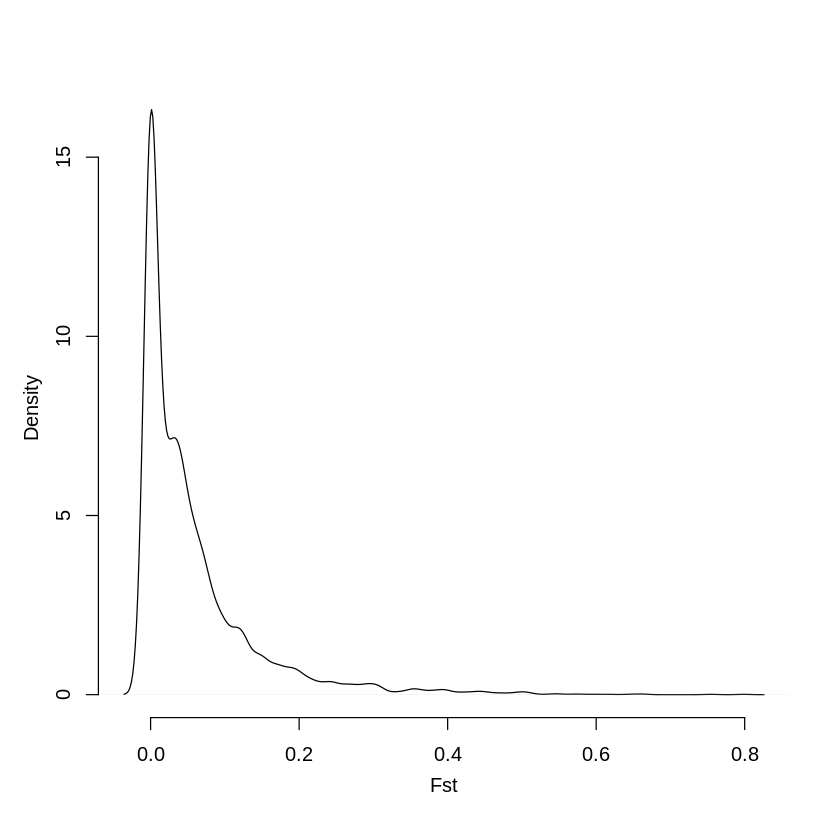

In [21]:
# Fst density
jitter=0
#jitter=rnorm(nrow(fst01),0,0.0)
f1=fst01$a/(fst01$b+1e-3)+jitter
plot(density(f1),ylim=c(0,16),xlab="Fst",main="",mgp=c(2.3,1,0),bty="n")

In [22]:
# computing weighted Fst per gene
i=1;gfst01=c();ns01=0
pb=txtProgressBar(0,nrow(genes))
for (i in 1:nrow(genes)) {
	setTxtProgressBar(pb,i)
	sub=subset(fst01,contig==genes$contig[i] & pos>=genes$start[i] & pos<=genes$end[i])
	if (is.null(sub[1,1]) | sum(sub$b)==0) { 
		gfst01=append(gfst01,NA)
	} else {
		gfst01=append(gfst01,sum(sub$a)/sum(sub$b))
		ns01=ns01+nrow(sub)
	}
}

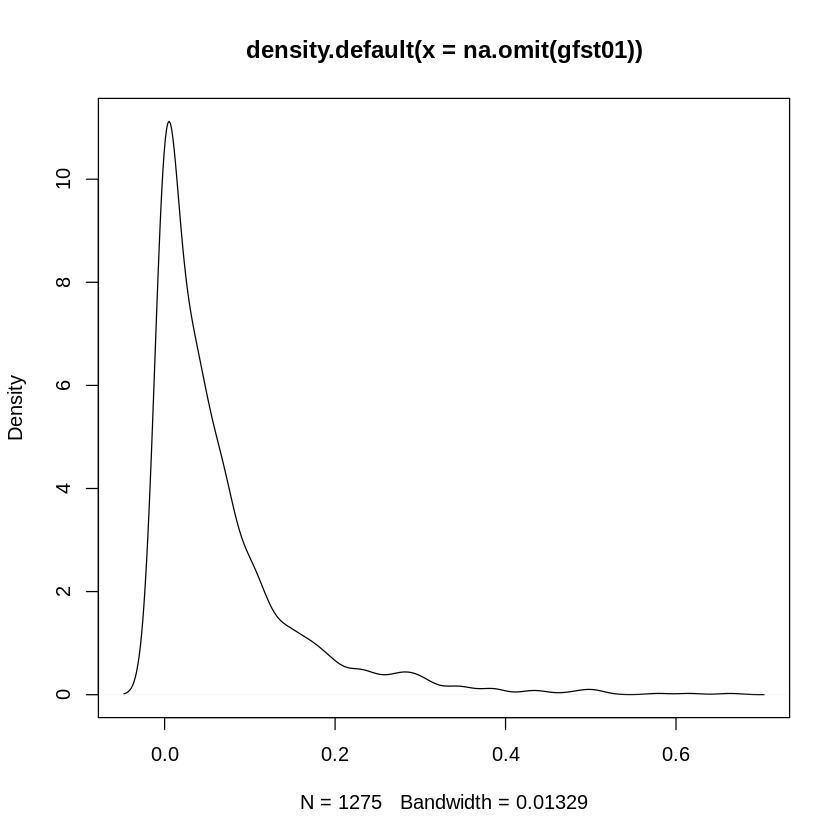

In [23]:
# density plots of per-gene Fst
plot(density(na.omit(gfst01)))

In [24]:
%expand
# adding results to genes table, saving
genes$fst01=gfst01
genes$start[which(genes$start < 1)] <- 1
head(genes[!is.na(genes$fst01),])
save(genes,file="{sfsSuf}_PerGeneFst.RData")
write.csv(genes,file="{sfsSuf}_PerGeneFst.csv",quote=F,row.names=F)

,contig,start,end,fst01
12,Contig103346,4131,18776,0.069735007
25,Contig60108,1,13731,0.121951220
35,Contig27784,1,12761,0.041095890
42,Contig38648,3515,22246,0.045340050
120,Contig282,38634,45331,0.001795332
121,Contig282,26273,42182,0.001642036


In [25]:
nrow(genes[!is.na(genes$fst01),])

[1] 1275

In [ ]:
%expand
#need to have gene names, not run yet
# saving table of per-gene Fst for GO_MWU analysis
f01=genes[,c("gene","fst01")]
f01=na.omit(f01)
nrow(f01)
write.csv(f01,file="{sfsSuf}_PerGeneFST_goMWU.csv",quote=F,row.names=F)

#### min 70% individuals

In [26]:
sfsSuf7 = "SFS/HCSS_sfsm70"

In [2]:
module load gcc/6.2.0
module load angsd/0.918

In [2]:
pwd

/scratch/t.cri.ksilliman/CommonG_cp2/2019_Mapping/ANGSD_run/HCSS


In [63]:
%expand [ ]

zcat [sfsSuf7].geno.gz | python ../../../2bRAD_denovo/HetMajorityProb.py | awk "\$6 < 0.75 {print \$1\"\\t\"\$2}" > [sfsSuf7]_aSites

In [64]:
%expand
angsd sites index {sfsSuf7}_aSites

	-> angsd version: 0.918 (htslib: 1.5) build(Aug  1 2017 16:32:01)
	-> Indexing SFS/HCSS_sfsm70_aSites and will add '0' to pos column
	-> Filterfile: SFS/HCSS_sfsm70_aSites supplied will generate binary representations... 
	-> Input file has 2 columns, chr pos
	-> Writing chr:'Contig0' 
	-> Writing chr:'Contig1' 
	-> Writing chr:'Contig2' 
	-> Writing chr:'Contig3' 
	-> Writing chr:'Contig4' 
	-> Writing chr:'Contig5' 
	-> Writing chr:'Contig6' 
	-> Writing chr:'Contig8' 
	-> Writing chr:'Contig9' 
	-> Writing chr:'Contig12' 
	-> Writing chr:'Contig13' 
	-> Writing chr:'Contig16' 
	-> Writing chr:'Contig17' 
	-> Writing chr:'Contig18' 
	-> Writing chr:'Contig21' 
	-> Writing chr:'Contig24' 
	-> Writing chr:'Contig25' 
	-> Writing chr:'Contig26' 
	-> Writing chr:'Contig28' 
	-> Writing chr:'Contig30' 
	-> Writing chr:'Contig32' 
	-> Writing chr:'Contig33' 
	-> Writing chr:'Contig35' 
	-> Writing chr:'Contig36' 
	-> Writing chr:'Contig38' 
	-> Writing chr:'Contig39' 
	-> Writing chr:'Con

	-> Writing chr:'Contig646' 
	-> Writing chr:'Contig647' 
	-> Writing chr:'Contig650' 
	-> Writing chr:'Contig651' 
	-> Writing chr:'Contig652' 
	-> Writing chr:'Contig653' 
	-> Writing chr:'Contig654' 
	-> Writing chr:'Contig659' 
	-> Writing chr:'Contig662' 
	-> Writing chr:'Contig667' 
	-> Writing chr:'Contig668' 
	-> Writing chr:'Contig676' 
	-> Writing chr:'Contig679' 
	-> Writing chr:'Contig680' 
	-> Writing chr:'Contig686' 
	-> Writing chr:'Contig688' 
	-> Writing chr:'Contig693' 
	-> Writing chr:'Contig697' 
	-> Writing chr:'Contig698' 
	-> Writing chr:'Contig705' 
	-> Writing chr:'Contig706' 
	-> Writing chr:'Contig708' 
	-> Writing chr:'Contig709' 
	-> Writing chr:'Contig711' 
	-> Writing chr:'Contig714' 
	-> Writing chr:'Contig716' 
	-> Writing chr:'Contig721' 
	-> Writing chr:'Contig726' 
	-> Writing chr:'Contig727' 
	-> Writing chr:'Contig729' 
	-> Writing chr:'Contig731' 
	-> Writing chr:'Contig733' 
	-> Writing chr:'Contig741' 
	-> Writing chr:'Contig745' 
	-> Writing ch

	-> Writing chr:'Contig1849' 
	-> Writing chr:'Contig1853' 
	-> Writing chr:'Contig1878' 
	-> Writing chr:'Contig1880' 
	-> Writing chr:'Contig1883' 
	-> Writing chr:'Contig1888' 
	-> Writing chr:'Contig1903' 
	-> Writing chr:'Contig1904' 
	-> Writing chr:'Contig1913' 
	-> Writing chr:'Contig1918' 
	-> Writing chr:'Contig1920' 
	-> Writing chr:'Contig1921' 
	-> Writing chr:'Contig1923' 
	-> Writing chr:'Contig1930' 
	-> Writing chr:'Contig1932' 
	-> Writing chr:'Contig1948' 
	-> Writing chr:'Contig1956' 
	-> Writing chr:'Contig1957' 
	-> Writing chr:'Contig1960' 
	-> Writing chr:'Contig1962' 
	-> Writing chr:'Contig1965' 
	-> Writing chr:'Contig1968' 
	-> Writing chr:'Contig1970' 
	-> Writing chr:'Contig1971' 
	-> Writing chr:'Contig1972' 
	-> Writing chr:'Contig1975' 
	-> Writing chr:'Contig1977' 
	-> Writing chr:'Contig1978' 
	-> Writing chr:'Contig1990' 
	-> Writing chr:'Contig1992' 
	-> Writing chr:'Contig1996' 
	-> Writing chr:'Contig2010' 
	-> Writing chr:'Contig2028' 
	-> Writin

	-> Writing chr:'Contig3656' 
	-> Writing chr:'Contig3672' 
	-> Writing chr:'Contig3684' 
	-> Writing chr:'Contig3685' 
	-> Writing chr:'Contig3703' 
	-> Writing chr:'Contig3706' 
	-> Writing chr:'Contig3709' 
	-> Writing chr:'Contig3710' 
	-> Writing chr:'Contig3712' 
	-> Writing chr:'Contig3730' 
	-> Writing chr:'Contig3742' 
	-> Writing chr:'Contig3753' 
	-> Writing chr:'Contig3764' 
	-> Writing chr:'Contig3780' 
	-> Writing chr:'Contig3781' 
	-> Writing chr:'Contig3788' 
	-> Writing chr:'Contig3847' 
	-> Writing chr:'Contig3854' 
	-> Writing chr:'Contig3859' 
	-> Writing chr:'Contig3882' 
	-> Writing chr:'Contig3887' 
	-> Writing chr:'Contig3901' 
	-> Writing chr:'Contig3913' 
	-> Writing chr:'Contig3915' 
	-> Writing chr:'Contig3917' 
	-> Writing chr:'Contig3923' 
	-> Writing chr:'Contig3926' 
	-> Writing chr:'Contig3933' 
	-> Writing chr:'Contig3937' 
	-> Writing chr:'Contig3946' 
	-> Writing chr:'Contig3949' 
	-> Writing chr:'Contig3958' 
	-> Writing chr:'Contig3960' 
	-> Writin

	-> Writing chr:'Contig6724' 
	-> Writing chr:'Contig6740' 
	-> Writing chr:'Contig6743' 
	-> Writing chr:'Contig6750' 
	-> Writing chr:'Contig6811' 
	-> Writing chr:'Contig6816' 
	-> Writing chr:'Contig6835' 
	-> Writing chr:'Contig6837' 
	-> Writing chr:'Contig6865' 
	-> Writing chr:'Contig6919' 
	-> Writing chr:'Contig6933' 
	-> Writing chr:'Contig6938' 
	-> Writing chr:'Contig6967' 
	-> Writing chr:'Contig6996' 
	-> Writing chr:'Contig7029' 
	-> Writing chr:'Contig7040' 
	-> Writing chr:'Contig7044' 
	-> Writing chr:'Contig7067' 
	-> Writing chr:'Contig7072' 
	-> Writing chr:'Contig7079' 
	-> Writing chr:'Contig7103' 
	-> Writing chr:'Contig7105' 
	-> Writing chr:'Contig7127' 
	-> Writing chr:'Contig7154' 
	-> Writing chr:'Contig7176' 
	-> Writing chr:'Contig7208' 
	-> Writing chr:'Contig7223' 
	-> Writing chr:'Contig7227' 
	-> Writing chr:'Contig7235' 
	-> Writing chr:'Contig7237' 
	-> Writing chr:'Contig7268' 
	-> Writing chr:'Contig7303' 
	-> Writing chr:'Contig7308' 
	-> Writin

	-> Writing chr:'Contig15944' 
	-> Writing chr:'Contig15960' 
	-> Writing chr:'Contig15964' 
	-> Writing chr:'Contig15966' 
	-> Writing chr:'Contig15977' 
	-> Writing chr:'Contig15981' 
	-> Writing chr:'Contig15998' 
	-> Writing chr:'Contig16024' 
	-> Writing chr:'Contig16063' 
	-> Writing chr:'Contig16065' 
	-> Writing chr:'Contig16068' 
	-> Writing chr:'Contig16072' 
	-> Writing chr:'Contig16083' 
	-> Writing chr:'Contig16089' 
	-> Writing chr:'Contig16118' 
	-> Writing chr:'Contig16119' 
	-> Writing chr:'Contig16135' 
	-> Writing chr:'Contig16148' 
	-> Writing chr:'Contig16168' 
	-> Writing chr:'Contig16187' 
	-> Writing chr:'Contig16202' 
	-> Writing chr:'Contig16203' 
	-> Writing chr:'Contig16217' 
	-> Writing chr:'Contig16222' 
	-> Writing chr:'Contig16224' 
	-> Writing chr:'Contig16234' 
	-> Writing chr:'Contig16236' 
	-> Writing chr:'Contig16238' 
	-> Writing chr:'Contig16240' 
	-> Writing chr:'Contig16263' 
	-> Writing chr:'Contig16266' 
	-> Writing chr:'Contig16279' 
	-> Writ

	-> Writing chr:'Contig18246' 
	-> Writing chr:'Contig18248' 
	-> Writing chr:'Contig18274' 
	-> Writing chr:'Contig18275' 
	-> Writing chr:'Contig18277' 
	-> Writing chr:'Contig18279' 
	-> Writing chr:'Contig18286' 
	-> Writing chr:'Contig18289' 
	-> Writing chr:'Contig18290' 
	-> Writing chr:'Contig18298' 
	-> Writing chr:'Contig18304' 
	-> Writing chr:'Contig18310' 
	-> Writing chr:'Contig18331' 
	-> Writing chr:'Contig18359' 
	-> Writing chr:'Contig18367' 
	-> Writing chr:'Contig18372' 
	-> Writing chr:'Contig18373' 
	-> Writing chr:'Contig18403' 
	-> Writing chr:'Contig18408' 
	-> Writing chr:'Contig18411' 
	-> Writing chr:'Contig18417' 
	-> Writing chr:'Contig18424' 
	-> Writing chr:'Contig18485' 
	-> Writing chr:'Contig18487' 
	-> Writing chr:'Contig18488' 
	-> Writing chr:'Contig18492' 
	-> Writing chr:'Contig18493' 
	-> Writing chr:'Contig18494' 
	-> Writing chr:'Contig18498' 
	-> Writing chr:'Contig18500' 
	-> Writing chr:'Contig18505' 
	-> Writing chr:'Contig18511' 
	-> Writ

	-> Writing chr:'Contig20556' 
	-> Writing chr:'Contig20577' 
	-> Writing chr:'Contig20595' 
	-> Writing chr:'Contig20602' 
	-> Writing chr:'Contig20605' 
	-> Writing chr:'Contig20635' 
	-> Writing chr:'Contig20639' 
	-> Writing chr:'Contig20656' 
	-> Writing chr:'Contig20676' 
	-> Writing chr:'Contig20683' 
	-> Writing chr:'Contig20686' 
	-> Writing chr:'Contig20709' 
	-> Writing chr:'Contig20713' 
	-> Writing chr:'Contig20724' 
	-> Writing chr:'Contig20760' 
	-> Writing chr:'Contig20783' 
	-> Writing chr:'Contig20788' 
	-> Writing chr:'Contig20792' 
	-> Writing chr:'Contig20799' 
	-> Writing chr:'Contig20801' 
	-> Writing chr:'Contig20808' 
	-> Writing chr:'Contig20839' 
	-> Writing chr:'Contig20849' 
	-> Writing chr:'Contig20863' 
	-> Writing chr:'Contig20865' 
	-> Writing chr:'Contig20866' 
	-> Writing chr:'Contig20872' 
	-> Writing chr:'Contig20880' 
	-> Writing chr:'Contig20883' 
	-> Writing chr:'Contig20885' 
	-> Writing chr:'Contig20886' 
	-> Writing chr:'Contig20894' 
	-> Writ

	-> Writing chr:'Contig22822' 
	-> Writing chr:'Contig22825' 
	-> Writing chr:'Contig22841' 
	-> Writing chr:'Contig22845' 
	-> Writing chr:'Contig22847' 
	-> Writing chr:'Contig22864' 
	-> Writing chr:'Contig22865' 
	-> Writing chr:'Contig22880' 
	-> Writing chr:'Contig22903' 
	-> Writing chr:'Contig22910' 
	-> Writing chr:'Contig22911' 
	-> Writing chr:'Contig22920' 
	-> Writing chr:'Contig22921' 
	-> Writing chr:'Contig22935' 
	-> Writing chr:'Contig22942' 
	-> Writing chr:'Contig22946' 
	-> Writing chr:'Contig22954' 
	-> Writing chr:'Contig22955' 
	-> Writing chr:'Contig22957' 
	-> Writing chr:'Contig22966' 
	-> Writing chr:'Contig22978' 
	-> Writing chr:'Contig23002' 
	-> Writing chr:'Contig23003' 
	-> Writing chr:'Contig23006' 
	-> Writing chr:'Contig23007' 
	-> Writing chr:'Contig23014' 
	-> Writing chr:'Contig23042' 
	-> Writing chr:'Contig23045' 
	-> Writing chr:'Contig23059' 
	-> Writing chr:'Contig23060' 
	-> Writing chr:'Contig23063' 
	-> Writing chr:'Contig23072' 
	-> Writ

	-> Writing chr:'Contig24945' 
	-> Writing chr:'Contig24952' 
	-> Writing chr:'Contig24967' 
	-> Writing chr:'Contig24969' 
	-> Writing chr:'Contig25003' 
	-> Writing chr:'Contig25015' 
	-> Writing chr:'Contig25029' 
	-> Writing chr:'Contig25030' 
	-> Writing chr:'Contig25050' 
	-> Writing chr:'Contig25062' 
	-> Writing chr:'Contig25068' 
	-> Writing chr:'Contig25074' 
	-> Writing chr:'Contig25092' 
	-> Writing chr:'Contig25094' 
	-> Writing chr:'Contig25104' 
	-> Writing chr:'Contig25106' 
	-> Writing chr:'Contig25118' 
	-> Writing chr:'Contig25131' 
	-> Writing chr:'Contig25152' 
	-> Writing chr:'Contig25159' 
	-> Writing chr:'Contig25164' 
	-> Writing chr:'Contig25168' 
	-> Writing chr:'Contig25177' 
	-> Writing chr:'Contig25187' 
	-> Writing chr:'Contig25189' 
	-> Writing chr:'Contig25194' 
	-> Writing chr:'Contig25202' 
	-> Writing chr:'Contig25204' 
	-> Writing chr:'Contig25214' 
	-> Writing chr:'Contig25228' 
	-> Writing chr:'Contig25236' 
	-> Writing chr:'Contig25242' 
	-> Writ

	-> Writing chr:'Contig27041' 
	-> Writing chr:'Contig27042' 
	-> Writing chr:'Contig27047' 
	-> Writing chr:'Contig27063' 
	-> Writing chr:'Contig27065' 
	-> Writing chr:'Contig27075' 
	-> Writing chr:'Contig27080' 
	-> Writing chr:'Contig27085' 
	-> Writing chr:'Contig27088' 
	-> Writing chr:'Contig27104' 
	-> Writing chr:'Contig27105' 
	-> Writing chr:'Contig27106' 
	-> Writing chr:'Contig27109' 
	-> Writing chr:'Contig27122' 
	-> Writing chr:'Contig27132' 
	-> Writing chr:'Contig27134' 
	-> Writing chr:'Contig27138' 
	-> Writing chr:'Contig27145' 
	-> Writing chr:'Contig27153' 
	-> Writing chr:'Contig27156' 
	-> Writing chr:'Contig27187' 
	-> Writing chr:'Contig27188' 
	-> Writing chr:'Contig27222' 
	-> Writing chr:'Contig27232' 
	-> Writing chr:'Contig27235' 
	-> Writing chr:'Contig27255' 
	-> Writing chr:'Contig27264' 
	-> Writing chr:'Contig27280' 
	-> Writing chr:'Contig27290' 
	-> Writing chr:'Contig27307' 
	-> Writing chr:'Contig27312' 
	-> Writing chr:'Contig27315' 
	-> Writ

	-> Writing chr:'Contig29647' 
	-> Writing chr:'Contig29651' 
	-> Writing chr:'Contig29665' 
	-> Writing chr:'Contig29675' 
	-> Writing chr:'Contig29691' 
	-> Writing chr:'Contig29704' 
	-> Writing chr:'Contig29705' 
	-> Writing chr:'Contig29712' 
	-> Writing chr:'Contig29713' 
	-> Writing chr:'Contig29717' 
	-> Writing chr:'Contig29736' 
	-> Writing chr:'Contig29738' 
	-> Writing chr:'Contig29744' 
	-> Writing chr:'Contig29750' 
	-> Writing chr:'Contig29751' 
	-> Writing chr:'Contig29762' 
	-> Writing chr:'Contig29774' 
	-> Writing chr:'Contig29790' 
	-> Writing chr:'Contig29807' 
	-> Writing chr:'Contig29812' 
	-> Writing chr:'Contig29826' 
	-> Writing chr:'Contig29834' 
	-> Writing chr:'Contig29857' 
	-> Writing chr:'Contig29869' 
	-> Writing chr:'Contig29875' 
	-> Writing chr:'Contig29876' 
	-> Writing chr:'Contig29877' 
	-> Writing chr:'Contig29878' 
	-> Writing chr:'Contig29888' 
	-> Writing chr:'Contig29893' 
	-> Writing chr:'Contig29897' 
	-> Writing chr:'Contig29914' 
	-> Writ

	-> Writing chr:'Contig31998' 
	-> Writing chr:'Contig32006' 
	-> Writing chr:'Contig32012' 
	-> Writing chr:'Contig32033' 
	-> Writing chr:'Contig32040' 
	-> Writing chr:'Contig32048' 
	-> Writing chr:'Contig32061' 
	-> Writing chr:'Contig32065' 
	-> Writing chr:'Contig32069' 
	-> Writing chr:'Contig32074' 
	-> Writing chr:'Contig32080' 
	-> Writing chr:'Contig32151' 
	-> Writing chr:'Contig32160' 
	-> Writing chr:'Contig32164' 
	-> Writing chr:'Contig32182' 
	-> Writing chr:'Contig32187' 
	-> Writing chr:'Contig32195' 
	-> Writing chr:'Contig32198' 
	-> Writing chr:'Contig32206' 
	-> Writing chr:'Contig32207' 
	-> Writing chr:'Contig32208' 
	-> Writing chr:'Contig32218' 
	-> Writing chr:'Contig32225' 
	-> Writing chr:'Contig32229' 
	-> Writing chr:'Contig32235' 
	-> Writing chr:'Contig32237' 
	-> Writing chr:'Contig32259' 
	-> Writing chr:'Contig32264' 
	-> Writing chr:'Contig32279' 
	-> Writing chr:'Contig32294' 
	-> Writing chr:'Contig32306' 
	-> Writing chr:'Contig32327' 
	-> Writ

	-> Writing chr:'Contig34537' 
	-> Writing chr:'Contig34544' 
	-> Writing chr:'Contig34556' 
	-> Writing chr:'Contig34561' 
	-> Writing chr:'Contig34570' 
	-> Writing chr:'Contig34583' 
	-> Writing chr:'Contig34592' 
	-> Writing chr:'Contig34595' 
	-> Writing chr:'Contig34597' 
	-> Writing chr:'Contig34604' 
	-> Writing chr:'Contig34608' 
	-> Writing chr:'Contig34610' 
	-> Writing chr:'Contig34615' 
	-> Writing chr:'Contig34625' 
	-> Writing chr:'Contig34632' 
	-> Writing chr:'Contig34643' 
	-> Writing chr:'Contig34655' 
	-> Writing chr:'Contig34665' 
	-> Writing chr:'Contig34676' 
	-> Writing chr:'Contig34687' 
	-> Writing chr:'Contig34689' 
	-> Writing chr:'Contig34693' 
	-> Writing chr:'Contig34696' 
	-> Writing chr:'Contig34703' 
	-> Writing chr:'Contig34704' 
	-> Writing chr:'Contig34727' 
	-> Writing chr:'Contig34755' 
	-> Writing chr:'Contig34758' 
	-> Writing chr:'Contig34773' 
	-> Writing chr:'Contig34774' 
	-> Writing chr:'Contig34776' 
	-> Writing chr:'Contig34801' 
	-> Writ

	-> Writing chr:'Contig36958' 
	-> Writing chr:'Contig36962' 
	-> Writing chr:'Contig36963' 
	-> Writing chr:'Contig36973' 
	-> Writing chr:'Contig36989' 
	-> Writing chr:'Contig36997' 
	-> Writing chr:'Contig37000' 
	-> Writing chr:'Contig37003' 
	-> Writing chr:'Contig37018' 
	-> Writing chr:'Contig37020' 
	-> Writing chr:'Contig37025' 
	-> Writing chr:'Contig37058' 
	-> Writing chr:'Contig37068' 
	-> Writing chr:'Contig37069' 
	-> Writing chr:'Contig37077' 
	-> Writing chr:'Contig37091' 
	-> Writing chr:'Contig37093' 
	-> Writing chr:'Contig37097' 
	-> Writing chr:'Contig37110' 
	-> Writing chr:'Contig37114' 
	-> Writing chr:'Contig37121' 
	-> Writing chr:'Contig37135' 
	-> Writing chr:'Contig37146' 
	-> Writing chr:'Contig37149' 
	-> Writing chr:'Contig37152' 
	-> Writing chr:'Contig37154' 
	-> Writing chr:'Contig37162' 
	-> Writing chr:'Contig37182' 
	-> Writing chr:'Contig37183' 
	-> Writing chr:'Contig37186' 
	-> Writing chr:'Contig37187' 
	-> Writing chr:'Contig37208' 
	-> Writ

	-> Writing chr:'Contig39581' 
	-> Writing chr:'Contig39586' 
	-> Writing chr:'Contig39605' 
	-> Writing chr:'Contig39607' 
	-> Writing chr:'Contig39613' 
	-> Writing chr:'Contig39616' 
	-> Writing chr:'Contig39650' 
	-> Writing chr:'Contig39656' 
	-> Writing chr:'Contig39661' 
	-> Writing chr:'Contig39677' 
	-> Writing chr:'Contig39688' 
	-> Writing chr:'Contig39703' 
	-> Writing chr:'Contig39715' 
	-> Writing chr:'Contig39719' 
	-> Writing chr:'Contig39720' 
	-> Writing chr:'Contig39723' 
	-> Writing chr:'Contig39730' 
	-> Writing chr:'Contig39733' 
	-> Writing chr:'Contig39736' 
	-> Writing chr:'Contig39759' 
	-> Writing chr:'Contig39782' 
	-> Writing chr:'Contig39792' 
	-> Writing chr:'Contig39793' 
	-> Writing chr:'Contig39796' 
	-> Writing chr:'Contig39798' 
	-> Writing chr:'Contig39801' 
	-> Writing chr:'Contig39810' 
	-> Writing chr:'Contig39812' 
	-> Writing chr:'Contig39830' 
	-> Writing chr:'Contig39831' 
	-> Writing chr:'Contig39862' 
	-> Writing chr:'Contig39871' 
	-> Writ

	-> Writing chr:'Contig42291' 
	-> Writing chr:'Contig42306' 
	-> Writing chr:'Contig42328' 
	-> Writing chr:'Contig42337' 
	-> Writing chr:'Contig42357' 
	-> Writing chr:'Contig42358' 
	-> Writing chr:'Contig42368' 
	-> Writing chr:'Contig42387' 
	-> Writing chr:'Contig42393' 
	-> Writing chr:'Contig42395' 
	-> Writing chr:'Contig42399' 
	-> Writing chr:'Contig42401' 
	-> Writing chr:'Contig42412' 
	-> Writing chr:'Contig42415' 
	-> Writing chr:'Contig42417' 
	-> Writing chr:'Contig42441' 
	-> Writing chr:'Contig42447' 
	-> Writing chr:'Contig42451' 
	-> Writing chr:'Contig42459' 
	-> Writing chr:'Contig42461' 
	-> Writing chr:'Contig42482' 
	-> Writing chr:'Contig42493' 
	-> Writing chr:'Contig42496' 
	-> Writing chr:'Contig42502' 
	-> Writing chr:'Contig42521' 
	-> Writing chr:'Contig42546' 
	-> Writing chr:'Contig42553' 
	-> Writing chr:'Contig42563' 
	-> Writing chr:'Contig42578' 
	-> Writing chr:'Contig42579' 
	-> Writing chr:'Contig42590' 
	-> Writing chr:'Contig42596' 
	-> Writ

	-> Writing chr:'Contig45189' 
	-> Writing chr:'Contig45201' 
	-> Writing chr:'Contig45204' 
	-> Writing chr:'Contig45206' 
	-> Writing chr:'Contig45217' 
	-> Writing chr:'Contig45237' 
	-> Writing chr:'Contig45243' 
	-> Writing chr:'Contig45254' 
	-> Writing chr:'Contig45282' 
	-> Writing chr:'Contig45286' 
	-> Writing chr:'Contig45294' 
	-> Writing chr:'Contig45306' 
	-> Writing chr:'Contig45321' 
	-> Writing chr:'Contig45331' 
	-> Writing chr:'Contig45351' 
	-> Writing chr:'Contig45357' 
	-> Writing chr:'Contig45359' 
	-> Writing chr:'Contig45392' 
	-> Writing chr:'Contig45395' 
	-> Writing chr:'Contig45399' 
	-> Writing chr:'Contig45404' 
	-> Writing chr:'Contig45415' 
	-> Writing chr:'Contig45429' 
	-> Writing chr:'Contig45439' 
	-> Writing chr:'Contig45452' 
	-> Writing chr:'Contig45457' 
	-> Writing chr:'Contig45462' 
	-> Writing chr:'Contig45468' 
	-> Writing chr:'Contig45472' 
	-> Writing chr:'Contig45484' 
	-> Writing chr:'Contig45486' 
	-> Writing chr:'Contig45491' 
	-> Writ

	-> Writing chr:'Contig48199' 
	-> Writing chr:'Contig48222' 
	-> Writing chr:'Contig48234' 
	-> Writing chr:'Contig48237' 
	-> Writing chr:'Contig48259' 
	-> Writing chr:'Contig48270' 
	-> Writing chr:'Contig48289' 
	-> Writing chr:'Contig48308' 
	-> Writing chr:'Contig48311' 
	-> Writing chr:'Contig48346' 
	-> Writing chr:'Contig48374' 
	-> Writing chr:'Contig48385' 
	-> Writing chr:'Contig48397' 
	-> Writing chr:'Contig48409' 
	-> Writing chr:'Contig48410' 
	-> Writing chr:'Contig48417' 
	-> Writing chr:'Contig48425' 
	-> Writing chr:'Contig48426' 
	-> Writing chr:'Contig48438' 
	-> Writing chr:'Contig48440' 
	-> Writing chr:'Contig48445' 
	-> Writing chr:'Contig48455' 
	-> Writing chr:'Contig48464' 
	-> Writing chr:'Contig48475' 
	-> Writing chr:'Contig48482' 
	-> Writing chr:'Contig48500' 
	-> Writing chr:'Contig48543' 
	-> Writing chr:'Contig48566' 
	-> Writing chr:'Contig48578' 
	-> Writing chr:'Contig48580' 
	-> Writing chr:'Contig48597' 
	-> Writing chr:'Contig48625' 
	-> Writ

	-> Writing chr:'Contig51282' 
	-> Writing chr:'Contig51301' 
	-> Writing chr:'Contig51325' 
	-> Writing chr:'Contig51332' 
	-> Writing chr:'Contig51344' 
	-> Writing chr:'Contig51365' 
	-> Writing chr:'Contig51375' 
	-> Writing chr:'Contig51428' 
	-> Writing chr:'Contig51436' 
	-> Writing chr:'Contig51475' 
	-> Writing chr:'Contig51491' 
	-> Writing chr:'Contig51506' 
	-> Writing chr:'Contig51516' 
	-> Writing chr:'Contig51519' 
	-> Writing chr:'Contig51525' 
	-> Writing chr:'Contig51558' 
	-> Writing chr:'Contig51566' 
	-> Writing chr:'Contig51579' 
	-> Writing chr:'Contig51582' 
	-> Writing chr:'Contig51593' 
	-> Writing chr:'Contig51597' 
	-> Writing chr:'Contig51627' 
	-> Writing chr:'Contig51635' 
	-> Writing chr:'Contig51643' 
	-> Writing chr:'Contig51649' 
	-> Writing chr:'Contig51653' 
	-> Writing chr:'Contig51660' 
	-> Writing chr:'Contig51693' 
	-> Writing chr:'Contig51710' 
	-> Writing chr:'Contig51711' 
	-> Writing chr:'Contig51721' 
	-> Writing chr:'Contig51740' 
	-> Writ

	-> Writing chr:'Contig54853' 
	-> Writing chr:'Contig54859' 
	-> Writing chr:'Contig54867' 
	-> Writing chr:'Contig54883' 
	-> Writing chr:'Contig54923' 
	-> Writing chr:'Contig54949' 
	-> Writing chr:'Contig54957' 
	-> Writing chr:'Contig54963' 
	-> Writing chr:'Contig54965' 
	-> Writing chr:'Contig54975' 
	-> Writing chr:'Contig54982' 
	-> Writing chr:'Contig54984' 
	-> Writing chr:'Contig54999' 
	-> Writing chr:'Contig55010' 
	-> Writing chr:'Contig55018' 
	-> Writing chr:'Contig55022' 
	-> Writing chr:'Contig55023' 
	-> Writing chr:'Contig55028' 
	-> Writing chr:'Contig55035' 
	-> Writing chr:'Contig55040' 
	-> Writing chr:'Contig55082' 
	-> Writing chr:'Contig55084' 
	-> Writing chr:'Contig55091' 
	-> Writing chr:'Contig55099' 
	-> Writing chr:'Contig55115' 
	-> Writing chr:'Contig55120' 
	-> Writing chr:'Contig55126' 
	-> Writing chr:'Contig55130' 
	-> Writing chr:'Contig55218' 
	-> Writing chr:'Contig55228' 
	-> Writing chr:'Contig55237' 
	-> Writing chr:'Contig55240' 
	-> Writ

	-> Writing chr:'Contig58591' 
	-> Writing chr:'Contig58596' 
	-> Writing chr:'Contig58620' 
	-> Writing chr:'Contig58623' 
	-> Writing chr:'Contig58653' 
	-> Writing chr:'Contig58678' 
	-> Writing chr:'Contig58697' 
	-> Writing chr:'Contig58702' 
	-> Writing chr:'Contig58733' 
	-> Writing chr:'Contig58771' 
	-> Writing chr:'Contig58776' 
	-> Writing chr:'Contig58777' 
	-> Writing chr:'Contig58782' 
	-> Writing chr:'Contig58793' 
	-> Writing chr:'Contig58806' 
	-> Writing chr:'Contig58815' 
	-> Writing chr:'Contig58816' 
	-> Writing chr:'Contig58864' 
	-> Writing chr:'Contig58879' 
	-> Writing chr:'Contig58916' 
	-> Writing chr:'Contig58920' 
	-> Writing chr:'Contig58924' 
	-> Writing chr:'Contig58929' 
	-> Writing chr:'Contig58931' 
	-> Writing chr:'Contig58958' 
	-> Writing chr:'Contig58959' 
	-> Writing chr:'Contig58976' 
	-> Writing chr:'Contig59002' 
	-> Writing chr:'Contig59006' 
	-> Writing chr:'Contig59014' 
	-> Writing chr:'Contig59018' 
	-> Writing chr:'Contig59029' 
	-> Writ

	-> Writing chr:'Contig62398' 
	-> Writing chr:'Contig62436' 
	-> Writing chr:'Contig62441' 
	-> Writing chr:'Contig62442' 
	-> Writing chr:'Contig62455' 
	-> Writing chr:'Contig62471' 
	-> Writing chr:'Contig62477' 
	-> Writing chr:'Contig62490' 
	-> Writing chr:'Contig62578' 
	-> Writing chr:'Contig62582' 
	-> Writing chr:'Contig62585' 
	-> Writing chr:'Contig62593' 
	-> Writing chr:'Contig62613' 
	-> Writing chr:'Contig62622' 
	-> Writing chr:'Contig62624' 
	-> Writing chr:'Contig62625' 
	-> Writing chr:'Contig62628' 
	-> Writing chr:'Contig62637' 
	-> Writing chr:'Contig62675' 
	-> Writing chr:'Contig62682' 
	-> Writing chr:'Contig62687' 
	-> Writing chr:'Contig62689' 
	-> Writing chr:'Contig62695' 
	-> Writing chr:'Contig62707' 
	-> Writing chr:'Contig62736' 
	-> Writing chr:'Contig62738' 
	-> Writing chr:'Contig62739' 
	-> Writing chr:'Contig62757' 
	-> Writing chr:'Contig62765' 
	-> Writing chr:'Contig62800' 
	-> Writing chr:'Contig62843' 
	-> Writing chr:'Contig62867' 
	-> Writ

	-> Writing chr:'Contig66812' 
	-> Writing chr:'Contig66831' 
	-> Writing chr:'Contig66959' 
	-> Writing chr:'Contig66971' 
	-> Writing chr:'Contig67017' 
	-> Writing chr:'Contig67027' 
	-> Writing chr:'Contig67029' 
	-> Writing chr:'Contig67030' 
	-> Writing chr:'Contig67031' 
	-> Writing chr:'Contig67064' 
	-> Writing chr:'Contig67091' 
	-> Writing chr:'Contig67183' 
	-> Writing chr:'Contig67201' 
	-> Writing chr:'Contig67207' 
	-> Writing chr:'Contig67212' 
	-> Writing chr:'Contig67233' 
	-> Writing chr:'Contig67281' 
	-> Writing chr:'Contig67288' 
	-> Writing chr:'Contig67307' 
	-> Writing chr:'Contig67339' 
	-> Writing chr:'Contig67351' 
	-> Writing chr:'Contig67365' 
	-> Writing chr:'Contig67379' 
	-> Writing chr:'Contig67384' 
	-> Writing chr:'Contig67442' 
	-> Writing chr:'Contig67461' 
	-> Writing chr:'Contig67469' 
	-> Writing chr:'Contig67481' 
	-> Writing chr:'Contig67513' 
	-> Writing chr:'Contig67524' 
	-> Writing chr:'Contig67541' 
	-> Writing chr:'Contig67543' 
	-> Writ

	-> Writing chr:'Contig72098' 
	-> Writing chr:'Contig72102' 
	-> Writing chr:'Contig72135' 
	-> Writing chr:'Contig72146' 
	-> Writing chr:'Contig72166' 
	-> Writing chr:'Contig72174' 
	-> Writing chr:'Contig72183' 
	-> Writing chr:'Contig72186' 
	-> Writing chr:'Contig72206' 
	-> Writing chr:'Contig72207' 
	-> Writing chr:'Contig72210' 
	-> Writing chr:'Contig72226' 
	-> Writing chr:'Contig72245' 
	-> Writing chr:'Contig72294' 
	-> Writing chr:'Contig72295' 
	-> Writing chr:'Contig72298' 
	-> Writing chr:'Contig72331' 
	-> Writing chr:'Contig72333' 
	-> Writing chr:'Contig72349' 
	-> Writing chr:'Contig72350' 
	-> Writing chr:'Contig72353' 
	-> Writing chr:'Contig72426' 
	-> Writing chr:'Contig72453' 
	-> Writing chr:'Contig72457' 
	-> Writing chr:'Contig72537' 
	-> Writing chr:'Contig72559' 
	-> Writing chr:'Contig72577' 
	-> Writing chr:'Contig72606' 
	-> Writing chr:'Contig72644' 
	-> Writing chr:'Contig72661' 
	-> Writing chr:'Contig72706' 
	-> Writing chr:'Contig72751' 
	-> Writ

	-> Writing chr:'Contig78422' 
	-> Writing chr:'Contig78451' 
	-> Writing chr:'Contig78492' 
	-> Writing chr:'Contig78505' 
	-> Writing chr:'Contig78508' 
	-> Writing chr:'Contig78609' 
	-> Writing chr:'Contig78627' 
	-> Writing chr:'Contig78628' 
	-> Writing chr:'Contig78640' 
	-> Writing chr:'Contig78654' 
	-> Writing chr:'Contig78668' 
	-> Writing chr:'Contig78674' 
	-> Writing chr:'Contig78682' 
	-> Writing chr:'Contig78708' 
	-> Writing chr:'Contig78720' 
	-> Writing chr:'Contig78733' 
	-> Writing chr:'Contig78737' 
	-> Writing chr:'Contig78738' 
	-> Writing chr:'Contig78750' 
	-> Writing chr:'Contig78757' 
	-> Writing chr:'Contig78766' 
	-> Writing chr:'Contig78819' 
	-> Writing chr:'Contig78834' 
	-> Writing chr:'Contig78862' 
	-> Writing chr:'Contig78899' 
	-> Writing chr:'Contig78901' 
	-> Writing chr:'Contig78902' 
	-> Writing chr:'Contig78926' 
	-> Writing chr:'Contig78971' 
	-> Writing chr:'Contig79033' 
	-> Writing chr:'Contig79035' 
	-> Writing chr:'Contig79036' 
	-> Writ

	-> Writing chr:'Contig84678' 
	-> Writing chr:'Contig84688' 
	-> Writing chr:'Contig84784' 
	-> Writing chr:'Contig84821' 
	-> Writing chr:'Contig84826' 
	-> Writing chr:'Contig84846' 
	-> Writing chr:'Contig84850' 
	-> Writing chr:'Contig84864' 
	-> Writing chr:'Contig84870' 
	-> Writing chr:'Contig84921' 
	-> Writing chr:'Contig84936' 
	-> Writing chr:'Contig84958' 
	-> Writing chr:'Contig84962' 
	-> Writing chr:'Contig84975' 
	-> Writing chr:'Contig84994' 
	-> Writing chr:'Contig85016' 
	-> Writing chr:'Contig85078' 
	-> Writing chr:'Contig85152' 
	-> Writing chr:'Contig85159' 
	-> Writing chr:'Contig85207' 
	-> Writing chr:'Contig85313' 
	-> Writing chr:'Contig85316' 
	-> Writing chr:'Contig85334' 
	-> Writing chr:'Contig85362' 
	-> Writing chr:'Contig85415' 
	-> Writing chr:'Contig85431' 
	-> Writing chr:'Contig85449' 
	-> Writing chr:'Contig85469' 
	-> Writing chr:'Contig85481' 
	-> Writing chr:'Contig85488' 
	-> Writing chr:'Contig85507' 
	-> Writing chr:'Contig85540' 
	-> Writ

	-> Writing chr:'Contig93727' 
	-> Writing chr:'Contig93748' 
	-> Writing chr:'Contig93826' 
	-> Writing chr:'Contig93828' 
	-> Writing chr:'Contig93866' 
	-> Writing chr:'Contig93922' 
	-> Writing chr:'Contig93941' 
	-> Writing chr:'Contig93943' 
	-> Writing chr:'Contig93977' 
	-> Writing chr:'Contig94004' 
	-> Writing chr:'Contig94017' 
	-> Writing chr:'Contig94060' 
	-> Writing chr:'Contig94088' 
	-> Writing chr:'Contig94106' 
	-> Writing chr:'Contig94113' 
	-> Writing chr:'Contig94120' 
	-> Writing chr:'Contig94127' 
	-> Writing chr:'Contig94143' 
	-> Writing chr:'Contig94162' 
	-> Writing chr:'Contig94165' 
	-> Writing chr:'Contig94231' 
	-> Writing chr:'Contig94248' 
	-> Writing chr:'Contig94284' 
	-> Writing chr:'Contig94368' 
	-> Writing chr:'Contig94394' 
	-> Writing chr:'Contig94400' 
	-> Writing chr:'Contig94549' 
	-> Writing chr:'Contig94550' 
	-> Writing chr:'Contig94705' 
	-> Writing chr:'Contig94735' 
	-> Writing chr:'Contig94830' 
	-> Writing chr:'Contig94844' 
	-> Writ

	-> Writing chr:'Contig102559' 
	-> Writing chr:'Contig102596' 
	-> Writing chr:'Contig102607' 
	-> Writing chr:'Contig102626' 
	-> Writing chr:'Contig102656' 
	-> Writing chr:'Contig102745' 
	-> Writing chr:'Contig102752' 
	-> Writing chr:'Contig102773' 
	-> Writing chr:'Contig102827' 
	-> Writing chr:'Contig102828' 
	-> Writing chr:'Contig102836' 
	-> Writing chr:'Contig102876' 
	-> Writing chr:'Contig102881' 
	-> Writing chr:'Contig102976' 
	-> Writing chr:'Contig103008' 
	-> Writing chr:'Contig103017' 
	-> Writing chr:'Contig103051' 
	-> Writing chr:'Contig103053' 
	-> Writing chr:'Contig103088' 
	-> Writing chr:'Contig103122' 
	-> Writing chr:'Contig103223' 
	-> Writing chr:'Contig103275' 
	-> Writing chr:'Contig103298' 
	-> Writing chr:'Contig103346' 
	-> Writing chr:'Contig103362' 
	-> Writing chr:'Contig103381' 
	-> Writing chr:'Contig103430' 
	-> Writing chr:'Contig103464' 
	-> Writing chr:'Contig103485' 
	-> Writing chr:'Contig103493' 
	-> Writing chr:'Contig103507' 
	-> Writ

	-> Writing chr:'Contig112756' 
	-> Writing chr:'Contig112823' 
	-> Writing chr:'Contig112828' 
	-> Writing chr:'Contig112833' 
	-> Writing chr:'Contig112883' 
	-> Writing chr:'Contig112897' 
	-> Writing chr:'Contig112924' 
	-> Writing chr:'Contig112951' 
	-> Writing chr:'Contig112997' 
	-> Writing chr:'Contig113034' 
	-> Writing chr:'Contig113037' 
	-> Writing chr:'Contig113117' 
	-> Writing chr:'Contig113120' 
	-> Writing chr:'Contig113131' 
	-> Writing chr:'Contig113171' 
	-> Writing chr:'Contig113243' 
	-> Writing chr:'Contig113325' 
	-> Writing chr:'Contig113385' 
	-> Writing chr:'Contig113403' 
	-> Writing chr:'Contig113478' 
	-> Writing chr:'Contig113540' 
	-> Writing chr:'Contig113554' 
	-> Writing chr:'Contig113558' 
	-> Writing chr:'Contig113571' 
	-> Writing chr:'Contig113630' 
	-> Writing chr:'Contig113729' 
	-> Writing chr:'Contig113949' 
	-> Writing chr:'Contig114192' 
	-> Writing chr:'Contig114193' 
	-> Writing chr:'Contig114411' 
	-> Writing chr:'Contig114535' 
	-> Writ

	-> Writing chr:'Contig128791' 
	-> Writing chr:'Contig128823' 
	-> Writing chr:'Contig128882' 
	-> Writing chr:'Contig128883' 
	-> Writing chr:'Contig128905' 
	-> Writing chr:'Contig128962' 
	-> Writing chr:'Contig128992' 
	-> Writing chr:'Contig129024' 
	-> Writing chr:'Contig129028' 
	-> Writing chr:'Contig129063' 
	-> Writing chr:'Contig129267' 
	-> Writing chr:'Contig129409' 
	-> Writing chr:'Contig129509' 
	-> Writing chr:'Contig129597' 
	-> Writing chr:'Contig129624' 
	-> Writing chr:'Contig129842' 
	-> Writing chr:'Contig129911' 
	-> Writing chr:'Contig130018' 
	-> Writing chr:'Contig130146' 
	-> Writing chr:'Contig130233' 
	-> Writing chr:'Contig130267' 
	-> Writing chr:'Contig130434' 
	-> Writing chr:'Contig130453' 
	-> Writing chr:'Contig130484' 
	-> Writing chr:'Contig130490' 
	-> Writing chr:'Contig130492' 
	-> Writing chr:'Contig130518' 
	-> Writing chr:'Contig130528' 
	-> Writing chr:'Contig130550' 
	-> Writing chr:'Contig130630' 
	-> Writing chr:'Contig130655' 
	-> Writ

	-> Writing chr:'Contig144427' 
	-> Writing chr:'Contig144485' 
	-> Writing chr:'Contig144490' 
	-> Writing chr:'Contig144590' 
	-> Writing chr:'Contig144704' 
	-> Writing chr:'Contig144725' 
	-> Writing chr:'Contig144761' 
	-> Writing chr:'Contig144825' 
	-> Writing chr:'Contig144857' 
	-> Writing chr:'Contig144900' 
	-> Writing chr:'Contig144917' 
	-> Writing chr:'Contig144976' 
	-> Writing chr:'Contig144996' 
	-> Writing chr:'Contig145139' 
	-> Writing chr:'Contig145166' 
	-> Writing chr:'Contig145173' 
	-> Writing chr:'Contig145216' 
	-> Writing chr:'Contig145242' 
	-> Writing chr:'Contig145351' 
	-> Writing chr:'Contig145360' 
	-> Writing chr:'Contig145404' 
	-> Writing chr:'Contig145406' 
	-> Writing chr:'Contig145501' 
	-> Writing chr:'Contig145584' 
	-> Writing chr:'Contig145810' 
	-> Writing chr:'Contig145865' 
	-> Writing chr:'Contig145883' 
	-> Writing chr:'Contig146058' 
	-> Writing chr:'Contig146123' 
	-> Writing chr:'Contig146128' 
	-> Writing chr:'Contig146149' 
	-> Writ

	-> Writing chr:'Contig172552' 
	-> Writing chr:'Contig172824' 
	-> Writing chr:'Contig172849' 
	-> Writing chr:'Contig172873' 
	-> Writing chr:'Contig172882' 
	-> Writing chr:'Contig172898' 
	-> Writing chr:'Contig172917' 
	-> Writing chr:'Contig173204' 
	-> Writing chr:'Contig173417' 
	-> Writing chr:'Contig173437' 
	-> Writing chr:'Contig173481' 
	-> Writing chr:'Contig173947' 
	-> Writing chr:'Contig174115' 
	-> Writing chr:'Contig174513' 
	-> Writing chr:'Contig174566' 
	-> Writing chr:'Contig174569' 
	-> Writing chr:'Contig174600' 
	-> Writing chr:'Contig174817' 
	-> Writing chr:'Contig174988' 
	-> Writing chr:'Contig175003' 
	-> Writing chr:'Contig175032' 
	-> Writing chr:'Contig175104' 
	-> Writing chr:'Contig175154' 
	-> Writing chr:'Contig175199' 
	-> Writing chr:'Contig175344' 
	-> Writing chr:'Contig175856' 
	-> Writing chr:'Contig175894' 
	-> Writing chr:'Contig175939' 
	-> Writing chr:'Contig176155' 
	-> Writing chr:'Contig176268' 
	-> Writing chr:'Contig176291' 
	-> Writ

	-> Writing chr:'Contig212235' 
	-> Writing chr:'Contig212334' 
	-> Writing chr:'Contig212408' 
	-> Writing chr:'Contig212477' 
	-> Writing chr:'Contig212647' 
	-> Writing chr:'Contig212660' 
	-> Writing chr:'Contig212791' 
	-> Writing chr:'Contig212848' 
	-> Writing chr:'Contig212964' 
	-> Writing chr:'Contig213062' 
	-> Writing chr:'Contig213250' 
	-> Writing chr:'Contig213483' 
	-> Writing chr:'Contig213761' 
	-> Writing chr:'Contig213777' 
	-> Writing chr:'Contig213835' 
	-> Writing chr:'Contig213874' 
	-> Writing chr:'Contig213907' 
	-> Writing chr:'Contig213996' 
	-> Writing chr:'Contig214022' 
	-> Writing chr:'Contig214125' 
	-> Writing chr:'Contig214407' 
	-> Writing chr:'Contig214594' 
	-> Writing chr:'Contig214669' 
	-> Writing chr:'Contig214954' 
	-> Writing chr:'Contig215151' 
	-> Writing chr:'Contig215251' 
	-> Writing chr:'Contig215277' 
	-> Writing chr:'Contig215428' 
	-> Writing chr:'Contig215464' 
	-> Writing chr:'Contig215591' 
	-> Writing chr:'Contig215949' 
	-> Writ

In [65]:
%expand
# limit analysis to only retained chromosomes
cut -f1 {sfsSuf7}_aSites | sort | uniq > {sfsSuf7}_chrs.txt

In [66]:
%expand
# estimating site frequency likelihoods for each population, also saving allele frequencies (for genome scan) 
cd ../../mapped_over13/
export GENOME_REF=/scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
TODO="-doSaf 1 -doMajorMinor 1 -doMaf 1 -doPost 1 -anc $GENOME_REF -ref $GENOME_REF"
angsd -sites ../ANGSD_run/HCSS/{sfsSuf7}_aSites -rf ../ANGSD_run/HCSS/{sfsSuf7}_chrs.txt -b ../ANGSD_run/HCfiltnreps.bams -GL 1 -P 1 $TODO -out ../ANGSD_run/HCSS/{sfsSuf7}_popHC
angsd -sites ../ANGSD_run/HCSS/{sfsSuf7}_aSites -rf ../ANGSD_run/HCSS/{sfsSuf7}_chrs.txt -b ../ANGSD_run/SSfiltnreps.bams -GL 1 -P 1 $TODO -out ../ANGSD_run/HCSS/{sfsSuf7}_popSS


	-> angsd version: 0.918 (htslib: 1.5) build(Aug  1 2017 16:32:01)
	-> [prep_sites.cpp] Reading binary representation of '../ANGSD_run/HCSS/SFS/HCSS_sfsm70_aSites'
	-> [prep_sites.cpp] nChr: 8960 loaded from binary filter file
	-> [abcFilter.cpp] -sites is still beta, use at own risk...
	-> Reading fasta: /scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
	-> Reading fasta: /scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
	-> !! You are doing -dosaf incombination with -rf, please make sure that your -rf file is sorted !!
	-> Parsing 57 number of samples 
	-> Region lookup 1/8960
	-> Region lookup 2/8960
	-> Region lookup 3/8960
	-> Region lookup 4/8960
	-> Region lookup 5/8960
	-> Region lookup 6/8960
	-> Region lookup 7/8960
	-> Region lookup 8/8960
	-> Region lookup 9/8960
	-> Region lookup 10/8960
	-> Region lookup 11/8960
	-> Region lookup 12/8960
	-> Region lookup 13/8960
	-> Region lookup 14/8960
	-> Region lookup 15/8960
	-> Region lookup 16/8960
	-> Regi

	-> Region lookup 270/8960
	-> Region lookup 271/8960
	-> Region lookup 272/8960
	-> Region lookup 273/8960
	-> Region lookup 274/8960
	-> Region lookup 275/8960
	-> Region lookup 276/8960
	-> Region lookup 277/8960
	-> Region lookup 278/8960
	-> Region lookup 279/8960
	-> Region lookup 280/8960
	-> Region lookup 281/8960
	-> Region lookup 282/8960
	-> Region lookup 283/8960
	-> Region lookup 284/8960
	-> Region lookup 285/8960
	-> Region lookup 286/8960
	-> Region lookup 287/8960
	-> Region lookup 288/8960
	-> Region lookup 289/8960
	-> Region lookup 290/8960
	-> Region lookup 291/8960
	-> Region lookup 292/8960
	-> Region lookup 293/8960
	-> Region lookup 294/8960
	-> Printing at chr: Contig108409 pos:1399 chunknumber 700 contains 34 sites	-> Region lookup 295/8960
	-> Region lookup 296/8960
	-> Region lookup 297/8960
	-> Region lookup 298/8960
	-> Region lookup 299/8960
	-> Region lookup 300/8960
	-> Region lookup 301/8960
	-> Region lookup 302/8960
	-> Region lookup 303/8960
	-> Re

	-> Region lookup 554/8960
	-> Region lookup 555/8960
	-> Region lookup 556/8960
	-> Region lookup 557/8960
	-> Region lookup 558/8960
	-> Region lookup 559/8960
	-> Region lookup 560/8960
	-> Region lookup 561/8960
	-> Region lookup 562/8960
	-> Region lookup 563/8960
	-> Region lookup 564/8960
	-> Region lookup 565/8960
	-> Region lookup 566/8960
	-> Region lookup 567/8960
	-> Region lookup 568/8960
	-> Region lookup 569/8960
	-> Region lookup 570/8960
	-> Region lookup 571/8960
	-> Region lookup 572/8960
	-> Region lookup 573/8960
	-> Region lookup 574/8960
	-> Region lookup 575/8960
	-> Region lookup 576/8960
	-> Region lookup 577/8960
	-> Region lookup 578/8960
	-> Region lookup 579/8960
	-> Region lookup 580/8960
	-> Region lookup 581/8960
	-> Region lookup 582/8960
	-> Region lookup 583/8960
	-> Region lookup 584/8960
	-> Region lookup 585/8960
	-> Region lookup 586/8960
	-> Region lookup 587/8960
	-> Printing at chr: Contig1211 pos:1862 chunknumber 1400 contains 1 sites	-> Regi

	-> Region lookup 838/8960
	-> Region lookup 839/8960
	-> Region lookup 840/8960
	-> Region lookup 841/8960
	-> Region lookup 842/8960
	-> Region lookup 843/8960
	-> Region lookup 844/8960
	-> Region lookup 845/8960
	-> Region lookup 846/8960
	-> Region lookup 847/8960
	-> Region lookup 848/8960
	-> Region lookup 849/8960
	-> Region lookup 850/8960
	-> Region lookup 851/8960
	-> Region lookup 852/8960
	-> Region lookup 853/8960
	-> Region lookup 854/8960
	-> Region lookup 855/8960
	-> Region lookup 856/8960
	-> Region lookup 857/8960
	-> Region lookup 858/8960
	-> Region lookup 859/8960
	-> Region lookup 860/8960
	-> Region lookup 861/8960
	-> Region lookup 862/8960
	-> Region lookup 863/8960
	-> Region lookup 864/8960
	-> Region lookup 865/8960
	-> Region lookup 866/8960
	-> Region lookup 867/8960
	-> Region lookup 868/8960
	-> Region lookup 869/8960
	-> Printing at chr: Contig136655 pos:1468 chunknumber 2100 contains 35 sites	-> Region lookup 870/8960
	-> Region lookup 871/8960
	-> R

	-> Region lookup 1117/8960
	-> Region lookup 1118/8960
	-> Region lookup 1119/8960
	-> Region lookup 1120/8960
	-> Region lookup 1121/8960
	-> Region lookup 1122/8960
	-> Region lookup 1123/8960
	-> Region lookup 1124/8960
	-> Region lookup 1125/8960
	-> Region lookup 1126/8960
	-> Region lookup 1127/8960
	-> Region lookup 1128/8960
	-> Region lookup 1129/8960
	-> Region lookup 1130/8960
	-> Region lookup 1131/8960
	-> Region lookup 1132/8960
	-> Region lookup 1133/8960
	-> Region lookup 1134/8960
	-> Region lookup 1135/8960
	-> Region lookup 1136/8960
	-> Region lookup 1137/8960
	-> Region lookup 1138/8960
	-> Region lookup 1139/8960
	-> Region lookup 1140/8960
	-> Region lookup 1141/8960
	-> Region lookup 1142/8960
	-> Region lookup 1143/8960
	-> Region lookup 1144/8960
	-> Printing at chr: Contig150492 pos:744 chunknumber 2800 contains 1 sites	-> Region lookup 1145/8960
	-> Region lookup 1146/8960
	-> Region lookup 1147/8960
	-> Region lookup 1148/8960
	-> Region lookup 1149/8960
	

	-> Region lookup 1391/8960
	-> Region lookup 1392/8960
	-> Region lookup 1393/8960
	-> Region lookup 1394/8960
	-> Region lookup 1395/8960
	-> Region lookup 1396/8960
	-> Region lookup 1397/8960
	-> Region lookup 1398/8960
	-> Region lookup 1399/8960
	-> Region lookup 1400/8960
	-> Region lookup 1401/8960
	-> Region lookup 1402/8960
	-> Region lookup 1403/8960
	-> Printing at chr: Contig16524 pos:4404 chunknumber 3500 contains 36 sites	-> Region lookup 1404/8960
	-> Region lookup 1405/8960
	-> Region lookup 1406/8960
	-> Region lookup 1407/8960
	-> Region lookup 1408/8960
	-> Region lookup 1409/8960
	-> Region lookup 1410/8960
	-> Region lookup 1411/8960
	-> Region lookup 1412/8960
	-> Region lookup 1413/8960
	-> Region lookup 1414/8960
	-> Region lookup 1415/8960
	-> Region lookup 1416/8960
	-> Region lookup 1417/8960
	-> Region lookup 1418/8960
	-> Region lookup 1419/8960
	-> Region lookup 1420/8960
	-> Region lookup 1421/8960
	-> Region lookup 1422/8960
	-> Region lookup 1423/8960


	-> Region lookup 1663/8960
	-> Region lookup 1664/8960
	-> Region lookup 1665/8960
	-> Region lookup 1666/8960
	-> Region lookup 1667/8960
	-> Region lookup 1668/8960
	-> Region lookup 1669/8960
	-> Region lookup 1670/8960
	-> Region lookup 1671/8960
	-> Region lookup 1672/8960
	-> Region lookup 1673/8960
	-> Region lookup 1674/8960
	-> Region lookup 1675/8960
	-> Region lookup 1676/8960
	-> Region lookup 1677/8960
	-> Region lookup 1678/8960
	-> Region lookup 1679/8960
	-> Region lookup 1680/8960
	-> Region lookup 1681/8960
	-> Region lookup 1682/8960
	-> Region lookup 1683/8960
	-> Region lookup 1684/8960
	-> Region lookup 1685/8960
	-> Region lookup 1686/8960
	-> Region lookup 1687/8960
	-> Region lookup 1688/8960
	-> Region lookup 1689/8960
	-> Printing at chr: Contig17838 pos:38177 chunknumber 4300 contains 37 sites	-> Region lookup 1690/8960
	-> Region lookup 1691/8960
	-> Region lookup 1692/8960
	-> Region lookup 1693/8960
	-> Region lookup 1694/8960
	-> Region lookup 1695/8960

	-> Region lookup 1934/8960
	-> Region lookup 1935/8960
	-> Region lookup 1936/8960
	-> Region lookup 1937/8960
	-> Region lookup 1938/8960
	-> Region lookup 1939/8960
	-> Printing at chr: Contig19018 pos:31933 chunknumber 5000 contains 36 sites	-> Region lookup 1940/8960
	-> Region lookup 1941/8960
	-> Region lookup 1942/8960
	-> Region lookup 1943/8960
	-> Region lookup 1944/8960
	-> Region lookup 1945/8960
	-> Region lookup 1946/8960
	-> Region lookup 1947/8960
	-> Region lookup 1948/8960
	-> Region lookup 1949/8960
	-> Region lookup 1950/8960
	-> Region lookup 1951/8960
	-> Region lookup 1952/8960
	-> Region lookup 1953/8960
	-> Region lookup 1954/8960
	-> Region lookup 1955/8960
	-> Region lookup 1956/8960
	-> Region lookup 1957/8960
	-> Region lookup 1958/8960
	-> Region lookup 1959/8960
	-> Region lookup 1960/8960
	-> Region lookup 1961/8960
	-> Region lookup 1962/8960
	-> Region lookup 1963/8960
	-> Region lookup 1964/8960
	-> Region lookup 1965/8960
	-> Region lookup 1966/8960

	-> Region lookup 2205/8960
	-> Region lookup 2206/8960
	-> Region lookup 2207/8960
	-> Region lookup 2208/8960
	-> Region lookup 2209/8960
	-> Region lookup 2210/8960
	-> Region lookup 2211/8960
	-> Region lookup 2212/8960
	-> Region lookup 2213/8960
	-> Region lookup 2214/8960
	-> Region lookup 2215/8960
	-> Region lookup 2216/8960
	-> Region lookup 2217/8960
	-> Region lookup 2218/8960
	-> Region lookup 2219/8960
	-> Region lookup 2220/8960
	-> Region lookup 2221/8960
	-> Region lookup 2222/8960
	-> Region lookup 2223/8960
	-> Region lookup 2224/8960
	-> Region lookup 2225/8960
	-> Region lookup 2226/8960
	-> Region lookup 2227/8960
	-> Printing at chr: Contig20388 pos:32680 chunknumber 5800 contains 1 sites	-> Region lookup 2228/8960
	-> Region lookup 2229/8960
	-> Region lookup 2230/8960
	-> Region lookup 2231/8960
	-> Region lookup 2232/8960
	-> Region lookup 2233/8960
	-> Region lookup 2234/8960
	-> Region lookup 2235/8960
	-> Region lookup 2236/8960
	-> Region lookup 2237/8960


	-> Region lookup 2479/8960
	-> Region lookup 2480/8960
	-> Region lookup 2481/8960
	-> Printing at chr: Contig2172 pos:11213 chunknumber 6500 contains 34 sites	-> Region lookup 2482/8960
	-> Region lookup 2483/8960
	-> Region lookup 2484/8960
	-> Region lookup 2485/8960
	-> Region lookup 2486/8960
	-> Region lookup 2487/8960
	-> Region lookup 2488/8960
	-> Region lookup 2489/8960
	-> Region lookup 2490/8960
	-> Region lookup 2491/8960
	-> Region lookup 2492/8960
	-> Region lookup 2493/8960
	-> Region lookup 2494/8960
	-> Region lookup 2495/8960
	-> Region lookup 2496/8960
	-> Region lookup 2497/8960
	-> Region lookup 2498/8960
	-> Region lookup 2499/8960
	-> Region lookup 2500/8960
	-> Region lookup 2501/8960
	-> Region lookup 2502/8960
	-> Region lookup 2503/8960
	-> Region lookup 2504/8960
	-> Region lookup 2505/8960
	-> Region lookup 2506/8960
	-> Region lookup 2507/8960
	-> Region lookup 2508/8960
	-> Region lookup 2509/8960
	-> Region lookup 2510/8960
	-> Region lookup 2511/8960


	-> Printing at chr: Contig234 pos:7143 chunknumber 7300 contains 258 sites	-> Region lookup 2750/8960
	-> Region lookup 2751/8960
	-> Region lookup 2752/8960
	-> Region lookup 2753/8960
	-> Region lookup 2754/8960
	-> Region lookup 2755/8960
	-> Region lookup 2756/8960
	-> Region lookup 2757/8960
	-> Region lookup 2758/8960
	-> Region lookup 2759/8960
	-> Region lookup 2760/8960
	-> Region lookup 2761/8960
	-> Region lookup 2762/8960
	-> Region lookup 2763/8960
	-> Region lookup 2764/8960
	-> Region lookup 2765/8960
	-> Region lookup 2766/8960
	-> Region lookup 2767/8960
	-> Region lookup 2768/8960
	-> Region lookup 2769/8960
	-> Region lookup 2770/8960
	-> Region lookup 2771/8960
	-> Region lookup 2772/8960
	-> Region lookup 2773/8960
	-> Region lookup 2774/8960
	-> Region lookup 2775/8960
	-> Region lookup 2776/8960
	-> Region lookup 2777/8960
	-> Region lookup 2778/8960
	-> Region lookup 2779/8960
	-> Region lookup 2780/8960
	-> Printing at chr: Contig236 pos:22128 chunknumber 7400

	-> Region lookup 3019/8960
	-> Region lookup 3020/8960
	-> Region lookup 3021/8960
	-> Region lookup 3022/8960
	-> Region lookup 3023/8960
	-> Region lookup 3024/8960
	-> Region lookup 3025/8960
	-> Region lookup 3026/8960
	-> Region lookup 3027/8960
	-> Region lookup 3028/8960
	-> Region lookup 3029/8960
	-> Region lookup 3030/8960
	-> Region lookup 3031/8960
	-> Region lookup 3032/8960
	-> Region lookup 3033/8960
	-> Region lookup 3034/8960
	-> Region lookup 3035/8960
	-> Region lookup 3036/8960
	-> Region lookup 3037/8960
	-> Region lookup 3038/8960
	-> Region lookup 3039/8960
	-> Region lookup 3040/8960
	-> Region lookup 3041/8960
	-> Region lookup 3042/8960
	-> Region lookup 3043/8960
	-> Region lookup 3044/8960
	-> Printing at chr: Contig253726 pos:4348 chunknumber 8200 contains 31 sites	-> Region lookup 3045/8960
	-> Region lookup 3046/8960
	-> Region lookup 3047/8960
	-> Region lookup 3048/8960
	-> Region lookup 3049/8960
	-> Region lookup 3050/8960
	-> Region lookup 3051/8960

	-> Region lookup 3288/8960
	-> Region lookup 3289/8960
	-> Region lookup 3290/8960
	-> Region lookup 3291/8960
	-> Region lookup 3292/8960
	-> Region lookup 3293/8960
	-> Region lookup 3294/8960
	-> Region lookup 3295/8960
	-> Region lookup 3296/8960
	-> Region lookup 3297/8960
	-> Region lookup 3298/8960
	-> Region lookup 3299/8960
	-> Region lookup 3300/8960
	-> Region lookup 3301/8960
	-> Region lookup 3302/8960
	-> Region lookup 3303/8960
	-> Region lookup 3304/8960
	-> Region lookup 3305/8960
	-> Region lookup 3306/8960
	-> Region lookup 3307/8960
	-> Region lookup 3308/8960
	-> Region lookup 3309/8960
	-> Region lookup 3310/8960
	-> Region lookup 3311/8960
	-> Region lookup 3312/8960
	-> Region lookup 3313/8960
	-> Region lookup 3314/8960
	-> Region lookup 3315/8960
	-> Region lookup 3316/8960
	-> Region lookup 3317/8960
	-> Printing at chr: Contig27138 pos:522 chunknumber 9000 contains 68 sites	-> Region lookup 3318/8960
	-> Region lookup 3319/8960
	-> Region lookup 3320/8960
	

	-> Region lookup 3558/8960
	-> Region lookup 3559/8960
	-> Region lookup 3560/8960
	-> Region lookup 3561/8960
	-> Region lookup 3562/8960
	-> Region lookup 3563/8960
	-> Region lookup 3564/8960
	-> Region lookup 3565/8960
	-> Region lookup 3566/8960
	-> Region lookup 3567/8960
	-> Region lookup 3568/8960
	-> Region lookup 3569/8960
	-> Region lookup 3570/8960
	-> Region lookup 3571/8960
	-> Region lookup 3572/8960
	-> Region lookup 3573/8960
	-> Region lookup 3574/8960
	-> Region lookup 3575/8960
	-> Region lookup 3576/8960
	-> Region lookup 3577/8960
	-> Region lookup 3578/8960
	-> Region lookup 3579/8960
	-> Region lookup 3580/8960
	-> Region lookup 3581/8960
	-> Region lookup 3582/8960
	-> Region lookup 3583/8960
	-> Region lookup 3584/8960
	-> Region lookup 3585/8960
	-> Region lookup 3586/8960
	-> Region lookup 3587/8960
	-> Region lookup 3588/8960
	-> Region lookup 3589/8960
	-> Region lookup 3590/8960
	-> Printing at chr: Contig29296 pos:4347 chunknumber 9800 contains 35 sites

	-> Region lookup 3829/8960
	-> Region lookup 3830/8960
	-> Region lookup 3831/8960
	-> Region lookup 3832/8960
	-> Region lookup 3833/8960
	-> Region lookup 3834/8960
	-> Region lookup 3835/8960
	-> Region lookup 3836/8960
	-> Region lookup 3837/8960
	-> Region lookup 3838/8960
	-> Region lookup 3839/8960
	-> Region lookup 3840/8960
	-> Region lookup 3841/8960
	-> Region lookup 3842/8960
	-> Region lookup 3843/8960
	-> Region lookup 3844/8960
	-> Region lookup 3845/8960
	-> Region lookup 3846/8960
	-> Region lookup 3847/8960
	-> Region lookup 3848/8960
	-> Region lookup 3849/8960
	-> Region lookup 3850/8960
	-> Region lookup 3851/8960
	-> Region lookup 3852/8960
	-> Region lookup 3853/8960
	-> Region lookup 3854/8960
	-> Region lookup 3855/8960
	-> Region lookup 3856/8960
	-> Region lookup 3857/8960
	-> Printing at chr: Contig31325 pos:9109 chunknumber 10600 contains 27 sites	-> Region lookup 3858/8960
	-> Region lookup 3859/8960
	-> Region lookup 3860/8960
	-> Region lookup 3861/8960

	-> Region lookup 4100/8960
	-> Region lookup 4101/8960
	-> Region lookup 4102/8960
	-> Region lookup 4103/8960
	-> Region lookup 4104/8960
	-> Region lookup 4105/8960
	-> Region lookup 4106/8960
	-> Region lookup 4107/8960
	-> Region lookup 4108/8960
	-> Region lookup 4109/8960
	-> Region lookup 4110/8960
	-> Region lookup 4111/8960
	-> Region lookup 4112/8960
	-> Region lookup 4113/8960
	-> Region lookup 4114/8960
	-> Region lookup 4115/8960
	-> Region lookup 4116/8960
	-> Region lookup 4117/8960
	-> Region lookup 4118/8960
	-> Region lookup 4119/8960
	-> Region lookup 4120/8960
	-> Region lookup 4121/8960
	-> Region lookup 4122/8960
	-> Region lookup 4123/8960
	-> Region lookup 4124/8960
	-> Region lookup 4125/8960
	-> Region lookup 4126/8960
	-> Region lookup 4127/8960
	-> Region lookup 4128/8960
	-> Region lookup 4129/8960
	-> Region lookup 4130/8960
	-> Printing at chr: Contig33368 pos:35217 chunknumber 11400 contains 39 sites	-> Region lookup 4131/8960
	-> Region lookup 4132/896

	-> Region lookup 4373/8960
	-> Region lookup 4374/8960
	-> Region lookup 4375/8960
	-> Region lookup 4376/8960
	-> Region lookup 4377/8960
	-> Region lookup 4378/8960
	-> Region lookup 4379/8960
	-> Region lookup 4380/8960
	-> Region lookup 4381/8960
	-> Region lookup 4382/8960
	-> Region lookup 4383/8960
	-> Region lookup 4384/8960
	-> Printing at chr: Contig35523 pos:17367 chunknumber 12100 contains 1 sites	-> Region lookup 4385/8960
	-> Region lookup 4386/8960
	-> Region lookup 4387/8960
	-> Region lookup 4388/8960
	-> Region lookup 4389/8960
	-> Region lookup 4390/8960
	-> Region lookup 4391/8960
	-> Region lookup 4392/8960
	-> Region lookup 4393/8960
	-> Region lookup 4394/8960
	-> Region lookup 4395/8960
	-> Region lookup 4396/8960
	-> Region lookup 4397/8960
	-> Region lookup 4398/8960
	-> Region lookup 4399/8960
	-> Region lookup 4400/8960
	-> Region lookup 4401/8960
	-> Region lookup 4402/8960
	-> Region lookup 4403/8960
	-> Region lookup 4404/8960
	-> Region lookup 4405/8960

	-> Region lookup 4644/8960
	-> Region lookup 4645/8960
	-> Region lookup 4646/8960
	-> Region lookup 4647/8960
	-> Region lookup 4648/8960
	-> Region lookup 4649/8960
	-> Region lookup 4650/8960
	-> Region lookup 4651/8960
	-> Region lookup 4652/8960
	-> Region lookup 4653/8960
	-> Region lookup 4654/8960
	-> Region lookup 4655/8960
	-> Region lookup 4656/8960
	-> Region lookup 4657/8960
	-> Region lookup 4658/8960
	-> Region lookup 4659/8960
	-> Region lookup 4660/8960
	-> Region lookup 4661/8960
	-> Region lookup 4662/8960
	-> Region lookup 4663/8960
	-> Region lookup 4664/8960
	-> Region lookup 4665/8960
	-> Region lookup 4666/8960
	-> Region lookup 4667/8960
	-> Region lookup 4668/8960
	-> Region lookup 4669/8960
	-> Region lookup 4670/8960
	-> Region lookup 4671/8960
	-> Printing at chr: Contig37588 pos:39200 chunknumber 12900 contains 1 sites	-> Region lookup 4672/8960
	-> Region lookup 4673/8960
	-> Region lookup 4674/8960
	-> Region lookup 4675/8960
	-> Region lookup 4676/8960

	-> Region lookup 4916/8960
	-> Region lookup 4917/8960
	-> Region lookup 4918/8960
	-> Region lookup 4919/8960
	-> Region lookup 4920/8960
	-> Region lookup 4921/8960
	-> Region lookup 4922/8960
	-> Region lookup 4923/8960
	-> Printing at chr: Contig39798 pos:17670 chunknumber 13600 contains 36 sites	-> Region lookup 4924/8960
	-> Region lookup 4925/8960
	-> Region lookup 4926/8960
	-> Region lookup 4927/8960
	-> Region lookup 4928/8960
	-> Region lookup 4929/8960
	-> Region lookup 4930/8960
	-> Region lookup 4931/8960
	-> Region lookup 4932/8960
	-> Region lookup 4933/8960
	-> Region lookup 4934/8960
	-> Region lookup 4935/8960
	-> Region lookup 4936/8960
	-> Region lookup 4937/8960
	-> Region lookup 4938/8960
	-> Region lookup 4939/8960
	-> Region lookup 4940/8960
	-> Region lookup 4941/8960
	-> Region lookup 4942/8960
	-> Region lookup 4943/8960
	-> Region lookup 4944/8960
	-> Region lookup 4945/8960
	-> Region lookup 4946/8960
	-> Region lookup 4947/8960
	-> Region lookup 4948/896

	-> Region lookup 5188/8960
	-> Region lookup 5189/8960
	-> Region lookup 5190/8960
	-> Region lookup 5191/8960
	-> Region lookup 5192/8960
	-> Region lookup 5193/8960
PROBS at: Contig42020	4500
	-> Region lookup 5194/8960
	-> Region lookup 5195/8960
	-> Region lookup 5196/8960
	-> Region lookup 5197/8960
PROBS at: Contig42081	14885
	-> Region lookup 5198/8960
	-> Region lookup 5199/8960
	-> Region lookup 5200/8960
	-> Region lookup 5201/8960
	-> Region lookup 5202/8960
	-> Region lookup 5203/8960
	-> Region lookup 5204/8960
	-> Region lookup 5205/8960
	-> Region lookup 5206/8960
	-> Region lookup 5207/8960
	-> Region lookup 5208/8960
	-> Region lookup 5209/8960
	-> Region lookup 5210/8960
	-> Region lookup 5211/8960
	-> Region lookup 5212/8960
	-> Region lookup 5213/8960
	-> Region lookup 5214/8960
	-> Region lookup 5215/8960
	-> Region lookup 5216/8960
	-> Region lookup 5217/8960
	-> Region lookup 5218/8960
	-> Region lookup 5219/8960
	-> Region lookup 5220/8960
	-> Region lookup 522

	-> Region lookup 5459/8960
	-> Region lookup 5460/8960
	-> Region lookup 5461/8960
	-> Region lookup 5462/8960
	-> Region lookup 5463/8960
	-> Region lookup 5464/8960
	-> Region lookup 5465/8960
	-> Region lookup 5466/8960
	-> Region lookup 5467/8960
	-> Region lookup 5468/8960
	-> Region lookup 5469/8960
	-> Region lookup 5470/8960
	-> Region lookup 5471/8960
	-> Region lookup 5472/8960
	-> Region lookup 5473/8960
	-> Region lookup 5474/8960
	-> Region lookup 5475/8960
	-> Region lookup 5476/8960
	-> Region lookup 5477/8960
	-> Region lookup 5478/8960
	-> Region lookup 5479/8960
	-> Region lookup 5480/8960
	-> Region lookup 5481/8960
	-> Region lookup 5482/8960
	-> Region lookup 5483/8960
	-> Region lookup 5484/8960
	-> Region lookup 5485/8960
	-> Printing at chr: Contig44723 pos:2644 chunknumber 15100 contains 35 sites	-> Region lookup 5486/8960
	-> Region lookup 5487/8960
	-> Region lookup 5488/8960
	-> Region lookup 5489/8960
	-> Region lookup 5490/8960
	-> Region lookup 5491/8960

	-> Region lookup 5732/8960
	-> Region lookup 5733/8960
	-> Region lookup 5734/8960
	-> Region lookup 5735/8960
	-> Region lookup 5736/8960
	-> Region lookup 5737/8960
	-> Region lookup 5738/8960
	-> Region lookup 5739/8960
	-> Region lookup 5740/8960
	-> Region lookup 5741/8960
	-> Region lookup 5742/8960
	-> Region lookup 5743/8960
	-> Region lookup 5744/8960
	-> Region lookup 5745/8960
	-> Region lookup 5746/8960
	-> Region lookup 5747/8960
	-> Printing at chr: Contig47094 pos:6345 chunknumber 15800 contains 35 sites	-> Region lookup 5748/8960
	-> Region lookup 5749/8960
	-> Region lookup 5750/8960
	-> Region lookup 5751/8960
	-> Region lookup 5752/8960
	-> Region lookup 5753/8960
	-> Region lookup 5754/8960
	-> Region lookup 5755/8960
	-> Region lookup 5756/8960
	-> Region lookup 5757/8960
	-> Region lookup 5758/8960
	-> Region lookup 5759/8960
	-> Region lookup 5760/8960
	-> Region lookup 5761/8960
	-> Region lookup 5762/8960
	-> Region lookup 5763/8960
	-> Region lookup 5764/8960

	-> Region lookup 6006/8960
	-> Region lookup 6007/8960
	-> Region lookup 6008/8960
	-> Region lookup 6009/8960
	-> Region lookup 6010/8960
	-> Region lookup 6011/8960
	-> Region lookup 6012/8960
	-> Region lookup 6013/8960
	-> Region lookup 6014/8960
	-> Region lookup 6015/8960
	-> Printing at chr: Contig49765 pos:9859 chunknumber 16500 contains 2 sites	-> Region lookup 6016/8960
	-> Region lookup 6017/8960
	-> Region lookup 6018/8960
	-> Region lookup 6019/8960
	-> Region lookup 6020/8960
	-> Region lookup 6021/8960
	-> Region lookup 6022/8960
	-> Region lookup 6023/8960
	-> Region lookup 6024/8960
	-> Region lookup 6025/8960
	-> Region lookup 6026/8960
	-> Region lookup 6027/8960
	-> Region lookup 6028/8960
	-> Region lookup 6029/8960
	-> Region lookup 6030/8960
	-> Region lookup 6031/8960
	-> Region lookup 6032/8960
	-> Region lookup 6033/8960
	-> Region lookup 6034/8960
	-> Region lookup 6035/8960
	-> Region lookup 6036/8960
	-> Region lookup 6037/8960
	-> Region lookup 6038/8960


	-> Region lookup 6279/8960
	-> Region lookup 6280/8960
	-> Region lookup 6281/8960
	-> Region lookup 6282/8960
	-> Region lookup 6283/8960
	-> Region lookup 6284/8960
	-> Region lookup 6285/8960
	-> Region lookup 6286/8960
	-> Region lookup 6287/8960
	-> Region lookup 6288/8960
	-> Region lookup 6289/8960
	-> Region lookup 6290/8960
	-> Region lookup 6291/8960
	-> Region lookup 6292/8960
	-> Region lookup 6293/8960
	-> Region lookup 6294/8960
	-> Region lookup 6295/8960
	-> Region lookup 6296/8960
	-> Region lookup 6297/8960
	-> Region lookup 6298/8960
	-> Region lookup 6299/8960
	-> Region lookup 6300/8960
	-> Region lookup 6301/8960
	-> Region lookup 6302/8960
	-> Region lookup 6303/8960
	-> Region lookup 6304/8960
	-> Region lookup 6305/8960
	-> Region lookup 6306/8960
	-> Region lookup 6307/8960
	-> Region lookup 6308/8960
	-> Region lookup 6309/8960
	-> Region lookup 6310/8960
	-> Region lookup 6311/8960
	-> Region lookup 6312/8960
	-> Region lookup 6313/8960
	-> Region lookup 63

	-> Region lookup 6553/8960
	-> Region lookup 6554/8960
	-> Region lookup 6555/8960
	-> Region lookup 6556/8960
	-> Region lookup 6557/8960
	-> Region lookup 6558/8960
	-> Region lookup 6559/8960
	-> Region lookup 6560/8960
	-> Region lookup 6561/8960
	-> Region lookup 6562/8960
	-> Region lookup 6563/8960
	-> Region lookup 6564/8960
	-> Region lookup 6565/8960
	-> Region lookup 6566/8960
	-> Region lookup 6567/8960
	-> Region lookup 6568/8960
	-> Region lookup 6569/8960
	-> Region lookup 6570/8960
	-> Region lookup 6571/8960
	-> Region lookup 6572/8960
	-> Region lookup 6573/8960
	-> Region lookup 6574/8960
	-> Printing at chr: Contig55622 pos:21615 chunknumber 18000 contains 33 sites	-> Region lookup 6575/8960
	-> Region lookup 6576/8960
	-> Region lookup 6577/8960
	-> Region lookup 6578/8960
	-> Region lookup 6579/8960
	-> Region lookup 6580/8960
	-> Region lookup 6581/8960
	-> Region lookup 6582/8960
	-> Region lookup 6583/8960
	-> Region lookup 6584/8960
	-> Region lookup 6585/896

	-> Region lookup 6827/8960
	-> Region lookup 6828/8960
	-> Region lookup 6829/8960
	-> Region lookup 6830/8960
	-> Region lookup 6831/8960
	-> Region lookup 6832/8960
	-> Region lookup 6833/8960
	-> Region lookup 6834/8960
	-> Region lookup 6835/8960
	-> Region lookup 6836/8960
	-> Region lookup 6837/8960
	-> Region lookup 6838/8960
	-> Region lookup 6839/8960
	-> Region lookup 6840/8960
	-> Region lookup 6841/8960
	-> Region lookup 6842/8960
	-> Region lookup 6843/8960
	-> Region lookup 6844/8960
	-> Region lookup 6845/8960
	-> Printing at chr: Contig59018 pos:10355 chunknumber 18700 contains 36 sites	-> Region lookup 6846/8960
	-> Region lookup 6847/8960
	-> Region lookup 6848/8960
	-> Region lookup 6849/8960
	-> Region lookup 6850/8960
	-> Region lookup 6851/8960
	-> Region lookup 6852/8960
	-> Region lookup 6853/8960
	-> Region lookup 6854/8960
	-> Region lookup 6855/8960
	-> Region lookup 6856/8960
	-> Region lookup 6857/8960
	-> Region lookup 6858/8960
	-> Region lookup 6859/896

	-> Region lookup 7101/8960
	-> Region lookup 7102/8960
	-> Region lookup 7103/8960
	-> Region lookup 7104/8960
	-> Region lookup 7105/8960
	-> Region lookup 7106/8960
	-> Region lookup 7107/8960
	-> Region lookup 7108/8960
	-> Region lookup 7109/8960
	-> Region lookup 7110/8960
	-> Region lookup 7111/8960
	-> Region lookup 7112/8960
	-> Region lookup 7113/8960
	-> Region lookup 7114/8960
	-> Region lookup 7115/8960
	-> Region lookup 7116/8960
	-> Region lookup 7117/8960
	-> Region lookup 7118/8960
	-> Printing at chr: Contig62346 pos:14326 chunknumber 19400 contains 1 sites	-> Region lookup 7119/8960
	-> Region lookup 7120/8960
	-> Region lookup 7121/8960
	-> Region lookup 7122/8960
	-> Region lookup 7123/8960
	-> Region lookup 7124/8960
	-> Region lookup 7125/8960
	-> Region lookup 7126/8960
	-> Region lookup 7127/8960
	-> Region lookup 7128/8960
	-> Region lookup 7129/8960
	-> Region lookup 7130/8960
	-> Region lookup 7131/8960
	-> Region lookup 7132/8960
	-> Region lookup 7133/8960

	-> Region lookup 7375/8960
	-> Region lookup 7376/8960
	-> Region lookup 7377/8960
	-> Region lookup 7378/8960
	-> Region lookup 7379/8960
	-> Printing at chr: Contig65664 pos:1917 chunknumber 20100 contains 33 sites	-> Region lookup 7380/8960
	-> Region lookup 7381/8960
	-> Region lookup 7382/8960
	-> Region lookup 7383/8960
	-> Region lookup 7384/8960
	-> Region lookup 7385/8960
	-> Region lookup 7386/8960
	-> Region lookup 7387/8960
	-> Region lookup 7388/8960
	-> Region lookup 7389/8960
	-> Region lookup 7390/8960
	-> Region lookup 7391/8960
	-> Region lookup 7392/8960
	-> Region lookup 7393/8960
	-> Region lookup 7394/8960
	-> Region lookup 7395/8960
	-> Region lookup 7396/8960
	-> Region lookup 7397/8960
	-> Region lookup 7398/8960
	-> Region lookup 7399/8960
	-> Region lookup 7400/8960
	-> Region lookup 7401/8960
	-> Region lookup 7402/8960
	-> Region lookup 7403/8960
	-> Region lookup 7404/8960
	-> Region lookup 7405/8960
	-> Region lookup 7406/8960
	-> Region lookup 7407/8960

	-> Region lookup 7648/8960
	-> Printing at chr: Contig698 pos:8657 chunknumber 20800 contains 36 sites	-> Region lookup 7649/8960
	-> Region lookup 7650/8960
	-> Region lookup 7651/8960
	-> Region lookup 7652/8960
	-> Region lookup 7653/8960
	-> Region lookup 7654/8960
	-> Region lookup 7655/8960
	-> Region lookup 7656/8960
	-> Region lookup 7657/8960
	-> Region lookup 7658/8960
	-> Region lookup 7659/8960
	-> Region lookup 7660/8960
	-> Region lookup 7661/8960
	-> Region lookup 7662/8960
	-> Region lookup 7663/8960
	-> Region lookup 7664/8960
	-> Region lookup 7665/8960
	-> Region lookup 7666/8960
	-> Region lookup 7667/8960
	-> Region lookup 7668/8960
	-> Region lookup 7669/8960
	-> Region lookup 7670/8960
	-> Region lookup 7671/8960
	-> Region lookup 7672/8960
	-> Region lookup 7673/8960
	-> Region lookup 7674/8960
	-> Region lookup 7675/8960
	-> Region lookup 7676/8960
	-> Region lookup 7677/8960
	-> Region lookup 7678/8960
	-> Region lookup 7679/8960
	-> Region lookup 7680/8960
	

	-> Printing at chr: Contig75064 pos:11285 chunknumber 21500 contains 1 sites	-> Region lookup 7922/8960
	-> Region lookup 7923/8960
	-> Region lookup 7924/8960
	-> Region lookup 7925/8960
	-> Region lookup 7926/8960
	-> Region lookup 7927/8960
	-> Region lookup 7928/8960
	-> Region lookup 7929/8960
	-> Region lookup 7930/8960
	-> Region lookup 7931/8960
	-> Region lookup 7932/8960
	-> Region lookup 7933/8960
	-> Region lookup 7934/8960
	-> Region lookup 7935/8960
	-> Region lookup 7936/8960
	-> Region lookup 7937/8960
	-> Region lookup 7938/8960
	-> Region lookup 7939/8960
	-> Region lookup 7940/8960
	-> Region lookup 7941/8960
	-> Region lookup 7942/8960
	-> Region lookup 7943/8960
	-> Region lookup 7944/8960
	-> Region lookup 7945/8960
	-> Region lookup 7946/8960
	-> Region lookup 7947/8960
	-> Region lookup 7948/8960
	-> Region lookup 7949/8960
	-> Region lookup 7950/8960
	-> Region lookup 7951/8960
	-> Region lookup 7952/8960
	-> Region lookup 7953/8960
	-> Region lookup 7954/8960

	-> Region lookup 8196/8960
	-> Region lookup 8197/8960
	-> Region lookup 8198/8960
	-> Printing at chr: Contig801 pos:26492 chunknumber 22200 contains 1 sites	-> Region lookup 8199/8960
	-> Region lookup 8200/8960
	-> Region lookup 8201/8960
	-> Region lookup 8202/8960
	-> Region lookup 8203/8960
	-> Region lookup 8204/8960
	-> Region lookup 8205/8960
	-> Region lookup 8206/8960
	-> Region lookup 8207/8960
	-> Region lookup 8208/8960
	-> Region lookup 8209/8960
	-> Region lookup 8210/8960
	-> Region lookup 8211/8960
	-> Region lookup 8212/8960
	-> Region lookup 8213/8960
	-> Region lookup 8214/8960
	-> Region lookup 8215/8960
	-> Region lookup 8216/8960
	-> Region lookup 8217/8960
	-> Region lookup 8218/8960
	-> Region lookup 8219/8960
	-> Region lookup 8220/8960
	-> Region lookup 8221/8960
	-> Region lookup 8222/8960
	-> Region lookup 8223/8960
	-> Region lookup 8224/8960
	-> Region lookup 8225/8960
	-> Region lookup 8226/8960
	-> Region lookup 8227/8960
	-> Region lookup 8228/8960
	

	-> Region lookup 8469/8960
	-> Region lookup 8470/8960
	-> Region lookup 8471/8960
	-> Region lookup 8472/8960
	-> Region lookup 8473/8960
	-> Region lookup 8474/8960
	-> Region lookup 8475/8960
	-> Region lookup 8476/8960
	-> Region lookup 8477/8960
	-> Region lookup 8478/8960
	-> Printing at chr: Contig85806 pos:1069 chunknumber 22900 contains 75 sites	-> Region lookup 8479/8960
	-> Region lookup 8480/8960
	-> Region lookup 8481/8960
	-> Region lookup 8482/8960
	-> Region lookup 8483/8960
	-> Region lookup 8484/8960
	-> Region lookup 8485/8960
	-> Region lookup 8486/8960
	-> Region lookup 8487/8960
	-> Region lookup 8488/8960
	-> Region lookup 8489/8960
	-> Region lookup 8490/8960
	-> Region lookup 8491/8960
	-> Region lookup 8492/8960
	-> Region lookup 8493/8960
	-> Region lookup 8494/8960
	-> Region lookup 8495/8960
	-> Region lookup 8496/8960
	-> Region lookup 8497/8960
	-> Region lookup 8498/8960
	-> Region lookup 8499/8960
	-> Region lookup 8500/8960
	-> Region lookup 8501/8960

	-> Region lookup 8743/8960
	-> Region lookup 8744/8960
	-> Region lookup 8745/8960
	-> Region lookup 8746/8960
	-> Region lookup 8747/8960
	-> Region lookup 8748/8960
	-> Region lookup 8749/8960
	-> Region lookup 8750/8960
	-> Region lookup 8751/8960
	-> Region lookup 8752/8960
	-> Region lookup 8753/8960
	-> Region lookup 8754/8960
	-> Region lookup 8755/8960
	-> Region lookup 8756/8960
	-> Region lookup 8757/8960
	-> Printing at chr: Contig93943 pos:8520 chunknumber 23600 contains 1 sites	-> Region lookup 8758/8960
	-> Region lookup 8759/8960
	-> Region lookup 8760/8960
	-> Region lookup 8761/8960
	-> Region lookup 8762/8960
	-> Region lookup 8763/8960
	-> Region lookup 8764/8960
	-> Region lookup 8765/8960
	-> Region lookup 8766/8960
	-> Region lookup 8767/8960
	-> Region lookup 8768/8960
	-> Region lookup 8769/8960
	-> Region lookup 8770/8960
	-> Region lookup 8771/8960
	-> Region lookup 8772/8960
	-> Region lookup 8773/8960
	-> Region lookup 8774/8960
	-> Region lookup 8775/8960


	-> Region lookup 23/8960
	-> Region lookup 24/8960
	-> Region lookup 25/8960
	-> Region lookup 26/8960
	-> Region lookup 27/8960
	-> Region lookup 28/8960
	-> Region lookup 29/8960
	-> Region lookup 30/8960
	-> Region lookup 31/8960
	-> Region lookup 32/8960
	-> Region lookup 33/8960
	-> Region lookup 34/8960
	-> Region lookup 35/8960
	-> Region lookup 36/8960
	-> Region lookup 37/8960
	-> Region lookup 38/8960
	-> Region lookup 39/8960
	-> Printing at chr: Contig100956 pos:3890 chunknumber 100 contains 1 sites	-> Region lookup 40/8960
	-> Region lookup 41/8960
	-> Region lookup 42/8960
	-> Region lookup 43/8960
	-> Region lookup 44/8960
	-> Region lookup 45/8960
	-> Region lookup 46/8960
	-> Region lookup 47/8960
	-> Region lookup 48/8960
	-> Region lookup 49/8960
	-> Region lookup 50/8960
	-> Region lookup 51/8960
	-> Region lookup 52/8960
	-> Region lookup 53/8960
	-> Region lookup 54/8960
	-> Region lookup 55/8960
	-> Region lookup 56/8960
	-> Region lookup 57/8960
	-> Region look

	-> Region lookup 310/8960
	-> Region lookup 311/8960
	-> Region lookup 312/8960
	-> Region lookup 313/8960
	-> Region lookup 314/8960
	-> Region lookup 315/8960
	-> Region lookup 316/8960
	-> Region lookup 317/8960
	-> Region lookup 318/8960
	-> Region lookup 319/8960
	-> Region lookup 320/8960
	-> Region lookup 321/8960
	-> Region lookup 322/8960
	-> Region lookup 323/8960
	-> Region lookup 324/8960
	-> Region lookup 325/8960
	-> Region lookup 326/8960
	-> Region lookup 327/8960
	-> Region lookup 328/8960
	-> Region lookup 329/8960
	-> Printing at chr: Contig10970 pos:229 chunknumber 800 contains 1 sites	-> Region lookup 330/8960
	-> Region lookup 331/8960
	-> Region lookup 332/8960
	-> Region lookup 333/8960
	-> Region lookup 334/8960
	-> Region lookup 335/8960
	-> Region lookup 336/8960
	-> Region lookup 337/8960
	-> Region lookup 338/8960
	-> Region lookup 339/8960
	-> Region lookup 340/8960
	-> Region lookup 341/8960
	-> Region lookup 342/8960
	-> Region lookup 343/8960
	-> Regio

	-> Region lookup 594/8960
	-> Region lookup 595/8960
	-> Region lookup 596/8960
	-> Region lookup 597/8960
	-> Region lookup 598/8960
	-> Region lookup 599/8960
	-> Region lookup 600/8960
	-> Region lookup 601/8960
	-> Region lookup 602/8960
	-> Region lookup 603/8960
	-> Region lookup 604/8960
	-> Region lookup 605/8960
	-> Region lookup 606/8960
	-> Region lookup 607/8960
	-> Region lookup 608/8960
	-> Region lookup 609/8960
	-> Region lookup 610/8960
	-> Region lookup 611/8960
	-> Region lookup 612/8960
	-> Region lookup 613/8960
	-> Region lookup 614/8960
	-> Region lookup 615/8960
	-> Region lookup 616/8960
	-> Region lookup 617/8960
	-> Region lookup 618/8960
	-> Region lookup 619/8960
	-> Region lookup 620/8960
	-> Printing at chr: Contig122782 pos:6253 chunknumber 1500 contains 29 sites	-> Region lookup 621/8960
	-> Region lookup 622/8960
	-> Region lookup 623/8960
	-> Region lookup 624/8960
	-> Region lookup 625/8960
	-> Region lookup 626/8960
	-> Region lookup 627/8960
	-> R

	-> Region lookup 878/8960
	-> Region lookup 879/8960
	-> Region lookup 880/8960
	-> Region lookup 881/8960
	-> Region lookup 882/8960
	-> Region lookup 883/8960
	-> Region lookup 884/8960
	-> Region lookup 885/8960
	-> Region lookup 886/8960
	-> Region lookup 887/8960
	-> Region lookup 888/8960
	-> Region lookup 889/8960
	-> Region lookup 890/8960
	-> Region lookup 891/8960
	-> Region lookup 892/8960
	-> Region lookup 893/8960
	-> Region lookup 894/8960
	-> Region lookup 895/8960
	-> Region lookup 896/8960
	-> Region lookup 897/8960
	-> Region lookup 898/8960
	-> Region lookup 899/8960
	-> Region lookup 900/8960
	-> Region lookup 901/8960
	-> Region lookup 902/8960
	-> Region lookup 903/8960
	-> Region lookup 904/8960
	-> Printing at chr: Contig138101 pos:2626 chunknumber 2200 contains 29 sites	-> Region lookup 905/8960
	-> Region lookup 906/8960
	-> Region lookup 907/8960
	-> Region lookup 908/8960
	-> Region lookup 909/8960
	-> Region lookup 910/8960
	-> Region lookup 911/8960
	-> R

	-> Region lookup 1155/8960
	-> Region lookup 1156/8960
	-> Region lookup 1157/8960
	-> Region lookup 1158/8960
	-> Region lookup 1159/8960
	-> Region lookup 1160/8960
	-> Region lookup 1161/8960
	-> Region lookup 1162/8960
	-> Region lookup 1163/8960
	-> Region lookup 1164/8960
	-> Region lookup 1165/8960
	-> Region lookup 1166/8960
	-> Region lookup 1167/8960
	-> Region lookup 1168/8960
	-> Region lookup 1169/8960
	-> Region lookup 1170/8960
	-> Region lookup 1171/8960
	-> Region lookup 1172/8960
	-> Region lookup 1173/8960
	-> Region lookup 1174/8960
	-> Region lookup 1175/8960
	-> Region lookup 1176/8960
	-> Region lookup 1177/8960
	-> Region lookup 1178/8960
	-> Region lookup 1179/8960
	-> Region lookup 1180/8960
	-> Region lookup 1181/8960
	-> Region lookup 1182/8960
	-> Printing at chr: Contig153819 pos:258 chunknumber 2900 contains 36 sites	-> Region lookup 1183/8960
	-> Region lookup 1184/8960
	-> Region lookup 1185/8960
	-> Region lookup 1186/8960
	-> Region lookup 1187/8960


	-> Region lookup 1429/8960
	-> Region lookup 1430/8960
	-> Region lookup 1431/8960
	-> Region lookup 1432/8960
	-> Region lookup 1433/8960
	-> Region lookup 1434/8960
	-> Region lookup 1435/8960
	-> Region lookup 1436/8960
	-> Region lookup 1437/8960
	-> Region lookup 1438/8960
	-> Region lookup 1439/8960
	-> Region lookup 1440/8960
	-> Region lookup 1441/8960
	-> Region lookup 1442/8960
	-> Region lookup 1443/8960
	-> Region lookup 1444/8960
	-> Printing at chr: Contig167071 pos:1110 chunknumber 3600 contains 1 sites	-> Region lookup 1445/8960
	-> Region lookup 1446/8960
	-> Region lookup 1447/8960
	-> Region lookup 1448/8960
	-> Region lookup 1449/8960
	-> Region lookup 1450/8960
	-> Region lookup 1451/8960
	-> Region lookup 1452/8960
	-> Region lookup 1453/8960
	-> Region lookup 1454/8960
	-> Region lookup 1455/8960
	-> Region lookup 1456/8960
	-> Region lookup 1457/8960
	-> Region lookup 1458/8960
	-> Region lookup 1459/8960
	-> Region lookup 1460/8960
	-> Region lookup 1461/8960


	-> Region lookup 1701/8960
	-> Region lookup 1702/8960
	-> Region lookup 1703/8960
	-> Region lookup 1704/8960
	-> Region lookup 1705/8960
	-> Region lookup 1706/8960
	-> Region lookup 1707/8960
	-> Region lookup 1708/8960
	-> Region lookup 1709/8960
	-> Region lookup 1710/8960
	-> Region lookup 1711/8960
	-> Region lookup 1712/8960
	-> Region lookup 1713/8960
	-> Region lookup 1714/8960
	-> Region lookup 1715/8960
	-> Region lookup 1716/8960
	-> Region lookup 1717/8960
	-> Region lookup 1718/8960
	-> Region lookup 1719/8960
	-> Region lookup 1720/8960
	-> Region lookup 1721/8960
	-> Region lookup 1722/8960
	-> Region lookup 1723/8960
	-> Region lookup 1724/8960
	-> Region lookup 1725/8960
	-> Region lookup 1726/8960
	-> Region lookup 1727/8960
	-> Region lookup 1728/8960
	-> Region lookup 1729/8960
	-> Region lookup 1730/8960
	-> Region lookup 1731/8960
	-> Printing at chr: Contig180 pos:40899 chunknumber 4400 contains 36 sites	-> Region lookup 1732/8960
	-> Region lookup 1733/8960
	

	-> Region lookup 1972/8960
	-> Region lookup 1973/8960
	-> Region lookup 1974/8960
	-> Region lookup 1975/8960
	-> Region lookup 1976/8960
	-> Region lookup 1977/8960
	-> Region lookup 1978/8960
	-> Region lookup 1979/8960
	-> Region lookup 1980/8960
	-> Printing at chr: Contig19208 pos:22635 chunknumber 5100 contains 3 sites	-> Region lookup 1981/8960
	-> Region lookup 1982/8960
	-> Region lookup 1983/8960
	-> Region lookup 1984/8960
	-> Region lookup 1985/8960
	-> Region lookup 1986/8960
	-> Region lookup 1987/8960
	-> Region lookup 1988/8960
	-> Region lookup 1989/8960
	-> Region lookup 1990/8960
	-> Region lookup 1991/8960
	-> Region lookup 1992/8960
	-> Region lookup 1993/8960
	-> Region lookup 1994/8960
	-> Region lookup 1995/8960
	-> Region lookup 1996/8960
	-> Region lookup 1997/8960
	-> Region lookup 1998/8960
	-> Region lookup 1999/8960
	-> Region lookup 2000/8960
	-> Region lookup 2001/8960
	-> Region lookup 2002/8960
	-> Region lookup 2003/8960
	-> Region lookup 2004/8960


	-> Region lookup 2242/8960
	-> Region lookup 2243/8960
	-> Region lookup 2244/8960
	-> Region lookup 2245/8960
	-> Region lookup 2246/8960
	-> Region lookup 2247/8960
	-> Region lookup 2248/8960
	-> Region lookup 2249/8960
	-> Region lookup 2250/8960
	-> Region lookup 2251/8960
	-> Region lookup 2252/8960
	-> Region lookup 2253/8960
	-> Region lookup 2254/8960
	-> Region lookup 2255/8960
	-> Region lookup 2256/8960
	-> Region lookup 2257/8960
	-> Region lookup 2258/8960
	-> Region lookup 2259/8960
	-> Region lookup 2260/8960
	-> Region lookup 2261/8960
	-> Region lookup 2262/8960
	-> Printing at chr: Contig20577 pos:40698 chunknumber 5900 contains 185 sites	-> Region lookup 2263/8960
	-> Region lookup 2264/8960
	-> Region lookup 2265/8960
	-> Region lookup 2266/8960
	-> Region lookup 2267/8960
	-> Region lookup 2268/8960
	-> Region lookup 2269/8960
	-> Region lookup 2270/8960
	-> Region lookup 2271/8960
	-> Region lookup 2272/8960
	-> Region lookup 2273/8960
	-> Region lookup 2274/896

	-> Region lookup 2516/8960
	-> Region lookup 2517/8960
	-> Region lookup 2518/8960
	-> Region lookup 2519/8960
	-> Region lookup 2520/8960
	-> Region lookup 2521/8960
	-> Region lookup 2522/8960
	-> Region lookup 2523/8960
	-> Region lookup 2524/8960
	-> Region lookup 2525/8960
	-> Region lookup 2526/8960
	-> Region lookup 2527/8960
	-> Printing at chr: Contig21913 pos:15953 chunknumber 6600 contains 71 sites	-> Region lookup 2528/8960
	-> Region lookup 2529/8960
	-> Region lookup 2530/8960
	-> Region lookup 2531/8960
	-> Region lookup 2532/8960
	-> Region lookup 2533/8960
	-> Region lookup 2534/8960
	-> Region lookup 2535/8960
	-> Region lookup 2536/8960
	-> Region lookup 2537/8960
	-> Region lookup 2538/8960
	-> Region lookup 2539/8960
	-> Region lookup 2540/8960
	-> Region lookup 2541/8960
	-> Region lookup 2542/8960
	-> Region lookup 2543/8960
	-> Region lookup 2544/8960
	-> Region lookup 2545/8960
	-> Region lookup 2546/8960
	-> Region lookup 2547/8960
	-> Region lookup 2548/8960

	-> Region lookup 2787/8960
	-> Region lookup 2788/8960
	-> Region lookup 2789/8960
	-> Region lookup 2790/8960
	-> Region lookup 2791/8960
	-> Region lookup 2792/8960
	-> Region lookup 2793/8960
	-> Region lookup 2794/8960
	-> Region lookup 2795/8960
	-> Region lookup 2796/8960
	-> Region lookup 2797/8960
	-> Region lookup 2798/8960
	-> Region lookup 2799/8960
	-> Region lookup 2800/8960
	-> Region lookup 2801/8960
	-> Region lookup 2802/8960
	-> Region lookup 2803/8960
	-> Region lookup 2804/8960
	-> Region lookup 2805/8960
	-> Region lookup 2806/8960
	-> Region lookup 2807/8960
	-> Region lookup 2808/8960
	-> Region lookup 2809/8960
	-> Region lookup 2810/8960
	-> Region lookup 2811/8960
	-> Region lookup 2812/8960
	-> Region lookup 2813/8960
	-> Region lookup 2814/8960
	-> Region lookup 2815/8960
	-> Region lookup 2816/8960
	-> Region lookup 2817/8960
	-> Region lookup 2818/8960
	-> Region lookup 2819/8960
	-> Region lookup 2820/8960
	-> Region lookup 2821/8960
	-> Printing at chr:

	-> Region lookup 3058/8960
	-> Region lookup 3059/8960
	-> Region lookup 3060/8960
	-> Region lookup 3061/8960
	-> Region lookup 3062/8960
	-> Region lookup 3063/8960
	-> Region lookup 3064/8960
	-> Region lookup 3065/8960
	-> Region lookup 3066/8960
	-> Region lookup 3067/8960
	-> Region lookup 3068/8960
	-> Region lookup 3069/8960
	-> Region lookup 3070/8960
	-> Region lookup 3071/8960
	-> Region lookup 3072/8960
	-> Region lookup 3073/8960
	-> Region lookup 3074/8960
	-> Region lookup 3075/8960
	-> Region lookup 3076/8960
	-> Region lookup 3077/8960
	-> Region lookup 3078/8960
	-> Region lookup 3079/8960
	-> Region lookup 3080/8960
	-> Region lookup 3081/8960
	-> Region lookup 3082/8960
	-> Region lookup 3083/8960
	-> Region lookup 3084/8960
	-> Printing at chr: Contig25673 pos:10898 chunknumber 8300 contains 70 sites	-> Region lookup 3085/8960
	-> Region lookup 3086/8960
	-> Region lookup 3087/8960
	-> Region lookup 3088/8960
	-> Region lookup 3089/8960
	-> Region lookup 3090/8960

	-> Region lookup 3329/8960
	-> Region lookup 3330/8960
	-> Region lookup 3331/8960
	-> Region lookup 3332/8960
	-> Region lookup 3333/8960
	-> Region lookup 3334/8960
	-> Region lookup 3335/8960
	-> Region lookup 3336/8960
	-> Region lookup 3337/8960
	-> Region lookup 3338/8960
	-> Region lookup 3339/8960
	-> Region lookup 3340/8960
	-> Region lookup 3341/8960
	-> Region lookup 3342/8960
	-> Region lookup 3343/8960
	-> Region lookup 3344/8960
	-> Region lookup 3345/8960
	-> Region lookup 3346/8960
	-> Region lookup 3347/8960
	-> Region lookup 3348/8960
	-> Region lookup 3349/8960
	-> Printing at chr: Contig27413 pos:801 chunknumber 9100 contains 2 sites	-> Region lookup 3350/8960
	-> Region lookup 3351/8960
	-> Region lookup 3352/8960
	-> Region lookup 3353/8960
	-> Region lookup 3354/8960
	-> Region lookup 3355/8960
	-> Region lookup 3356/8960
	-> Region lookup 3357/8960
	-> Region lookup 3358/8960
	-> Region lookup 3359/8960
	-> Region lookup 3360/8960
	-> Region lookup 3361/8960
	-

	-> Region lookup 3600/8960
	-> Region lookup 3601/8960
	-> Region lookup 3602/8960
	-> Region lookup 3603/8960
	-> Region lookup 3604/8960
	-> Region lookup 3605/8960
	-> Region lookup 3606/8960
	-> Region lookup 3607/8960
	-> Region lookup 3608/8960
	-> Region lookup 3609/8960
	-> Region lookup 3610/8960
	-> Region lookup 3611/8960
	-> Region lookup 3612/8960
	-> Region lookup 3613/8960
	-> Region lookup 3614/8960
	-> Region lookup 3615/8960
	-> Region lookup 3616/8960
	-> Region lookup 3617/8960
	-> Region lookup 3618/8960
	-> Region lookup 3619/8960
	-> Region lookup 3620/8960
	-> Printing at chr: Contig2951 pos:22519 chunknumber 9900 contains 35 sites	-> Region lookup 3621/8960
	-> Region lookup 3622/8960
	-> Region lookup 3623/8960
	-> Region lookup 3624/8960
	-> Region lookup 3625/8960
	-> Region lookup 3626/8960
	-> Region lookup 3627/8960
	-> Region lookup 3628/8960
	-> Region lookup 3629/8960
	-> Region lookup 3630/8960
	-> Region lookup 3631/8960
	-> Region lookup 3632/8960


	-> Region lookup 3871/8960
	-> Region lookup 3872/8960
	-> Region lookup 3873/8960
	-> Region lookup 3874/8960
	-> Region lookup 3875/8960
	-> Region lookup 3876/8960
	-> Region lookup 3877/8960
	-> Region lookup 3878/8960
	-> Region lookup 3879/8960
	-> Region lookup 3880/8960
	-> Region lookup 3881/8960
	-> Region lookup 3882/8960
	-> Region lookup 3883/8960
	-> Region lookup 3884/8960
	-> Region lookup 3885/8960
	-> Region lookup 3886/8960
	-> Region lookup 3887/8960
	-> Region lookup 3888/8960
	-> Region lookup 3889/8960
	-> Region lookup 3890/8960
	-> Region lookup 3891/8960
	-> Region lookup 3892/8960
	-> Region lookup 3893/8960
	-> Region lookup 3894/8960
	-> Region lookup 3895/8960
	-> Region lookup 3896/8960
	-> Region lookup 3897/8960
	-> Region lookup 3898/8960
	-> Printing at chr: Contig31613 pos:20311 chunknumber 10700 contains 1 sites	-> Region lookup 3899/8960
	-> Region lookup 3900/8960
	-> Region lookup 3901/8960
	-> Region lookup 3902/8960
	-> Region lookup 3903/8960

	-> Region lookup 4142/8960
	-> Region lookup 4143/8960
	-> Region lookup 4144/8960
	-> Region lookup 4145/8960
	-> Region lookup 4146/8960
	-> Region lookup 4147/8960
	-> Region lookup 4148/8960
	-> Region lookup 4149/8960
	-> Region lookup 4150/8960
	-> Region lookup 4151/8960
	-> Region lookup 4152/8960
	-> Region lookup 4153/8960
	-> Region lookup 4154/8960
	-> Region lookup 4155/8960
	-> Region lookup 4156/8960
	-> Region lookup 4157/8960
	-> Region lookup 4158/8960
	-> Region lookup 4159/8960
	-> Region lookup 4160/8960
	-> Region lookup 4161/8960
	-> Region lookup 4162/8960
	-> Region lookup 4163/8960
	-> Region lookup 4164/8960
	-> Region lookup 4165/8960
	-> Region lookup 4166/8960
	-> Region lookup 4167/8960
	-> Region lookup 4168/8960
	-> Region lookup 4169/8960
	-> Region lookup 4170/8960
	-> Region lookup 4171/8960
	-> Region lookup 4172/8960
	-> Region lookup 4173/8960
	-> Region lookup 4174/8960
	-> Printing at chr: Contig33745 pos:1672 chunknumber 11500 contains 29 site

	-> Region lookup 4416/8960
	-> Region lookup 4417/8960
	-> Region lookup 4418/8960
	-> Region lookup 4419/8960
	-> Region lookup 4420/8960
	-> Region lookup 4421/8960
	-> Region lookup 4422/8960
	-> Region lookup 4423/8960
	-> Region lookup 4424/8960
	-> Region lookup 4425/8960
	-> Region lookup 4426/8960
	-> Region lookup 4427/8960
	-> Region lookup 4428/8960
	-> Region lookup 4429/8960
	-> Region lookup 4430/8960
	-> Printing at chr: Contig35844 pos:18168 chunknumber 12200 contains 70 sites	-> Region lookup 4431/8960
	-> Region lookup 4432/8960
	-> Region lookup 4433/8960
	-> Region lookup 4434/8960
	-> Region lookup 4435/8960
	-> Region lookup 4436/8960
	-> Region lookup 4437/8960
	-> Region lookup 4438/8960
	-> Region lookup 4439/8960
	-> Region lookup 4440/8960
	-> Region lookup 4441/8960
	-> Region lookup 4442/8960
	-> Region lookup 4443/8960
	-> Region lookup 4444/8960
	-> Region lookup 4445/8960
	-> Region lookup 4446/8960
	-> Region lookup 4447/8960
	-> Region lookup 4448/896

	-> Region lookup 4687/8960
	-> Region lookup 4688/8960
	-> Region lookup 4689/8960
	-> Region lookup 4690/8960
	-> Region lookup 4691/8960
	-> Region lookup 4692/8960
	-> Region lookup 4693/8960
	-> Region lookup 4694/8960
	-> Region lookup 4695/8960
	-> Region lookup 4696/8960
	-> Region lookup 4697/8960
	-> Region lookup 4698/8960
	-> Region lookup 4699/8960
	-> Region lookup 4700/8960
	-> Region lookup 4701/8960
	-> Region lookup 4702/8960
	-> Region lookup 4703/8960
	-> Region lookup 4704/8960
	-> Region lookup 4705/8960
	-> Region lookup 4706/8960
	-> Region lookup 4707/8960
	-> Region lookup 4708/8960
	-> Region lookup 4709/8960
	-> Region lookup 4710/8960
	-> Printing at chr: Contig379 pos:35794 chunknumber 13000 contains 2 sites	-> Region lookup 4711/8960
	-> Region lookup 4712/8960
	-> Region lookup 4713/8960
	-> Region lookup 4714/8960
	-> Region lookup 4715/8960
	-> Region lookup 4716/8960
	-> Region lookup 4717/8960
	-> Region lookup 4718/8960
	-> Region lookup 4719/8960
	

	-> Region lookup 4960/8960
	-> Region lookup 4961/8960
	-> Region lookup 4962/8960
	-> Region lookup 4963/8960
	-> Region lookup 4964/8960
	-> Printing at chr: Contig40175 pos:140 chunknumber 13700 contains 8 sites	-> Region lookup 4965/8960
	-> Region lookup 4966/8960
	-> Region lookup 4967/8960
	-> Region lookup 4968/8960
	-> Region lookup 4969/8960
	-> Region lookup 4970/8960
	-> Region lookup 4971/8960
	-> Region lookup 4972/8960
	-> Region lookup 4973/8960
	-> Region lookup 4974/8960
	-> Region lookup 4975/8960
	-> Region lookup 4976/8960
	-> Region lookup 4977/8960
	-> Region lookup 4978/8960
	-> Region lookup 4979/8960
	-> Region lookup 4980/8960
	-> Region lookup 4981/8960
	-> Region lookup 4982/8960
	-> Region lookup 4983/8960
	-> Region lookup 4984/8960
	-> Region lookup 4985/8960
	-> Region lookup 4986/8960
	-> Region lookup 4987/8960
	-> Region lookup 4988/8960
	-> Region lookup 4989/8960
	-> Region lookup 4990/8960
	-> Region lookup 4991/8960
	-> Region lookup 4992/8960
	

	-> Region lookup 5230/8960
	-> Region lookup 5231/8960
	-> Region lookup 5232/8960
	-> Region lookup 5233/8960
	-> Region lookup 5234/8960
	-> Region lookup 5235/8960
	-> Region lookup 5236/8960
	-> Region lookup 5237/8960
	-> Region lookup 5238/8960
	-> Region lookup 5239/8960
	-> Region lookup 5240/8960
	-> Region lookup 5241/8960
	-> Region lookup 5242/8960
	-> Region lookup 5243/8960
	-> Region lookup 5244/8960
	-> Region lookup 5245/8960
	-> Region lookup 5246/8960
	-> Region lookup 5247/8960
	-> Region lookup 5248/8960
	-> Region lookup 5249/8960
	-> Region lookup 5250/8960
	-> Region lookup 5251/8960
	-> Region lookup 5252/8960
	-> Region lookup 5253/8960
	-> Region lookup 5254/8960
	-> Region lookup 5255/8960
	-> Region lookup 5256/8960
	-> Region lookup 5257/8960
	-> Region lookup 5258/8960
	-> Region lookup 5259/8960
	-> Region lookup 5260/8960
	-> Region lookup 5261/8960
	-> Region lookup 5262/8960
	-> Region lookup 5263/8960
	-> Region lookup 5264/8960
	-> Printing at chr:

	-> Region lookup 5503/8960
	-> Region lookup 5504/8960
	-> Region lookup 5505/8960
	-> Region lookup 5506/8960
	-> Region lookup 5507/8960
	-> Region lookup 5508/8960
	-> Region lookup 5509/8960
	-> Region lookup 5510/8960
	-> Region lookup 5511/8960
	-> Region lookup 5512/8960
	-> Region lookup 5513/8960
	-> Region lookup 5514/8960
	-> Region lookup 5515/8960
	-> Region lookup 5516/8960
	-> Region lookup 5517/8960
	-> Region lookup 5518/8960
	-> Region lookup 5519/8960
	-> Region lookup 5520/8960
	-> Region lookup 5521/8960
	-> Region lookup 5522/8960
	-> Region lookup 5523/8960
	-> Region lookup 5524/8960
	-> Region lookup 5525/8960
	-> Printing at chr: Contig45147 pos:604 chunknumber 15200 contains 29 sites	-> Region lookup 5526/8960
	-> Region lookup 5527/8960
	-> Region lookup 5528/8960
	-> Region lookup 5529/8960
	-> Region lookup 5530/8960
	-> Region lookup 5531/8960
	-> Region lookup 5532/8960
	-> Region lookup 5533/8960
	-> Region lookup 5534/8960
	-> Region lookup 5535/8960


	-> Region lookup 5776/8960
	-> Region lookup 5777/8960
	-> Region lookup 5778/8960
	-> Region lookup 5779/8960
	-> Region lookup 5780/8960
	-> Region lookup 5781/8960
	-> Region lookup 5782/8960
	-> Region lookup 5783/8960
	-> Region lookup 5784/8960
	-> Region lookup 5785/8960
	-> Region lookup 5786/8960
	-> Region lookup 5787/8960
	-> Region lookup 5788/8960
	-> Printing at chr: Contig475516 pos:708 chunknumber 15900 contains 35 sites	-> Region lookup 5789/8960
	-> Region lookup 5790/8960
	-> Region lookup 5791/8960
	-> Region lookup 5792/8960
	-> Region lookup 5793/8960
	-> Region lookup 5794/8960
	-> Region lookup 5795/8960
	-> Region lookup 5796/8960
	-> Region lookup 5797/8960
	-> Region lookup 5798/8960
	-> Region lookup 5799/8960
	-> Region lookup 5800/8960
	-> Region lookup 5801/8960
	-> Region lookup 5802/8960
	-> Region lookup 5803/8960
	-> Region lookup 5804/8960
	-> Region lookup 5805/8960
	-> Region lookup 5806/8960
	-> Region lookup 5807/8960
	-> Region lookup 5808/8960

	-> Region lookup 6048/8960
	-> Region lookup 6049/8960
	-> Region lookup 6050/8960
	-> Region lookup 6051/8960
	-> Region lookup 6052/8960
	-> Region lookup 6053/8960
	-> Region lookup 6054/8960
	-> Region lookup 6055/8960
	-> Region lookup 6056/8960
	-> Region lookup 6057/8960
	-> Region lookup 6058/8960
	-> Region lookup 6059/8960
	-> Region lookup 6060/8960
	-> Region lookup 6061/8960
	-> Region lookup 6062/8960
	-> Region lookup 6063/8960
	-> Region lookup 6064/8960
	-> Region lookup 6065/8960
	-> Region lookup 6066/8960
	-> Region lookup 6067/8960
	-> Region lookup 6068/8960
	-> Region lookup 6069/8960
	-> Region lookup 6070/8960
	-> Region lookup 6071/8960
	-> Region lookup 6072/8960
	-> Region lookup 6073/8960
	-> Region lookup 6074/8960
	-> Region lookup 6075/8960
	-> Region lookup 6076/8960
	-> Region lookup 6077/8960
	-> Region lookup 6078/8960
	-> Region lookup 6079/8960
	-> Region lookup 6080/8960
	-> Printing at chr: Contig50256 pos:16226 chunknumber 16700 contains 33 sit

	-> Region lookup 6322/8960
	-> Region lookup 6323/8960
	-> Region lookup 6324/8960
	-> Region lookup 6325/8960
	-> Region lookup 6326/8960
	-> Region lookup 6327/8960
	-> Region lookup 6328/8960
	-> Region lookup 6329/8960
	-> Region lookup 6330/8960
	-> Region lookup 6331/8960
	-> Region lookup 6332/8960
	-> Region lookup 6333/8960
	-> Region lookup 6334/8960
	-> Region lookup 6335/8960
	-> Region lookup 6336/8960
	-> Region lookup 6337/8960
	-> Region lookup 6338/8960
	-> Region lookup 6339/8960
	-> Region lookup 6340/8960
	-> Region lookup 6341/8960
	-> Region lookup 6342/8960
	-> Region lookup 6343/8960
	-> Region lookup 6344/8960
	-> Region lookup 6345/8960
	-> Region lookup 6346/8960
	-> Region lookup 6347/8960
	-> Printing at chr: Contig53205 pos:10945 chunknumber 17400 contains 32 sites	-> Region lookup 6348/8960
	-> Region lookup 6349/8960
	-> Region lookup 6350/8960
	-> Region lookup 6351/8960
	-> Region lookup 6352/8960
	-> Region lookup 6353/8960
	-> Region lookup 6354/896

	-> Region lookup 6596/8960
	-> Region lookup 6597/8960
	-> Region lookup 6598/8960
	-> Region lookup 6599/8960
	-> Region lookup 6600/8960
	-> Region lookup 6601/8960
	-> Region lookup 6602/8960
	-> Region lookup 6603/8960
	-> Region lookup 6604/8960
	-> Region lookup 6605/8960
	-> Region lookup 6606/8960
	-> Region lookup 6607/8960
	-> Region lookup 6608/8960
	-> Region lookup 6609/8960
	-> Region lookup 6610/8960
	-> Region lookup 6611/8960
	-> Region lookup 6612/8960
	-> Region lookup 6613/8960
	-> Region lookup 6614/8960
	-> Printing at chr: Contig56070 pos:3402 chunknumber 18100 contains 36 sites	-> Region lookup 6615/8960
	-> Region lookup 6616/8960
	-> Region lookup 6617/8960
	-> Region lookup 6618/8960
	-> Region lookup 6619/8960
	-> Region lookup 6620/8960
	-> Region lookup 6621/8960
	-> Region lookup 6622/8960
	-> Region lookup 6623/8960
	-> Region lookup 6624/8960
	-> Region lookup 6625/8960
	-> Region lookup 6626/8960
	-> Region lookup 6627/8960
	-> Region lookup 6628/8960

	-> Region lookup 6869/8960
	-> Region lookup 6870/8960
	-> Region lookup 6871/8960
	-> Region lookup 6872/8960
	-> Region lookup 6873/8960
	-> Region lookup 6874/8960
	-> Region lookup 6875/8960
	-> Region lookup 6876/8960
	-> Region lookup 6877/8960
	-> Region lookup 6878/8960
	-> Region lookup 6879/8960
	-> Region lookup 6880/8960
	-> Region lookup 6881/8960
	-> Region lookup 6882/8960
	-> Region lookup 6883/8960
	-> Region lookup 6884/8960
	-> Region lookup 6885/8960
	-> Printing at chr: Contig59583 pos:10119 chunknumber 18800 contains 33 sites	-> Region lookup 6886/8960
	-> Region lookup 6887/8960
	-> Region lookup 6888/8960
	-> Region lookup 6889/8960
	-> Region lookup 6890/8960
	-> Region lookup 6891/8960
	-> Region lookup 6892/8960
	-> Region lookup 6893/8960
	-> Region lookup 6894/8960
	-> Region lookup 6895/8960
	-> Region lookup 6896/8960
	-> Region lookup 6897/8960
	-> Region lookup 6898/8960
	-> Region lookup 6899/8960
	-> Region lookup 6900/8960
	-> Region lookup 6901/896

	-> Region lookup 7142/8960
	-> Region lookup 7143/8960
	-> Region lookup 7144/8960
	-> Region lookup 7145/8960
	-> Region lookup 7146/8960
	-> Region lookup 7147/8960
	-> Region lookup 7148/8960
	-> Region lookup 7149/8960
	-> Region lookup 7150/8960
	-> Region lookup 7151/8960
	-> Region lookup 7152/8960
	-> Region lookup 7153/8960
	-> Region lookup 7154/8960
	-> Region lookup 7155/8960
	-> Region lookup 7156/8960
	-> Region lookup 7157/8960
	-> Region lookup 7158/8960
	-> Region lookup 7159/8960
	-> Region lookup 7160/8960
	-> Region lookup 7161/8960
	-> Printing at chr: Contig62800 pos:5361 chunknumber 19500 contains 1 sites	-> Region lookup 7162/8960
	-> Region lookup 7163/8960
	-> Region lookup 7164/8960
	-> Region lookup 7165/8960
	-> Region lookup 7166/8960
	-> Region lookup 7167/8960
	-> Region lookup 7168/8960
	-> Region lookup 7169/8960
	-> Region lookup 7170/8960
	-> Region lookup 7171/8960
	-> Region lookup 7172/8960
	-> Region lookup 7173/8960
	-> Region lookup 7174/8960


	-> Region lookup 7416/8960
	-> Region lookup 7417/8960
	-> Region lookup 7418/8960
	-> Region lookup 7419/8960
	-> Region lookup 7420/8960
	-> Region lookup 7421/8960
	-> Printing at chr: Contig66239 pos:626 chunknumber 20200 contains 5 sites	-> Region lookup 7422/8960
	-> Region lookup 7423/8960
	-> Region lookup 7424/8960
	-> Region lookup 7425/8960
	-> Region lookup 7426/8960
	-> Region lookup 7427/8960
	-> Region lookup 7428/8960
	-> Region lookup 7429/8960
	-> Region lookup 7430/8960
	-> Region lookup 7431/8960
	-> Region lookup 7432/8960
	-> Region lookup 7433/8960
	-> Region lookup 7434/8960
	-> Region lookup 7435/8960
	-> Region lookup 7436/8960
	-> Region lookup 7437/8960
	-> Region lookup 7438/8960
	-> Region lookup 7439/8960
	-> Region lookup 7440/8960
	-> Region lookup 7441/8960
	-> Region lookup 7442/8960
	-> Region lookup 7443/8960
	-> Region lookup 7444/8960
	-> Region lookup 7445/8960
	-> Region lookup 7446/8960
	-> Region lookup 7447/8960
	-> Region lookup 7448/8960
	

	-> Region lookup 7689/8960
	-> Region lookup 7690/8960
	-> Region lookup 7691/8960
	-> Region lookup 7692/8960
	-> Region lookup 7693/8960
	-> Region lookup 7694/8960
	-> Region lookup 7695/8960
	-> Region lookup 7696/8960
	-> Region lookup 7697/8960
	-> Printing at chr: Contig70619 pos:380 chunknumber 20900 contains 108 sites	-> Region lookup 7698/8960
	-> Region lookup 7699/8960
	-> Region lookup 7700/8960
	-> Region lookup 7701/8960
	-> Region lookup 7702/8960
	-> Region lookup 7703/8960
	-> Region lookup 7704/8960
	-> Region lookup 7705/8960
	-> Region lookup 7706/8960
	-> Region lookup 7707/8960
	-> Region lookup 7708/8960
	-> Region lookup 7709/8960
	-> Region lookup 7710/8960
	-> Region lookup 7711/8960
	-> Region lookup 7712/8960
	-> Region lookup 7713/8960
	-> Region lookup 7714/8960
	-> Region lookup 7715/8960
	-> Region lookup 7716/8960
	-> Region lookup 7717/8960
	-> Region lookup 7718/8960
	-> Region lookup 7719/8960
	-> Region lookup 7720/8960
	-> Region lookup 7721/8960

	-> Region lookup 7962/8960
	-> Region lookup 7963/8960
	-> Region lookup 7964/8960
	-> Region lookup 7965/8960
	-> Region lookup 7966/8960
	-> Region lookup 7967/8960
	-> Region lookup 7968/8960
	-> Region lookup 7969/8960
	-> Region lookup 7970/8960
	-> Region lookup 7971/8960
	-> Region lookup 7972/8960
	-> Region lookup 7973/8960
	-> Region lookup 7974/8960
	-> Region lookup 7975/8960
	-> Region lookup 7976/8960
	-> Region lookup 7977/8960
	-> Region lookup 7978/8960
	-> Printing at chr: Contig75781 pos:5130 chunknumber 21600 contains 32 sites	-> Region lookup 7979/8960
	-> Region lookup 7980/8960
	-> Region lookup 7981/8960
	-> Region lookup 7982/8960
	-> Region lookup 7983/8960
	-> Region lookup 7984/8960
	-> Region lookup 7985/8960
	-> Region lookup 7986/8960
	-> Region lookup 7987/8960
	-> Region lookup 7988/8960
	-> Region lookup 7989/8960
	-> Region lookup 7990/8960
	-> Region lookup 7991/8960
	-> Region lookup 7992/8960
	-> Region lookup 7993/8960
	-> Region lookup 7994/8960

	-> Region lookup 8236/8960
	-> Region lookup 8237/8960
	-> Region lookup 8238/8960
	-> Region lookup 8239/8960
	-> Region lookup 8240/8960
	-> Region lookup 8241/8960
	-> Region lookup 8242/8960
	-> Region lookup 8243/8960
	-> Region lookup 8244/8960
	-> Region lookup 8245/8960
	-> Region lookup 8246/8960
	-> Region lookup 8247/8960
	-> Region lookup 8248/8960
	-> Printing at chr: Contig81155 pos:3374 chunknumber 22300 contains 1 sites	-> Region lookup 8249/8960
	-> Region lookup 8250/8960
	-> Region lookup 8251/8960
	-> Region lookup 8252/8960
	-> Region lookup 8253/8960
	-> Region lookup 8254/8960
	-> Region lookup 8255/8960
	-> Region lookup 8256/8960
	-> Region lookup 8257/8960
	-> Region lookup 8258/8960
	-> Region lookup 8259/8960
	-> Region lookup 8260/8960
	-> Region lookup 8261/8960
	-> Region lookup 8262/8960
	-> Region lookup 8263/8960
	-> Region lookup 8264/8960
	-> Region lookup 8265/8960
	-> Region lookup 8266/8960
	-> Region lookup 8267/8960
	-> Region lookup 8268/8960


	-> Region lookup 8509/8960
	-> Region lookup 8510/8960
	-> Region lookup 8511/8960
	-> Region lookup 8512/8960
	-> Region lookup 8513/8960
	-> Region lookup 8514/8960
	-> Region lookup 8515/8960
	-> Region lookup 8516/8960
	-> Region lookup 8517/8960
	-> Region lookup 8518/8960
	-> Region lookup 8519/8960
	-> Region lookup 8520/8960
	-> Region lookup 8521/8960
	-> Region lookup 8522/8960
	-> Region lookup 8523/8960
	-> Region lookup 8524/8960
	-> Region lookup 8525/8960
	-> Region lookup 8526/8960
	-> Region lookup 8527/8960
	-> Printing at chr: Contig86862 pos:2480 chunknumber 23000 contains 36 sites	-> Region lookup 8528/8960
	-> Region lookup 8529/8960
	-> Region lookup 8530/8960
	-> Region lookup 8531/8960
	-> Region lookup 8532/8960
	-> Region lookup 8533/8960
	-> Region lookup 8534/8960
	-> Region lookup 8535/8960
	-> Region lookup 8536/8960
	-> Region lookup 8537/8960
	-> Region lookup 8538/8960
	-> Region lookup 8539/8960
	-> Region lookup 8540/8960
	-> Region lookup 8541/8960

	-> Region lookup 8783/8960
	-> Region lookup 8784/8960
	-> Region lookup 8785/8960
	-> Region lookup 8786/8960
	-> Region lookup 8787/8960
	-> Region lookup 8788/8960
	-> Region lookup 8789/8960
	-> Region lookup 8790/8960
	-> Region lookup 8791/8960
	-> Region lookup 8792/8960
	-> Region lookup 8793/8960
	-> Region lookup 8794/8960
	-> Region lookup 8795/8960
	-> Region lookup 8796/8960
	-> Region lookup 8797/8960
	-> Region lookup 8798/8960
	-> Region lookup 8799/8960
	-> Region lookup 8800/8960
	-> Region lookup 8801/8960
	-> Region lookup 8802/8960
	-> Region lookup 8803/8960
	-> Region lookup 8804/8960
	-> Region lookup 8805/8960
	-> Region lookup 8806/8960
	-> Region lookup 8807/8960
	-> Region lookup 8808/8960
	-> Region lookup 8809/8960
	-> Region lookup 8810/8960
	-> Region lookup 8811/8960
	-> Region lookup 8812/8960
	-> Region lookup 8813/8960
	-> Region lookup 8814/8960
	-> Region lookup 8815/8960
	-> Region lookup 8816/8960
	-> Region lookup 8817/8960
	-> Region lookup 88

In [67]:
cd ../ANGSD_run/HCSS

In [68]:
%expand
# generating per-population SFS
realSFS {sfsSuf7}_popHC.saf.idx > {sfsSuf7}_popHC.sfs
realSFS {sfsSuf7}_popSS.saf.idx > {sfsSuf7}_popSS.sfs

	-> Version of fname:SFS/HCSS_sfsm70_popHC.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm70_popHC.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm70_popHC.saf.pos.gz
	-> args: tole:0.000001 nthreads:4 maxiter:100 nsites:0 start:(null) chr:(null) start:-1 stop:-1 fname:SFS/HCSS_sfsm70_popHC.saf.idx fstout:(null) oldout:0 seed:1568743226 bootstrap:0 whichFst:0
	-> nSites: 369293
	-> The choice of -nSites will require atleast: 164.822693 megabyte memory, that is at least: 0.13% of total memory
	-> dim(SFS/HCSS_sfsm70_popHC.saf.idx):115
	-> Dimension of parameter space: 115
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig0
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102 will therefore prepare next chromosome (or exit)
	-> Done reading data from chr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 815 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100506
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 851 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100572
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 887 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepar

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1627 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100983
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1662 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100985
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1698 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2371 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101420
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2406 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101487
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2442 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3125 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102172
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3161 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102193
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3197 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3875 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102745
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3911 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102752
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3947 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4707 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103381
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10339
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4779 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prep

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5449 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104063
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5485 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104078
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6193 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104811
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6228 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104941
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6264 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6981 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105510
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7017 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105572
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7053 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7730 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105982
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7838 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106026
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7874 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8618 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8654 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106682
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8690 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9430 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9466 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107277
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9502 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10205 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107771
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10241 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107795
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10272 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10988 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108409
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108442
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11060 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11840 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11876 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10918
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11912 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12622 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109827
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12657 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109862
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12693 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13374 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1107
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13410 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110735
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13446 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14158 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111576
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14194 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14230 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14942 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112462
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14978 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112485
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15014 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15734 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113034
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113037
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15806 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16557 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1139
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16593 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113949
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16626 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17298 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115272
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17331 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115273
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17365 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18187 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig116442
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18223 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig116482
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19004 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117622
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19037 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117658
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19073 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19756 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118401
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 19792 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118415
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig119466
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 20545 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1195
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 20617 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119509
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120299
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 21345 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120318
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 21381 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120378
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 22136 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1211
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22172 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121271
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22208 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig121325
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22925 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122166
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22959 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122227
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 22993 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 23653 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123088
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 23689 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123152
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 23725 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24585 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig124357
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24613 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig124392
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24649 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 25391 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig125812
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 25427 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig126
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 25463 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26147 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127001
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26183 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127016
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 26216 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27072 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig128371
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27108 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1284
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27144 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27859 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig129911
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27895 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig13
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 27931 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prep

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28643 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1308
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28679 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig130827
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28715 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 29387 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132330
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 29423 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132415
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 29457 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30137 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133225
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30165 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133247
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30201 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30918 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134246
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30954 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 30989 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 31734 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1352
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 31770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135211
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 31806 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 32519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135826
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 32555 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135861
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 32591 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 33271 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137196
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 33343 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137203
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 33377 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34127 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig137978
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34198 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig138026
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 34234 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig138905
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35060 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35132 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35836 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139644
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35872 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig139664
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 35908 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 36686 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig140862
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 36722 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig140954
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 36758 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 37616 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142481
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 37652 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142486
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 37688 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 38469 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig143653
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 38500 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig143720
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 38536 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39211 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1447
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39247 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig144704
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39283 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 39999 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig145406
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40035 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1455
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40071 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40782 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1464
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40818 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig146475
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 40852 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 41548 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig147494
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 41581 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1476
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 41652 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 42428 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig148959
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 42464 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig149
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 42536 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 43271 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig149777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 43307 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig149883
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 43343 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44089 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig151251
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44125 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1514
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44161 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44841 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15326
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44877 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15329
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 44947 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 45771 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1546
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 45807 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig154729
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 45843 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 46738 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig155600
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 46773 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15562
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 46808 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47557 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15708
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47593 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig157107
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 47629 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48347 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig158
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48383 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1580
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48419 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49241 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15907
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49313 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15908
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49349 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50174 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15998
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50210 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50246 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepa

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51178 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig161092
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51214 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig161100
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 51250 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52112 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig162294
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52148 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16234
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52220 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52935 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 52968 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig163586
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53004 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53686 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16431
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53758 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16445
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 53794 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54547 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig165255
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54583 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig165257
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 54619 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 55463 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig166092
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 55499 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16627
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 55535 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 56249 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig167343
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 56285 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig167352
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 56321 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57069 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16833
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57105 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig168388
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57139 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 57994 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig169294
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 58030 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16933
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 58066 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 58988 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1705
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 59024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17050
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 59060 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 59954 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1713
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60026 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17132
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60060 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pre

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60731 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17203
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17209
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 60839 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 61629 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17283
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 61664 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig172849
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 61700 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62658 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17382
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62730 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17390
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 62766 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 63448 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1749
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 63484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig174988
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 63520 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 64379 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig175856
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 64415 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig175894
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 64451 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 65414 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig176588
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 65450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17660
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 65485 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 66271 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17788
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 66307 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig177890
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 66343 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67118 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1788
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67153 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig178844
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67189 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67870 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig179708
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67900 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17971
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67936 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 68935 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig180457
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 68971 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1805
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69007 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69833 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig181331
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69863 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18136
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69898 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70647 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig182143
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70683 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18220
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70755 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 87956 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig201278
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 87991 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20140
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 88170 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 89098 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20226
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 89133 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20241
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 89169 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 90064 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20370
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 90136 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20380
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 90207 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 91208 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20487
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 91278 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20488
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 91314 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 92130 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Only read nSites: 101269 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig217471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 101305 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21748
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21830
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102187 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2184
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102223 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21842
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 102948 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21923
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 103056 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig219329
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 103092 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21933
	->

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 103914 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22026
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 103950 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22061
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 103986 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 104849 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22155
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 104885 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2218
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 115945 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23843
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 115981 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23846
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 116015 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 116793 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2396
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 116829 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23975
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 116864 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 117800 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24058
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 117836 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24084
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 117872 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 118875 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2420
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 118910 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24201
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 118946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 119790 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24314
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 119826 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24326
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 119933 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Only read nSites: 130354 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2596
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 130390 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25968
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 130452 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25971
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 131274 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26055
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 131310 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26058
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 131346 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 132190 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26207
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 132260 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2621
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig26348
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 133157 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26355
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 133193 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26364
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26465
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 134122 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 134158 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26475
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 140221 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27413
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140256 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27428
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27433
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141190 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27552
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141226 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27563
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141261 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 142007 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 142036 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27758
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig27880
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 142934 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27901
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 142969 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27910
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig28090
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 143968 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig28093
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 144004 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig281
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151759 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29381
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151795 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2939
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151831 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 152761 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2957
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 152796 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29571
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig29738
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153618 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29744
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153654 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2975
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2988
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 154587 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29888
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 154621 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29893
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 155366 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 162824 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 162860 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31325
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31468
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163719 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31478
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163827 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31495
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 164743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164779 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31613
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164815 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31615
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 165743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31767
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 165779 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 165851 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166566 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31938
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166601 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3194
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166637 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174645 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig333811
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174678 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33410
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174714 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome wil

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175565 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33606
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175601 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33610
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig33733
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176457 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33736
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176493 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33745
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33927
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177311 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33956
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177383 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33957
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 178236 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34084
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178271 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178307 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig341
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 186031 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig356258
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 186067 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35631
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 186103 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome wil

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 186969 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3576
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 187005 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35765
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig35889
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 187935 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35901
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 187965 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35917
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36097
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 188895 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig361
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 188963 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36118
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 189931 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36296
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 190003 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36301
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 190147 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36304
	-> 

	-> Is in multi sfs, will now read data from chr:Contig37543
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197950 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37544
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197986 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37545
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37714
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 198883 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37715
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 198918 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37717
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 199635 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37855
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 199707 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37865
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 199743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37869
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 200604 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38034
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 200676 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38037
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 200710 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 201466 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38223
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 201502 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38242
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209603 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209639 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3998
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209674 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 210414 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40185
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 210450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40191
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 210522 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 211346 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40346
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 211413 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40350
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig40511
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 212341 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40515
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 212413 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40519
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig406661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Is in multi sfs, will now read data from chr:Contig42145
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 220320 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42157
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 220356 will the

	-> Is in multi sfs, will now read data from chr:Contig42306
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 221361 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4231
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 221397 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42328
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42482
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 222213 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42493
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 222247 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42496
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 223037 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4267
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 223073 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42675
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 223109 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42687
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 223863 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig429
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 223899 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42901
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 223934 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229817 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44312
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229853 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44319
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig44498
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 230639 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44503
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 230675 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44510
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44704
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 231519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44717
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 231555 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44723
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 232262 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44925
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 232298 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44928
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 232334 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44979
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 233088 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45147
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 233123 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45149
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 233159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Only read nSites: 244078 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47564
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 244114 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 244150 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig476
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 244888 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47813
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 244924 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47819
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 244960 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 245667 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 245702 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 24

	-> Is in multi sfs, will now read data from chr:Contig48234
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 246448 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48237
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 246484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48259
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48440
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247234 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48445
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247270 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48455
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 259120 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51258
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259156 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51267
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259184 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51281
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259896 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5153
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259968 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig515515
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260004 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260724 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51721
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260759 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51740
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260795 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261547 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51938
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 261583 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51943
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig52186
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 262297 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5219
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 262333 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52190
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Is in multi sfs, will now read data from chr:Contig54512
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 271227 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54516
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 271263 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5453
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54744
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 272048 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54751
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 272084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 272919 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 272954 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 272990 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig550
	-> hello

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 273699 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55237
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 273731 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55240
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 273765 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 274694 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55413
	-> Is in multi sfs, will now read data from chr:Contig57312
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 280977 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57329
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig575
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 281907 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57525
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 281978 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57530
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 282684 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57957
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 282720 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57971
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 282756 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57985
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 283507 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58179
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 283543 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58188
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 283579 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 284454 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58343
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 284490 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 291463 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60620
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 291499 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60631
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig60916
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 292356 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60920
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 292392 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60944
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61108
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 293163 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61120
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 293199 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61127
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 293871 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig613
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 293907 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61328
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 293943 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6137
	-> hel

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294623 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61624
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294659 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61637
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 294695 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Only read nSites: 301337 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 301373 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63782
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 301409 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6379
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302159 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64040
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302195 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64048
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302264 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 302973 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64257
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303008 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64271
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig64579
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303714 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64583
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 303750 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig646
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and star

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64753
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304682 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64783
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 304718 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64813
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 312099 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312134 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67365
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312170 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67379
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312923 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig676
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312959 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67607
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 312995 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 313744 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig67950
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 313780 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 31

	-> Is in multi sfs, will now read data from chr:Contig68294
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314561 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68306
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 314597 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6835
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6865
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315351 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68655
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 315386 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68669
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 321734 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig71325
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 321770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig71363
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 321805 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig71367
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 322592 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig71785
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 322628 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig71801
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 322664 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323382 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72098
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323411 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig721
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 323447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324160 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72349
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324196 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7235
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324232 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 324974 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72792
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig76808
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 332912 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Cont

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333607 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77234
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333643 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77250
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 333677 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 334521 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77691
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 334557 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 334593 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 335374 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7795
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 335407 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig77962
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 335439 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 336152 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78451
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 336224 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78492
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 336260 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Is in multi sfs, will now read data from chr:Contig85826
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 350838 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85836
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 350910 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85848
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86228
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 351690 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86239
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 351726 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86241
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 352445 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86768
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 352481 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86783
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 352517 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86794
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 353298 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87173
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 353334 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87177
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 353370 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 354088 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87716
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 354124 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig94368
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 362294 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig94394
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 362366 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig94400
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95139
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 363193 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95204
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 363229 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95306
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 363944 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95762
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 363979 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95870
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 364015 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95915
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 364760 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96258
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 364796 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96272
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 364829 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 365542 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96833
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 365578 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig96850
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 423 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100351
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 459 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100379
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 495

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1196 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10076
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1232 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100771
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12

	-> Is in multi sfs, will now read data from chr:Contig101186
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 1982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1012
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2018 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101204
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101742
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2730 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101761
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 2765 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101809
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 3447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102466
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3483 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102484
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3519 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102499
	-> hel

	-> Only read nSites: 4194 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103008
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4230 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103017
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 4302 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103051
	-> hel

	-> Only read nSites: 5029 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103569
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5065 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103573
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5101 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103640
	-> hel

	-> Only read nSites: 5768 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10424
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5804 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104267
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 5840 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10430
	-> hello

	-> Only read nSites: 6552 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105155
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6588 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105170
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 6624 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105208
	-> hel

	-> Only read nSites: 7305 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105689
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7341 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105719
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 7377 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105731
	-> hel

	-> Only read nSites: 8115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106125
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8151 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106136
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 8187 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106154
	-> hel

	-> Only read nSites: 9012 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106967
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9047 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106989
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9082 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107
	-> hello 

	-> Only read nSites: 9745 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10742
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9781 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107433
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 9812 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10745
	-> hello

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10558 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107995
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10594 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107996
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 10630 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11308 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108706
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11344 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 11380 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12199 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109460
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12235 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1095
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12271 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12943 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110169
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 12979 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110170
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13015 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13733 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1111
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13769 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111152
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 13805 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14482 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111829
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14517 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111835
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 14553 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15302 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112740
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15338 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112756
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 15374 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16058 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1134
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16094 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113403
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16130 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will pr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16873 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114634
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16909 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114658
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 16942 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17650 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115659
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17686 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115672
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 17722 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18545 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117053
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18581 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117089
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 18617 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> Only read nSites: 47988 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15759
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig157599
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48060 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1576
	-> hel

	-> Only read nSites: 48773 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig158678
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48809 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig158807
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 48845 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15885
	-> h

	-> Only read nSites: 49816 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15942
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49852 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15944
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 49886 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15960
	-> hel

	-> Only read nSites: 50639 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16068
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50675 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1607
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 50783 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16072
	-> hell

	-> Only read nSites: 51645 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig161815
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67013 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17870
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67048 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig178715
	-> h

	-> Only read nSites: 67726 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig179537
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67762 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17957
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 67798 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17965
	-> he

	-> Only read nSites: 68649 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18036
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 68721 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18038
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 68793 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18039
	-> hel

	-> Only read nSites: 69689 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig181271
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69725 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18128
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 69761 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18132
	-> he

	-> Only read nSites: 70484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18206
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70528 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1821
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 70562 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig182116
	-> hel

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19627
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 82550 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19628
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 82586 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig196392
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 83544 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1970
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 83616 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1971
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 83652 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19713
	-> hello

	-> Only read nSites: 84546 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig197906
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 84582 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19794
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 84618 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig197959
	-> h

	-> Only read nSites: 85363 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19903
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 85399 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig199075
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 85435 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19909
	-> he

	-> Only read nSites: 86258 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig199869
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 86294 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig199884
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 86330 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig199899
	-> 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21562
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 99314 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21579
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 99350 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2158
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Only read nSites: 100132 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21655
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 100168 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21658
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 100204 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2166
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 101019 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig217227
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 101054 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21724
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 101090 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome wil

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 101797 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21803
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 101833 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21804
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig21903
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102731 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig219110
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig219117
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and 

	-> Only read nSites: 116149 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23883
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 116185 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2389
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 116221 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23890
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 117079 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig240
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 117115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24006
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 117187 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 118087 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24093
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 118123 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24095
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig24218
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 119089 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24238
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 119125 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2424
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24363
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 120137 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24376
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 120172 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24377
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 128745 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25680
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 128780 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25684
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 128816 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25692
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 129608 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25811
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 129644 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25815
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 129677 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 130488 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25973
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 130524 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig26070
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 131452 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26082
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 131487 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26095
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139050 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27188
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139086 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig272
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 139902 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27396
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140010 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig274
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140082 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140940 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27520
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 140976 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27524
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141792 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27714
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 141828 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27727
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig27860
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 142683 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 142719 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2787
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Is in multi sfs, will now read data from chr:Contig29237
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 150793 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29246
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 150829 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29249
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29381
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151797 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2939
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 151833 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29394
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 152763 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2957
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 152798 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29571
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 152834 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29588
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153620 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29744
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153656 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2975
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 153692 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 154589 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29888
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 154623 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29893
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 154659 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31388
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163256 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31394
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 163292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31395
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 164287 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31529
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164323 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31531
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 164359 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig315386
	->

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 165241 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3168
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 165277 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31685
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 165313 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166141 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31854
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166176 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31855
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166212 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 166995 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31978
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 167031 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31979
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33450
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174932 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33451
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 174968 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33470
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 175818 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33631
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175854 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33637
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 175890 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33644
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176747 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33766
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176773 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33775
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 176809 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177633 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33994
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 177669 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig34110
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178524 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34112
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 178552 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34115
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35536
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185747 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35542
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 185783 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35546
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 186576 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35693
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 186612 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35706
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 186648 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35714
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 187439 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35850
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 187475 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35854
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 187619 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 188396 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36000
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 188430 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36003
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 188466 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Only read nSites: 196346 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37274
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196418 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig372813
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 196454 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37287
	->

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197202 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37407
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197238 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37410
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 197274 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 198169 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37578
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 198241 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37582
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 198277 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 199065 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 199101 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37756
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig379
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 199888 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37900
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 199924 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37901
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and star

	-> Is in multi sfs, will now read data from chr:Contig3946
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206887 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3949
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 206922 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig395
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39650
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207857 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39656
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 207893 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 208646 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39798
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208682 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig398
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 208718 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39801
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209571 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39973
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209607 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig39974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 209643 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 210382 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4018
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 210418 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40185
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 210454 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 217469 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41541
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 217505 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41557
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig41737
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 218259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41768
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 218295 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41772
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41880
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219262 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41893
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 219298 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig41905
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 220043 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4205
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 220079 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42081
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 220150 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4210
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 221043 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 221079 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42272
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 221115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43760
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 227873 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig437756
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 227908 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43780
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass t

	-> Only read nSites: 228617 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43977
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228653 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43993
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 228689 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43996
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229359 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44178
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229395 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44181
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 229431 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 230215 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44420
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 230251 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44421
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig44547
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 230988 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44549
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 231024 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44568
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46140
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 237763 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46145
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 237799 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46151
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 238587 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46298
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238658 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig463
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 238694 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig463020
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239412 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46547
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239448 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46552
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 239484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 240237 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46746
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 240273 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig46755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 240309 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Is in multi sfs, will now read data from chr:Contig48426
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247168 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48438
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247204 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48440
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48650
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247959 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48670
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 247995 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48690
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 248707 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48882
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 248743 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig489
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 248850 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48903
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249547 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49032
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249582 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49037
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 249618 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 250397 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49206
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 250432 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49209
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50834
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 257629 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50847
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 257665 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50853
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 258405 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51083
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 258441 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51085
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 258513 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51089
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259225 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51282
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259261 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51301
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 259291 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260081 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51566
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260117 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5157
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 

	-> Is in multi sfs, will now read data from chr:Contig51743
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260836 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig517446
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 260908 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig51764
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and s

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5362
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 267691 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53622
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 267727 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig536276
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 268433 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig538871
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 268469 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig539
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 268505 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53901
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 269257 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54061
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 269293 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54098
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 269329 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54304
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270120 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54306
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270156 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270946 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54443
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 270982 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54452
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig56336
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 277903 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56339
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 277939 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56342
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56527
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 278726 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56530
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 278760 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56534
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 279549 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56776
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 279585 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56797
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 279657 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig56807
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 280375 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57106
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 280411 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57107
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 280447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 281265 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5738
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 281337 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig574
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 28

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 288167 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5960
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 288201 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59602
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to 

	-> Only read nSites: 289025 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59902
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 289061 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59903
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 289097 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59925
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 289851 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60155
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 289887 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60159
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 289923 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 290676 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60415
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 290712 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60437
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 290747 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62375
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 297143 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62380
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 297179 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62382
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 297965 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62625
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 298001 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62628
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 298070 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62637
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 298745 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 298781 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62885
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 298817 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 299802 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63123
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 299838 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63128
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig63364
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 300590 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63371
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 300626 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig63383
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 307507 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65632
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 307579 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65635
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig6588
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 308362 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig659
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 308398 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig65932
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66193
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 309292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig662
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 309328 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66232
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 310185 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66605
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 310220 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66613
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 310292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66618
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 311105 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig66831
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 311141 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6684
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 311176 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 317935 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 317971 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69611
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites:

	-> Is in multi sfs, will now read data from chr:Contig69847
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 318721 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69851
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 318747 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69866
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70338
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 319463 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70367
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 319498 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70396
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 320210 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 320246 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70597
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 320282 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig706
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 320959 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70977
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 320995 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig70986
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 321031 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 327539 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74089
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 327575 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig741
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3

	-> Is in multi sfs, will now read data from chr:Contig7457
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 328434 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74608
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 328470 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig74639
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and sta

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75159
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 329206 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75175
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 329242 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75177
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 330063 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75376
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 330099 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig754
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 330207 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75401
	-> he

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 330884 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7569
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 330920 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75709
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 330956 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79033
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 337507 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79035
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 337543 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79036
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 338290 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 338326 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79334
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 338360 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79337
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 339078 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79664
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 339114 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79680
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 339150 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 339866 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig80136
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 339902 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8014
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 339938 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 347067 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83699
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 347103 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig837
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 3

	-> Is in multi sfs, will now read data from chr:Contig84195
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 347961 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84206
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 347997 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84222
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and st

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84644
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 348745 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84658
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 348781 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig84661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to

	-> Only read nSites: 349459 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8510
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 349495 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85152
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 349567 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85159
	-> h

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 350375 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85562
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 350411 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig85585
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 350447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig9011
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 357247 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90197
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 357281 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig9023
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to f

	-> Only read nSites: 358036 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90899
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 358072 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90969
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 358104 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig90985
	-> 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 358874 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig91859
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 358909 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig91865
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 358939 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 359710 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig9246
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 359746 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig92475
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 359782 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 360459 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig93056
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 360495 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig9306
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 360531 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 367190 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98294
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 367226 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98304
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 367262 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 367976 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98876
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 368012 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig98910
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 368048 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 368731 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig99697
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 368767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig997
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 368803 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will p

In [69]:
%expand
# writing down 2d-SFS priors
realSFS {sfsSuf7}_popHC.saf.idx {sfsSuf7}_popSS.saf.idx -P 8 > {sfsSuf7}_2pop.sfs ; \
realSFS fst index {sfsSuf7}_popHC.saf.idx {sfsSuf7}_popSS.saf.idx -sfs {sfsSuf7}_2pop.sfs -fstout {sfsSuf7}_fst2pop 

	-> Version of fname:SFS/HCSS_sfsm70_popHC.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm70_popHC.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm70_popHC.saf.pos.gz
	-> Version of fname:SFS/HCSS_sfsm70_popSS.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm70_popSS.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm70_popSS.saf.pos.gz
	-> args: tole:0.000001 nthreads:8 maxiter:100 nsites:0 start:(null) chr:(null) start:-1 stop:-1 fname:SFS/HCSS_sfsm70_popSS.saf.idx fstout:(null) oldout:0 seed:1568743269 bootstrap:0 whichFst:0
	-> Multi SFS is 'still' under development. Please report strange behaviour
	-> nSites: 369295
	-> The choice of -nSites will require atleast: 329.647186 megabyte memory, that is at least: 0.26% of total memory
	-> dim(SFS/HCSS_sfsm70_popHC.saf.idx):115
	-> dim(SFS/HCSS_sfsm70_popSS.saf.idx):115
	-> Dimension of parameter space: 13225
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig0
	-

	-> Is in multi sfs, will now read data from chr:Contig100430
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100430] from pop0:	36
	-> Sites to keep[Contig100430] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:600
	-> Only read nSites: 600 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100439
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100439] from pop0:	36
	-> Sites to keep[Contig100439] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:636
	-> Only rea

	-> Sites to keep[Contig100676] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1088
	-> Only read nSites: 1088 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100713
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100713] from pop0:	36
	-> Sites to keep[Contig100713] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1124
	-> Only read nSites: 1124 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10074
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	->

	-> Is in multi sfs, will now read data from chr:Contig100985
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100985] from pop0:	36
	-> Sites to keep[Contig100985] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1698
	-> Only read nSites: 1698 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig100987
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100987] from pop0:	36
	-> Sites to keep[Contig100987] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:1734
	-> Only 

	-> Sites to keep[Contig101262] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:2192
	-> Only read nSites: 2192 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101281
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101281] from pop0:	36
	-> Sites to keep[Contig101281] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:2228
	-> Only read nSites: 2228 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101319
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig101742
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101742] from pop0:	36
	-> Sites to keep[Contig101742] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:2730
	-> Only read nSites: 2730 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig101761
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101761] from pop0:	35
	-> Sites to keep[Contig101761] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:2765
	-> Only 

	-> Sites to keep[Contig102200] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:3233
	-> Only read nSites: 3233 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102229
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102229] from pop0:	36
	-> Sites to keep[Contig102229] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:3269
	-> Only read nSites: 3269 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102325
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig10262
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10262] from pop0:	36
	-> Sites to keep[Contig10262] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:3767
	-> Only read nSites: 3767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig102626
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102626] from pop0:	36
	-> Sites to keep[Contig102626] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:3803
	-> Only rea

	-> Sites to keep[Contig103017] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:4302
	-> Only read nSites: 4302 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103051
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103051] from pop0:	36
	-> Sites to keep[Contig103051] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:4338
	-> Only read nSites: 4338 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103053
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig103485
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103485] from pop0:	34
	-> Sites to keep[Contig103485] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:4885
	-> Only read nSites: 4885 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103493
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103493] from pop0:	36
	-> Sites to keep[Contig103493] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:4921
	-> Only 

	-> Sites to keep[Contig103902] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:5381
	-> Only read nSites: 5381 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103974] from pop0:	32
	-> Sites to keep[Contig103974] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:5413
	-> Only read nSites: 5413 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig103990
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig104400
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104400] from pop0:	33
	-> Sites to keep[Contig104400] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:5909
	-> Only read nSites: 5909 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig104452
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104452] from pop0:	36
	-> Sites to keep[Contig104452] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:5945
	-> Only 

	-> Sites to keep[Contig105115] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:6408
	-> Only read nSites: 6408 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105119
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105119] from pop0:	36
	-> Sites to keep[Contig105119] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:6444
	-> Only read nSites: 6444 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10512
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	->

	-> Is in multi sfs, will now read data from chr:Contig105506
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105506] from pop0:	36
	-> Sites to keep[Contig105506] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:6981
	-> Only read nSites: 6981 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105510
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105510] from pop0:	36
	-> Sites to keep[Contig105510] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:7017
	-> Only 

	-> Sites to keep[Contig105776] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:7480
	-> Only read nSites: 7480 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105808
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105808] from pop0:	36
	-> Sites to keep[Contig105808] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:7516
	-> Only read nSites: 7516 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig105829
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig1061
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1061] from pop0:	36
	-> Sites to keep[Contig1061] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:8087
	-> Only read nSites: 8087 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10611
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10611] from pop0:	28
	-> Sites to keep[Contig10611] from pop1:	28
	-> [readdata] lastread:28 posi:28189
	-> Comparing positions: 1 with 0 has:8115
	-> Only read nSit

	-> Sites to keep[Contig106676] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:8654
	-> Only read nSites: 8654 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106682
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106682] from pop0:	36
	-> Sites to keep[Contig106682] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:8690
	-> Only read nSites: 8690 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig106747
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig107120
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107120] from pop0:	36
	-> Sites to keep[Contig107120] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:9262
	-> Only read nSites: 9262 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107133
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107133] from pop0:	36
	-> Sites to keep[Contig107133] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:9298
	-> Only 

	-> Sites to keep[Contig107418] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:9745
	-> Only read nSites: 9745 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10742
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10742] from pop0:	36
	-> Sites to keep[Contig10742] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:9781
	-> Only read nSites: 9781 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107433
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1

	-> Is in multi sfs, will now read data from chr:Contig107800
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107800] from pop0:	36
	-> Sites to keep[Contig107800] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:10308
	-> Only read nSites: 10308 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig107847
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107847] from pop0:	36
	-> Sites to keep[Contig107847] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:10344
	-> On

	-> Sites to keep[Contig1083] from pop0:	36
	-> Sites to keep[Contig1083] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:10846
	-> Only read nSites: 10846 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108308
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108308] from pop0:	34
	-> Sites to keep[Contig108308] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:10880
	-> Only read nSites: 10880 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10835
	-> hello Im the master merge part of realSFS. and I'll 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig108726
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108726] from pop0:	36
	-> Sites to keep[Contig108726] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:11380
	-> Only read nSites: 11380 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10877
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10877] from pop0:	34
	-> Sites to keep[Contig10877] from pop1:	34
	-> [readdata] lastread:

	-> Sites to keep[Contig109225] from pop0:	36
	-> Sites to keep[Contig109225] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:11983
	-> Only read nSites: 11983 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig10926
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10926] from pop0:	36
	-> Sites to keep[Contig10926] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:12019
	-> Only read nSites: 12019 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109267
	-> hello Im the master merge part of realSFS. and I'l

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109766
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109766] from pop0:	36
	-> Sites to keep[Contig109766] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:12556
	-> Only read nSites: 12556 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig109783
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109783] from pop0:	30
	-> Sites to keep[Contig109783] from pop1:	30
	-> [readdata] lastre

	-> Sites to keep[Contig110173] from pop0:	36
	-> Sites to keep[Contig110173] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:13051
	-> Only read nSites: 13051 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110276
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110276] from pop0:	36
	-> Sites to keep[Contig110276] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:13087
	-> Only read nSites: 13087 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110341
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110979
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110979] from pop0:	35
	-> Sites to keep[Contig110979] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:13589
	-> Only read nSites: 13589 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig110984
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110984] from pop0:	36
	-> Sites to keep[Contig110984] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig11149] from pop0:	36
	-> Sites to keep[Contig11149] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:14127
	-> Only read nSites: 14127 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111505
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111505] from pop0:	31
	-> Sites to keep[Contig111505] from pop1:	31
	-> [readdata] lastread:31 posi:28189
	-> Comparing positions: 1 with 0 has:14158
	-> Only read nSites: 14158 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig111576
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112048
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112048] from pop0:	35
	-> Sites to keep[Contig112048] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:14660
	-> Only read nSites: 14660 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1122
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1122] from pop0:	72
	-> Sites to keep[Contig1122] from pop1:	72
	-> [readdata] lastread:72 

	-> Sites to keep[Contig112709] from pop0:	36
	-> Sites to keep[Contig112709] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:15230
	-> Only read nSites: 15230 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112714
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112714] from pop0:	36
	-> Sites to keep[Contig112714] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:15266
	-> Only read nSites: 15266 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig112737
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113034
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113034] from pop0:	36
	-> Sites to keep[Contig113034] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:15770
	-> Only read nSites: 15770 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113037
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113037] from pop0:	36
	-> Sites to keep[Contig113037] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig113554] from pop0:	36
	-> Sites to keep[Contig113554] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:16274
	-> Only read nSites: 16274 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113558
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113558] from pop0:	36
	-> Sites to keep[Contig113558] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:16310
	-> Only read nSites: 16310 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig113571
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114621
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig114621] from pop0:	36
	-> Sites to keep[Contig114621] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:16873
	-> Only read nSites: 16873 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig114634
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig114634] from pop0:	36
	-> Sites to keep[Contig114634] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig115273] from pop0:	34
	-> Sites to keep[Contig115273] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:17365
	-> Only read nSites: 17365 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115306
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig115306] from pop0:	36
	-> Sites to keep[Contig115306] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:17401
	-> Only read nSites: 17401 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig115317
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig116
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig116] from pop0:	36
	-> Sites to keep[Contig116] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:18008
	-> Only read nSites: 18008 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig116103
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig116103] from pop0:	35
	-> Sites to keep[Contig116103] from pop1:	35
	-> [readdata] lastread:35 pos

	-> Sites to keep[Contig117053] from pop0:	36
	-> Sites to keep[Contig117053] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:18581
	-> Only read nSites: 18581 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117089
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig117089] from pop0:	36
	-> Sites to keep[Contig117089] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:18617
	-> Only read nSites: 18617 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117163
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig117699
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig117699] from pop0:	36
	-> Sites to keep[Contig117699] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:19145
	-> Only read nSites: 19145 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1177
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1177] from pop0:	36
	-> Sites to keep[Contig1177] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig118322] from pop0:	36
	-> Sites to keep[Contig118322] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:19648
	-> Only read nSites: 19648 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118333
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118333] from pop0:	36
	-> Sites to keep[Contig118333] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:19684
	-> Only read nSites: 19684 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118383
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig118863
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118863] from pop0:	36
	-> Sites to keep[Contig118863] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:20224
	-> Only read nSites: 20224 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119087
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119087] from pop0:	36
	-> Sites to keep[Contig119087] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig119588] from pop0:	32
	-> Sites to keep[Contig119588] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:20757
	-> Only read nSites: 20757 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119684
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119684] from pop0:	36
	-> Sites to keep[Contig119684] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:20793
	-> Only read nSites: 20793 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig119727
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120221
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120221] from pop0:	27
	-> Sites to keep[Contig120221] from pop1:	27
	-> [readdata] lastread:27 posi:28189
	-> Comparing positions: 1 with 0 has:21309
	-> Only read nSites: 21309 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120299
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120299] from pop0:	36
	-> Sites to keep[Contig120299] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig120874] from pop0:	36
	-> Sites to keep[Contig120874] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:21884
	-> Only read nSites: 21884 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig120879
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120879] from pop0:	36
	-> Sites to keep[Contig120879] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:21920
	-> Only read nSites: 21920 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1209
	-> hello Im the master merge part of realSFS. and I'

	-> Is in multi sfs, will now read data from chr:Contig121574
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121574] from pop0:	35
	-> Sites to keep[Contig121574] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:22459
	-> Only read nSites: 22459 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig12161
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig12161] from pop0:	36
	-> Sites to keep[Contig12161] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:22495
	-> Only 

	-> Sites to keep[Contig122166] from pop0:	34
	-> Sites to keep[Contig122166] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:22959
	-> Only read nSites: 22959 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122227
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122227] from pop0:	34
	-> Sites to keep[Contig122227] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:22993
	-> Only read nSites: 22993 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122273
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122852
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122852] from pop0:	33
	-> Sites to keep[Contig122852] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:23480
	-> Only read nSites: 23480 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig122966
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122966] from pop0:	36
	-> Sites to keep[Contig122966] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig123396] from pop0:	36
	-> Sites to keep[Contig123396] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:23974
	-> Only read nSites: 23974 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123405
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig123405] from pop0:	72
	-> Sites to keep[Contig123405] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:24046
	-> Only read nSites: 24046 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig123428
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1244
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1244] from pop0:	36
	-> Sites to keep[Contig1244] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:24685
	-> Only read nSites: 24685 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig124608
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig124608] from pop0:	36
	-> Sites to keep[Contig124608] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig125756] from pop0:	36
	-> Sites to keep[Contig125756] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25247
	-> Only read nSites: 25247 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig125764
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig125764] from pop0:	36
	-> Sites to keep[Contig125764] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25283
	-> Only read nSites: 25283 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1258
	-> hello Im the master merge part of realSFS. and I'

	-> Is in multi sfs, will now read data from chr:Contig126345
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126345] from pop0:	36
	-> Sites to keep[Contig126345] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25787
	-> Only read nSites: 25787 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig126415
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126415] from pop0:	36
	-> Sites to keep[Contig126415] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:25823
	-> On

	-> Sites to keep[Contig127153] from pop0:	36
	-> Sites to keep[Contig127153] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:26324
	-> Only read nSites: 26324 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127243
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig127243] from pop0:	36
	-> Sites to keep[Contig127243] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:26360
	-> Only read nSites: 26360 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig127459
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig128193
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128193] from pop0:	36
	-> Sites to keep[Contig128193] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:26931
	-> Only read nSites: 26931 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1282
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1282] from pop0:	108
	-> Sites to keep[Contig1282] from pop1:	108
	-> [readdata] lastread:1

	-> Sites to keep[Contig129] from pop0:	35
	-> Sites to keep[Contig129] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:27537
	-> Only read nSites: 27537 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig129024
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig129024] from pop0:	36
	-> Sites to keep[Contig129024] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:27573
	-> Only read nSites: 27573 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig129028
	-> hello Im the master merge part of realSFS. and I'll n

	-> Is in multi sfs, will now read data from chr:Contig130146
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130146] from pop0:	36
	-> Sites to keep[Contig130146] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:28109
	-> Only read nSites: 28109 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig130233
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130233] from pop0:	32
	-> Sites to keep[Contig130233] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:28141
	-> On

	-> Sites to keep[Contig130770] from pop0:	36
	-> Sites to keep[Contig130770] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:28607
	-> Only read nSites: 28607 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig130792
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130792] from pop0:	36
	-> Sites to keep[Contig130792] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:28643
	-> Only read nSites: 28643 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1308
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig131573
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig131573] from pop0:	36
	-> Sites to keep[Contig131573] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:29136
	-> Only read nSites: 29136 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1316
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1316] from pop0:	36
	-> Sites to keep[Contig1316] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig132598] from pop0:	36
	-> Sites to keep[Contig132598] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:29637
	-> Only read nSites: 29637 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig132661] from pop0:	36
	-> Sites to keep[Contig132661] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:29673
	-> Only read nSites: 29673 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig132734
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133225
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133225] from pop0:	28
	-> Sites to keep[Contig133225] from pop1:	28
	-> [readdata] lastread:28 posi:28189
	-> Comparing positions: 1 with 0 has:30165
	-> Only read nSites: 30165 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133247
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133247] from pop0:	36
	-> Sites to keep[Contig133247] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig133820] from pop0:	70
	-> Sites to keep[Contig133820] from pop1:	70
	-> [readdata] lastread:70 posi:28189
	-> Comparing positions: 1 with 0 has:30702
	-> Only read nSites: 30702 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133930
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133930] from pop0:	36
	-> Sites to keep[Contig133930] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:30738
	-> Only read nSites: 30738 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig133997
	-> hello Im the master merge part of realSFS. and 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134517
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134517] from pop0:	33
	-> Sites to keep[Contig134517] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:31274
	-> Only read nSites: 31274 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig134520
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134520] from pop0:	36
	-> Sites to keep[Contig134520] from pop1:	36
	-> [readdata] lastre

	-> Sites to keep[Contig135211] from pop0:	36
	-> Sites to keep[Contig135211] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:31806
	-> Only read nSites: 31806 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135260] from pop0:	36
	-> Sites to keep[Contig135260] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:31842
	-> Only read nSites: 31842 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig135275
	-> hello Im the master merge part of realSFS. and 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig140954] from pop0:	36
	-> Sites to keep[Contig140954] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:36758
	-> Only read nSites: 36758 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig141071
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig141071] from pop0:	36
	-> Sites to keep[Contig141071] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:36794
	-> Only read nSites: 36794 will therefore prepare next chromosome (

	-> Sites to keep[Contig14225] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:37403
	-> Only read nSites: 37403 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142254
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142254] from pop0:	69
	-> Sites to keep[Contig142254] from pop1:	69
	-> [readdata] lastread:69 posi:28189
	-> Comparing positions: 1 with 0 has:37472
	-> Only read nSites: 37472 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig142290
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 

	-> Is in multi sfs, will now read data from chr:Contig142931
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142931] from pop0:	36
	-> Sites to keep[Contig142931] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:38043
	-> Only read nSites: 38043 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig143000
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143000] from pop0:	31
	-> Sites to keep[Contig143000] from pop1:	31
	-> [readdata] lastread:31 posi:28189
	-> Comparing positions: 1 with 0 has:38074
	-> On

	-> Sites to keep[Contig143731] from pop0:	36
	-> Sites to keep[Contig143731] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:38572
	-> Only read nSites: 38572 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1438
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1438] from pop0:	36
	-> Sites to keep[Contig1438] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:38608
	-> Only read nSites: 38608 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1439
	-> hello Im the master merge part of realSFS. and I'll now

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15374
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig15374] from pop0:	36
	-> Sites to keep[Contig15374] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:45126
	-> Only read nSites: 45126 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15379
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig15379] from pop0:	36
	-> Sites to keep[Contig15379] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig1545] from pop0:	108
	-> Sites to keep[Contig1545] from pop1:	108
	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:45735
	-> Only read nSites: 45735 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig154574
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig154574] from pop0:	36
	-> Sites to keep[Contig154574] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:45771
	-> Only read nSites: 45771 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1546
	-> hello Im the master merge part of realSFS. and I'l

	-> Is in multi sfs, will now read data from chr:Contig1550
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1550] from pop0:	36
	-> Sites to keep[Contig1550] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:46453
	-> Only read nSites: 46453 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig15504
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig15504] from pop0:	36
	-> Sites to keep[Contig15504] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:46489
	-> Only read n

	-> Sites to keep[Contig155975] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:47057
	-> Only read nSites: 47057 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig156
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig156] from pop0:	36
	-> Sites to keep[Contig156] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:47093
	-> Only read nSites: 47093 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig156012
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) 

	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:54226
	-> Only read nSites: 54226 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig165
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig165] from pop0:	36
	-> Sites to keep[Contig165] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:54262
	-> Only read nSites: 54262 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16510
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig165367] from pop0:	36
	-> Sites to keep[Contig165367] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:54790
	-> Only read nSites: 54790 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16537
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig16537] from pop0:	36
	-> Sites to keep[Contig16537] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:54826
	-> Only read nSites: 54826 will therefore prepare next chromosome (or 

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:55463
	-> Only read nSites: 55463 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig166092
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig166092] from pop0:	36
	-> Sites to keep[Contig166092] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:55499
	-> Only read nSites: 55499 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig16627
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr a

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig167] from pop0:	36
	-> Sites to keep[Contig167] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:56035
	-> Only read nSites: 56035 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig1670
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1670] from pop0:	35
	-> Sites to keep[Contig1670] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17281] fro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1732] from pop0:	72
	-> Sites to keep[Contig1732] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:62094
	-> Only read nSites: 62094 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig173204
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig173204] from pop0:	36
	-> Sites to keep[Contig173204] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:62130
	-> Only read nSites: 62130 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will n

	-> Only read nSites: 62838 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig173947
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig173947] from pop0:	36
	-> Sites to keep[Contig173947] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:62874
	-> Only read nSites: 62874 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig174
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig174] from pop0:

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17471] from pop0:	36
	-> Sites to keep[Contig17471] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:63376
	-> Only read nSites: 63376 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig17472
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig17472] from pop0:	36
	-> Sites to keep[Contig17472] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:63412
	-> Only read nSites: 63412 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will no

	-> Sites to keep[Contig18145] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:69961
	-> Only read nSites: 69961 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig181452
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig181452] from pop0:	36
	-> Sites to keep[Contig181452] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:69997
	-> Only read nSites: 69997 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18146
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 


	-> Is in multi sfs, will now read data from chr:Contig1821
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1821] from pop0:	34
	-> Sites to keep[Contig1821] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:70562
	-> Only read nSites: 70562 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig182116
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig182116] from pop0:	52
	-> Sites to keep[Contig182116] from pop1:	52
	-> [readdata] lastread:52 posi:28189
	-> Comparing positions: 1 with 0 has:70614
	-> Only rea

	-> Sites to keep[Contig182710] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:71115
	-> Only read nSites: 71115 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18274
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18274] from pop0:	36
	-> Sites to keep[Contig18274] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:71151
	-> Only read nSites: 71151 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18275
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-

	-> Is in multi sfs, will now read data from chr:Contig183446
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig183446] from pop0:	36
	-> Sites to keep[Contig183446] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:71723
	-> Only read nSites: 71723 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig18359
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18359] from pop0:	36
	-> Sites to keep[Contig18359] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:71759
	-> Only 

	-> Sites to keep[Contig191094] from pop0:	36
	-> Sites to keep[Contig191094] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:77729
	-> Only read nSites: 77729 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig191130
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig191130] from pop0:	36
	-> Sites to keep[Contig191130] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:77765
	-> Only read nSites: 77765 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19114
	-> hello Im the master merge part of realSFS. and I

	-> Is in multi sfs, will now read data from chr:Contig19169
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19169] from pop0:	36
	-> Sites to keep[Contig19169] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:78341
	-> Only read nSites: 78341 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19173
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19173] from pop0:	34
	-> Sites to keep[Contig19173] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:78375
	-> Only rea

	-> Sites to keep[Contig1921] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:78902
	-> Only read nSites: 78902 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig192103
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig192103] from pop0:	72
	-> Sites to keep[Contig192103] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:78974
	-> Only read nSites: 78974 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig192107
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 


	-> Is in multi sfs, will now read data from chr:Contig19273
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19273] from pop0:	36
	-> Sites to keep[Contig19273] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:79608
	-> Only read nSites: 79608 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig192813
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig192813] from pop0:	35
	-> Sites to keep[Contig192813] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:79643
	-> Only 

	-> Only read nSites: 86222 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig19986
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19986] from pop0:	36
	-> Sites to keep[Contig19986] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:86258
	-> Only read nSites: 86258 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig199869
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig199869] from po

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig200428] from pop0:	35
	-> Sites to keep[Contig200428] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:87001
	-> Only read nSites: 87001 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig200436
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig200436] from pop0:	34
	-> Sites to keep[Contig200436] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:87035
	-> Only read nSites: 87035 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wi

	-> Only read nSites: 87635 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig200949
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig200949] from pop0:	36
	-> Sites to keep[Contig200949] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:87671
	-> Only read nSites: 87671 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig200964
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig200964] from

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20165] from pop0:	36
	-> Sites to keep[Contig20165] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:88529
	-> Only read nSites: 88529 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig201655
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig201655] from pop0:	68
	-> Sites to keep[Contig201655] from pop1:	68
	-> [readdata] lastread:68 posi:28189
	-> Comparing positions: 1 with 0 has:88597
	-> Only read nSites: 88597 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will

	-> Is in multi sfs, will now read data from chr:Contig204532
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig204532] from pop0:	36
	-> Sites to keep[Contig204532] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:90674
	-> Only read nSites: 90674 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20457
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20457] from pop0:	101
	-> Sites to keep[Contig20457] from pop1:	101
	-> [readdata] lastread:101 posi:28189
	-> Comparing positions: 1 with 0 has:90775
	-> On

	-> Sites to keep[Contig205] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:91421
	-> Only read nSites: 91421 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20505
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20505] from pop0:	36
	-> Sites to keep[Contig20505] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:91457
	-> Only read nSites: 91457 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20509
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1

	-> Is in multi sfs, will now read data from chr:Contig205969
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig205969] from pop0:	36
	-> Sites to keep[Contig205969] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:92093
	-> Only read nSites: 92093 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig20602
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20602] from pop0:	36
	-> Sites to keep[Contig20602] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:92129
	-> Only 

	-> Sites to keep[Contig207037] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:92658
	-> Only read nSites: 92658 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig207040
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig207040] from pop0:	33
	-> Sites to keep[Contig207040] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:92691
	-> Only read nSites: 92691 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig207046
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect

	-> Sites to keep[Contig21830] from pop0:	72
	-> Sites to keep[Contig21830] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:102186
	-> Only read nSites: 102186 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2184
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2184] from pop0:	36
	-> Sites to keep[Contig2184] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:102222
	-> Only read nSites: 102222 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21842
	-> hello Im the master merge part of realSFS. and I'll 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig219110
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig219110] from pop0:	36
	-> Sites to keep[Contig219110] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:102767
	-> Only read nSites: 102767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig219117
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig219117] from pop0:	36
	-> Sites to keep[Contig219117] from pop1:	36
	-> [readdata] last

	-> Sites to keep[Contig21958] from pop0:	36
	-> Sites to keep[Contig21958] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:103339
	-> Only read nSites: 103339 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21960
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21960] from pop0:	108
	-> Sites to keep[Contig21960] from pop1:	108
	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:103447
	-> Only read nSites: 103447 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig21964
	-> hello Im the master merge part of realSFS. and

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22065
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22065] from pop0:	72
	-> Sites to keep[Contig22065] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:104057
	-> Only read nSites: 104057 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22072
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2290] from pop0:	36
	-> Sites to keep[Contig2290] from pop1:	36
	-> [readdata] lastread:36 

	-> Sites to keep[Contig22966] from pop0:	36
	-> Sites to keep[Contig22966] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:110211
	-> Only read nSites: 110211 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig22978
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22978] from pop0:	36
	-> Sites to keep[Contig22978] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:110247
	-> Only read nSites: 110247 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23002
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23082
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23082] from pop0:	34
	-> Sites to keep[Contig23082] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:110888
	-> Only read nSites: 110888 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23093
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23093] from pop0:	36
	-> Sites to keep[Contig23093] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig23177] from pop0:	36
	-> Sites to keep[Contig23177] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:111559
	-> Only read nSites: 111559 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23182
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23182] from pop0:	72
	-> Sites to keep[Contig23182] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:111631
	-> Only read nSites: 111631 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig23183
	-> hello Im the master merge part of realSFS. and I'

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24363] from pop0:	71
	-> Sites to keep[Contig24363] from pop1:	71
	-> [readdata] lastread:71 posi:28189
	-> Comparing positions: 1 with 0 has:120137
	-> Only read nSites: 120137 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24376
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24376] from pop0:	35
	-> Sites to keep[Contig24376] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:120172
	-> Only read nSites: 120172 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 120817 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24424
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24424] from pop0:	36
	-> Sites to keep[Contig24424] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:120853
	-> Only read nSites: 120853 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24442
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24442] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24520] from pop0:	143
	-> Sites to keep[Contig24520] from pop1:	143
	-> [readdata] lastread:143 posi:28189
	-> Comparing positions: 1 with 0 has:121499
	-> Only read nSites: 121499 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2453
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2453] from pop0:	36
	-> Sites to keep[Contig2453] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:121535
	-> Only read nSites: 121535 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 122325 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24637
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24637] from pop0:	72
	-> Sites to keep[Contig24637] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:122397
	-> Only read nSites: 122397 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig24642
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24642] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25381] from pop0:	29
	-> Sites to keep[Contig25381] from pop1:	29
	-> [readdata] lastread:29 posi:28189
	-> Comparing positions: 1 with 0 has:126895
	-> Only read nSites: 126895 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25388
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25388] from pop0:	36
	-> Sites to keep[Contig25388] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:126931
	-> Only read nSites: 126931 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 127503 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2546
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2546] from pop0:	71
	-> Sites to keep[Contig2546] from pop1:	71
	-> [readdata] lastread:71 posi:28189
	-> Comparing positions: 1 with 0 has:127574
	-> Only read nSites: 127574 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25466
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25466] from pop0

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25538] from pop0:	36
	-> Sites to keep[Contig25538] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:128277
	-> Only read nSites: 128277 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25542
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25542] from pop0:	36
	-> Sites to keep[Contig25542] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:128313
	-> Only read nSites: 128313 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 128852 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25699
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25699] from pop0:	72
	-> Sites to keep[Contig25699] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:128924
	-> Only read nSites: 128924 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig25701
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig25701] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26389] from pop0:	36
	-> Sites to keep[Contig26389] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:133441
	-> Only read nSites: 133441 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig263896
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig263896] from pop0:	36
	-> Sites to keep[Contig263896] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:133477
	-> Only read nSites: 133477 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, 

	-> Only read nSites: 134121 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26471
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26471] from pop0:	36
	-> Sites to keep[Contig26471] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:134157
	-> Only read nSites: 134157 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26475
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26475] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26564] from pop0:	36
	-> Sites to keep[Contig26564] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:134877
	-> Only read nSites: 134877 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26573
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26573] from pop0:	36
	-> Sites to keep[Contig26573] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:134913
	-> Only read nSites: 134913 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 135404 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26689
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26689] from pop0:	36
	-> Sites to keep[Contig26689] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:135440
	-> Only read nSites: 135440 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig26695
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26695] from p

	-> Is in multi sfs, will now read data from chr:Contig27520
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27520] from pop0:	36
	-> Sites to keep[Contig27520] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:140974
	-> Only read nSites: 140974 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27524
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27524] from pop0:	108
	-> Sites to keep[Contig27524] from pop1:	108
	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:141082
	-> On

	-> Sites to keep[Contig27643] from pop0:	36
	-> Sites to keep[Contig27643] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:141577
	-> Only read nSites: 141577 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27656
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27656] from pop0:	36
	-> Sites to keep[Contig27656] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:141613
	-> Only read nSites: 141613 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27669
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27768
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27768] from pop0:	36
	-> Sites to keep[Contig27768] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:142179
	-> Only read nSites: 142179 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2777
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2777] from pop0:	71
	-> Sites to keep[Contig2777] from pop1:	71
	-> [readdata] lastread:71 p

	-> Sites to keep[Contig2787] from pop0:	36
	-> Sites to keep[Contig2787] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:142753
	-> Only read nSites: 142753 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27878
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27878] from pop0:	108
	-> Sites to keep[Contig27878] from pop1:	108
	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:142861
	-> Only read nSites: 142861 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig27879
	-> hello Im the master merge part of realSFS. and I

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:150466
	-> Only read nSites: 150466 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29153
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29153] from pop0:	36
	-> Sites to keep[Contig29153] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:150502
	-> Only read nSites: 150502 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2918
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr a

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29276] from pop0:	36
	-> Sites to keep[Contig29276] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:151078
	-> Only read nSites: 151078 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29283
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29283] from pop0:	36
	-> Sites to keep[Contig29283] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:151114
	-> Only read nSites: 151114 will therefore prepare next chromosome (o

	-> [readdata] lastread:108 posi:28189
	-> Comparing positions: 1 with 0 has:151758
	-> Only read nSites: 151758 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29381
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29381] from pop0:	36
	-> Sites to keep[Contig29381] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:151794
	-> Only read nSites: 151794 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig2939
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29466] from pop0:	36
	-> Sites to keep[Contig29466] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:152546
	-> Only read nSites: 152546 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig29482
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29482] from pop0:	36
	-> Sites to keep[Contig29482] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30330
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30330] from pop0:	72
	-> Sites to keep[Contig30330] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:157535
	-> Only read nSites: 157535 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig303331
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig303331] from pop0:	36
	-> Sites to keep[Contig303331] from pop1:	36
	-> [readdata] lastrea

	-> Sites to keep[Contig30391] from pop0:	35
	-> Sites to keep[Contig30391] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:158213
	-> Only read nSites: 158213 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30392
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30392] from pop0:	106
	-> Sites to keep[Contig30392] from pop1:	106
	-> [readdata] lastread:106 posi:28189
	-> Comparing positions: 1 with 0 has:158319
	-> Only read nSites: 158319 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig304
	-> hello Im the master merge part of realSFS. and I

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30507
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30507] from pop0:	72
	-> Sites to keep[Contig30507] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:158893
	-> Only read nSites: 158893 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig30512
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30512] from pop0:	36
	-> Sites to keep[Contig30512] from pop1:	36
	-> [readdata] lastread:3

	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:166493
	-> Only read nSites: 166493 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31925
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31925] from pop0:	36
	-> Sites to keep[Contig31925] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:166529
	-> Only read nSites: 166529 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31928
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31984] from pop0:	36
	-> Sites to keep[Contig31984] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:167100
	-> Only read nSites: 167100 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig31994
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31994] from pop0:	36
	-> Sites to keep[Contig31994] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:167136
	-> Only read nSites: 167136 will therefore prepare next chromosome (o

	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:167706
	-> Only read nSites: 167706 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32080
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32080] from pop0:	33
	-> Sites to keep[Contig32080] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:167739
	-> Only read nSites: 167739 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig321
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr an

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3221] from pop0:	36
	-> Sites to keep[Contig3221] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:168313
	-> Only read nSites: 168313 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig32218
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32218] from pop0:	36
	-> Sites to keep[Contig32218] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:168349
	-> Only read nSites: 168349 will therefore prepare next chromosome (or 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33511] from pop0:	30
	-> Sites to keep[Contig33511] from pop1:	30
	-> [readdata] lastread:30 posi:28189
	-> Comparing positions: 1 with 0 has:175134
	-> Only read nSites: 175134 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33520
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33520] from pop0:	71
	-> Sites to keep[Contig33520] from pop1:	71
	-> [readdata] lastread:71 posi:28189
	-> Comparing positions: 1 with 0 has:175205
	-> Only read nSites: 175205 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:175779
	-> Only read nSites: 175779 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33624
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33624] from pop0:	36
	-> Sites to keep[Contig33624] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:175815
	-> Only read nSites: 175815 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33631
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3372] from pop0:	36
	-> Sites to keep[Contig3372] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:176384
	-> Only read nSites: 176384 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33733
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33733] from pop0:	72
	-> Sites to keep[Contig33733] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:176456
	-> Only read nSites: 176456 will therefore prepare next chromosome (or 

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:176986
	-> Only read nSites: 176986 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33869
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33869] from pop0:	36
	-> Sites to keep[Contig33869] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:177022
	-> Only read nSites: 177022 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig33875
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> Sites to keep[Contig34625] from pop0:	32
	-> Sites to keep[Contig34625] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:181083
	-> Only read nSites: 181083 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34632
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34632] from pop0:	35
	-> Sites to keep[Contig34632] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:181118
	-> Only read nSites: 181118 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34643
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34758
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34758] from pop0:	35
	-> Sites to keep[Contig34758] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:181751
	-> Only read nSites: 181751 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34773
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34773] from pop0:	36
	-> Sites to keep[Contig34773] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig34852] from pop0:	36
	-> Sites to keep[Contig34852] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:182356
	-> Only read nSites: 182356 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34867] from pop0:	33
	-> Sites to keep[Contig34867] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:182389
	-> Only read nSites: 182389 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34876
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig34988
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34988] from pop0:	72
	-> Sites to keep[Contig34988] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:182960
	-> Only read nSites: 182960 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig3499
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3499] from pop0:	36
	-> Sites to keep[Contig3499] from pop1:	36
	-> [readdata] lastread:36 p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3577] from pop0:	36
	-> Sites to keep[Contig3577] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:187076
	-> Only read nSites: 187076 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35772
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35772] from pop0:	35
	-> Sites to keep[Contig35772] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:187111
	-> Only read nSites: 187111 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will 

	-> Only read nSites: 187757 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35864
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35864] from pop0:	36
	-> Sites to keep[Contig35864] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:187793
	-> Only read nSites: 187793 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig35867
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35867] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35991] from pop0:	34
	-> Sites to keep[Contig35991] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:188356
	-> Only read nSites: 188356 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36] from pop0:	36
	-> Sites to keep[Contig36] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:188392
	-> Only read nSites: 188392 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now rea

	-> Only read nSites: 189070 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36136
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36136] from pop0:	35
	-> Sites to keep[Contig36136] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:189105
	-> Only read nSites: 189105 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig36140
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36140] from p

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:195122
	-> Only read nSites: 195122 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37091] from pop0:	36
	-> Sites to keep[Contig37091] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:195158
	-> Only read nSites: 195158 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37093
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37182] from pop0:	36
	-> Sites to keep[Contig37182] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:195731
	-> Only read nSites: 195731 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37183
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37183] from pop0:	36
	-> Sites to keep[Contig37183] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:195767
	-> Only read nSites: 195767 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:196270
	-> Only read nSites: 196270 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37260
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37260] from pop0:	36
	-> Sites to keep[Contig37260] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:196306
	-> Only read nSites: 196306 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37269
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37347] from pop0:	36
	-> Sites to keep[Contig37347] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:196878
	-> Only read nSites: 196878 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig37352
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37352] from pop0:	36
	-> Sites to keep[Contig37352] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:196914
	-> Only read nSites: 201681 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:202172
	-> Only read nSites: 202172 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38347
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38347] from pop0:	36
	-> Sites to keep[Contig38347] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:202208
	-> Only read nSites: 202208 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38371
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38506] from pop0:	36
	-> Sites to keep[Contig38506] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:202784
	-> Only read nSites: 202784 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38523
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38523] from pop0:	36
	-> Sites to keep[Contig38523] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:202820
	-> Only read nSites: 202820 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:203323
	-> Only read nSites: 203323 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38662
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38662] from pop0:	100
	-> Sites to keep[Contig38662] from pop1:	100
	-> [readdata] lastread:100 posi:28189
	-> Comparing positions: 1 with 0 has:203423
	-> Only read nSites: 203423 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig38671
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseC

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40409] from pop0:	36
	-> Sites to keep[Contig40409] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:211735
	-> Only read nSites: 211735 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40426
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40426] from pop0:	36
	-> Sites to keep[Contig40426] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:211771
	-> Only read nSites: 211771 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:212448
	-> Only read nSites: 212448 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40530
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40530] from pop0:	36
	-> Sites to keep[Contig40530] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:212484
	-> Only read nSites: 212484 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40538
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40643] from pop0:	36
	-> Sites to keep[Contig40643] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:213092
	-> Only read nSites: 213092 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40653
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40653] from pop0:	36
	-> Sites to keep[Contig40653] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:213128
	-> Only read nSites: 213128 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:213629
	-> Only read nSites: 213629 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40754
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40754] from pop0:	107
	-> Sites to keep[Contig40754] from pop1:	107
	-> [readdata] lastread:107 posi:28189
	-> Comparing positions: 1 with 0 has:213736
	-> Only read nSites: 213736 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig40760
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseC

	-> Sites to keep[Contig4231] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:221396
	-> Only read nSites: 221396 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42328
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42328] from pop0:	32
	-> Sites to keep[Contig42328] from pop1:	32
	-> [readdata] lastread:32 posi:28189
	-> Comparing positions: 1 with 0 has:221428
	-> Only read nSites: 221428 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4233
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	

	-> Is in multi sfs, will now read data from chr:Contig42441
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42441] from pop0:	36
	-> Sites to keep[Contig42441] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:222032
	-> Only read nSites: 222032 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42447
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42447] from pop0:	36
	-> Sites to keep[Contig42447] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:222068
	-> Only 

	-> Sites to keep[Contig42578] from pop0:	36
	-> Sites to keep[Contig42578] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:222569
	-> Only read nSites: 222569 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42579
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42579] from pop0:	72
	-> Sites to keep[Contig42579] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:222641
	-> Only read nSites: 222641 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42590
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42688
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42688] from pop0:	36
	-> Sites to keep[Contig42688] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:223180
	-> Only read nSites: 223180 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig42692
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42692] from pop0:	36
	-> Sites to keep[Contig42692] from pop1:	36
	-> [readdata] lastread:3

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:228154
	-> Only read nSites: 228154 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43865
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43865] from pop0:	36
	-> Sites to keep[Contig43865] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:228190
	-> Only read nSites: 228190 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43887
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43996] from pop0:	36
	-> Sites to keep[Contig43996] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:228719
	-> Only read nSites: 228719 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig43999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43999] from pop0:	36
	-> Sites to keep[Contig43999] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:228755
	-> Only read nSites: 228755 will therefore prepare next chromosome (o

	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:229209
	-> Only read nSites: 229209 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4415
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4415] from pop0:	36
	-> Sites to keep[Contig4415] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:229245
	-> Only read nSites: 229245 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44160
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig443] from pop0:	36
	-> Sites to keep[Contig443] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:229782
	-> Only read nSites: 229782 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig44300
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig44300] from pop0:	34
	-> Sites to keep[Contig44300] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:229816
	-> Only read nSites: 229816 will therefore prepare next chromosome (or ex

	-> Sites to keep[Contig453116] from pop0:	36
	-> Sites to keep[Contig453116] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:233829
	-> Only read nSites: 233829 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45321
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45321] from pop0:	36
	-> Sites to keep[Contig45321] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:233865
	-> Only read nSites: 233865 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig453247
	-> hello Im the master merge part of realSFS. and

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45439
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45439] from pop0:	36
	-> Sites to keep[Contig45439] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:234437
	-> Only read nSites: 234437 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4545
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4545] from pop0:	36
	-> Sites to keep[Contig4545] from pop1:	36
	-> [readdata] lastread:36 p

	-> Sites to keep[Contig45569] from pop0:	36
	-> Sites to keep[Contig45569] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:234936
	-> Only read nSites: 234936 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig4557
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4557] from pop0:	36
	-> Sites to keep[Contig4557] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:234972
	-> Only read nSites: 234972 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45577
	-> hello Im the master merge part of realSFS. and I'll 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45695
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45695] from pop0:	36
	-> Sites to keep[Contig45695] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:235469
	-> Only read nSites: 235469 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig45698
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45698] from pop0:	36
	-> Sites to keep[Contig45698] from pop1:	36
	-> [readdata] lastread:3

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47116] from pop0:	35
	-> Sites to keep[Contig47116] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:242261
	-> Only read nSites: 242261 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47140
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47140] from pop0:	35
	-> Sites to keep[Contig47140] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:242296
	-> Only read nSites: 242296 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 242794 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47244
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47244] from pop0:	36
	-> Sites to keep[Contig47244] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:242830
	-> Only read nSites: 242830 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47291
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47291] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig474021] from pop0:	36
	-> Sites to keep[Contig474021] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:243395
	-> Only read nSites: 243395 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47469
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47469] from pop0:	36
	-> Sites to keep[Contig47469] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:243431
	-> Only read nSites: 243431 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, w

	-> Only read nSites: 244076 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47564
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47564] from pop0:	36
	-> Sites to keep[Contig47564] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:244112
	-> Only read nSites: 244112 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig47593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig47593] from p

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48903
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48903] from pop0:	36
	-> Sites to keep[Contig48903] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:248879
	-> Only read nSites: 248879 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig48913
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48913] from pop0:	36
	-> Sites to keep[Contig48913] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig49016] from pop0:	36
	-> Sites to keep[Contig49016] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:249396
	-> Only read nSites: 249396 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49018
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49018] from pop0:	36
	-> Sites to keep[Contig49018] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:249432
	-> Only read nSites: 249432 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49019
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49077
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49077] from pop0:	36
	-> Sites to keep[Contig49077] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:250043
	-> Only read nSites: 250043 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig49084
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49084] from pop0:	36
	-> Sites to keep[Contig49084] from pop1:	36
	-> [readdata] lastread:3

	-> Only read nSites: 255056 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig502193
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig502193] from pop0:	36
	-> Sites to keep[Contig502193] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:255092
	-> Only read nSites: 255092 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50225
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50225] fro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50292] from pop0:	36
	-> Sites to keep[Contig50292] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:255767
	-> Only read nSites: 255767 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50302
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50302] from pop0:	33
	-> Sites to keep[Contig50302] from pop1:	33
	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:255800
	-> Only read nSites: 255800 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Only read nSites: 256373 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50390
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50390] from pop0:	36
	-> Sites to keep[Contig50390] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:256409
	-> Only read nSites: 256409 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50407
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50407] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50608] from pop0:	36
	-> Sites to keep[Contig50608] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:256940
	-> Only read nSites: 256940 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig50610
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50610] from pop0:	36
	-> Sites to keep[Contig50610] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:256976
	-> Only read nSites: 256976 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, wil

	-> Sites to keep[Contig52657] from pop0:	28
	-> Sites to keep[Contig52657] from pop1:	28
	-> [readdata] lastread:28 posi:28189
	-> Comparing positions: 1 with 0 has:264109
	-> Only read nSites: 264109 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52659
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52659] from pop0:	36
	-> Sites to keep[Contig52659] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:264145
	-> Only read nSites: 264145 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52665
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52789
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52789] from pop0:	34
	-> Sites to keep[Contig52789] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:264677
	-> Only read nSites: 264677 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig52798
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52798] from pop0:	35
	-> Sites to keep[Contig52798] from pop1:	35
	-> [readdata] lastread:3

	-> Sites to keep[Contig53020] from pop0:	72
	-> Sites to keep[Contig53020] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:265322
	-> Only read nSites: 265322 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53027
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53027] from pop0:	34
	-> Sites to keep[Contig53027] from pop1:	34
	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:265356
	-> Only read nSites: 265356 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53032
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53160
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53160] from pop0:	36
	-> Sites to keep[Contig53160] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:265856
	-> Only read nSites: 265856 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig53184
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53184] from pop0:	36
	-> Sites to keep[Contig53184] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig54786] from pop0:	36
	-> Sites to keep[Contig54786] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:272292
	-> Only read nSites: 272292 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54802
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54802] from pop0:	36
	-> Sites to keep[Contig54802] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:272328
	-> Only read nSites: 272328 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54817
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig54999
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54999] from pop0:	35
	-> Sites to keep[Contig54999] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:272952
	-> Only read nSites: 272952 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55] from pop0:	36
	-> Sites to keep[Contig55] from pop1:	36
	-> [readdata] lastread:36 posi:28

	-> Sites to keep[Contig55115] from pop0:	36
	-> Sites to keep[Contig55115] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:273454
	-> Only read nSites: 273454 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55120
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55120] from pop0:	27
	-> Sites to keep[Contig55120] from pop1:	27
	-> [readdata] lastread:27 posi:28189
	-> Comparing positions: 1 with 0 has:273481
	-> Only read nSites: 273481 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55126
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55269
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55269] from pop0:	36
	-> Sites to keep[Contig55269] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:274086
	-> Only read nSites: 274086 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig55287
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55287] from pop0:	36
	-> Sites to keep[Contig55287] from pop1:	36
	-> [readdata] lastread:3

	-> Comparing positions: 1 with 0 has:282084
	-> Only read nSites: 282084 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57564
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig57564] from pop0:	36
	-> Sites to keep[Contig57564] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:282120
	-> Only read nSites: 282120 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57572
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig57880] from pop0:	35
	-> Sites to keep[Contig57880] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:282646
	-> Only read nSites: 282646 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig57900
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig57900] from pop0:	36
	-> Sites to keep[Contig57900] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:282682
	-> Only read nSites: 282682 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:283145
	-> Only read nSites: 283145 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58053
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58053] from pop0:	36
	-> Sites to keep[Contig58053] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:283181
	-> Only read nSites: 283181 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58054
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig582220] from pop0:	72
	-> Sites to keep[Contig582220] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:283824
	-> Only read nSites: 283824 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig58229
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58229] from pop0:	29
	-> Sites to keep[Contig58229] from pop1:	29
	-> [readdata] lastread:29 posi:28189
	-> Comparing positions: 1 with 0 has:283853
	-> Only read nSites: 283853 will therefore prepare next chromosome 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59433] from pop0:	36
	-> Sites to keep[Contig59433] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:287698
	-> Only read nSites: 287698 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59454
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59454] from pop0:	36
	-> Sites to keep[Contig59454] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:287734
	-> Only read nSites: 287734 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:288230
	-> Only read nSites: 288230 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig5963
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5963] from pop0:	36
	-> Sites to keep[Contig5963] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:288266
	-> Only read nSites: 288266 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59634
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5984] from pop0:	35
	-> Sites to keep[Contig5984] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:288874
	-> Only read nSites: 288874 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig59841
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig59841] from pop0:	36
	-> Sites to keep[Contig59841] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:288910
	-> Only read nSites: 288910 will therefore prepare next chromosome (or 

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:289450
	-> Only read nSites: 289450 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig6
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6] from pop0:	36
	-> Sites to keep[Contig6] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:289486
	-> Only read nSites: 289486 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig60013
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start an

	-> Sites to keep[Contig61136] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:293267
	-> Only read nSites: 293267 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61158
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61158] from pop0:	36
	-> Sites to keep[Contig61158] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:293303
	-> Only read nSites: 293303 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61167
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 

	-> Is in multi sfs, will now read data from chr:Contig6129
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6129] from pop0:	36
	-> Sites to keep[Contig6129] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:293797
	-> Only read nSites: 293797 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61294
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61294] from pop0:	35
	-> Sites to keep[Contig61294] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:293832
	-> Only rea

	-> Sites to keep[Contig61494] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:294296
	-> Only read nSites: 294296 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61516
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61516] from pop0:	36
	-> Sites to keep[Contig61516] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:294332
	-> Only read nSites: 294332 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig61563
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62380] from pop0:	36
	-> Sites to keep[Contig62380] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:297172
	-> Only read nSites: 297172 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62382
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62382] from pop0:	36
	-> Sites to keep[Contig62382] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:297208
	-> Only read nSites: 297208 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:297779
	-> Only read nSites: 297779 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62593
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62593] from pop0:	36
	-> Sites to keep[Contig62593] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:297815
	-> Only read nSites: 297815 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig625932
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig627] from pop0:	36
	-> Sites to keep[Contig627] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:298350
	-> Only read nSites: 298350 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62707
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62707] from pop0:	36
	-> Sites to keep[Contig62707] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:298386
	-> Only read nSites: 298386 will therefore prepare next chromosome (or ex

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:298846
	-> Only read nSites: 298846 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62904
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig62904] from pop0:	35
	-> Sites to keep[Contig62904] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:298881
	-> Only read nSites: 298881 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig62932
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63974] from pop0:	35
	-> Sites to keep[Contig63974] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:301977
	-> Only read nSites: 301977 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig640
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig640] from pop0:	36
	-> Sites to keep[Contig640] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:302013
	-> Only read nSites: 302013 will therefore prepare next chromosome (or exit

	-> [readdata] lastread:69 posi:28189
	-> Comparing positions: 1 with 0 has:302541
	-> Only read nSites: 302541 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64145
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64145] from pop0:	36
	-> Sites to keep[Contig64145] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:302577
	-> Only read nSites: 302577 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig641493
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64279] from pop0:	36
	-> Sites to keep[Contig64279] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:303076
	-> Only read nSites: 303076 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64302
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64302] from pop0:	36
	-> Sites to keep[Contig64302] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:303112
	-> Only read nSites: 303112 will therefore prepare next chromosome (o

	-> [readdata] lastread:33 posi:28189
	-> Comparing positions: 1 with 0 has:303567
	-> Only read nSites: 303567 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64529
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64529] from pop0:	36
	-> Sites to keep[Contig64529] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:303603
	-> Only read nSites: 303603 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig64548
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig686] from pop0:	36
	-> Sites to keep[Contig686] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:315167
	-> Only read nSites: 315167 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68611
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig68611] from pop0:	36
	-> Sites to keep[Contig68611] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:315203
	-> Only read nSites: 315203 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will no

	-> Only read nSites: 315670 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68915
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig68915] from pop0:	36
	-> Sites to keep[Contig68915] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:315706
	-> Only read nSites: 315706 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig68943
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig68943] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6919] from pop0:	35
	-> Sites to keep[Contig6919] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:316421
	-> Only read nSites: 316421 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69194
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69194] from pop0:	36
	-> Sites to keep[Contig69194] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:316457
	-> Only read nSites: 316457 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will 

	-> Only read nSites: 316964 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69353
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69353] from pop0:	72
	-> Sites to keep[Contig69353] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:317036
	-> Only read nSites: 317036 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig69367
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69367] from p

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72166
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72166] from pop0:	36
	-> Sites to keep[Contig72166] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:323585
	-> Only read nSites: 323585 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72174
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72174] from pop0:	36
	-> Sites to keep[Contig72174] from pop1:	36
	-> [readdata] lastread:3

	-> Sites to keep[Contig72331] from pop0:	36
	-> Sites to keep[Contig72331] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:324119
	-> Only read nSites: 324119 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72333
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72333] from pop0:	36
	-> Sites to keep[Contig72333] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:324155
	-> Only read nSites: 324155 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72349
	-> hello Im the master merge part of realSFS. and I'

	-> Is in multi sfs, will now read data from chr:Contig72644
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72644] from pop0:	36
	-> Sites to keep[Contig72644] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:324730
	-> Only read nSites: 324730 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72661
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72661] from pop0:	36
	-> Sites to keep[Contig72661] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:324766
	-> Only 

	-> Sites to keep[Contig72884] from pop0:	36
	-> Sites to keep[Contig72884] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:325214
	-> Only read nSites: 325214 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig729
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig729] from pop0:	72
	-> Sites to keep[Contig729] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:325286
	-> Only read nSites: 325286 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig72900
	-> hello Im the master merge part of realSFS. and I'll now

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75530] from pop0:	36
	-> Sites to keep[Contig75530] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:330556
	-> Only read nSites: 330556 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75548
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75548] from pop0:	36
	-> Sites to keep[Contig75548] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:330592
	-> Only read nSites: 330592 will therefore prepare next chromosome (o

	-> [readdata] lastread:34 posi:28189
	-> Comparing positions: 1 with 0 has:331050
	-> Only read nSites: 331050 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75727
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75727] from pop0:	36
	-> Sites to keep[Contig75727] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:331086
	-> Only read nSites: 331086 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75755
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75963] from pop0:	35
	-> Sites to keep[Contig75963] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:331585
	-> Only read nSites: 331585 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig75974
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75974] from pop0:	36
	-> Sites to keep[Contig75974] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:331621
	-> Only read nSites: 331621 will therefore prepare next chromosome (o

	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:332155
	-> Only read nSites: 332155 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig76231
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig76231] from pop0:	36
	-> Sites to keep[Contig76231] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:332191
	-> Only read nSites: 332191 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig76252
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr 

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig7856
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig7856] from pop0:	36
	-> Sites to keep[Contig7856] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:336398
	-> Only read nSites: 336398 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig786
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig786] from pop0:	34
	-> Sites to keep[Contig786] from pop1:	34
	-> [readdata] lastread:34 posi:28

	-> Sites to keep[Contig78737] from pop0:	36
	-> Sites to keep[Contig78737] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:336899
	-> Only read nSites: 336899 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78738
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig78738] from pop0:	36
	-> Sites to keep[Contig78738] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:336935
	-> Only read nSites: 336935 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig78750
	-> hello Im the master merge part of realSFS. and I'

	-> Is in multi sfs, will now read data from chr:Contig79033
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig79033] from pop0:	36
	-> Sites to keep[Contig79033] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:337499
	-> Only read nSites: 337499 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig79035
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig79035] from pop0:	36
	-> Sites to keep[Contig79035] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:337535
	-> Only 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig8218] from pop0:	36
	-> Sites to keep[Contig8218] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:343626
	-> Only read nSites: 343626 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig822
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig822] from pop0:	72
	-> Sites to keep[Contig822] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:343698
	-> Only read nSites: 343698 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now re

	-> Only read nSites: 344259 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig82543
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82543] from pop0:	36
	-> Sites to keep[Contig82543] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:344295
	-> Only read nSites: 344295 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig82556
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82556] from p

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82745] from pop0:	72
	-> Sites to keep[Contig82745] from pop1:	72
	-> [readdata] lastread:72 posi:28189
	-> Comparing positions: 1 with 0 has:344866
	-> Only read nSites: 344866 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8275
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig8275] from pop0:	35
	-> Sites to keep[Contig8275] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:344901
	-> Only read nSites: 344901 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will n

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig8309
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig8309] from pop0:	36
	-> Sites to keep[Contig8309] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:345434
	-> Only read nSites: 345434 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig83091
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig83091] from pop0:	36
	-> Sites to keep[Contig83091] from pop1:	36
	-> [readdata] lastread:36 p

	-> Is in multi sfs, will now read data from chr:Contig8664
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig8664] from pop0:	36
	-> Sites to keep[Contig8664] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:352367
	-> Only read nSites: 352367 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig86658
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig86658] from pop0:	36
	-> Sites to keep[Contig86658] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:352403
	-> Only rea

	-> Sites to keep[Contig87021] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:352970
	-> Only read nSites: 352970 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87047
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig87047] from pop0:	35
	-> Sites to keep[Contig87047] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:353005
	-> Only read nSites: 353005 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87066
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 

	-> Is in multi sfs, will now read data from chr:Contig87273
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig87273] from pop0:	36
	-> Sites to keep[Contig87273] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:353506
	-> Only read nSites: 353506 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87302
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig87302] from pop0:	36
	-> Sites to keep[Contig87302] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:353542
	-> Only 

	-> Sites to keep[Contig87628] from pop0:	36
	-> Sites to keep[Contig87628] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:354046
	-> Only read nSites: 354046 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87679
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig87679] from pop0:	36
	-> Sites to keep[Contig87679] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:354082
	-> Only read nSites: 354082 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig87716
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig93553
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93553] from pop0:	36
	-> Sites to keep[Contig93553] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:361178
	-> Only read nSites: 361178 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig936
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig936] from pop0:	108
	-> Sites to keep[Contig936] from pop1:	108
	-> [readdata] lastread:108 p

	-> Sites to keep[Contig94017] from pop0:	35
	-> Sites to keep[Contig94017] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:361823
	-> Only read nSites: 361823 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig94060
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94060] from pop0:	36
	-> Sites to keep[Contig94060] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:361859
	-> Only read nSites: 361859 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig94088
	-> hello Im the master merge part of realSFS. and I'

	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig94400
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94400] from pop0:	36
	-> Sites to keep[Contig94400] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:362396
	-> Only read nSites: 362396 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig945
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig945] from pop0:	36
	-> Sites to keep[Contig945] from pop1:	36
	-> [readdata] lastread:36 posi

	-> Sites to keep[Contig95037] from pop0:	36
	-> Sites to keep[Contig95037] from pop1:	36
	-> [readdata] lastread:36 posi:28189
	-> Comparing positions: 1 with 0 has:363008
	-> Only read nSites: 363008 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95047
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig95047] from pop0:	35
	-> Sites to keep[Contig95047] from pop1:	35
	-> [readdata] lastread:35 posi:28189
	-> Comparing positions: 1 with 0 has:363043
	-> Only read nSites: 363043 will therefore prepare next chromosome (or exit)
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig95130
	-> hello Im the master merge part of realSFS. and I'

	-> Sites to keep[Contig100242] from pop0:	33
	-> Sites to keep[Contig100242] from pop1:	33
	-> [readdata] lastread:33 posi:394
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100254] from pop0:	36
	-> Sites to keep[Contig100254] from pop1:	36
	-> [readdata] lastread:36 posi:5040
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chrom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100504] from pop0:	36
	-> Sites to keep[Contig100504] from pop1:	36
	-> [readdata] lastread:36 posi:837
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100506] from pop0:	36
	-> Sites to keep[Contig100506] from pop1:	36
	-> [readdata] lastread:36 posi:3916
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100780] from pop0:	36
	-> Sites to keep[Contig100780] from pop1:	36
	-> [readdata] lastread:36 posi:6261
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig100802] from pop0:	36
	-> Sites to keep[Contig100802] from pop1:	36
	-> [readdata] lastread:36 posi:1621
	-> Comparing pos

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101091] from pop0:	33
	-> Sites to keep[Contig101091] from pop1:	33
	-> [readdata] lastread:33 posi:3095
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, 

	-> Sites to keep[Contig101351] from pop0:	36
	-> Sites to keep[Contig101351] from pop1:	36
	-> [readdata] lastread:36 posi:333
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101412] from pop0:	36
	-> Sites to keep[Contig101412] from pop1:	36
	-> [readdata] lastread:36 posi:425
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101814] from pop0:	36
	-> Sites to keep[Contig101814] from pop1:	36
	-> [readdata] lastread:36 posi:1025
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig101908] from pop0:	36
	-> Sites to keep[Contig101908] from pop1:	36
	-> [readdata] lastread:36 posi:3089
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102377] from pop0:	36
	-> Sites to keep[Contig102377] from pop1:	36
	-> [readdata] lastread:36 posi:2280
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig102378] from pop0:	36
	-> Sites to keep[Contig102378] from pop1:	36
	-> [readdata] lastread:36 posi:990
	-> Comparing posi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10264] from pop0:	36
	-> Sites to keep[Contig10264] from pop1:	36
	-> [readdata] lastread:36 posi:3823
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10

	-> Sites to keep[Contig103051] from pop1:	36
	-> [readdata] lastread:36 posi:3611
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103053] from pop0:	36
	-> Sites to keep[Contig103053] from pop1:	36
	-> [readdata] lastread:36 posi:1127
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of r

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103485] from pop0:	34
	-> Sites to keep[Contig103485] from pop1:	34
	-> [readdata] lastread:34 posi:3089
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103493] from pop0:	36
	-> Sites to keep[Contig103493] from pop1:	36
	-> [readdata] lastread:36 posi:491
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103902] from pop0:	36
	-> Sites to keep[Contig103902] from pop1:	36
	-> [readdata] lastread:36 posi:2024
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig103974] from pop0:	32
	-> Sites to keep[Contig103974] from pop1:	32
	-> [readdata] lastread:32 posi:1606
	-> Comparing pos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10430] from pop0:	36
	-> Sites to keep[Contig10430] from pop1:	36
	-> [readdata] lastread:36 posi:576
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig104

	-> [readdata] lastread:36 posi:6638
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1051] from pop0:	36
	-> Sites to keep[Contig1051] from pop1:	36
	-> [readdata] lastread:36 posi:13638
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig105440] from pop0:	36
	-> Sites to keep[Contig105440] from pop1:	36
	-> [readdata] lastread:36 posi:12
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig10546] from pop0:	36
	-> Sites to keep[Contig10546] from pop1:	36
	-> [readdata] lastread:36 posi:1035
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105719] from pop0:	36
	-> Sites to keep[Contig105719] from pop1:	36
	-> [readdata] lastread:36 posi:797
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig105731] from pop0:	35
	-> Sites to keep[Contig105731] from pop1:	35
	-> [readdata] lastread:35 posi:2720
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106078] from pop0:	33
	-> Sites to keep[Contig106078] from pop1:	33
	-> [readdata] lastread:33 posi:1030
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106082] from pop0:	36
	-> Sites to keep[Contig106082] from pop1:	36
	-> [readdata] lastread:36 posi:5595
	-> Comparing pos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1065] from pop0:	36
	-> Sites to keep[Contig1065] from pop1:	36
	-> [readdata] lastread:36 posi:18385
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106

	-> [readdata] lastread:35 posi:7603
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig106989] from pop0:	35
	-> Sites to keep[Contig106989] from pop1:	35
	-> [readdata] lastread:35 posi:1543
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Sites to keep[Contig107284] from pop0:	34
	-> Sites to keep[Contig107284] from pop1:	34
	-> [readdata] lastread:34 posi:1528
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107313] from pop0:	36
	-> Sites to keep[Contig107313] from pop1:	36
	-> [readdata] lastread:36 posi:2849
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107608] from pop0:	36
	-> Sites to keep[Contig107608] from pop1:	36
	-> [readdata] lastread:36 posi:30
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107665] from pop0:	34
	-> Sites to keep[Contig107665] from pop1:	34
	-> [readdata] lastread:34 posi:1124
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107995] from pop0:	36
	-> Sites to keep[Contig107995] from pop1:	36
	-> [readdata] lastread:36 posi:2810
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig107996] from pop0:	36
	-> Sites to keep[Contig107996] from pop1:	36
	-> [readdata] lastread:36 posi:2861
	-> Comparing pos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig108472] from pop0:	36
	-> Sites to keep[Contig108472] from pop1:	36
	-> [readdata] lastread:36 posi:1968
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:36 posi:2278
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1089] from pop0:	36
	-> Sites to keep[Contig1089] from pop1:	36
	-> [readdata] lastread:36 posi:4980
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find i

	-> Sites to keep[Contig109414] from pop0:	36
	-> Sites to keep[Contig109414] from pop1:	36
	-> [readdata] lastread:36 posi:1973
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109460] from pop0:	36
	-> Sites to keep[Contig109460] from pop1:	36
	-> [readdata] lastread:36 posi:10794
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109862] from pop0:	36
	-> Sites to keep[Contig109862] from pop1:	36
	-> [readdata] lastread:36 posi:8521
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig109914] from pop0:	36
	-> Sites to keep[Contig109914] from pop1:	36
	-> [readdata] lastread:36 posi:10172
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fs

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig110421] from pop0:	36
	-> Sites to keep[Contig110421] from pop1:	36
	-> [readdata] lastread:36 posi:24084
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig11046] from pop0:	36
	-> Sites to keep[Contig11046] from pop1:	36
	-> [readdata] lastread:36 posi:3022
	-> Comparing posi

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig11109] from pop0:	72
	-> Sites to keep[Contig11109] from pop1:	72
	-> [readdata] lastread:72 posi:386
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and

	-> Sites to keep[Contig111576] from pop1:	36
	-> [readdata] lastread:36 posi:7570
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig111583] from pop0:	36
	-> Sites to keep[Contig111583] from pop1:	36
	-> [readdata] lastread:36 posi:806
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of re

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1122] from pop0:	72
	-> Sites to keep[Contig1122] from pop1:	72
	-> [readdata] lastread:72 posi:4540
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112220] from pop0:	36
	-> Sites to keep[Contig112220] from pop1:	36
	-> [readdata] lastread:36 posi:937
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112714] from pop0:	36
	-> Sites to keep[Contig112714] from pop1:	36
	-> [readdata] lastread:36 posi:2026
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig112737] from pop0:	36
	-> Sites to keep[Contig112737] from pop1:	36
	-> [readdata] lastread:36 posi:805
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113034] from pop0:	36
	-> Sites to keep[Contig113034] from pop1:	36
	-> [readdata] lastread:36 posi:1285
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113037] from pop0:	36
	-> Sites to keep[Contig113037] from pop1:	36
	-> [

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig113554] from pop0:	36
	-> Sites to keep[Contig113554] from pop1:	36
	-> [readdata] lastread:36 posi:1136
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter ac

	-> Sites to keep[Contig114539] from pop0:	36
	-> Sites to keep[Contig114539] from pop1:	36
	-> [readdata] lastread:36 posi:2193
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig114593] from pop0:	32
	-> Sites to keep[Contig114593] from pop1:	32
	-> [readdata] lastread:32 posi:404
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chrom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig115176] from pop0:	36
	-> Sites to keep[Contig115176] from pop1:	36
	-> [readdata] lastread:36 posi:2608
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig115272] from pop0:	33
	-> Sites to keep[Contig115272] from pop1:	33
	-> [readdata] lastread:33 posi:43
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1157] from pop0:	108
	-> Sites to keep[Contig1157] from pop1:	108
	-> [readdata] lastread:108 posi:2748
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1159] from pop0:	34
	-> Sites to keep[Contig1159] from pop1:	34
	-> [readdata] lastread:34 posi:13819
	-> Comparing posit

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig116810] from pop0:	36
	-> Sites to keep[Contig116810] from pop1:	36
	-> [readdata] lastread:36 posi:1965
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:30 posi:1594
	-> Comparing positions: 1 with 0 has:30
	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1176] from pop0:	72
	-> Sites to keep[Contig1176] from pop1:	72
	-> [readdata] lastread:72 posi:16065
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig11802] from pop0:	36
	-> Sites to keep[Contig11802] from pop1:	36
	-> [readdata] lastread:36 posi:1036
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118146] from pop0:	36
	-> Sites to keep[Contig118146] from pop1:	36
	-> [readdata] lastread:36 posi:231
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118575] from pop0:	72
	-> Sites to keep[Contig118575] from pop1:	72
	-> [readdata] lastread:72 posi:5899
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig118607] from pop0:	36
	-> Sites to keep[Contig118607] from pop1:	36
	-> [readdata] lastread:36 posi:277
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119450] from pop0:	36
	-> Sites to keep[Contig119450] from pop1:	36
	-> [readdata] lastread:36 posi:14607
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig119466] from pop0:	36
	-> Sites to keep[Contig119466] from pop1:	36
	-> [readdata] lastread:36 posi:1430
	-> Comparing po

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig120029] from pop0:	36
	-> Sites to keep[Contig120029] from pop1:	36
	-> [readdata] lastread:36 posi:3291
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:35 posi:429
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1205] from pop0:	36
	-> Sites to keep[Contig1205] from pop1:	36
	-> [readdata] lastread:36 posi:4275
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find in

	-> Sites to keep[Contig121042] from pop0:	36
	-> Sites to keep[Contig121042] from pop1:	36
	-> [readdata] lastread:36 posi:1301
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121049] from pop0:	36
	-> Sites to keep[Contig121049] from pop1:	36
	-> [readdata] lastread:36 posi:2880
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121767] from pop0:	36
	-> Sites to keep[Contig121767] from pop1:	36
	-> [readdata] lastread:36 posi:3817
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig121788] from pop0:	35
	-> Sites to keep[Contig121788] from pop1:	35
	-> [readdata] lastread:35 posi:2530
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122471] from pop0:	36
	-> Sites to keep[Contig122471] from pop1:	36
	-> [readdata] lastread:36 posi:2349
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig122496] from pop0:	36
	-> Sites to keep[Contig122496] from pop1:	36
	-> [readdata] lastread:36 posi:3344
	-> Comparing pos

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig123] from pop0:	36
	-> Sites to keep[Contig123] from pop1:	36
	-> [readdata] lastread:36 posi:6587
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and po

	-> Sites to keep[Contig123486] from pop1:	36
	-> [readdata] lastread:36 posi:885
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig123898] from pop0:	36
	-> Sites to keep[Contig123898] from pop1:	36
	-> [readdata] lastread:36 posi:3516
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of re

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig124849] from pop0:	36
	-> Sites to keep[Contig124849] from pop1:	36
	-> [readdata] lastread:36 posi:876
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig125051] from pop0:	36
	-> Sites to keep[Contig125051] from pop1:	36
	-> [readdata] lastread:36 posi:1881
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1258] from pop0:	36
	-> Sites to keep[Contig1258] from pop1:	36
	-> [readdata] lastread:36 posi:9054
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig12580] from pop0:	36
	-> Sites to keep[Contig12580] from pop1:	36
	-> [readdata] lastread:36 posi:2076
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126415] from pop0:	36
	-> Sites to keep[Contig126415] from pop1:	36
	-> [readdata] lastread:36 posi:246
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig126516] from pop0:	36
	-> Sites to keep[Contig126516] from pop1:	36
	-> [r

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig127243] from pop0:	36
	-> Sites to keep[Contig127243] from pop1:	36
	-> [readdata] lastread:36 posi:1912
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter ac

	-> Sites to keep[Contig128168] from pop0:	36
	-> Sites to keep[Contig128168] from pop1:	36
	-> [readdata] lastread:36 posi:99
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128193] from pop0:	36
	-> Sites to keep[Contig128193] from pop1:	36
	-> [readdata] lastread:36 posi:1574
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig128992] from pop0:	35
	-> Sites to keep[Contig128992] from pop1:	35
	-> [readdata] lastread:35 posi:1622
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig129] from pop0:	35
	-> Sites to keep[Contig129] from pop1:	35
	-> [readdata] lastread:35 posi:43535
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1300] from pop0:	72
	-> Sites to keep[Contig1300] from pop1:	72
	-> [readdata] lastread:72 posi:35261
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130018] from pop0:	35
	-> Sites to keep[Contig130018] from pop1:	35
	-> [readdata] lastread:35 posi:849
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130655] from pop0:	36
	-> Sites to keep[Contig130655] from pop1:	36
	-> [readdata] lastread:36 posi:587
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig130704] from pop0:	36
	-> Sites to keep[Contig130704] from pop1:	36
	-> [r

	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1314] from pop0:	36
	-> Sites to keep[Contig1314] from pop1:	36
	-> [readdata] lastread:36 posi:1543
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter accord

	-> Sites to keep[Contig132466] from pop0:	36
	-> Sites to keep[Contig132466] from pop1:	36
	-> [readdata] lastread:36 posi:2103
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig132507] from pop0:	36
	-> Sites to keep[Contig132507] from pop1:	36
	-> [readdata] lastread:36 posi:3354
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133004] from pop0:	35
	-> Sites to keep[Contig133004] from pop1:	35
	-> [readdata] lastread:35 posi:7164
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133037] from pop0:	36
	-> Sites to keep[Contig133037] from pop1:	36
	-> [readdata] lastread:36 posi:13086
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fs

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133565] from pop0:	36
	-> Sites to keep[Contig133565] from pop1:	36
	-> [readdata] lastread:36 posi:2023
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig133646] from pop0:	32
	-> Sites to keep[Contig133646] from pop1:	32
	-> [readdata] lastread:32 posi:1857
	-> Comparing pos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134340] from pop0:	36
	-> Sites to keep[Contig134340] from pop1:	36
	-> [readdata] lastread:36 posi:1353
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:36 posi:7831
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig134946] from pop0:	36
	-> Sites to keep[Contig134946] from pop1:	36
	-> [readdata] lastread:36 posi:70
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Sites to keep[Contig135483] from pop0:	35
	-> Sites to keep[Contig135483] from pop1:	35
	-> [readdata] lastread:35 posi:5869
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig13551] from pop0:	36
	-> Sites to keep[Contig13551] from pop1:	36
	-> [readdata] lastread:36 posi:2537
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135861] from pop0:	36
	-> Sites to keep[Contig135861] from pop1:	36
	-> [readdata] lastread:36 posi:5341
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig135937] from pop0:	36
	-> Sites to keep[Contig135937] from pop1:	36
	-> [readdata] lastread:36 posi:1267
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig136858] from pop0:	36
	-> Sites to keep[Contig136858] from pop1:	36
	-> [readdata] lastread:36 posi:2337
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig136926] from pop0:	36
	-> Sites to keep[Contig136926] from pop1:	36
	-> [readdata] lastread:36 posi:2161
	-> Comparing pos

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig137461] from pop0:	36
	-> Sites to keep[Contig137461] from pop1:	36
	-> [readdata] lastread:36 posi:570
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1

	-> [readdata] lastread:71 posi:283
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig138026] from pop0:	36
	-> Sites to keep[Contig138026] from pop1:	36
	-> [readdata] lastread:36 posi:620
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Sites to keep[Contig138563] from pop0:	36
	-> Sites to keep[Contig138563] from pop1:	36
	-> [readdata] lastread:36 posi:392
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1386] from pop0:	35
	-> Sites to keep[Contig1386] from pop1:	35
	-> [readdata] lastread:35 posi:13190
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139129] from pop0:	36
	-> Sites to keep[Contig139129] from pop1:	36
	-> [readdata] lastread:36 posi:1750
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139146] from pop0:	36
	-> Sites to keep[Contig139146] from pop1:	36
	-> [readdata] lastread:36 posi:399
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139644] from pop0:	36
	-> Sites to keep[Contig139644] from pop1:	36
	-> [readdata] lastread:36 posi:4905
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig139664] from pop0:	36
	-> Sites to keep[Contig139664] from pop1:	36
	-> [readdata] lastread:36 posi:1018
	-> Comparing pos

	-> Will now do fst temp dump using a chunk of 27
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig140371] from pop0:	36
	-> Sites to keep[Contig140371] from pop1:	36
	-> [readdata] lastread:36 posi:921
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig141357] from pop0:	36
	-> Sites to keep[Contig141357] from pop1:	36
	-> [readdata] lastread:36 posi:1246
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig141380] from pop0:	36
	-> Sites to keep[Contig141380] from pop1:	36
	-> [readdata] lastread:36 posi:1255
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chro

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142318] from pop0:	36
	-> Sites to keep[Contig142318] from pop1:	36
	-> [readdata] lastread:36 posi:1588
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig142481] from pop0:	36
	-> Sites to keep[Contig142481] from pop1:	36
	-> [readdata] lastread:36 posi:2637
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1431] from pop0:	35
	-> Sites to keep[Contig1431] from pop1:	35
	-> [readdata] lastread:35 posi:20087
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143174] from pop0:	36
	-> Sites to keep[Contig143174] from pop1:	36
	-> [readdata] lastread:36 posi:2318
	-> Comparing positi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig143966] from pop0:	35
	-> Sites to keep[Contig143966] from pop1:	35
	-> [readdata] lastread:35 posi:2964
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig

	-> [readdata] lastread:36 posi:1053
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig144590] from pop0:	36
	-> Sites to keep[Contig144590] from pop1:	36
	-> [readdata] lastread:36 posi:6226
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Sites to keep[Contig145139] from pop0:	36
	-> Sites to keep[Contig145139] from pop1:	36
	-> [readdata] lastread:36 posi:11115
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig145166] from pop0:	36
	-> Sites to keep[Contig145166] from pop1:	36
	-> [readdata] lastread:36 posi:1627
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chr

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig16024] from pop0:	72
	-> Sites to keep[Contig16024] from pop1:	72
	-> [readdata] lastread:72 posi:12447
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig160272] from pop0:	35
	-> Sites to keep[Contig160272] from pop1:	35
	-> [readdata] lastread:35 posi:8302
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig160840] from pop0:	72
	-> Sites to keep[Contig160840] from pop1:	72
	-> [readdata] lastread:72 posi:3586
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig160867] from pop0:	36
	-> Sites to keep[Contig160867] from pop1:	36
	-> [readdata] lastread:36 posi:2168
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig161613] from pop0:	36
	-> Sites to keep[Contig161613] from pop1:	36
	-> [readdata] lastread:36 posi:695
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig16168] from pop0:	36
	-> Sites to keep[Contig16168] from pop1:	36
	-> [rea

	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig16236] from pop0:	36
	-> Sites to keep[Contig16236] from pop1:	36
	-> [readdata] lastread:36 posi:6524
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter acco

	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18] from pop0:	36
	-> Sites to keep[Contig18] from pop1:	36
	-> [readdata] lastread:36 posi:68211
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter accordi

	-> Sites to keep[Contig1805] from pop0:	36
	-> Sites to keep[Contig1805] from pop1:	36
	-> [readdata] lastread:36 posi:12897
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18052] from pop0:	36
	-> Sites to keep[Contig18052] from pop1:	36
	-> [readdata] lastread:36 posi:99031
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18120] from pop0:	36
	-> Sites to keep[Contig18120] from pop1:	36
	-> [readdata] lastread:36 posi:31489
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18125] from pop0:	72
	-> Sites to keep[Contig18125] from pop1:	72
	-> [readdata] lastread:72 posi:10143
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> Sites to keep[Contig188364] from pop0:	36
	-> Sites to keep[Contig188364] from pop1:	36
	-> [readdata] lastread:36 posi:765
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18838] from pop0:	72
	-> Sites to keep[Contig18838] from pop1:	72
	-> [readdata] lastread:72 posi:6628
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18903] from pop0:	36
	-> Sites to keep[Contig18903] from pop1:	36
	-> [readdata] lastread:36 posi:3804
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig18910] from pop0:	36
	-> Sites to keep[Contig18910] from pop1:	36
	-> [readdata] lastread:36 posi:19818
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig189831] from pop0:	36
	-> Sites to keep[Contig189831] from pop1:	36
	-> [readdata] lastread:36 posi:579
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig189893] from pop0:	35
	-> Sites to keep[Contig189893] from pop1:	35
	-> [readdata] lastread:35 posi:5585
	-> Comparing posi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19049] from pop0:	72
	-> Sites to keep[Contig19049] from pop1:	72
	-> [readdata] lastread:72 posi:9060
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19

	-> [readdata] lastread:72 posi:11952
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19125] from pop0:	36
	-> Sites to keep[Contig19125] from pop1:	36
	-> [readdata] lastread:36 posi:48319
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fi

	-> Sites to keep[Contig19175] from pop0:	36
	-> Sites to keep[Contig19175] from pop1:	36
	-> [readdata] lastread:36 posi:7864
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig1918] from pop0:	33
	-> Sites to keep[Contig1918] from pop1:	33
	-> [readdata] lastread:33 posi:8407
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig19211] from pop0:	36
	-> Sites to keep[Contig19211] from pop1:	36
	-> [readdata] lastread:36 posi:6991
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig192122] from pop0:	35
	-> Sites to keep[Contig192122] from pop1:	35
	-> [readdata] lastread:35 posi:2277
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig192852] from pop0:	36
	-> Sites to keep[Contig192852] from pop1:	36
	-> [readdata] lastread:36 posi:205
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20250] from pop0:	36
	-> Sites to keep[Contig20250] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20330] from pop0:	72
	-> Sites to keep[Contig20330] from pop1:	72
	-> [readdata] lastread:72 posi:12441
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig204171] from pop1:	36
	-> [readdata] lastread:36 posi:844
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20440] from pop0:	72
	-> Sites to keep[Contig20440] from pop1:	72
	-> [readdata] lastread:72 posi:4560
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20487] from pop0:	70
	-> Sites to keep[Contig20487] from pop1:	70
	-> [readdata] lastread:70 posi:4244
	-> Comparing positions: 1 with 0 has:70
	-> Will now do fst temp dump using a chunk of 70
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig20488] from pop0:	36
	-> Sites to keep[Contig20488] from pop1:	36
	-> [readdata] lastread:36 posi:8216
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2123] from pop0:	36
	-> Sites to keep[Contig2123] from pop1:	36
	-> [readdata] lastread:36 posi:6813
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig212334] from pop0:	36
	-> Sites to keep[Contig212334] from pop1:	36
	-> [readdata] lastread:36 posi:257
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21298] from pop0:	36
	-> Sites to keep[Contig21298] from pop1:	36
	-> [readdata] lastread:36 posi:931
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig213062] from pop0:	36
	-> Sites to keep[Contig213062] from pop1:	36
	-> [readdata] lastread:36 posi:364
	-> Comparing positio

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig213996] from pop0:	36
	-> Sites to keep[Contig213996] from pop1:	36
	-> [readdata] lastread:36 posi:20
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21

	-> [readdata] lastread:36 posi:2
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21472] from pop0:	36
	-> Sites to keep[Contig21472] from pop1:	36
	-> [readdata] lastread:36 posi:7563
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find in

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21612] from pop0:	36
	-> Sites to keep[Contig21612] from pop1:	36
	-> [readdata] lastread:36 posi:2284
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21623] from pop0:	36
	-> Sites to keep[Contig21623] from pop1:	36
	-> [readdata] lastread:36 posi:8736
	-> Comparing positio

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21664] from pop0:	36
	-> Sites to keep[Contig21664] from pop1:	36
	-> [readdata] lastread:36 posi:6810
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig21

	-> [readdata] lastread:36 posi:1818
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2172] from pop0:	72
	-> Sites to keep[Contig2172] from pop1:	72
	-> [readdata] lastread:72 posi:4128
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find i

	-> Sites to keep[Contig2293] from pop0:	36
	-> Sites to keep[Contig2293] from pop1:	36
	-> [readdata] lastread:36 posi:17668
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig22935] from pop0:	36
	-> Sites to keep[Contig22935] from pop1:	36
	-> [readdata] lastread:36 posi:40518
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23042] from pop0:	72
	-> Sites to keep[Contig23042] from pop1:	72
	-> [readdata] lastread:72 posi:25183
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23045] from pop0:	34
	-> Sites to keep[Contig23045] from pop1:	34
	-> [readdata] lastread:34 posi:14416
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2312] from pop0:	34
	-> Sites to keep[Contig2312] from pop1:	34
	-> [readdata] lastread:34 posi:1948
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23138] from pop0:	35
	-> Sites to keep[Contig23138] from pop1:	35
	-> [readdata] lastread:35 posi:17754
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 3

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23220] from pop0:	72
	-> Sites to keep[Contig23220] from pop1:	72
	-> [readdata] lastread:72 posi:2386
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig23221] from pop0:	72
	-> Sites to keep[Contig23221] from pop1:	72
	-> [read

	-> [readdata] lastread:36 posi:23163
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2396] from pop0:	36
	-> Sites to keep[Contig2396] from pop1:	36
	-> [readdata] lastread:36 posi:8705
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig24018] from pop0:	36
	-> Sites to keep[Contig24018] from pop1:	36
	-> [readdata] lastread:36 posi:1588
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig240304] from pop0:	36
	-> Sites to keep[Contig240304] from pop1:	36
	-> [readdata] lastread:36 posi:1081
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24093] from pop0:	36
	-> Sites to keep[Contig24093] from pop1:	36
	-> [readdata] lastread:36 posi:12744
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24095] from pop0:	108
	-> Sites to keep[Contig24095] from pop1:	108
	-> [readdata] lastread:108 posi:20052
	-> Comparing positions: 1 with 0 has:108
	-> Will now do fst temp dump using a chunk of 108
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig242] from pop0:	33
	-> Sites to keep[Contig242] from pop1:	33
	-> [readdata] lastread:33 posi:32347
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2420] from pop0:	35
	-> Sites to keep[Contig2420] from pop1:	35
	-> [readdata] lastread:35 posi:11044
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24314] from pop0:	36
	-> Sites to keep[Contig24314] from pop1:	36
	-> [readdata] lastread:36 posi:4167
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24326] from pop0:	107
	-> Sites to keep[Contig24326] from pop1:	107
	-> [re

	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig24400] from pop0:	35
	-> Sites to keep[Contig24400] from pop1:	35
	-> [readdata] lastread:35 posi:8103
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter acco

	-> Sites to keep[Contig24468] from pop0:	36
	-> Sites to keep[Contig24468] from pop1:	36
	-> [readdata] lastread:36 posi:204
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2447] from pop0:	36
	-> Sites to keep[Contig2447] from pop1:	36
	-> [readdata] lastread:36 posi:9577
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome


	-> [readdata] lastread:72 posi:14271
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26516] from pop0:	36
	-> Sites to keep[Contig26516] from pop1:	36
	-> [readdata] lastread:36 posi:4339
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig26629] from pop0:	34
	-> Sites to keep[Contig26629] from pop1:	34
	-> [readdata] lastread:34 posi:26078
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2664] from pop0:	36
	-> Sites to keep[Contig2664] from pop1:	36
	-> [readdata] lastread:36 posi:5237
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26724] from pop0:	36
	-> Sites to keep[Contig26724] from pop1:	36
	-> [readdata] lastread:36 posi:5115
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26729] from pop0:	36
	-> Sites to keep[Contig26729] from pop1:	36
	-> [readdata] lastread:36 posi:407
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig268] from pop0:	33
	-> Sites to keep[Contig268] from pop1:	33
	-> [readdata] lastread:33 posi:35379
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26800] from pop0:	36
	-> Sites to keep[Contig26800] from pop1:	36
	-> [readdata] lastread:36 posi:2541
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36


	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26856] from pop0:	35
	-> Sites to keep[Contig26856] from pop1:	35
	-> [readdata] lastread:35 posi:15121
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig26863] from pop0:	36
	-> Sites to keep[Contig26863] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig269792] from pop0:	36
	-> Sites to keep[Contig269792] from pop1:	36
	-> [readdata] lastread:36 posi:1056
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, 

	-> Sites to keep[Contig2704] from pop1:	36
	-> [readdata] lastread:36 posi:27512
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27041] from pop0:	36
	-> Sites to keep[Contig27041] from pop1:	36
	-> [readdata] lastread:36 posi:3236
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig27106] from pop0:	36
	-> Sites to keep[Contig27106] from pop1:	36
	-> [readdata] lastread:36 posi:5709
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28828] from pop0:	144
	-> Sites to keep[Contig28828] from pop1:	144
	-> [readdata] lastread:144 posi:7092
	-> Comparing positions: 1 with 0 has:144
	-> Will now do fst temp dump using a chunk of 144
	-> Only read nSit

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig28966] from pop0:	72
	-> Sites to keep[Contig28966] from pop1:	72
	-> [readdata] lastread:72 posi:7557
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig2898] from pop0:	36
	-> Sites to keep[Contig2898] from pop1:	36
	-> [readda

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29067] from pop0:	34
	-> Sites to keep[Contig29067] from pop1:	34
	-> [readdata] lastread:34 posi:27048
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig2915] from pop1:	36
	-> [readdata] lastread:36 posi:8592
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29153] from pop0:	36
	-> Sites to keep[Contig29153] from pop1:	36
	-> [readdata] lastread:36 posi:24580
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29750] from pop0:	36
	-> Sites to keep[Contig29750] from pop1:	36
	-> [readdata] lastread:36 posi:8732
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29751] from pop0:	35
	-> Sites to keep[Contig29751] from pop1:	35
	-> [readdata] lastread:35 posi:4340
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29875] from pop0:	36
	-> Sites to keep[Contig29875] from pop1:	36
	-> [readdata] lastread:36 posi:236
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29876] from pop0:	36
	-> Sites to keep[Contig29876] from pop1:	36
	-> [readd

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig29946] from pop0:	36
	-> Sites to keep[Contig29946] from pop1:	36
	-> [readdata] lastread:36 posi:1579
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig30012] from pop1:	36
	-> [readdata] lastread:36 posi:29060
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3002] from pop0:	34
	-> Sites to keep[Contig3002] from pop1:	34
	-> [readdata] lastread:34 posi:27154
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30160] from pop0:	36
	-> Sites to keep[Contig30160] from pop1:	36
	-> [readdata] lastread:36 posi:5502
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30163] from pop0:	72
	-> Sites to keep[Contig30163] from pop1:	72
	-> [readdata] lastread:72 posi:1872
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30246] from pop0:	36
	-> Sites to keep[Contig30246] from pop1:	36
	-> [readdata] lastread:36 posi:3149
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30249] from pop0:	36
	-> Sites to keep[Contig30249] from pop1:	36
	-> [readdata] lastread:36 posi:14442
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30320] from pop0:	36
	-> Sites to keep[Contig30320] from pop1:	36
	-> [readdata] lastread:36 posi:1749
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig30328] from pop0:	36
	-> Sites to keep[Contig30328] from pop1:	36
	-> [read

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31426] from pop0:	36
	-> Sites to keep[Contig31426] from pop1:	36
	-> [readdata] lastread:36 posi:19885
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31438] from pop0:	72
	-> Sites to keep[Contig31438] from pop1:	72
	-> [readdata] lastread:72 posi:9478
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31531] from pop0:	36
	-> Sites to keep[Contig31531] from pop1:	36
	-> [readdata] lastread:36 posi:45339
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig315386] from pop0:	36
	-> Sites to keep[Contig315386] from pop1:	36
	-> [r

	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31629] from pop0:	36
	-> Sites to keep[Contig31629] from pop1:	36
	-> [readdata] lastread:36 posi:6226
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig31740] from pop1:	36
	-> [readdata] lastread:36 posi:2671
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig31744] from pop0:	36
	-> Sites to keep[Contig31744] from pop1:	36
	-> [readdata] lastread:36 posi:21025
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32306] from pop0:	36
	-> Sites to keep[Contig32306] from pop1:	36
	-> [readdata] lastread:36 posi:5905
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32327] from pop0:	36
	-> Sites to keep[Contig32327] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32414] from pop0:	72
	-> Sites to keep[Contig32414] from pop1:	72
	-> [readdata] lastread:72 posi:1521
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig32481] from pop1:	36
	-> [readdata] lastread:36 posi:14051
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32498] from pop0:	69
	-> Sites to keep[Contig32498] from pop1:	69
	-> [readdata] lastread:69 posi:11774
	-> Comparing positions: 1 with 0 has:69
	-> Will now do fst temp dump using a chunk of 69
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of re

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32569] from pop0:	36
	-> Sites to keep[Contig32569] from pop1:	36
	-> [readdata] lastread:36 posi:11166
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32570] from pop0:	35
	-> Sites to keep[Contig32570] from pop1:	35
	-> [readdata] lastread:35 posi:3339
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Sites to keep[Contig32821] from pop0:	36
	-> Sites to keep[Contig32821] from pop1:	36
	-> [readdata] lastread:36 posi:17070
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32850] from pop0:	35
	-> Sites to keep[Contig32850] from pop1:	35
	-> [readdata] lastread:35 posi:10858
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32912] from pop0:	36
	-> Sites to keep[Contig32912] from pop1:	36
	-> [readdata] lastread:36 posi:607
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig32917] from pop0:	34
	-> Sites to keep[Contig32917] from pop1:	34
	-> [readdata] lastread:34 posi:536
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33] from pop0:	36
	-> Sites to keep[Contig33] from pop1:	36
	-> [readdata] lastread:36 posi:43328
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig33030] from pop0:	72
	-> Sites to keep[Contig33030] from pop1:	72
	-> [readdata] lastread:72 posi:31284
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34268] from pop0:	36
	-> Sites to keep[Contig34268] from pop1:	36
	-> [readdata] lastread:36 posi:4999
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34272] from pop0:	33
	-> Sites to keep[Contig34272] from pop1:	33
	-> [read

	-> Will now do fst temp dump using a chunk of 30
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34342] from pop0:	36
	-> Sites to keep[Contig34342] from pop1:	36
	-> [readdata] lastread:36 posi:6056
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig34461] from pop1:	72
	-> [readdata] lastread:72 posi:6519
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34464] from pop0:	72
	-> Sites to keep[Contig34464] from pop1:	72
	-> [readdata] lastread:72 posi:4202
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34570] from pop0:	35
	-> Sites to keep[Contig34570] from pop1:	35
	-> [readdata] lastread:35 posi:22335
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig34583] from pop0:	36
	-> Sites to keep[Contig34583] from pop1:	36
	-> [readdata] lastread:36 posi:9280
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35200] from pop0:	36
	-> Sites to keep[Contig35200] from pop1:	36
	-> [readdata] lastread:36 posi:1514
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35205] from pop0:	36
	-> Sites to keep[Contig35205] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3535] from pop0:	36
	-> Sites to keep[Contig3535] from pop1:	36
	-> [readdata] lastread:36 posi:23976
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and

	-> Sites to keep[Contig35456] from pop1:	36
	-> [readdata] lastread:36 posi:8668
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35459] from pop0:	36
	-> Sites to keep[Contig35459] from pop1:	36
	-> [readdata] lastread:36 posi:13714
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig35542] from pop0:	36
	-> Sites to keep[Contig35542] from pop1:	36
	-> [readdata] lastread:36 posi:25145
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36057] from pop0:	36
	-> Sites to keep[Contig36057] from pop1:	36
	-> [readdata] lastread:36 posi:2580
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36194] from pop0:	72
	-> Sites to keep[Contig36194] from pop1:	72
	-> [readdata] lastread:72 posi:7575
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36196] from pop0:	72
	-> Sites to keep[Contig36196] from pop1:	72
	-> [readdata] lastread:72 posi:3299
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36314] from pop0:	36
	-> Sites to keep[Contig36314] from pop1:	36
	-> [readdata] lastread:36 posi:22309
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36320] from pop0:	36
	-> Sites to keep[Contig36320] from pop1:	36
	-> [readdata] lastread:36 posi:9314
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3641] from pop0:	72
	-> Sites to keep[Contig3641] from pop1:	72
	-> [readdata] lastread:72 posi:3368
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig36411] from pop0:	72
	-> Sites to keep[Contig36411] from pop1:	72
	-> [readda

	-> [readdata] lastread:72 posi:1724
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig369276] from pop0:	36
	-> Sites to keep[Contig369276] from pop1:	36
	-> [readdata] lastread:36 posi:527
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to fin

	-> Sites to keep[Contig37003] from pop0:	36
	-> Sites to keep[Contig37003] from pop1:	36
	-> [readdata] lastread:36 posi:2325
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37018] from pop0:	72
	-> Sites to keep[Contig37018] from pop1:	72
	-> [readdata] lastread:72 posi:535
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37097] from pop0:	36
	-> Sites to keep[Contig37097] from pop1:	36
	-> [readdata] lastread:36 posi:6571
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig3710] from pop0:	36
	-> Sites to keep[Contig3710] from pop1:	36
	-> [readdata] lastread:36 posi:9413
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37186] from pop0:	36
	-> Sites to keep[Contig37186] from pop1:	36
	-> [readdata] lastread:36 posi:9438
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37187] from pop0:	36
	-> Sites to keep[Contig37187] from pop1:	36
	-> [readdata] lastread:36 posi:18485
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37269] from pop0:	36
	-> Sites to keep[Contig37269] from pop1:	36
	-> [readdata] lastread:36 posi:266
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37274] from pop0:	72
	-> Sites to keep[Contig37274] from pop1:	72
	-> [readd

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37352] from pop0:	36
	-> Sites to keep[Contig37352] from pop1:	36
	-> [readdata] lastread:36 posi:37664
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig37442] from pop1:	36
	-> [readdata] lastread:36 posi:7127
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig37464] from pop0:	36
	-> Sites to keep[Contig37464] from pop1:	36
	-> [readdata] lastread:36 posi:560
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> Sites to keep[Contig38854] from pop1:	36
	-> [readdata] lastread:36 posi:7369
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38855] from pop0:	36
	-> Sites to keep[Contig38855] from pop1:	36
	-> [readdata] lastread:36 posi:1010
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38931] from pop0:	36
	-> Sites to keep[Contig38931] from pop1:	36
	-> [readdata] lastread:36 posi:21260
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig38937] from pop0:	36
	-> Sites to keep[Contig38937] from pop1:	36
	-> [readdata] lastread:36 posi:20080
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst t

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig390259] from pop0:	36
	-> Sites to keep[Contig390259] from pop1:	36
	-> [readdata] lastread:36 posi:1170
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39031] from pop0:	35
	-> Sites to keep[Contig39031] from pop1:	35
	-> [readdata] lastread:35 posi:2872
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39175] from pop0:	36
	-> Sites to keep[Contig39175] from pop1:	36
	-> [readdata] lastread:36 posi:2399
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39178] from pop0:	36
	-> Sites to keep[Contig39178] from pop1:	36
	-> [read

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39964] from pop0:	36
	-> Sites to keep[Contig39964] from pop1:	36
	-> [readdata] lastread:36 posi:26714
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig39966] from pop0:	36
	-> Sites to keep[Contig39966] from pop1:	36
	-> [readdata] lastread:36 posi:10801
	-> Comparing posit

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40065] from pop0:	36
	-> Sites to keep[Contig40065] from pop1:	36
	-> [readdata] lastread:36 posi:1308
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40

	-> [readdata] lastread:36 posi:39
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40218] from pop0:	36
	-> Sites to keep[Contig40218] from pop1:	36
	-> [readdata] lastread:36 posi:5683
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find i

	-> Sites to keep[Contig40313] from pop0:	36
	-> Sites to keep[Contig40313] from pop1:	36
	-> [readdata] lastread:36 posi:183
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40316] from pop0:	36
	-> Sites to keep[Contig40316] from pop1:	36
	-> [readdata] lastread:36 posi:20622
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> Sites to keep[Contig40538] from pop0:	36
	-> Sites to keep[Contig40538] from pop1:	36
	-> [readdata] lastread:36 posi:1105
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig405469] from pop0:	36
	-> Sites to keep[Contig405469] from pop1:	36
	-> [readdata] lastread:36 posi:3904
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromo

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40653] from pop0:	36
	-> Sites to keep[Contig40653] from pop1:	36
	-> [readdata] lastread:36 posi:13274
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40656] from pop0:	36
	-> Sites to keep[Contig40656] from pop1:	36
	-> [readdata] lastread:36 posi:2802
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40754] from pop0:	107
	-> Sites to keep[Contig40754] from pop1:	107
	-> [readdata] lastread:107 posi:6838
	-> Comparing positions: 1 with 0 has:107
	-> Will now do fst temp dump using a chunk of 107
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig40760] from pop0:	36
	-> Sites to keep[Contig40760] from pop1:	36
	-> [readdata] lastread:36 posi:2603
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chun

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig41967] from pop0:	36
	-> Sites to keep[Contig41967] from pop1:	36
	-> [readdata] lastread:36 posi:13672
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4197] from pop0:	35
	-> Sites to keep[Contig4197] from pop1:	35
	-> [readdata] lastread:35 posi:3080
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42081] from pop0:	71
	-> Sites to keep[Contig42081] from pop1:	71
	-> [readdata] lastread:71 posi:5667
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4210] from pop0:	31
	-> Sites to keep[Contig4210] from pop1:	31
	-> [readdata] lastread:31 posi:17675
	-> Comparing positions: 1 with 0 has:31
	-> Will now do fst temp dump using a chunk of 3

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig422] from pop0:	36
	-> Sites to keep[Contig422] from pop1:	36
	-> [readdata] lastread:36 posi:28586
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig42208] from pop0:	36
	-> Sites to keep[Contig42208] from pop1:	36
	-> [readdat

	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4233] from pop0:	36
	-> Sites to keep[Contig4233] from pop1:	36
	-> [readdata] lastread:36 posi:3798
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and 

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43201] from pop0:	36
	-> Sites to keep[Contig43201] from pop1:	36
	-> [readdata] lastread:36 posi:29573
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig43343] from pop1:	36
	-> [readdata] lastread:36 posi:6043
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43354] from pop0:	36
	-> Sites to keep[Contig43354] from pop1:	36
	-> [readdata] lastread:36 posi:6876
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43411] from pop0:	36
	-> Sites to keep[Contig43411] from pop1:	36
	-> [readdata] lastread:36 posi:6089
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4342] from pop0:	36
	-> Sites to keep[Contig4342] from pop1:	36
	-> [readdata] lastread:36 posi:3666
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43604] from pop0:	36
	-> Sites to keep[Contig43604] from pop1:	36
	-> [readdata] lastread:36 posi:18949
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43615] from pop0:	36
	-> Sites to keep[Contig43615] from pop1:	36
	-> [readdata] lastread:36 posi:1505
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43760] from pop0:	35
	-> Sites to keep[Contig43760] from pop1:	35
	-> [readdata] lastread:35 posi:5925
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig437756] from pop0:	35
	-> Sites to keep[Contig437756] from pop1:	35
	-> [readdata] lastread:35 posi:301
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43954] from pop0:	36
	-> Sites to keep[Contig43954] from pop1:	36
	-> [readdata] lastread:36 posi:165
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig43955] from pop0:	72
	-> Sites to keep[Contig43955] from pop1:	72
	-> [readd

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig44020] from pop0:	36
	-> Sites to keep[Contig44020] from pop1:	36
	-> [readdata] lastread:36 posi:5530
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45855] from pop0:	36
	-> Sites to keep[Contig45855] from pop1:	36
	-> [readdata] lastread:36 posi:3718
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45860] from pop0:	36
	-> Sites to keep[Contig45860] from pop1:	36
	-> [readdata] lastread:36 posi:9935
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45964] from pop0:	36
	-> Sites to keep[Contig45964] from pop1:	36
	-> [readdata] lastread:36 posi:5392
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig45970] from pop0:	72
	-> Sites to keep[Contig45970] from pop1:	72
	-> [readdata] lastread:72 posi:4906
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46067] from pop0:	36
	-> Sites to keep[Contig46067] from pop1:	36
	-> [readdata] lastread:36 posi:8232
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46070] from pop0:	108
	-> Sites to keep[Contig46070] from pop1:	108
	-> [re

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig462] from pop0:	71
	-> Sites to keep[Contig462] from pop1:	71
	-> [readdata] lastread:71 posi:15386
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and p

	-> Sites to keep[Contig46298] from pop1:	71
	-> [readdata] lastread:71 posi:443
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig463] from pop0:	36
	-> Sites to keep[Contig463] from pop1:	36
	-> [readdata] lastread:36 posi:2162
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. 

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46392] from pop0:	36
	-> Sites to keep[Contig46392] from pop1:	36
	-> [readdata] lastread:36 posi:622
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46397] from pop0:	36
	-> Sites to keep[Contig46397] from pop1:	36
	-> [readdata] lastread:36 posi:10909
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig4664] from pop0:	36
	-> Sites to keep[Contig4664] from pop1:	36
	-> [readdata] lastread:36 posi:179
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig46657] from pop0:	33
	-> Sites to keep[Contig46657] from pop1:	33
	-> [readdata] lastread:33 posi:8940
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33


	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48222] from pop0:	36
	-> Sites to keep[Contig48222] from pop1:	36
	-> [readdata] lastread:36 posi:7739
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48234] from pop0:	36
	-> Sites to keep[Contig48234] from pop1:	36
	-> [readdata] lastread:36 posi:11588
	-> Comparing positi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig484] from pop0:	36
	-> Sites to keep[Contig484] from pop1:	36
	-> [readdata] lastread:36 posi:21400
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48409

	-> [readdata] lastread:36 posi:2560
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48500] from pop0:	36
	-> Sites to keep[Contig48500] from pop1:	36
	-> [readdata] lastread:36 posi:805
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig48650] from pop0:	36
	-> Sites to keep[Contig48650] from pop1:	36
	-> [readdata] lastread:36 posi:1825
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig48670] from pop0:	36
	-> Sites to keep[Contig48670] from pop1:	36
	-> [readdata] lastread:36 posi:5044
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> Sites to keep[Contig494383] from pop0:	36
	-> Sites to keep[Contig494383] from pop1:	36
	-> [readdata] lastread:36 posi:339
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49458] from pop0:	36
	-> Sites to keep[Contig49458] from pop1:	36
	-> [readdata] lastread:36 posi:1946
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49576] from pop0:	36
	-> Sites to keep[Contig49576] from pop1:	36
	-> [readdata] lastread:36 posi:2194
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49583] from pop0:	36
	-> Sites to keep[Contig49583] from pop1:	36
	-> [readdata] lastread:36 posi:6599
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49765] from pop0:	36
	-> Sites to keep[Contig49765] from pop1:	36
	-> [readdata] lastread:36 posi:9857
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49771] from pop0:	36
	-> Sites to keep[Contig49771] from pop1:	36
	-> [readdata] lastread:36 posi:5317
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49860] from pop0:	72
	-> Sites to keep[Contig49860] from pop1:	72
	-> [readdata] lastread:72 posi:11610
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49861] from pop0:	36
	-> Sites to keep[Contig49861] from pop1:	36
	-> [rea

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig49979] from pop0:	36
	-> Sites to keep[Contig49979] from pop1:	36
	-> [readdata] lastread:36 posi:5000
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig50079] from pop1:	36
	-> [readdata] lastread:36 posi:8353
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50085] from pop0:	36
	-> Sites to keep[Contig50085] from pop1:	36
	-> [readdata] lastread:36 posi:14423
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of rea

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50205] from pop0:	35
	-> Sites to keep[Contig50205] from pop1:	35
	-> [readdata] lastread:35 posi:1357
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig50214] from pop0:	36
	-> Sites to keep[Contig50214] from pop1:	36
	-> [readdata] lastread:36 posi:12007
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51823] from pop0:	36
	-> Sites to keep[Contig51823] from pop1:	36
	-> [readdata] lastread:36 posi:321
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51844] from pop0:	36
	-> Sites to keep[Contig51844] from pop1:	36
	-> [readd

	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig51953] from pop0:	36
	-> Sites to keep[Contig51953] from pop1:	36
	-> [readdata] lastread:36 posi:5124
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig52148] from pop1:	36
	-> [readdata] lastread:36 posi:5773
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5215] from pop0:	36
	-> Sites to keep[Contig5215] from pop1:	36
	-> [readdata] lastread:36 posi:65
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS.

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52299] from pop0:	72
	-> Sites to keep[Contig52299] from pop1:	72
	-> [readdata] lastread:72 posi:8357
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig52334] from pop0:	36
	-> Sites to keep[Contig52334] from pop1:	36
	-> [readdata] lastread:36 posi:3745
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> [readdata] lastread:36 posi:420
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53297] from pop0:	36
	-> Sites to keep[Contig53297] from pop1:	36
	-> [readdata] lastread:36 posi:7739
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find 

	-> Sites to keep[Contig53473] from pop0:	36
	-> Sites to keep[Contig53473] from pop1:	36
	-> [readdata] lastread:36 posi:2054
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53474] from pop0:	36
	-> Sites to keep[Contig53474] from pop1:	36
	-> [readdata] lastread:36 posi:2252
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53609] from pop0:	36
	-> Sites to keep[Contig53609] from pop1:	36
	-> [readdata] lastread:36 posi:4670
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53614] from pop0:	33
	-> Sites to keep[Contig53614] from pop1:	33
	-> [readdata] lastread:33 posi:5056
	-> Comparing positions: 1 with 0 has:33
	-> Will now do fst temp dump using a chunk of 33
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> Sites to keep[Contig53941] from pop1:	32
	-> [readdata] lastread:32 posi:16637
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig53947] from pop0:	36
	-> Sites to keep[Contig53947] from pop1:	36
	-> [readdata] lastread:36 posi:148
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54048] from pop0:	36
	-> Sites to keep[Contig54048] from pop1:	36
	-> [readdata] lastread:36 posi:1937
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54061] from pop0:	36
	-> Sites to keep[Contig54061] from pop1:	36
	-> [readdata] lastread:36 posi:665
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54196] from pop0:	36
	-> Sites to keep[Contig54196] from pop1:	36
	-> [readdata] lastread:36 posi:18632
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig542] from pop0:	36
	-> Sites to keep[Contig542] from pop1:	36
	-> [readdata] lastread:36 posi:24428
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54346] from pop0:	36
	-> Sites to keep[Contig54346] from pop1:	36
	-> [readdata] lastread:36 posi:2795
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig54354] from pop0:	36
	-> Sites to keep[Contig54354] from pop1:	36
	-> [read

	-> Sites to keep[Contig55745] from pop0:	36
	-> Sites to keep[Contig55745] from pop1:	36
	-> [readdata] lastread:36 posi:1314
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55754] from pop0:	36
	-> Sites to keep[Contig55754] from pop1:	36
	-> [readdata] lastread:36 posi:13897
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromos

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig559] from pop0:	36
	-> Sites to keep[Contig559] from pop1:	36
	-> [readdata] lastread:36 posi:2727
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig55911] from pop0:	36
	-> Sites to keep[Contig55911] from pop1:	36
	-> [readdata] lastread:36 posi:3043
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp du

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56153] from pop0:	36
	-> Sites to keep[Contig56153] from pop1:	36
	-> [readdata] lastread:36 posi:2566
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56169] from pop0:	36
	-> Sites to keep[Contig56169] from pop1:	36
	-> [readdata] lastread:36 posi:178
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 3

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56324] from pop0:	36
	-> Sites to keep[Contig56324] from pop1:	36
	-> [readdata] lastread:36 posi:628
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig56332] from pop0:	36
	-> Sites to keep[Contig56332] from pop1:	36
	-> [readd

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig57375] from pop0:	72
	-> Sites to keep[Contig57375] from pop1:	72
	-> [readdata] lastread:72 posi:8490
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig5738] from pop0:	72
	-> Sites to keep[Contig5738] from pop1:	72
	-> [readdata] lastread:72 posi:1297
	-> Comparing positions

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig57489] from pop0:	36
	-> Sites to keep[Contig57489] from pop1:	36
	-> [readdata] lastread:36 posi:959
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig575

	-> [readdata] lastread:31 posi:3394
	-> Comparing positions: 1 with 0 has:31
	-> Will now do fst temp dump using a chunk of 31
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig57758] from pop0:	36
	-> Sites to keep[Contig57758] from pop1:	36
	-> [readdata] lastread:36 posi:6257
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58145] from pop0:	36
	-> Sites to keep[Contig58145] from pop1:	36
	-> [readdata] lastread:36 posi:4373
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58179] from pop0:	36
	-> Sites to keep[Contig58179] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 67
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58277] from pop0:	34
	-> Sites to keep[Contig58277] from pop1:	34
	-> [readdata] lastread:34 posi:16621
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, a

	-> Sites to keep[Contig58418] from pop1:	36
	-> [readdata] lastread:36 posi:8698
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58455] from pop0:	36
	-> Sites to keep[Contig58455] from pop1:	36
	-> [readdata] lastread:36 posi:4591
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58678] from pop0:	36
	-> Sites to keep[Contig58678] from pop1:	36
	-> [readdata] lastread:36 posi:3836
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig58697] from pop0:	36
	-> Sites to keep[Contig58697] from pop1:	36
	-> [readdata] lastread:36 posi:14728
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig60490] from pop0:	36
	-> Sites to keep[Contig60490] from pop1:	36
	-> [readdata] lastread:36 posi:7947
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig60491] from pop0:	36
	-> Sites to keep[Contig60491] from pop1:	36
	-> [readdata] lastread:36 posi:17587
	-> Comparing positi

	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig60631] from pop0:	36
	-> Sites to keep[Contig60631] from pop1:	36
	-> [readdata] lastread:36 posi:5933
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig60

	-> [readdata] lastread:36 posi:15799
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig60851] from pop0:	36
	-> Sites to keep[Contig60851] from pop1:	36
	-> [readdata] lastread:36 posi:141
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find

	-> Sites to keep[Contig61024] from pop0:	36
	-> Sites to keep[Contig61024] from pop1:	36
	-> [readdata] lastread:36 posi:15740
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6103] from pop0:	36
	-> Sites to keep[Contig6103] from pop1:	36
	-> [readdata] lastread:36 posi:3977
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61120] from pop0:	36
	-> Sites to keep[Contig61120] from pop1:	36
	-> [readdata] lastread:36 posi:4159
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61127] from pop0:	36
	-> Sites to keep[Contig61127] from pop1:	36
	-> [readdata] lastread:36 posi:10314
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61250] from pop0:	26
	-> Sites to keep[Contig61250] from pop1:	26
	-> [readdata] lastread:26 posi:178
	-> Comparing positions: 1 with 0 has:26
	-> Will now do fst temp dump using a chunk of 26
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61257] from pop0:	36
	-> Sites to keep[Contig61257] from pop1:	36
	-> [readdata] lastread:36 posi:5300
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 3

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61457] from pop0:	36
	-> Sites to keep[Contig61457] from pop1:	36
	-> [readdata] lastread:36 posi:55
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig61467] from pop0:	36
	-> Sites to keep[Contig61467] from pop1:	36
	-> [readda

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63364] from pop0:	36
	-> Sites to keep[Contig63364] from pop1:	36
	-> [readdata] lastread:36 posi:3940
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63371] from pop0:	36
	-> Sites to keep[Contig63371] from pop1:	36
	-> [readdata] lastread:36 posi:5231
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63663] from pop0:	36
	-> Sites to keep[Contig63663] from pop1:	36
	-> [readdata] lastread:36 posi:18245
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63674] from pop0:	36
	-> Sites to keep[Contig63674] from pop1:	36
	-> [readdata] lastread:36 posi:16087
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk o

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63889] from pop0:	36
	-> Sites to keep[Contig63889] from pop1:	36
	-> [readdata] lastread:36 posi:9153
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig63892] from pop0:	36
	-> Sites to keep[Contig63892] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig64040] from pop0:	36
	-> Sites to keep[Contig64040] from pop1:	36
	-> [readdata] lastread:36 posi:3015
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65116] from pop0:	36
	-> Sites to keep[Contig65116] from pop1:	36
	-> [readdata] lastread:36 posi:7431
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65118] from pop0:	72
	-> Sites to keep[Contig65118] from pop1:	72
	-> [readdata] lastread:72 posi:16468
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65316] from pop0:	36
	-> Sites to keep[Contig65316] from pop1:	36
	-> [readdata] lastread:36 posi:5672
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65321] from pop0:	36
	-> Sites to keep[Contig65321] from pop1:	36
	-> [readdata] lastread:36 posi:7735
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65434] from pop0:	36
	-> Sites to keep[Contig65434] from pop1:	36
	-> [readdata] lastread:36 posi:6922
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65435] from pop0:	36
	-> Sites to keep[Contig65435] from pop1:	36
	-> [read

	-> Sites to keep[Contig65762] from pop1:	34
	-> [readdata] lastread:34 posi:3797
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig65779] from pop0:	36
	-> Sites to keep[Contig65779] from pop1:	36
	-> [readdata] lastread:36 posi:1836
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig66006] from pop0:	71
	-> Sites to keep[Contig66006] from pop1:	71
	-> [readdata] lastread:71 posi:8236
	-> Comparing positions: 1 with 0 has:71
	-> Will now do fst temp dump using a chunk of 71
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig66014] from pop0:	36
	-> Sites to keep[Contig66014] from pop1:	36
	-> [readdata] lastread:36 posi:596
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig66193] from pop0:	68
	-> Sites to keep[Contig66193] from pop1:	68
	-> [readdata] lastread:68 posi:16705
	-> Comparing positions: 1 with 0 has:68
	-> Will now do fst temp dump using a chunk of 68
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig662] from pop0:	36
	-> Sites to keep[Contig662] from pop1:	36
	-> [readdata] lastread:36 posi:26236
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig6642] from pop0:	36
	-> Sites to keep[Contig6642] from pop1:	36
	-> [readdata] lastread:36 posi:10950
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig66427] from pop0:	36
	-> Sites to keep[Contig66427] from pop1:	36
	-> [readd

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig68960] from pop0:	36
	-> Sites to keep[Contig68960] from pop1:	36
	-> [readdata] lastread:36 posi:8142
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig69194] from pop1:	36
	-> [readdata] lastread:36 posi:5403
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69209] from pop0:	36
	-> Sites to keep[Contig69209] from pop1:	36
	-> [readdata] lastread:36 posi:1248
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69353] from pop0:	72
	-> Sites to keep[Contig69353] from pop1:	72
	-> [readdata] lastread:72 posi:810
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69367] from pop0:	36
	-> Sites to keep[Contig69367] from pop1:	36
	-> [readdata] lastread:36 posi:3259
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69450] from pop0:	36
	-> Sites to keep[Contig69450] from pop1:	36
	-> [readdata] lastread:36 posi:4605
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig69461] from pop0:	36
	-> Sites to keep[Contig69461] from pop1:	36
	-> [readdata] lastread:36 posi:18221
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Sites to keep[Contig70955] from pop0:	32
	-> Sites to keep[Contig70955] from pop1:	32
	-> [readdata] lastread:32 posi:9206
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig70977] from pop0:	36
	-> Sites to keep[Contig70977] from pop1:	36
	-> [readdata] lastread:36 posi:5725
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig71201] from pop0:	36
	-> Sites to keep[Contig71201] from pop1:	36
	-> [readdata] lastread:36 posi:439
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig71216] from pop0:	36
	-> Sites to keep[Contig71216] from pop1:	36
	-> [readdata] lastread:36 posi:5835
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig71404] from pop0:	36
	-> Sites to keep[Contig71404] from pop1:	36
	-> [readdata] lastread:36 posi:1826
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig71466] from pop0:	36
	-> Sites to keep[Contig71466] from pop1:	36
	-> [readdata] lastread:36 posi:1933
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72041] from pop0:	35
	-> Sites to keep[Contig72041] from pop1:	35
	-> [readdata] lastread:35 posi:552
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72068] from pop0:	36
	-> Sites to keep[Contig72068] from pop1:	36
	-> [readd

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72206] from pop0:	36
	-> Sites to keep[Contig72206] from pop1:	36
	-> [readdata] lastread:36 posi:8541
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig7235] from pop1:	36
	-> [readdata] lastread:36 posi:1266
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig72350] from pop0:	36
	-> Sites to keep[Contig72350] from pop1:	36
	-> [readdata] lastread:36 posi:1882
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realS

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig7268] from pop0:	32
	-> Sites to keep[Contig7268] from pop1:	32
	-> [readdata] lastread:32 posi:2986
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig727] from pop0:	29
	-> Sites to keep[Contig727] from pop1:	29
	-> [readdata] lastread:29 posi:20852
	-> Comparing positions: 1 with 0 has:29
	-> Will now do fst temp dump using a chunk of 29
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dum

	-> Sites to keep[Contig75888] from pop0:	36
	-> Sites to keep[Contig75888] from pop1:	36
	-> [readdata] lastread:36 posi:351
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig75962] from pop0:	36
	-> Sites to keep[Contig75962] from pop1:	36
	-> [readdata] lastread:36 posi:8091
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosom

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig762] from pop0:	36
	-> Sites to keep[Contig762] from pop1:	36
	-> [readdata] lastread:36 posi:25795
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig76209] from pop0:	36
	-> Sites to keep[Contig76209] from pop1:	36
	-> [readdata] lastread:36 posi:1032
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp d

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig76561] from pop0:	36
	-> Sites to keep[Contig76561] from pop1:	36
	-> [readdata] lastread:36 posi:5509
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig76568] from pop0:	36
	-> Sites to keep[Contig76568] from pop1:	36
	-> [readdata] lastread:36 posi:10689
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Comparing positions: 1 with 0 has:35
	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig79894] from pop0:	36
	-> Sites to keep[Contig79894] from pop1:	36
	-> [readdata] lastread:36 posi:4265
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80108] from pop0:	36
	-> Sites to keep[Contig80108] from pop1:	36
	-> [readdata] lastread:36 posi:6269
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80123] from pop0:	34
	-> Sites to keep[Contig80123] from pop1:	34
	-> [read

	-> Will now do fst temp dump using a chunk of 35
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80495] from pop0:	36
	-> Sites to keep[Contig80495] from pop1:	36
	-> [readdata] lastread:36 posi:2661
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, an

	-> Sites to keep[Contig80813] from pop1:	32
	-> [readdata] lastread:32 posi:5859
	-> Comparing positions: 1 with 0 has:32
	-> Will now do fst temp dump using a chunk of 32
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig80818] from pop0:	36
	-> Sites to keep[Contig80818] from pop1:	36
	-> [readdata] lastread:36 posi:2795
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> Sites to keep[Contig81172] from pop0:	36
	-> Sites to keep[Contig81172] from pop1:	36
	-> [readdata] lastread:36 posi:4051
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81178] from pop0:	36
	-> Sites to keep[Contig81178] from pop1:	36
	-> [readdata] lastread:36 posi:5148
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromoso

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81540] from pop0:	72
	-> Sites to keep[Contig81540] from pop1:	72
	-> [readdata] lastread:72 posi:1202
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81560] from pop0:	72
	-> Sites to keep[Contig81560] from pop1:	72
	-> [readdata] lastread:72 posi:11435
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst te

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81737] from pop0:	36
	-> Sites to keep[Contig81737] from pop1:	36
	-> [readdata] lastread:36 posi:9210
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig81747] from pop0:	36
	-> Sites to keep[Contig81747] from pop1:	36
	-> [readdata] lastread:36 posi:8846
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82048] from pop0:	36
	-> Sites to keep[Contig82048] from pop1:	36
	-> [readdata] lastread:36 posi:6176
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig82072] from pop0:	36
	-> Sites to keep[Contig82072] from pop1:	36
	-> [read

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig92329] from pop0:	36
	-> Sites to keep[Contig92329] from pop1:	36
	-> [readdata] lastread:36 posi:1697
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig92343] from pop0:	34
	-> Sites to keep[Contig92343] from pop1:	34
	-> [readdata] lastread:34 posi:1479
	-> Comparing positions: 1 with 0 has:34
	-> Will now do fst temp dump using a chunk of 34
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig92725] from pop0:	36
	-> Sites to keep[Contig92725] from pop1:	36
	-> [readdata] lastread:36 posi:3138
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig92784] from pop0:	36
	-> Sites to keep[Contig92784] from pop1:	36
	-> [readdata] lastread:36 posi:15996
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of

	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93061] from pop0:	36
	-> Sites to keep[Contig93061] from pop1:	36
	-> [readdata] lastread:36 posi:3340
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93081] from pop0:	36
	-> Sites to keep[Contig93081] from pop1:	36
	-> [read

	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig935] from pop0:	72
	-> Sites to keep[Contig935] from pop1:	72
	-> [readdata] lastread:72 posi:16067
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and p

	-> Sites to keep[Contig93943] from pop1:	36
	-> [readdata] lastread:36 posi:8519
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig93977] from pop0:	36
	-> Sites to keep[Contig93977] from pop1:	36
	-> [readdata] lastread:36 posi:2133
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of real

	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94248] from pop0:	36
	-> Sites to keep[Contig94248] from pop1:	36
	-> [readdata] lastread:36 posi:6208
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94284] from pop0:	36
	-> Sites to keep[Contig94284] from pop1:	36
	-> [readdata] lastread:36 posi:7808
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst tem

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94877] from pop0:	72
	-> Sites to keep[Contig94877] from pop1:	72
	-> [readdata] lastread:72 posi:1851
	-> Comparing positions: 1 with 0 has:72
	-> Will now do fst temp dump using a chunk of 72
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig94938] from pop0:	36
	-> Sites to keep[Contig94938] from pop1:	36
	-> [readdata] lastread:36 posi:1093
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig99910] from pop0:	36
	-> Sites to keep[Contig99910] from pop1:	36
	-> [readdata] lastread:36 posi:1946
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 36
	-> Only read nSites: 0 will therefore prepare next chromosome (or exit)
	-> Will now do fst temp dump using a chunk of 0
	-> Done reading data from chromosome will prepare next chromosome
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Sites to keep[Contig99911] from pop0:	36
	-> Sites to keep[Contig99911] from pop1:	36
	-> [readdata] lastread:36 posi:2659
	-> Comparing positions: 1 with 0 has:36
	-> Will now do fst temp dump using a chunk of 

In [70]:
%expand
# global Fst between pops
realSFS fst stats {sfsSuf7}_fst2pop.fst.idx

	-> Assuming idxname:SFS/HCSS_sfsm70_fst2pop.fst.idx
	-> Assuming .fst.gz file: SFS/HCSS_sfsm70_fst2pop.fst.gz
	-> FST.Unweight[nObs:367299]:0.005905 Fst.Weight:0.097039
0.005905 0.097039


In [71]:
%expand
# per-site Fst
realSFS fst print {sfsSuf7}_fst2pop.fst.idx > {sfsSuf7}_fst2pop.fst

	-> Assuming idxname:SFS/HCSS_sfsm70_fst2pop.fst.idx
	-> Assuming .fst.gz file: SFS/HCSS_sfsm70_fst2pop.fst.gz
	-> Information from index file: nSites:369287 nChrs:8960
	-> Population[0]: SFS/HCSS_sfsm70_popHC.saf.idx
	-> Population[1]: SFS/HCSS_sfsm70_popSS.saf.idx
		0	Contig0	102	8
		1	Contig1	72	2048
		2	Contig100010	36	3488
		3	Contig100040	36	4208
		4	Contig100198	36	4928
		5	Contig100242	33	5648
		6	Contig100254	36	6308
		7	Contig100275	36	7028
		8	Contig100339	36	7748
		9	Contig100351	36	8468
		10	Contig100379	36	9188
		11	Contig100396	36	9908
		12	Contig100415	33	10628
		13	Contig100430	36	11288
		14	Contig100439	36	12008
		15	Contig100451	35	12728
		16	Contig100484	36	13428
		17	Contig1005	36	14148
		18	Contig10050	36	14868
		19	Contig100504	36	15588
		20	Contig100506	36	16308
		21	Contig100572	36	17028
		22	Contig100585	29	17748
		23	Contig100634	36	18328
		24	Contig100640	36	19048
		25	Contig100644	36	19768
		26	Contig100664	28	20488
		27	Contig100676	36	21048
		28	Contig100

		259	Contig107418	35	3187603616
		260	Contig10742	36	3187604316
		261	Contig107433	31	3187605036
		262	Contig10745	36	4743954840
		263	Contig1075	36	4743955560
		264	Contig107531	36	4743956280
		265	Contig107541	72	4743957000
		266	Contig107579	36	4743958440
		267	Contig107608	36	4743959160
		268	Contig107665	34	4743959880
		269	Contig107698	36	4743960560
		270	Contig107710	35	4743961280
		271	Contig107726	36	4743961980
		272	Contig107771	36	4743962700
		273	Contig107795	31	4743963420
		274	Contig107800	36	4743964040
		275	Contig107847	36	4743964760
		276	Contig107868	35	4743965480
		277	Contig107926	36	4743966180
		278	Contig107960	72	4743966900
		279	Contig107971	35	4743968340
		280	Contig107980	36	4743969040
		281	Contig107995	36	4743969760
		282	Contig107996	36	4743970480
		283	Contig108	36	4743971200
		284	Contig108012	36	4743971920
		285	Contig108241	36	4743972640
		286	Contig10826	36	4743973360
		287	Contig108265	36	4743974080
		288	Contig1083	36	4743974800
		289	Contig108308	3

		510	Contig117848	36	8015177004
		511	Contig117879	36	8015177724
		512	Contig117902	36	8015178444
		513	Contig117995	35	8015179164
		514	Contig118010	36	8015179864
		515	Contig11802	36	8015180584
		516	Contig118146	36	8015181304
		517	Contig118218	36	8015182024
		518	Contig118226	36	8015182744
		519	Contig118232	36	8015183464
		520	Contig118322	36	9488826936
		521	Contig118333	36	9488827656
		522	Contig118383	36	9488828376
		523	Contig118396	36	9488829096
		524	Contig118401	36	9488829816
		525	Contig118415	36	9488830536
		526	Contig118441	36	9488831256
		527	Contig118475	36	9488831976
		528	Contig118497	36	9488832696
		529	Contig118575	72	9488833416
		530	Contig118607	36	9488834856
		531	Contig118671	36	9488835576
		532	Contig118720	36	9488836296
		533	Contig118758	36	9488837016
		534	Contig1188	36	9488837736
		535	Contig118863	36	9488838456
		536	Contig119087	36	9488839176
		537	Contig119221	36	9488839896
		538	Contig119258	36	9488840616
		539	Contig119309	36	9488841336
		540	Contig1

		757	Contig131020	36	12489182772
		758	Contig131063	36	12489183492
		759	Contig131107	35	12489184212
		760	Contig131115	35	12489184912
		761	Contig131121	35	12489185612
		762	Contig13116	36	12489186312
		763	Contig131266	34	12489187032
		764	Contig1314	36	12489187712
		765	Contig131435	36	12489188432
		766	Contig131531	30	12489189152
		767	Contig131573	36	12489189752
		768	Contig1316	36	12489190472
		769	Contig131726	36	12489191192
		770	Contig131730	35	12489191912
		771	Contig132115	36	12489192612
		772	Contig132256	36	12489193332
		773	Contig132262	36	12489194052
		774	Contig132281	36	12489194772
		775	Contig132330	36	13921026276
		776	Contig132415	34	13921026996
		777	Contig132466	36	13921027676
		778	Contig132507	36	13921028396
		779	Contig132532	36	13921029116
		780	Contig132596	36	13921029836
		781	Contig132598	36	13921030556
		782	Contig132661	36	13921031276
		783	Contig132734	36	13921031996
		784	Contig132765	36	13921032716
		785	Contig132777	35	13921033436
		786	Contig132845	

		1000	Contig1432	36	17306596540
		1001	Contig143237	36	17306597260
		1002	Contig1433	72	17306597980
		1003	Contig143305	36	17306599420
		1004	Contig143489	36	17306600140
		1005	Contig143529	36	17306600860
		1006	Contig143653	31	17306601580
		1007	Contig143720	36	17306602200
		1008	Contig143731	36	17306602920
		1009	Contig1438	36	17306603640
		1010	Contig1439	36	17306604360
		1011	Contig143927	36	17306605080
		1012	Contig143966	35	17306605800
		1013	Contig144034	34	17306606500
		1014	Contig144059	36	17306607180
		1015	Contig14406	36	17306607900
		1016	Contig144108	36	17306608620
		1017	Contig144174	32	17306609340
		1018	Contig1442	36	17306609980
		1019	Contig144303	36	17306610700
		1020	Contig144356	34	17306611420
		1021	Contig1444	36	17306612100
		1022	Contig144427	36	17306612820
		1023	Contig144485	36	17306613540
		1024	Contig144490	36	17306614260
		1025	Contig1445	36	17306614980
		1026	Contig144590	36	18886557844
		1027	Contig1447	36	18886558564
		1028	Contig144704	36	18886559284
		

		1238	Contig157107	36	22059717692
		1239	Contig157129	35	22059718412
		1240	Contig157312	36	22059719112
		1241	Contig15733	36	22059719832
		1242	Contig15737	36	22059720552
		1243	Contig157419	36	22059721272
		1244	Contig15748	72	22059721992
		1245	Contig157554	36	22059723432
		1246	Contig15756	36	22059724152
		1247	Contig15758	36	22059724872
		1248	Contig15759	36	22059725592
		1249	Contig157599	36	22059726312
		1250	Contig1576	36	22059727032
		1251	Contig157627	36	22059727752
		1252	Contig157679	36	22059728472
		1253	Contig15768	36	22059729192
		1254	Contig157745	35	22059729912
		1255	Contig15780	36	22059730612
		1256	Contig1579	36	22059731332
		1257	Contig157976	36	22059732052
		1258	Contig158	36	22059732772
		1259	Contig1580	36	22059733492
		1260	Contig158336	36	22059734212
		1261	Contig15835	72	22059734932
		1262	Contig15839	31	22059736372
		1263	Contig158461	36	22059736992
		1264	Contig158484	35	22059737712
		1265	Contig158546	36	22059738412
		1266	Contig15858	36	22059739132
		126

		1477	Contig16889	71	26759174020
		1478	Contig168925	34	26759175440
		1479	Contig16894	36	26759176120
		1480	Contig168959	32	26759176840
		1481	Contig169	72	26759177480
		1482	Contig1691	36	26759178920
		1483	Contig16915	36	26759179640
		1484	Contig169154	36	26759180360
		1485	Contig16916	108	26759181080
		1486	Contig16922	36	26759183240
		1487	Contig16924	36	26759183960
		1488	Contig169256	34	26759184680
		1489	Contig169294	36	26759185360
		1490	Contig16933	36	26759186080
		1491	Contig16934	72	26759186800
		1492	Contig169393	36	26759188240
		1493	Contig16946	36	26759188960
		1494	Contig16958	108	26759189680
		1495	Contig16967	35	26759191840
		1496	Contig169932	36	26759192540
		1497	Contig169977	36	26759193260
		1498	Contig169979	63	26759193980
		1499	Contig17	36	26759195240
		1500	Contig170	36	26759195960
		1501	Contig1700	36	26759196680
		1502	Contig170023	35	26759197400
		1503	Contig17004	34	26759198100
		1504	Contig17005	36	26759198780
		1505	Contig17012	36	26759199500
		1506	Cont

		1717	Contig17957	36	31389041136
		1718	Contig17965	36	31389041856
		1719	Contig179678	36	31389042576
		1720	Contig179708	30	31389043296
		1721	Contig17971	36	31389043896
		1722	Contig17972	36	31389044616
		1723	Contig17974	36	31389045336
		1724	Contig17977	36	31389046056
		1725	Contig17989	71	31389046776
		1726	Contig17990	36	31389048196
		1727	Contig179932	31	31389048916
		1728	Contig17997	108	31389049536
		1729	Contig18	36	31389051696
		1730	Contig180	36	31389052416
		1731	Contig18000	72	31389053136
		1732	Contig18002	36	31389054576
		1733	Contig180026	35	31389055296
		1734	Contig18014	36	31389055996
		1735	Contig180212	36	31389056716
		1736	Contig18024	72	32882229916
		1737	Contig18036	72	32882231356
		1738	Contig18038	72	32882232796
		1739	Contig18039	35	32882234236
		1740	Contig18041	107	32882234936
		1741	Contig180457	36	32882237076
		1742	Contig1805	36	32882237796
		1743	Contig18052	36	32882238516
		1744	Contig1806	36	32882239236
		1745	Contig18064	36	32882239956
		1746	Contig

		1957	Contig19125	36	36005469612
		1958	Contig19129	72	36005470332
		1959	Contig1913	36	36005471772
		1960	Contig191352	36	36005472492
		1961	Contig19137	36	36005473212
		1962	Contig19145	36	36005473932
		1963	Contig19149	36	36005474652
		1964	Contig19155	36	36005475372
		1965	Contig19161	36	36005476092
		1966	Contig191637	36	36005476812
		1967	Contig19169	36	36005477532
		1968	Contig19173	34	37564776556
		1969	Contig191738	36	37564777236
		1970	Contig19175	36	37564777956
		1971	Contig1918	33	37564778676
		1972	Contig19180	36	37564779336
		1973	Contig19185	72	37564780056
		1974	Contig19189	36	37564781496
		1975	Contig19192	36	37564782216
		1976	Contig19198	72	37564782936
		1977	Contig1920	35	37564784376
		1978	Contig19202	36	37564785076
		1979	Contig19208	33	37564785796
		1980	Contig19209	30	37564786456
		1981	Contig1921	36	37564787056
		1982	Contig192103	72	37564787776
		1983	Contig192107	33	37564789216
		1984	Contig19211	36	37564789876
		1985	Contig192122	35	37564790596
		1986	Conti

		2197	Contig20197	36	42373822516
		2198	Contig20206	36	42373823236
		2199	Contig20209	72	42373823956
		2200	Contig202095	35	42373825396
		2201	Contig20210	36	42373826096
		2202	Contig20225	36	42373826816
		2203	Contig20226	35	42373827536
		2204	Contig20241	36	42373828236
		2205	Contig20250	36	42373828956
		2206	Contig202555	36	42373829676
		2207	Contig20274	72	42373830396
		2208	Contig2028	69	42373831836
		2209	Contig20283	72	42373833216
		2210	Contig2029	36	42373834656
		2211	Contig20297	72	42373835376
		2212	Contig202971	36	42373836816
		2213	Contig203	36	42373837536
		2214	Contig20301	36	42373838256
		2215	Contig20308	36	42373838976
		2216	Contig203262	36	42373839696
		2217	Contig2033	36	42373840416
		2218	Contig20330	72	42373841136
		2219	Contig20336	35	42373842576
		2220	Contig2034	36	42373843276
		2221	Contig20345	36	42373843996
		2222	Contig20363	36	42373844716
		2223	Contig2037	71	42373845436
		2224	Contig20370	72	42373846856
		2225	Contig20380	70	42373848296
		2226	Contig2038

		2437	Contig215464	36	47105728944
		2438	Contig2155	36	47105729664
		2439	Contig215591	36	47105730384
		2440	Contig21562	36	47105731104
		2441	Contig21579	36	47105731824
		2442	Contig2158	36	47105732544
		2443	Contig21581	72	47105733264
		2444	Contig21582	35	47105734704
		2445	Contig21587	36	47105735404
		2446	Contig21591	36	47105736124
		2447	Contig215949	36	47105736844
		2448	Contig21596	72	47105737564
		2449	Contig21597	36	47105739004
		2450	Contig216058	36	47105739724
		2451	Contig216090	30	47105740444
		2452	Contig21612	36	47105741044
		2453	Contig21623	36	47105741764
		2454	Contig21626	36	47105742484
		2455	Contig21632	36	47105743204
		2456	Contig21637	35	47105743924
		2457	Contig21643	36	47105744624
		2458	Contig216437	35	47105745344
		2459	Contig21645	36	47105746044
		2460	Contig21647	71	47105746764
		2461	Contig21655	36	47105748184
		2462	Contig21658	36	47105748904
		2463	Contig2166	36	47105749624
		2464	Contig216622	29	47105750344
		2465	Contig216631	36	47105750924
		2466	Co

		2678	Contig2290	36	51910121028
		2679	Contig22903	36	51910121748
		2680	Contig22910	72	51910122468
		2681	Contig22911	36	51910123908
		2682	Contig22920	36	51910124628
		2683	Contig22921	36	51910125348
		2684	Contig2293	36	51910126068
		2685	Contig22935	36	51910126788
		2686	Contig22942	36	51910127508
		2687	Contig22946	36	51910128228
		2688	Contig22954	72	51910128948
		2689	Contig22955	36	51910130388
		2690	Contig22957	36	51910131108
		2691	Contig22966	36	51910131828
		2692	Contig22978	36	51910132548
		2693	Contig23002	36	51910133268
		2694	Contig23003	35	51910133988
		2695	Contig23006	72	51910134688
		2696	Contig23007	36	51910136128
		2697	Contig23014	34	51910136848
		2698	Contig23042	72	51910137528
		2699	Contig23045	34	51910138968
		2700	Contig23059	36	51910139648
		2701	Contig23060	36	51910140368
		2702	Contig23063	36	51910141088
		2703	Contig2307	36	51910141808
		2704	Contig23072	72	51910142528
		2705	Contig23078	72	51910143968
		2706	Contig23082	34	51910145408
		2707	Contig2309

		2920	Contig24466	35	58307712908
		2921	Contig24468	36	58307713608
		2922	Contig2447	36	58307714328
		2923	Contig24477	36	58307715048
		2924	Contig245	36	58307715768
		2925	Contig24503	36	58307716488
		2926	Contig2451	36	58307717208
		2927	Contig24519	36	58307717928
		2928	Contig24520	143	58307718648
		2929	Contig2453	36	58307721508
		2930	Contig24539	36	58307722228
		2931	Contig24543	71	58307722948
		2932	Contig24550	72	58307724368
		2933	Contig24566	36	58307725808
		2934	Contig24569	36	58307726528
		2935	Contig24576	36	58307727248
		2936	Contig24587	36	58307727968
		2937	Contig24594	215	58307728688
		2938	Contig246	72	58307732988
		2939	Contig24605	72	58307734428
		2940	Contig24606	36	58307735868
		2941	Contig24629	36	58307736588
		2942	Contig24630	36	58307737308
		2943	Contig24637	72	58307738028
		2944	Contig24642	36	58307739468
		2945	Contig24654	36	58307740188
		2946	Contig2466	36	58307740908
		2947	Contig24673	35	58307741628
		2948	Contig2468	36	58307742328
		2949	Contig24683	36

		3162	Contig26165	36	63164937508
		3163	Contig2617	31	63164938228
		3164	Contig26170	35	63164938848
		3165	Contig26179	28	63164939548
		3166	Contig26207	70	63164940108
		3167	Contig2621	36	63164941508
		3168	Contig26222	36	63164942228
		3169	Contig26231	72	63164942948
		3170	Contig26254	36	63164944388
		3171	Contig26257	36	63164945108
		3172	Contig26263	36	63164945828
		3173	Contig26264	36	63164946548
		3174	Contig26277	72	63164947268
		3175	Contig26287	36	63164948708
		3176	Contig26300	36	63164949428
		3177	Contig26301	36	63164950148
		3178	Contig26307	36	63164950868
		3179	Contig26316	108	63164951588
		3180	Contig26318	36	63164953748
		3181	Contig26325	36	63164954468
		3182	Contig26326	36	63164955188
		3183	Contig26334	33	63164955908
		3184	Contig26344	36	63164956568
		3185	Contig26345	36	63164957288
		3186	Contig26348	72	63164958008
		3187	Contig26355	36	63164959448
		3188	Contig26364	36	63164960168
		3189	Contig26365	36	63164960888
		3190	Contig263769	36	63164961608
		3191	Contig2

		3404	Contig2785	35	68083822704
		3405	Contig27860	36	68083823404
		3406	Contig27867	36	68083824124
		3407	Contig2787	36	68083824844
		3408	Contig27878	108	68083825564
		3409	Contig27879	36	68083827724
		3410	Contig27880	36	68083828444
		3411	Contig27901	35	68083829164
		3412	Contig27910	72	68083829864
		3413	Contig27916	36	68083831304
		3414	Contig2792	72	68083832024
		3415	Contig27936	35	68083833464
		3416	Contig27944	72	68083834164
		3417	Contig27953	71	68083835604
		3418	Contig27956	36	68083837024
		3419	Contig27959	36	68083837744
		3420	Contig27970	36	68083838464
		3421	Contig28	36	68083839184
		3422	Contig280	69	68083839904
		3423	Contig28013	35	68083841284
		3424	Contig28023	35	68083841984
		3425	Contig28032	36	68083842684
		3426	Contig2804	71	69588353612
		3427	Contig28054	72	69588355032
		3428	Contig28057	36	69588356472
		3429	Contig28069	72	69588357192
		3430	Contig2809	36	69588358632
		3431	Contig28090	35	69588359352
		3432	Contig28093	36	69588360052
		3433	Contig281	34	695

		3646	Contig29750	36	74365212156
		3647	Contig29751	35	74365212876
		3648	Contig29762	36	74365213576
		3649	Contig29774	36	74365214296
		3650	Contig2978	36	74365215016
		3651	Contig29790	72	74365215736
		3652	Contig298	36	74365217176
		3653	Contig29807	72	74365217896
		3654	Contig29812	36	74365219336
		3655	Contig29826	72	74365220056
		3656	Contig29834	36	74365221496
		3657	Contig29857	71	74365222216
		3658	Contig2986	36	74365223636
		3659	Contig29869	36	74365224356
		3660	Contig29875	36	74365225076
		3661	Contig29876	36	74365225796
		3662	Contig29877	72	74365226516
		3663	Contig29878	72	74365227956
		3664	Contig2988	35	74365229396
		3665	Contig29888	34	74365230096
		3666	Contig29893	36	74365230776
		3667	Contig29897	36	74365231496
		3668	Contig2990	36	74365232216
		3669	Contig299038	36	74365232936
		3670	Contig29914	36	74365233656
		3671	Contig2992	36	74365234376
		3672	Contig29926	36	74365235096
		3673	Contig29931	36	74365235816
		3674	Contig29946	36	74365236536
		3675	Contig2995	72

		3888	Contig31541	26	78936497448
		3889	Contig3155	36	78936497968
		3890	Contig31551	72	78936498688
		3891	Contig31570	36	78936500128
		3892	Contig31577	72	78936500848
		3893	Contig31584	36	78936502288
		3894	Contig31586	36	78936503008
		3895	Contig31593	36	78936503728
		3896	Contig316	36	78936504448
		3897	Contig31613	36	78936505168
		3898	Contig31615	35	78936505888
		3899	Contig31619	34	78936506588
		3900	Contig31629	36	78936507268
		3901	Contig31640	36	78936507988
		3902	Contig31645	103	78936508708
		3903	Contig31661	72	78936510768
		3904	Contig31671	36	78936512208
		3905	Contig31675	72	78936512928
		3906	Contig3168	36	78936514368
		3907	Contig31685	36	78936515088
		3908	Contig31695	36	78936515808
		3909	Contig31699	36	78936516528
		3910	Contig317	72	78936517248
		3911	Contig31700	108	78936518688
		3912	Contig31706	36	78936520848
		3913	Contig31740	36	78936521568
		3914	Contig31744	36	78936522288
		3915	Contig31746	36	78936523008
		3916	Contig31749	36	78936523728
		3917	Contig31767

		4130	Contig333811	33	83516883224
		4131	Contig33410	36	83516883884
		4132	Contig33423	36	83516884604
		4133	Contig33432	72	83516885324
		4134	Contig33438	36	83516886764
		4135	Contig33445	36	83516887484
		4136	Contig33450	36	83516888204
		4137	Contig33451	36	83516888924
		4138	Contig33470	67	83516889644
		4139	Contig33481	36	83516890984
		4140	Contig33485	36	83516891704
		4141	Contig33511	30	83516892424
		4142	Contig33520	71	83516893024
		4143	Contig33523	36	83516894444
		4144	Contig33530	35	83516895164
		4145	Contig33537	36	83516895864
		4146	Contig33538	36	83516896584
		4147	Contig33548	36	83516897304
		4148	Contig33555	36	83516898024
		4149	Contig33573	108	83516898744
		4150	Contig336	36	83516900904
		4151	Contig33606	36	83516901624
		4152	Contig33610	72	83516902344
		4153	Contig33613	36	83516903784
		4154	Contig3362	35	83516904504
		4155	Contig33620	36	83516905204
		4156	Contig33624	36	83516905924
		4157	Contig33631	36	83516906644
		4158	Contig33637	36	83516907364
		4159	Contig33

		4372	Contig35424	72	88197474284
		4373	Contig35426	33	88197475724
		4374	Contig35434	35	88197476384
		4375	Contig35448	36	88197477084
		4376	Contig35456	36	88197477804
		4377	Contig35459	36	88197478524
		4378	Contig3547	36	88197479244
		4379	Contig35476	72	88197479964
		4380	Contig35481	36	88197481404
		4381	Contig354867	30	88197482124
		4382	Contig35497	36	88197482724
		4383	Contig35523	36	88197483444
		4384	Contig35524	36	88197484164
		4385	Contig35525	36	88197484884
		4386	Contig35528	36	88197485604
		4387	Contig35529	136	88197486324
		4388	Contig3553	36	88197489044
		4389	Contig35536	36	88197489764
		4390	Contig35542	36	88197490484
		4391	Contig35546	35	88197491204
		4392	Contig35548	36	88197491904
		4393	Contig35559	36	88197492624
		4394	Contig356	36	88197493344
		4395	Contig35606	36	88197494064
		4396	Contig35617	36	88197494784
		4397	Contig35621	36	88197495504
		4398	Contig356258	36	88197496224
		4399	Contig35631	36	89759678832
		4400	Contig35635	36	89759679552
		4401	Contig35

		4614	Contig37208	36	94645323156
		4615	Contig37213	36	94645323876
		4616	Contig37225	36	94645324596
		4617	Contig37229	36	94645325316
		4618	Contig37230	36	94645326036
		4619	Contig37239	35	94645326756
		4620	Contig37241	36	94645327456
		4621	Contig37255	36	94645328176
		4622	Contig37258	36	94645328896
		4623	Contig37259	36	94645329616
		4624	Contig37260	36	94645330336
		4625	Contig37269	36	94645331056
		4626	Contig37274	72	94645331776
		4627	Contig372813	36	94645333216
		4628	Contig37287	33	94645333936
		4629	Contig37288	36	94645334596
		4630	Contig373	72	94645335316
		4631	Contig3730	36	94645336756
		4632	Contig37309	36	94645337476
		4633	Contig37310	36	94645338196
		4634	Contig37327	36	94645338916
		4635	Contig37330	35	94645339636
		4636	Contig37337	36	94645340336
		4637	Contig37341	36	94645341056
		4638	Contig37347	36	94645341776
		4639	Contig37352	36	94645342496
		4640	Contig37366	36	94645343216
		4641	Contig37368	71	94645343936
		4642	Contig37375	36	94645345356
		4643	Contig373

		4856	Contig39197	36	99344257476
		4857	Contig39213	36	99344258196
		4858	Contig3923	36	99344258916
		4859	Contig39236	36	99344259636
		4860	Contig39247	36	99344260356
		4861	Contig39257	36	99344261076
		4862	Contig3926	36	99344261796
		4863	Contig39282	72	99344262516
		4864	Contig39285	36	99344263956
		4865	Contig39288	36	99344264676
		4866	Contig39290	36	99344265396
		4867	Contig39294	36	99344266116
		4868	Contig39309	33	99344266836
		4869	Contig39316	106	99344267496
		4870	Contig39329	36	99344269616
		4871	Contig3933	36	99344270336
		4872	Contig39351	36	99344271056
		4873	Contig39356	30	99344271776
		4874	Contig3937	36	99344272376
		4875	Contig39372	63	99344273096
		4876	Contig39414	36	99344274356
		4877	Contig39440	36	99344275076
		4878	Contig39443	36	99344275796
		4879	Contig39455	35	99344276516
		4880	Contig3946	36	99344277216
		4881	Contig3949	35	99344277936
		4882	Contig395	72	99344278636
		4883	Contig39518	72	99344280076
		4884	Contig39551	36	99344281516
		4885	Contig39563	72

		5094	Contig4124	31	104163650884
		5095	Contig41253	36	104163651504
		5096	Contig41266	36	104163652224
		5097	Contig412716	36	104163652944
		5098	Contig41273	36	104163653664
		5099	Contig4128	36	104163654384
		5100	Contig41284	36	104163655104
		5101	Contig41302	36	104163655824
		5102	Contig41303	36	104163656544
		5103	Contig41305	36	104163657264
		5104	Contig4133	36	104163657984
		5105	Contig41349	36	104163658704
		5106	Contig41351	36	104163659424
		5107	Contig41379	36	104163660144
		5108	Contig4138	36	104163660864
		5109	Contig41382	36	104163661584
		5110	Contig41387	36	104163662304
		5111	Contig41407	36	104163663024
		5112	Contig4141	36	104163663744
		5113	Contig41416	36	104163664464
		5114	Contig41417	36	104163665184
		5115	Contig4142	36	104163665904
		5116	Contig41428	36	104163666624
		5117	Contig41429	36	104163667344
		5118	Contig41445	27	104163668064
		5119	Contig41469	36	104163668604
		5120	Contig41471	35	104163669324
		5121	Contig41478	36	104163670024
		5122	Contig41484	36	104

		5330	Contig43317	36	108840493612
		5331	Contig43319	36	108840494332
		5332	Contig43343	36	108840495052
		5333	Contig43354	36	108840495772
		5334	Contig43360	36	108840496492
		5335	Contig43366	36	108840497212
		5336	Contig43367	36	108840497932
		5337	Contig433676	36	108840498652
		5338	Contig43375	36	108840499372
		5339	Contig43381	72	108840500092
		5340	Contig43384	36	108840501532
		5341	Contig43387	36	108840502252
		5342	Contig43393	36	108840502972
		5343	Contig434	36	108840503692
		5344	Contig43403	36	108840504412
		5345	Contig43408	36	108840505132
		5346	Contig43411	36	108840505852
		5347	Contig4342	36	108840506572
		5348	Contig43428	36	108840507292
		5349	Contig4343	36	108840508012
		5350	Contig43441	36	108840508732
		5351	Contig434420	36	108840509452
		5352	Contig43450	72	108840510172
		5353	Contig43459	36	108840511612
		5354	Contig43463	36	108840512332
		5355	Contig435	72	108840513052
		5356	Contig43506	34	108840514492
		5357	Contig43524	36	108840515172
		5358	Contig43527	36	10

		5565	Contig45472	35	111877087296
		5566	Contig45484	36	111877087996
		5567	Contig45486	35	111877088716
		5568	Contig4549	36	111877089416
		5569	Contig45491	36	111877090136
		5570	Contig45521	36	111877090856
		5571	Contig4553	36	111877091576
		5572	Contig45536	36	111877092296
		5573	Contig45569	36	111877093016
		5574	Contig4557	36	111877093736
		5575	Contig45577	34	111877094456
		5576	Contig45584	35	111877095136
		5577	Contig456	36	113491247772
		5578	Contig45621	36	113491248492
		5579	Contig45651	33	113491249212
		5580	Contig45652	36	113491249872
		5581	Contig45658	36	113491250592
		5582	Contig45661	36	113491251312
		5583	Contig45662	36	113491252032
		5584	Contig45664	36	113491252752
		5585	Contig45677	36	113491253472
		5586	Contig45681	35	113491254192
		5587	Contig45682	36	113491254892
		5588	Contig45695	36	113491255612
		5589	Contig45698	36	113491256332
		5590	Contig457	72	113491257052
		5591	Contig45711	36	113491258492
		5592	Contig4572	36	113491259212
		5593	Contig45720	72	113491

		5801	Contig47696	36	116555570424
		5802	Contig47712	36	116555571144
		5803	Contig47723	36	116555571864
		5804	Contig47725	72	116555572584
		5805	Contig47745	36	116555574024
		5806	Contig47747	33	116555574744
		5807	Contig47768	36	116555575404
		5808	Contig47776	35	116555576124
		5809	Contig47777	36	116555576824
		5810	Contig47779	36	116555577544
		5811	Contig47791	31	116555578264
		5812	Contig478	36	116555578884
		5813	Contig47811	63	118211805652
		5814	Contig47813	36	118211806912
		5815	Contig47819	36	118211807632
		5816	Contig47842	36	118211808352
		5817	Contig4785	34	118211809072
		5818	Contig478792	33	118211809752
		5819	Contig47890	36	118211810412
		5820	Contig47895	36	118211811132
		5821	Contig47896	36	118211811852
		5822	Contig47902	36	118211812572
		5823	Contig47907	36	118211813292
		5824	Contig47915	36	118211814012
		5825	Contig47920	35	118211814732
		5826	Contig47928	36	118211815432
		5827	Contig47959	36	118211816152
		5828	Contig47967	65	118211816872
		5829	Contig47968	36	

		6037	Contig4994	102	121374290272
		6038	Contig49958	36	121374292312
		6039	Contig49961	36	121374293032
		6040	Contig49969	36	121374293752
		6041	Contig49977	36	121374294472
		6042	Contig49979	36	121374295192
		6043	Contig49981	36	121374295912
		6044	Contig49990	32	121374296632
		6045	Contig49995	36	121374297272
		6046	Contig5	35	121374297992
		6047	Contig500	34	121374298692
		6048	Contig50000	71	121374299372
		6049	Contig50007	36	121374300792
		6050	Contig50046	72	121374301512
		6051	Contig50047	36	121374302952
		6052	Contig50056	72	121374303672
		6053	Contig5007	72	121374305112
		6054	Contig50074	36	121374306552
		6055	Contig50079	36	121374307272
		6056	Contig50085	36	121374307992
		6057	Contig50091	36	121374308712
		6058	Contig50105	33	121374309432
		6059	Contig50120	36	121374310092
		6060	Contig50128	36	123049149084
		6061	Contig50131	36	123049149804
		6062	Contig50144	72	123049150524
		6063	Contig501637	36	123049151964
		6064	Contig50171	36	123049152684
		6065	Contig50177	36	1230

		6273	Contig52427	69	126232729296
		6274	Contig52441	36	126232730676
		6275	Contig52450	69	126232731396
		6276	Contig52455	36	126232732776
		6277	Contig52463	36	126232733496
		6278	Contig52470	70	126232734216
		6279	Contig52474	72	126232735616
		6280	Contig52482	36	126232737056
		6281	Contig52521	36	126232737776
		6282	Contig52538	33	126232738496
		6283	Contig52539	36	126232739156
		6284	Contig52545	36	126232739876
		6285	Contig52558	72	126232740596
		6286	Contig52573	36	126232742036
		6287	Contig52585	36	126232742756
		6288	Contig52604	71	126232743476
		6289	Contig52616	35	126232744896
		6290	Contig526168	36	126232745596
		6291	Contig52641	36	126232746316
		6292	Contig52645	36	126232747036
		6293	Contig526489	36	126232747756
		6294	Contig52649	36	126232748476
		6295	Contig5265	36	126232749196
		6296	Contig52657	28	126232749916
		6297	Contig52659	36	126232750476
		6298	Contig52665	36	126232751196
		6299	Contig52683	36	126232751916
		6300	Contig52694	32	126232752636
		6301	Contig527	72

		6508	Contig54965	36	130880736924
		6509	Contig54975	36	130880737644
		6510	Contig54982	72	130880738364
		6511	Contig54984	36	130880739804
		6512	Contig54999	35	130880740524
		6513	Contig55	36	130880741224
		6514	Contig550	36	130880741944
		6515	Contig55010	36	130880742664
		6516	Contig55018	35	130880743384
		6517	Contig55022	36	130880744084
		6518	Contig55023	36	130880744804
		6519	Contig55028	36	130880745524
		6520	Contig55035	36	130880746244
		6521	Contig55040	36	130880746964
		6522	Contig55082	35	130880747684
		6523	Contig55084	36	130880748384
		6524	Contig55091	36	130880749104
		6525	Contig55099	36	130880749824
		6526	Contig55115	36	130880750544
		6527	Contig55120	27	130880751264
		6528	Contig55126	72	130880751804
		6529	Contig55130	36	130880753244
		6530	Contig5520	36	130880753964
		6531	Contig55218	36	130880754684
		6532	Contig55228	36	130880755404
		6533	Contig55237	32	130880756124
		6534	Contig55240	34	130880756764
		6535	Contig55245	72	130880757444
		6536	Contig55247	36	1308

		6743	Contig57742	31	135930478452
		6744	Contig57758	36	135930479072
		6745	Contig57797	36	135930479792
		6746	Contig57798	36	135930480512
		6747	Contig57805	30	135930481232
		6748	Contig57873	36	135930481832
		6749	Contig57879	71	135930482552
		6750	Contig57880	35	135930483972
		6751	Contig57900	36	135930484672
		6752	Contig57957	36	135930485392
		6753	Contig57971	36	135930486112
		6754	Contig57985	36	135930486832
		6755	Contig57986	36	135930487552
		6756	Contig57990	36	135930488272
		6757	Contig57994	36	135930488992
		6758	Contig57996	36	135930489712
		6759	Contig58	36	135930490432
		6760	Contig58001	31	135930491152
		6761	Contig58007	36	135930491772
		6762	Contig58021	36	135930492492
		6763	Contig58023	36	135930493212
		6764	Contig58031	36	135930493932
		6765	Contig58053	36	135930494652
		6766	Contig58054	36	135930495372
		6767	Contig58056	72	135930496092
		6768	Contig58060	36	135930497532
		6769	Contig58086	36	135930498252
		6770	Contig58101	72	135930498972
		6771	Contig581133	36	

		6978	Contig60726	36	140613739588
		6979	Contig60744	36	140613740308
		6980	Contig60775	36	140613741028
		6981	Contig60781	72	140613741748
		6982	Contig60799	36	140613743188
		6983	Contig6081	36	140613743908
		6984	Contig60813	34	140613744628
		6985	Contig60834	36	140613745308
		6986	Contig60851	36	140613746028
		6987	Contig60864	36	140613746748
		6988	Contig60875	72	140613747468
		6989	Contig60880	36	140613748908
		6990	Contig60897	36	140613749628
		6991	Contig60916	36	140613750348
		6992	Contig60920	36	140613751068
		6993	Contig60944	55	140613751788
		6994	Contig60949	36	140613752888
		6995	Contig60982	36	140613753608
		6996	Contig60999	36	140613754328
		6997	Contig61	36	140613755048
		6998	Contig61006	35	140613755768
		6999	Contig61024	36	140613756468
		7000	Contig6103	36	140613757188
		7001	Contig61031	35	140613757908
		7002	Contig610324	36	140613758608
		7003	Contig61035	72	140613759328
		7004	Contig61045	36	140613760768
		7005	Contig61046	36	140613761488
		7006	Contig61047	36	14

		7214	Contig63525	36	145651216364
		7215	Contig63556	36	145651217084
		7216	Contig63557	36	145651217804
		7217	Contig63569	36	145651218524
		7218	Contig63663	36	145651219244
		7219	Contig63674	36	145651219964
		7220	Contig63696	36	145651220684
		7221	Contig63704	36	145651221404
		7222	Contig6374	36	145651222124
		7223	Contig63747	72	145651222844
		7224	Contig63748	36	145651224284
		7225	Contig63755	36	145651225004
		7226	Contig63782	36	145651225724
		7227	Contig6379	35	145651226444
		7228	Contig638	36	145651227144
		7229	Contig63806	36	145651227864
		7230	Contig638404	36	145651228584
		7231	Contig63879	72	145651229304
		7232	Contig63889	36	145651230744
		7233	Contig63892	36	145651231464
		7234	Contig63898	36	145651232184
		7235	Contig6390	36	145651232904
		7236	Contig63929	72	145651233624
		7237	Contig6393	36	145651235064
		7238	Contig63938	36	145651235784
		7239	Contig63954	34	145651236504
		7240	Contig63974	35	145651237184
		7241	Contig640	36	145651237884
		7242	Contig64004	36	14565

		7450	Contig66728	72	150455267668
		7451	Contig66730	36	150455269108
		7452	Contig66749	36	150455269828
		7453	Contig6675	36	150455270548
		7454	Contig66761	36	150455271268
		7455	Contig66784	67	150455271988
		7456	Contig668	68	150455273328
		7457	Contig66812	36	150455274688
		7458	Contig66831	36	150455275408
		7459	Contig6684	35	150455276128
		7460	Contig668970	32	150455276828
		7461	Contig66959	35	150455277468
		7462	Contig66971	33	150455278168
		7463	Contig669985	72	150455278828
		7464	Contig67017	36	150455280268
		7465	Contig67027	36	150455280988
		7466	Contig67029	72	150455281708
		7467	Contig67030	36	150455283148
		7468	Contig67031	36	150455283868
		7469	Contig67064	36	150455284588
		7470	Contig67091	36	150455285308
		7471	Contig6711	36	150455286028
		7472	Contig67183	36	150455286748
		7473	Contig671899	35	150455287468
		7474	Contig671940	36	150455288168
		7475	Contig67201	36	150455288888
		7476	Contig67207	36	150455289608
		7477	Contig67212	36	150455290328
		7478	Contig67233	35

		7686	Contig70541	36	155279952152
		7687	Contig70558	36	155279952872
		7688	Contig70565	35	155279953592
		7689	Contig70568	36	155279954292
		7690	Contig70580	35	155279955012
		7691	Contig70592	36	155279955712
		7692	Contig70593	36	155279956432
		7693	Contig70597	36	155279957152
		7694	Contig706	36	155279957872
		7695	Contig70612	35	155279958592
		7696	Contig70619	35	155279959292
		7697	Contig70655	36	155279959992
		7698	Contig7067	36	155279960712
		7699	Contig70672	36	155279961432
		7700	Contig70680	36	155279962152
		7701	Contig70688	35	155279962872
		7702	Contig70711	36	155279963572
		7703	Contig7072	36	155279964292
		7704	Contig70740	36	155279965012
		7705	Contig70758	36	155279965732
		7706	Contig7079	36	155279966452
		7707	Contig70793	36	155279967172
		7708	Contig708	36	155279967892
		7709	Contig70893	36	155279968612
		7710	Contig709	36	155279969332
		7711	Contig70951	36	155279970052
		7712	Contig70955	32	155279970772
		7713	Contig70977	36	155279971412
		7714	Contig70986	36	1552799

		7922	Contig75117	34	158387457928
		7923	Contig75131	36	158387458608
		7924	Contig75145	36	158387459328
		7925	Contig75159	36	158387460048
		7926	Contig75175	36	158387460768
		7927	Contig75177	36	158387461488
		7928	Contig75182	72	158387462208
		7929	Contig75210	36	158387463648
		7930	Contig75212	36	158387464368
		7931	Contig75217	36	158387465088
		7932	Contig75226	35	158387465808
		7933	Contig75243	72	158387466508
		7934	Contig75245	36	158387467948
		7935	Contig75286	36	158387468668
		7936	Contig75290	108	158387469388
		7937	Contig75292	36	160041010620
		7938	Contig753	36	160041011340
		7939	Contig75306	36	160041012060
		7940	Contig7533	36	160041012780
		7941	Contig75336	35	160041013500
		7942	Contig75354	36	160041014200
		7943	Contig75370	36	160041014920
		7944	Contig75371	31	160041015640
		7945	Contig75375	36	160041016260
		7946	Contig75376	36	160041016980
		7947	Contig754	108	160041017700
		7948	Contig75401	36	160041019860
		7949	Contig75403	36	160041020580
		7950	Contig75410	36	1

		8158	Contig7931	36	163186910032
		8159	Contig79334	34	163186910752
		8160	Contig79337	36	163186911432
		8161	Contig79358	36	163186912152
		8162	Contig79365	36	163186912872
		8163	Contig79372	36	163186913592
		8164	Contig79390	34	163186914312
		8165	Contig79420	36	163186914992
		8166	Contig79450	36	163186915712
		8167	Contig79474	36	163186916432
		8168	Contig79502	36	163186917152
		8169	Contig79546	36	163186917872
		8170	Contig79554	36	163186918592
		8171	Contig79559	36	163186919312
		8172	Contig79583	72	163186920032
		8173	Contig79590	36	163186921472
		8174	Contig79634	36	163186922192
		8175	Contig79637	36	163186922912
		8176	Contig79646	36	163186923632
		8177	Contig79652	36	163186924352
		8178	Contig79655	36	163186925072
		8179	Contig79664	36	163186925792
		8180	Contig79680	36	163186926512
		8181	Contig79779	36	163186927232
		8182	Contig79860	36	163186927952
		8183	Contig79865	36	163186928672
		8184	Contig79887	35	163186929392
		8185	Contig79894	36	163186930092
		8186	Contig799	36	1

		8394	Contig83959	36	168084666456
		8395	Contig83967	71	168084667176
		8396	Contig84	72	168084668596
		8397	Contig840	36	168084670036
		8398	Contig84081	36	168084670756
		8399	Contig84105	36	168084671476
		8400	Contig84167	35	168084672196
		8401	Contig84168	36	168084672896
		8402	Contig84172	36	168084673616
		8403	Contig84195	35	168084674336
		8404	Contig84206	36	168084675036
		8405	Contig84222	36	168084675756
		8406	Contig84262	36	168084676476
		8407	Contig84285	34	168084677196
		8408	Contig84324	36	168084677876
		8409	Contig84348	36	168084678596
		8410	Contig84362	36	168084679316
		8411	Contig84384	36	168084680036
		8412	Contig84399	36	168084680756
		8413	Contig8443	36	168084681476
		8414	Contig84430	36	168084682196
		8415	Contig84482	32	168084682916
		8416	Contig845	72	168084683556
		8417	Contig8452	36	168084684996
		8418	Contig84540	34	168084685716
		8419	Contig84562	36	168084686396
		8420	Contig84567	36	168084687116
		8421	Contig84572	36	168084687836
		8422	Contig84573	36	1680846

		8630	Contig89716	35	172798460928
		8631	Contig89743	32	172798461628
		8632	Contig8977	31	172798462268
		8633	Contig89815	36	172798462888
		8634	Contig89865	30	172798463608
		8635	Contig89901	33	172798464208
		8636	Contig9	108	172798464868
		8637	Contig90	72	172798467028
		8638	Contig90000	36	172798468468
		8639	Contig90003	36	172798469188
		8640	Contig90024	36	172798469908
		8641	Contig90069	36	172798470628
		8642	Contig90105	36	172798471348
		8643	Contig9011	36	172798472068
		8644	Contig90197	34	172798472788
		8645	Contig9023	36	172798473468
		8646	Contig90290	36	172798474188
		8647	Contig90292	36	172798474908
		8648	Contig903	36	172798475628
		8649	Contig90304	36	172798476348
		8650	Contig90311	36	172798477068
		8651	Contig90395	36	172798477788
		8652	Contig90475	36	172798478508
		8653	Contig90542	36	172798479228
		8654	Contig90553	36	172798479948
		8655	Contig90600	36	172798480668
		8656	Contig90605	36	172798481388
		8657	Contig90643	36	172798482108
		8658	Contig90670	72	172798482

		8866	Contig97126	35	177745107348
		8867	Contig97140	33	177745108048
		8868	Contig9718	36	177745108708
		8869	Contig9722	36	177745109428
		8870	Contig97258	49	177745110148
		8871	Contig97263	36	177745111128
		8872	Contig97278	36	177745111848
		8873	Contig973	36	177745112568
		8874	Contig97336	35	177745113288
		8875	Contig97360	36	177745113988
		8876	Contig97400	36	177745114708
		8877	Contig97442	36	177745115428
		8878	Contig975	36	177745116148
		8879	Contig97510	35	177745116868
		8880	Contig9757	36	177745117568
		8881	Contig97577	36	177745118288
		8882	Contig97591	36	177745119008
		8883	Contig97731	36	177745119728
		8884	Contig97827	36	177745120448
		8885	Contig97850	36	177745121168
		8886	Contig97867	31	177745121888
		8887	Contig9791	34	177745122508
		8888	Contig97928	36	177745123188
		8889	Contig97991	36	177745123908
		8890	Contig98	36	177745124628
		8891	Contig98011	34	177745125348
		8892	Contig98013	34	177745126028
		8893	Contig98085	36	177745126708
		8894	Contig9810	36	1777451274

pars->stop:-1 ppos:2180 first:0 last:36
pars->stop:-1 ppos:9314 first:0 last:36
pars->stop:-1 ppos:3818 first:0 last:36
pars->stop:-1 ppos:6171 first:0 last:36
pars->stop:-1 ppos:8907 first:0 last:36
pars->stop:-1 ppos:3122 first:0 last:34
pars->stop:-1 ppos:526 first:0 last:36
pars->stop:-1 ppos:5480 first:0 last:36
pars->stop:-1 ppos:927 first:0 last:36
pars->stop:-1 ppos:7153 first:0 last:36
pars->stop:-1 ppos:6036 first:0 last:36
pars->stop:-1 ppos:10399 first:0 last:36
pars->stop:-1 ppos:22066 first:0 last:36
pars->stop:-1 ppos:1934 first:0 last:34
pars->stop:-1 ppos:6966 first:0 last:34
pars->stop:-1 ppos:3242 first:0 last:36
pars->stop:-1 ppos:1506 first:0 last:35
pars->stop:-1 ppos:359 first:0 last:33
pars->stop:-1 ppos:1497 first:0 last:36
pars->stop:-1 ppos:2059 first:0 last:36
pars->stop:-1 ppos:1638 first:0 last:32
pars->stop:-1 ppos:7038 first:0 last:36
pars->stop:-1 ppos:3285 first:0 last:36
pars->stop:-1 ppos:692 first:0 last:34
pars->stop:-1 ppos:604 first:0 last:36
par

pars->stop:-1 ppos:2886 first:0 last:36
pars->stop:-1 ppos:534 first:0 last:36
pars->stop:-1 ppos:160 first:0 last:36
pars->stop:-1 ppos:674 first:0 last:30
pars->stop:-1 ppos:12345 first:0 last:36
pars->stop:-1 ppos:6171 first:0 last:35
pars->stop:-1 ppos:8556 first:0 last:36
pars->stop:-1 ppos:10207 first:0 last:36
pars->stop:-1 ppos:852 first:0 last:34
pars->stop:-1 ppos:7471 first:0 last:36
pars->stop:-1 ppos:11607 first:0 last:36
pars->stop:-1 ppos:2463 first:0 last:36
pars->stop:-1 ppos:3160 first:0 last:36
pars->stop:-1 ppos:2357 first:0 last:36
pars->stop:-1 ppos:11965 first:0 last:36
pars->stop:-1 ppos:1940 first:0 last:36
pars->stop:-1 ppos:7160 first:0 last:36
pars->stop:-1 ppos:872 first:0 last:36
pars->stop:-1 ppos:481 first:0 last:36
pars->stop:-1 ppos:1863 first:0 last:35
pars->stop:-1 ppos:24119 first:0 last:36
pars->stop:-1 ppos:3057 first:0 last:36
pars->stop:-1 ppos:45 first:0 last:36
pars->stop:-1 ppos:2041 first:0 last:36
pars->stop:-1 ppos:856 first:0 last:36
pars

pars->stop:-1 ppos:509 first:0 last:29
pars->stop:-1 ppos:6546 first:0 last:36
pars->stop:-1 ppos:34919 first:0 last:72
pars->stop:-1 ppos:12189 first:0 last:36
pars->stop:-1 ppos:6271 first:0 last:71
pars->stop:-1 ppos:1902 first:0 last:36
pars->stop:-1 ppos:30677 first:0 last:36
pars->stop:-1 ppos:3334 first:0 last:36
pars->stop:-1 ppos:14783 first:0 last:36
pars->stop:-1 ppos:20115 first:0 last:72
pars->stop:-1 ppos:30728 first:0 last:36
pars->stop:-1 ppos:8757 first:0 last:36
pars->stop:-1 ppos:2539 first:0 last:36
pars->stop:-1 ppos:10383 first:0 last:36
pars->stop:-1 ppos:6188 first:0 last:35
pars->stop:-1 ppos:11529 first:0 last:36
pars->stop:-1 ppos:18346 first:0 last:36
pars->stop:-1 ppos:24044 first:0 last:36
pars->stop:-1 ppos:56979 first:0 last:108
pars->stop:-1 ppos:14264 first:0 last:36
pars->stop:-1 ppos:4638 first:0 last:36
pars->stop:-1 ppos:5466 first:0 last:35
pars->stop:-1 ppos:55214 first:0 last:72
pars->stop:-1 ppos:13802 first:0 last:36
pars->stop:-1 ppos:6302 fi

pars->stop:-1 ppos:11116 first:0 last:36
pars->stop:-1 ppos:35 first:0 last:36
pars->stop:-1 ppos:25243 first:0 last:72
pars->stop:-1 ppos:3355 first:0 last:36
pars->stop:-1 ppos:6558 first:0 last:36
pars->stop:-1 ppos:1618 first:0 last:36
pars->stop:-1 ppos:945 first:0 last:36
pars->stop:-1 ppos:17664 first:0 last:36
pars->stop:-1 ppos:37636 first:0 last:108
pars->stop:-1 ppos:2899 first:0 last:36
pars->stop:-1 ppos:3289 first:0 last:36
pars->stop:-1 ppos:14178 first:0 last:36
pars->stop:-1 ppos:23053 first:0 last:72
pars->stop:-1 ppos:8652 first:0 last:36
pars->stop:-1 ppos:5863 first:0 last:36
pars->stop:-1 ppos:10661 first:0 last:36
pars->stop:-1 ppos:19442 first:0 last:35
pars->stop:-1 ppos:40655 first:0 last:72
pars->stop:-1 ppos:4267 first:0 last:36
pars->stop:-1 ppos:15531 first:0 last:33
pars->stop:-1 ppos:48082 first:0 last:144
pars->stop:-1 ppos:2872 first:0 last:36
pars->stop:-1 ppos:18963 first:0 last:108
pars->stop:-1 ppos:9115 first:0 last:36
pars->stop:-1 ppos:41892 fir

pars->stop:-1 ppos:4091 first:0 last:36
pars->stop:-1 ppos:35512 first:0 last:180
pars->stop:-1 ppos:9923 first:0 last:35
pars->stop:-1 ppos:28621 first:0 last:36
pars->stop:-1 ppos:968 first:0 last:36
pars->stop:-1 ppos:3444 first:0 last:36
pars->stop:-1 ppos:5983 first:0 last:36
pars->stop:-1 ppos:1464 first:0 last:36
pars->stop:-1 ppos:8849 first:0 last:72
pars->stop:-1 ppos:29272 first:0 last:36
pars->stop:-1 ppos:449 first:0 last:36
pars->stop:-1 ppos:922 first:0 last:36
pars->stop:-1 ppos:628 first:0 last:36
pars->stop:-1 ppos:20521 first:0 last:35
pars->stop:-1 ppos:31639 first:0 last:144
pars->stop:-1 ppos:21502 first:0 last:36
pars->stop:-1 ppos:3600 first:0 last:32
pars->stop:-1 ppos:3833 first:0 last:36
pars->stop:-1 ppos:9247 first:0 last:36
pars->stop:-1 ppos:6430 first:0 last:36
pars->stop:-1 ppos:595 first:0 last:36
pars->stop:-1 ppos:25734 first:0 last:72
pars->stop:-1 ppos:33763 first:0 last:35
pars->stop:-1 ppos:6068 first:0 last:36
pars->stop:-1 ppos:4962 first:0 las

pars->stop:-1 ppos:4481 first:0 last:36
pars->stop:-1 ppos:634 first:0 last:36
pars->stop:-1 ppos:22971 first:0 last:36
pars->stop:-1 ppos:451 first:0 last:36
pars->stop:-1 ppos:5565 first:0 last:36
pars->stop:-1 ppos:11131 first:0 last:30
pars->stop:-1 ppos:706 first:0 last:36
pars->stop:-1 ppos:16123 first:0 last:36
pars->stop:-1 ppos:1722 first:0 last:36
pars->stop:-1 ppos:763 first:0 last:36
pars->stop:-1 ppos:10056 first:0 last:36
pars->stop:-1 ppos:15411 first:0 last:36
pars->stop:-1 ppos:18722 first:0 last:30
pars->stop:-1 ppos:9614 first:0 last:34
pars->stop:-1 ppos:5995 first:0 last:36
pars->stop:-1 ppos:16721 first:0 last:36
pars->stop:-1 ppos:12205 first:0 last:36
pars->stop:-1 ppos:5225 first:0 last:36
pars->stop:-1 ppos:8892 first:0 last:36
pars->stop:-1 ppos:22544 first:0 last:36
pars->stop:-1 ppos:2497 first:0 last:36
pars->stop:-1 ppos:14368 first:0 last:36
pars->stop:-1 ppos:19370 first:0 last:33
pars->stop:-1 ppos:8838 first:0 last:36
pars->stop:-1 ppos:4613 first:0 l

pars->stop:-1 ppos:1206 first:0 last:36
pars->stop:-1 ppos:10749 first:0 last:36
pars->stop:-1 ppos:2201 first:0 last:36
pars->stop:-1 ppos:13310 first:0 last:36
pars->stop:-1 ppos:5427 first:0 last:36
pars->stop:-1 ppos:5058 first:0 last:72
pars->stop:-1 ppos:3458 first:0 last:72
pars->stop:-1 ppos:282 first:0 last:35
pars->stop:-1 ppos:12760 first:0 last:36
pars->stop:-1 ppos:91 first:0 last:36
pars->stop:-1 ppos:17146 first:0 last:36
pars->stop:-1 ppos:9824 first:0 last:72
pars->stop:-1 ppos:3867 first:0 last:36
pars->stop:-1 ppos:1284 first:0 last:36
pars->stop:-1 ppos:2773 first:0 last:34
pars->stop:-1 ppos:15834 first:0 last:36
pars->stop:-1 ppos:176 first:0 last:36
pars->stop:-1 ppos:2739 first:0 last:36
pars->stop:-1 ppos:11788 first:0 last:72
pars->stop:-1 ppos:1320 first:0 last:36
pars->stop:-1 ppos:20810 first:0 last:36
pars->stop:-1 ppos:9768 first:0 last:36
pars->stop:-1 ppos:9355 first:0 last:36
pars->stop:-1 ppos:194 first:0 last:55
pars->stop:-1 ppos:5573 first:0 last:3

pars->stop:-1 ppos:464 first:0 last:60
pars->stop:-1 ppos:23897 first:0 last:35
pars->stop:-1 ppos:14932 first:0 last:106
pars->stop:-1 ppos:7605 first:0 last:72
pars->stop:-1 ppos:116 first:0 last:36
pars->stop:-1 ppos:13593 first:0 last:36
pars->stop:-1 ppos:13802 first:0 last:143
pars->stop:-1 ppos:669 first:0 last:36
pars->stop:-1 ppos:2816 first:0 last:36
pars->stop:-1 ppos:3819 first:0 last:36
pars->stop:-1 ppos:2468 first:0 last:36
pars->stop:-1 ppos:4418 first:0 last:36
pars->stop:-1 ppos:7015 first:0 last:36
pars->stop:-1 ppos:1027 first:0 last:36
pars->stop:-1 ppos:11859 first:0 last:32
pars->stop:-1 ppos:3760 first:0 last:36
pars->stop:-1 ppos:6596 first:0 last:36
pars->stop:-1 ppos:8552 first:0 last:36
pars->stop:-1 ppos:2771 first:0 last:36
pars->stop:-1 ppos:20302 first:0 last:72
pars->stop:-1 ppos:5535 first:0 last:36
pars->stop:-1 ppos:6175 first:0 last:36
pars->stop:-1 ppos:354 first:0 last:36
pars->stop:-1 ppos:5047 first:0 last:36
pars->stop:-1 ppos:15080 first:0 las

pars->stop:-1 ppos:5550 first:0 last:36
pars->stop:-1 ppos:10902 first:0 last:36
pars->stop:-1 ppos:10996 first:0 last:36
pars->stop:-1 ppos:2340 first:0 last:36
pars->stop:-1 ppos:481 first:0 last:35
pars->stop:-1 ppos:1371 first:0 last:36
pars->stop:-1 ppos:64 first:0 last:36
pars->stop:-1 ppos:1973 first:0 last:36
pars->stop:-1 ppos:8855 first:0 last:36
pars->stop:-1 ppos:3830 first:0 last:34
pars->stop:-1 ppos:1871 first:0 last:36
pars->stop:-1 ppos:7939 first:0 last:36
pars->stop:-1 ppos:894 first:0 last:36
pars->stop:-1 ppos:2929 first:0 last:36
pars->stop:-1 ppos:5440 first:0 last:70
pars->stop:-1 ppos:7164 first:0 last:36
pars->stop:-1 ppos:3244 first:0 last:36
pars->stop:-1 ppos:10552 first:0 last:36
pars->stop:-1 ppos:15118 first:0 last:36
pars->stop:-1 ppos:13274 first:0 last:36
pars->stop:-1 ppos:1861 first:0 last:36
pars->stop:-1 ppos:878 first:0 last:35
pars->stop:-1 ppos:15992 first:0 last:36
pars->stop:-1 ppos:10542 first:0 last:71
pars->stop:-1 ppos:631 first:0 last:36

pars->stop:-1 ppos:813 first:0 last:36
pars->stop:-1 ppos:2334 first:0 last:36
pars->stop:-1 ppos:7307 first:0 last:36
pars->stop:-1 ppos:2338 first:0 last:36
pars->stop:-1 ppos:10073 first:0 last:36
pars->stop:-1 ppos:4596 first:0 last:35
pars->stop:-1 ppos:1055 first:0 last:36
pars->stop:-1 ppos:14015 first:0 last:36
pars->stop:-1 ppos:14646 first:0 last:71
pars->stop:-1 ppos:6546 first:0 last:31
pars->stop:-1 ppos:1021 first:0 last:36
pars->stop:-1 ppos:1593 first:0 last:36
pars->stop:-1 ppos:1479 first:0 last:36
pars->stop:-1 ppos:20371 first:0 last:33
pars->stop:-1 ppos:1010 first:0 last:36
pars->stop:-1 ppos:4545 first:0 last:72
pars->stop:-1 ppos:9392 first:0 last:36
pars->stop:-1 ppos:18350 first:0 last:72
pars->stop:-1 ppos:2080 first:0 last:36
pars->stop:-1 ppos:3141 first:0 last:35
pars->stop:-1 ppos:5850 first:0 last:36
pars->stop:-1 ppos:2841 first:0 last:33
pars->stop:-1 ppos:1528 first:0 last:32
pars->stop:-1 ppos:2660 first:0 last:35
pars->stop:-1 ppos:1364 first:0 last

pars->stop:-1 ppos:1961 first:0 last:35
pars->stop:-1 ppos:1604 first:0 last:36
pars->stop:-1 ppos:3310 first:0 last:36
pars->stop:-1 ppos:23366 first:0 last:36
pars->stop:-1 ppos:5726 first:0 last:35
pars->stop:-1 ppos:2200 first:0 last:36
pars->stop:-1 ppos:1542 first:0 last:36
pars->stop:-1 ppos:2293 first:0 last:36
pars->stop:-1 ppos:1696 first:0 last:36
pars->stop:-1 ppos:9245 first:0 last:36
pars->stop:-1 ppos:8881 first:0 last:36
pars->stop:-1 ppos:760 first:0 last:36
pars->stop:-1 ppos:8717 first:0 last:36
pars->stop:-1 ppos:1469 first:0 last:35
pars->stop:-1 ppos:8438 first:0 last:36
pars->stop:-1 ppos:5823 first:0 last:36
pars->stop:-1 ppos:5817 first:0 last:36
pars->stop:-1 ppos:306 first:0 last:36
pars->stop:-1 ppos:9036 first:0 last:36
pars->stop:-1 ppos:310 first:0 last:36
pars->stop:-1 ppos:13645 first:0 last:35
pars->stop:-1 ppos:4967 first:0 last:36
pars->stop:-1 ppos:2446 first:0 last:36
pars->stop:-1 ppos:6211 first:0 last:36
pars->stop:-1 ppos:4768 first:0 last:36
p

Keyboard Interrupt


In [27]:
%expand
# reading gene regions
genes=read.table("genes.txt")
names(genes)=c("contig","start","end")

In [28]:
%expand
fst01=read.table("{sfsSuf7}_fst2pop.fst")
names(fst01)=c("contig","pos","a","b")

fst01$contig=as.character(fst01$contig)

In [29]:
# removing zero-only (invariant) bases
fst01[,3:4]=round(fst01[,3:4],3)
ch01=apply(fst01[,3:4],1,sum)
chh=(ch01>0)
table(chh)

fst01=fst01[chh,]
head(fst01)

chh
 FALSE   TRUE 
363405   5882 

,contig,pos,a,b
64,Contig0,74432,0.000,0.009
82,Contig0,109103,0.034,0.457
98,Contig0,109119,0.003,0.052
102,Contig0,109123,0.002,0.067
114,Contig1,40362,0.000,0.009
169,Contig1,42880,0.003,0.078


In [30]:
fst01$fst=fst01$a/(fst01$b+1e-3)
head(fst01)
write.csv(fst01,file="{sfsSuf7}_PerSiteFst.csv",quote=F,row.names=F)

,contig,pos,a,b,fst
64,Contig0,74432,0.000,0.009,0.00000000
82,Contig0,109103,0.034,0.457,0.07423581
98,Contig0,109119,0.003,0.052,0.05660377
102,Contig0,109123,0.002,0.067,0.02941176
114,Contig1,40362,0.000,0.009,0.00000000
169,Contig1,42880,0.003,0.078,0.03797468


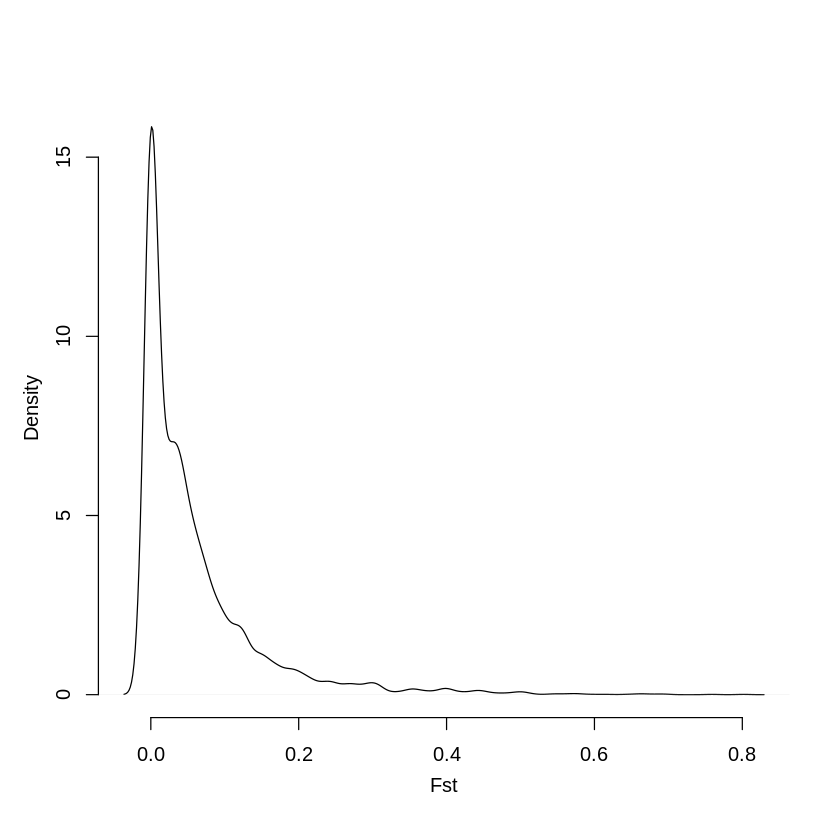

In [31]:
# Fst density
jitter=0
#jitter=rnorm(nrow(fst01),0,0.0)
f1=fst01$a/(fst01$b+1e-3)+jitter
plot(density(f1),ylim=c(0,16),xlab="Fst",main="",mgp=c(2.3,1,0),bty="n")

In [32]:
# computing weighted Fst per gene
i=1;gfst01=c();ns01=0
pb=txtProgressBar(0,nrow(genes))
for (i in 1:nrow(genes)) {
	setTxtProgressBar(pb,i)
	sub=subset(fst01,contig==genes$contig[i] & pos>=genes$start[i] & pos<=genes$end[i])
	if (is.null(sub[1,1]) | sum(sub$b)==0) { 
		gfst01=append(gfst01,NA)
	} else {
		gfst01=append(gfst01,sum(sub$a)/sum(sub$b))
		ns01=ns01+nrow(sub)
	}
}

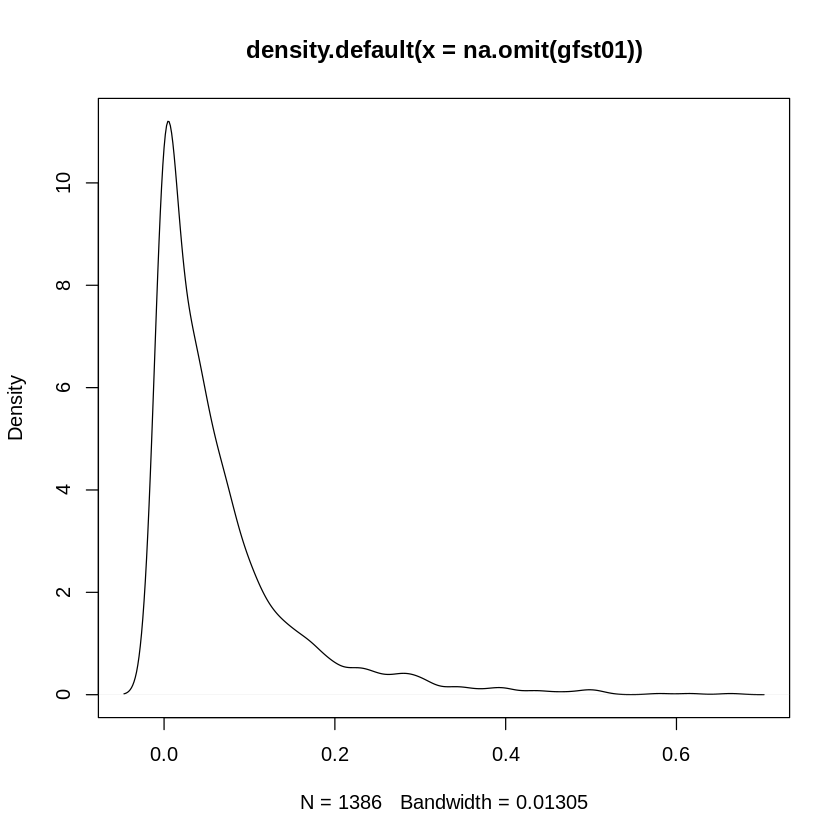

In [33]:
# density plots of per-gene Fst
plot(density(na.omit(gfst01)))

In [37]:
%expand
# adding results to genes table, saving
genes$fst01=gfst01
genes$start[which(genes$start < 1)] <- 1
id <- paste(genes$contig,genes$start,genes$end,sep="_")
genes <- cbind(id,genes)
head(genes[!is.na(genes$fst01),])
save(genes,file="{sfsSuf7}_PerGeneFst.RData")

,id,contig,start,end,fst01
12,Contig103346_4131_18776,Contig103346,4131,18776,0.069637883
25,Contig60108_1_13731,Contig60108,1,13731,0.121951220
35,Contig27784_1_12761,Contig27784,1,12761,0.041095890
42,Contig38648_3515_22246,Contig38648,3515,22246,0.047858942
120,Contig282_38634_45331,Contig282,38634,45331,0.001798561
121,Contig282_26273_42182,Contig282,26273,42182,0.001644737


In [38]:
%expand
# saving table of per-gene Fst for GO_MWU analysis
f01=genes[!is.na(genes$fst01),]
nrow(f01)
write.csv(f01,file="{sfsSuf7}_PerGeneFst.csv",quote=F,row.names=F)

[1] 1386

In [36]:
genes[which(genes$fst01>0.3),]

,contig,start,end,fst01
356,Contig29033,11407,32648,0.4417040
903,Contig77382,1559,12918,0.6633523
2116,Contig34298,13092,53017,0.3714286
3112,Contig1300,24883,44806,0.3311037
3148,Contig70496,1,7124,0.6157895
3263,Contig37670,5585,15651,0.3006897
4007,Contig20388,24341,35526,0.4967575
4072,Contig462,1,29569,0.3291480
4914,Contig107120,1,5247,0.5119048
5225,Contig84678,1,15123,0.3071298


In [ ]:
# original fstPerGene.R script, here for reference
# reading gene regions
genes=read.table("genes.txt")
names(genes)=c("contig","start","end","gene")

# adding gene annotations, in the same order as genes.txt (skip if you don't have such file):
gnames=read.table("gnames.txt",sep="\t")
names(gnames)=c("gene","protein")
genes=merge(genes,gnames,by="gene",all.x=T)
genes$protein=as.character(genes$protein)
genes$protein[is.na(genes$protein)]="unknown"
nrow(genes[genes$protein!="unknown",])

fst01=read.table("p01.fst")
names(fst01)=c("contig","pos","a","b")

fst01$contig=as.character(fst01$contig)
fst34$contig=as.character(fst34$contig)

# removing zero-only (invariant) bases
fst01[,3:4]=round(fst01[,3:4],3)
ch01=apply(fst01[,3:4],1,sum)
chh=(ch01>0)
table(chh)
 # FALSE   TRUE 
# 932541  41886 

fst01=fst01[chh,]
head(fst01)

# Fst density
jitter=0
#jitter=rnorm(nrow(fst01),0,0.0)
f1=fst01$a/(fst01$b+1e-3)+jitter
plot(density(f1),ylim=c(0,7),xlab="Fst",main="",mgp=c(2.3,1,0),bty="n")

# computing weighted Fst per gene
i=1;gfst01=c();ns01=0
pb=txtProgressBar(0,nrow(genes))
for (i in 1:nrow(genes)) {
	setTxtProgressBar(pb,i)
	sub=subset(fst01,contig==genes$contig[i] & pos>=genes$start[i] & pos<=genes$end[i])
	if (is.null(sub[1,1]) | sum(sub$b)==0) { 
		gfst01=append(gfst01,NA)
	} else {
		gfst01=append(gfst01,sum(sub$a)/sum(sub$b))
		ns01=ns01+nrow(sub)
	}
}

# density plots of per-gene Fst
plot(density(na.omit(gfst01)))

# adding results to genes table, saving
genes$fst01=gfst01
head(genes[genes$protein!="unknown",])
save(genes,file="PerGeneFst.RData")

# saving table of per-gene Fst for GO_MWU analysis
f01=genes[,c("gene","fst01")]
f01=na.omit(f01)
nrow(f01)
write.csv(f01,file="f01.csv",quote=F,row.names=F)



## Outlier using Bayescan

In [42]:
source("~/Downloads/BayeScan2.1/R functions/plot_R.r")

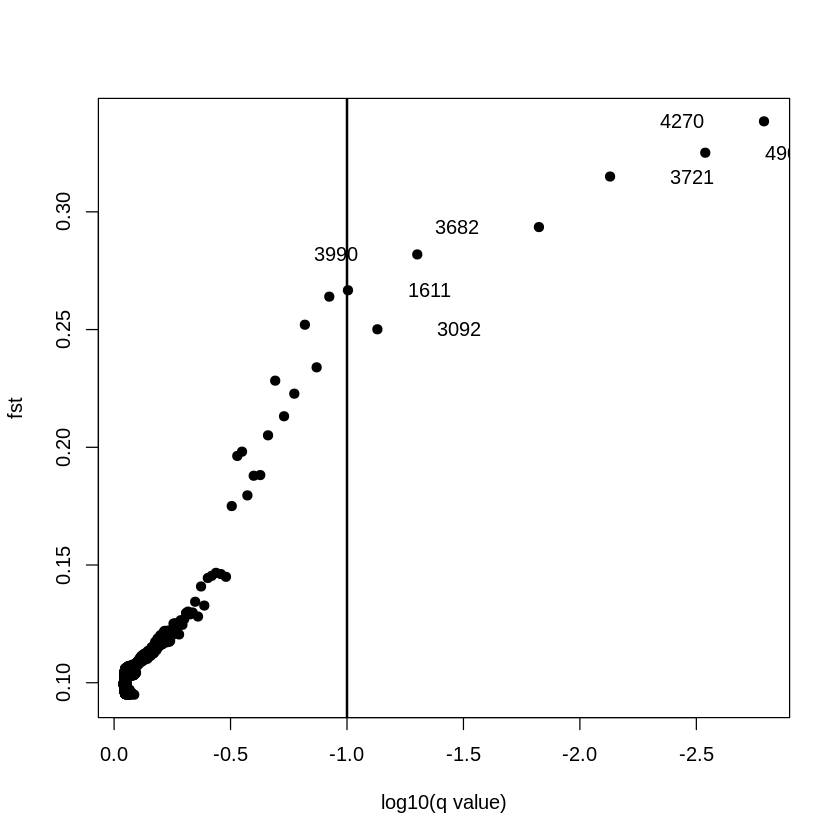

In [43]:
BS<- plot_bayescan("Outlier/HCSS_Afilt32m70_01_pp90_m75-BS-po10_fst.txt",FDR=0.1)

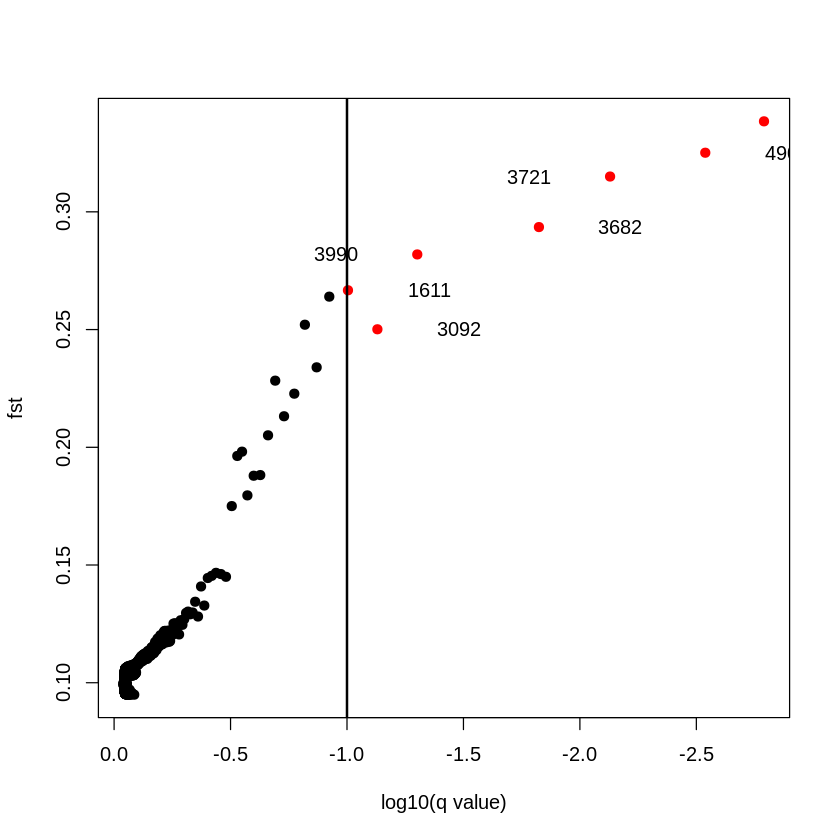

In [44]:
BS<- plot_bayescan("Outlier/HCSS_Afilt32m70_01_pp90_m75-BS-po10_fst.txt",FDR=0.1, highlight = BS$outliers)

In [45]:
BS$nb_outliers

[1] 7

In [41]:
../../../2bRAD_denovo/removeBayescanOutliers.pl bayescan=Outlier/HCSS_Afilt32m70_01_pp90_m75-BS-po10_fst.txt vcf=HCSS_Afilt32m70_01_pp90_m75.recode.vcf FDR=0.1 mode=extract > Outlier/HCSS_Afilt32m70_01_pp90_m75_BSouts.vcf

/scratch/t.cri.ksilliman/CommonG/2019_Mapping/ANGSD_run/HCSS
